In [1]:
%load_ext pycodestyle_magic
%flake8_on
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
"""Python code to classify X-ray sources by color.

Functionalities needed.

1. Line, step, scatter and histogram and kde plots
2. Plot net counts, bg/net and S/N ratio
3. Process detectors seperately and combine colors only optional
4. Cross-match 4XMM and CSC sources.
5. Compare with Haley et al. sources.
"""


import copy
import os
import glob2
import warnings
import xspec
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from astropy.io import fits
from astropy.stats import sigma_clipped_stats
from scipy.ndimage import median_filter


# Plot functions
def set_plotparams(plottype):
    """Set plot parameters."""
    if plottype == 'notebook':
        plt.rcParams["figure.figsize"] = (20, 15)
        plt.rcParams["axes.titlesize"] = 24
        plt.rcParams["axes.labelsize"] = 24
        plt.rcParams["lines.linewidth"] = 3
        plt.rcParams["lines.markersize"] = 10
        plt.rcParams["xtick.labelsize"] = 20
        plt.rcParams["ytick.labelsize"] = 20
        plt.rcParams["legend.fontsize"] = 20
        plt.rcParams['xtick.major.size'] = 16
        plt.rcParams['xtick.minor.size'] = 8
        plt.rcParams['ytick.major.size'] = 16
        plt.rcParams['ytick.minor.size'] = 8
        plt.rcParams['xtick.top'] = True
        plt.rcParams['ytick.right'] = True
        plt.rcParams['xtick.direction'] = 'inout'
        plt.rcParams['ytick.direction'] = 'inout'
    elif plottype == 'presentation':
        plt.rcParams["figure.figsize"] = (4, 3)
        plt.rcParams["axes.titlesize"] = 16
        plt.rcParams["axes.labelsize"] = 14
        plt.rcParams["lines.linewidth"] = 3
        plt.rcParams["lines.markersize"] = 5
        plt.rcParams["xtick.labelsize"] = 12
        plt.rcParams["ytick.labelsize"] = 12
        plt.rcParams["legend.fontsize"] = 12
        plt.rcParams['xtick.major.size'] = 8
        plt.rcParams['xtick.minor.size'] = 4
        plt.rcParams['ytick.major.size'] = 8
        plt.rcParams['ytick.minor.size'] = 4
        plt.rcParams['xtick.top'] = True
        plt.rcParams['ytick.right'] = True
        plt.rcParams['xtick.direction'] = 'inout'
        plt.rcParams['ytick.direction'] = 'inout'
    elif plottype == 'paper1':
        plt.rcParams["figure.figsize"] = (4, 3)
        plt.rcParams["axes.titlesize"] = 14
        plt.rcParams["axes.labelsize"] = 12
        plt.rcParams["lines.linewidth"] = 2
        plt.rcParams["lines.markersize"] = 2
        plt.rcParams["xtick.labelsize"] = 10
        plt.rcParams["ytick.labelsize"] = 10
        plt.rcParams["legend.fontsize"] = 10
        plt.rcParams['xtick.major.size'] = 6
        plt.rcParams['xtick.minor.size'] = 3
        plt.rcParams['ytick.major.size'] = 6
        plt.rcParams['ytick.minor.size'] = 3
        plt.rcParams['xtick.top'] = True
        plt.rcParams['ytick.right'] = True
        plt.rcParams['xtick.direction'] = 'in'
        plt.rcParams['ytick.direction'] = 'in'
    elif plottype == 'paper2':
        plt.rcParams["figure.figsize"] = (8, 6)
        plt.rcParams["axes.titlesize"] = 20
        plt.rcParams["axes.labelsize"] = 12
        plt.rcParams["lines.linewidth"] = 2
        plt.rcParams["lines.markersize"] = 2
        plt.rcParams["xtick.labelsize"] = 10
        plt.rcParams["ytick.labelsize"] = 10
        plt.rcParams["legend.fontsize"] = 10
        plt.rcParams['xtick.major.size'] = 6
        plt.rcParams['xtick.minor.size'] = 3
        plt.rcParams['ytick.major.size'] = 6
        plt.rcParams['ytick.minor.size'] = 3
        plt.rcParams['xtick.top'] = True
        plt.rcParams['ytick.right'] = True
        plt.rcParams['xtick.direction'] = 'in'
        plt.rcParams['ytick.direction'] = 'in'


def plotline_scatter(xdatas, ydatas, pl_types=None, axs=None, xlabel=None,
                     ylabel=None, pl_labels=None, styles=None, colors=None,
                     yscale='linear', title=None, ylim=None, figsize=None):
    """Plot line, step and scatter plots."""
    if pl_types is None:
        pl_types = ['line']*len(ydatas)
    if axs is None:
        fig, axs = plt.subplots(figsize=figsize)
    if pl_labels is None:
        pl_labels = [None]*len(ydatas)
    if styles is None:
        styles = ['-']*len(ydatas)
    if colors is None:
        if len(ydatas) <= 4:
            colors = ['#004488', '#ddaa33', '#bb5566', '#000000']
        elif len(ydatas) <= 9:
            colors = ['#000000', '#00287c', '#89003e', '#6e5700', '#008f75',
                      'b57de9', 'ff9468', '9cee81', '00d2ff']
        else:
            warnings.warn('Too many plot elements. Colors will be repeated.')
            colors = (['#000000', '#00287c', '#89003e', '#6e5700', '#008f75',
                      '#b57de9', '#ff9468', '#9cee81', '#00d2ff'] *
                      (int(len(ydatas/9)+1)))

    axs.set_title(title)
    if ylim is not None:
        axs.set_ylim(ylim[0], ylim[1])
    axs.set_xlabel(xlabel)
    axs.set_xscale('log')
    axs.set_yscale(yscale)
    axs.set_ylabel(ylabel)
    for i, pl_type in enumerate(pl_types):
        if pl_type == 'line':
            axs.plot(xdatas[i], ydatas[i], linestyle=styles[i],
                     label=pl_labels[i], color=colors[i])
        elif pl_type == 'scatter':
            if styles[i] == '-':
                styles[i] = 'o'
            axs.scatter(xdatas[i], ydatas[i], marker=styles[i],
                        label=pl_labels[i], color=colors[i])
        elif pl_type == 'step':
            ydatas[i] = np.append(ydatas[i], ydatas[i].copy()[-1])
            axs.step(xdatas[i], ydatas[i], where='post', linestyle=styles[i],
                     label=pl_labels[i], color=colors[i])
        else:
            raise ValueError("pl_type can only be 'line' or 'scatter'. Got " +
                             pl_type)
    axs.legend()
    return axs


def plothist(data_arr, data2=None, axs=None, bins=None, xlabel=None,
             ylabel=None, pl_labels=None, pl_type=None, cbar_label=None,
             colors=None):
    """Plot 1D and 2D histograms."""
    if axs is None:
        fig, axs = plt.subplots()
    if pl_type is None:
        pl_type = 'withoutkde'
    if pl_labels is None and isinstance(data_arr[0], (list, np.ndarray)):
        pl_labels = [None]*len(data_arr)
    if colors is None:
        if len(data_arr) <= 4:
            colors = ['#004488', '#ddaa33', '#bb5566', '#000000']
        elif len(data_arr) <= 9:
            colors = ['#000000', '#00287c', '#89003e', '#6e5700', '#008f75',
                      'b57de9', 'ff9468', '9cee81', '00d2ff']
        else:
            warnings.warn('Too many plot elements. Colors will be repeated.')
            colors = (['#000000', '#00287c', '#89003e', '#6e5700', '#008f75',
                      '#b57de9', '#ff9468', '#9cee81', '#00d2ff'] *
                      (int(len(data_arr/9)+1)))
    if colors is None and data2 is not None:
        colors = 'plasma_r'
    axs.set_xlabel(xlabel)
    if data2 is None:
        if pl_type == 'withkde':
            if ylabel is None:
                ylabel = 'Density per bin'
            axs.set_ylabel(ylabel)
            axs.hist(data_arr, bins=bins, density=True, label=pl_labels,
                     color=colors[:len(data_arr)])[:-1]
            if not isinstance(data_arr[0], (list, np.ndarray)):
                data_arr = [data_arr]
            for i, data in enumerate(data_arr):
                if pl_labels[i] is not None:
                    sns.kdeplot(x=data, label=pl_labels[i]+'_kde', ax=axs,
                                color=colors[i])
                else:
                    sns.kdeplot(x=data, ax=axs)
            axs.legend()
        else:
            if ylabel is None:
                ylabel = '# per bin'
            axs.set_ylabel(ylabel)
            axs.hist(data_arr, bins=bins, label=pl_labels,
                     color=colors[:len(data_arr)])[:-1]
            axs.legend()
    else:
        # 2D hist
        axs.set_ylabel(ylabel)
        if bins is None:
            bins = 10
        if pl_type == 'withkde':
            histplot = axs.hist2d(data_arr, data2, bins=bins, density=True,
                                  cmap=colors)[-1]
            sns.kdeplot(x=data_arr, y=data2, ax=axs)
            cbar = plt.colorbar(mappable=histplot, ax=axs, color='k')
            if cbar_label is None:
                cbar_label = 'Density per bin'
            cbar.set_label(cbar_label)
        else:
            histplot = axs.hist2d(data_arr, data2)[-1]
            cbar = plt.colorbar(mappable=histplot, ax=axs)
            if cbar_label is None:
                cbar_label = '# per bin'
            cbar.set_label(cbar_label)
    return axs


def plot_subplots(numrows, numcols, xdatas_arr, ydatas_arr, title=None,
                  subp_types_arr=None, pl_types_arr=None, xlabel_arr=None,
                  ylabel_arr=None, pl_labels_arr=None, styles_arr=None,
                  bins_arr=None, cbar_labels=None, yscale_arr=None,
                  ylim_arr=None, colors_arr=None):
    """Plot subplots"""
    if subp_types_arr is None:
        subp_types_arr = [['linescatter']*numcols]*numrows
    if pl_types_arr is None:
        pl_types_arr = [[None]*numcols]*numrows
    if pl_labels_arr is None:
        pl_labels_arr = [[None]*numcols]*numrows
    if xlabel_arr is None:
        xlabel_arr = [[None]*numcols]*numrows
    if ylabel_arr is None:
        ylabel_arr = [[None]*numcols]*numrows
    if styles_arr is None:
        styles_arr = [[None]*numcols]*numrows
    if bins_arr is None:
        bins_arr = [[None]*numcols]*numrows
    if cbar_labels is None:
        cbar_labels = [[None]*numcols]*numrows
    if yscale_arr is None:
        yscale_arr = [['linear']*numcols]*numrows
    if ylim_arr is None:
        ylim_arr = [[None]*numcols]*numrows
    if colors_arr is None:
        colors_arr = [[None]*numcols]*numrows

    # Checking if all the arrays are 2D
    if not isinstance(subp_types_arr[0], list):
        subp_types_arr = list(map(list, zip(*[subp_types_arr])))
    if not isinstance(pl_labels_arr[0], list):
        pl_labels_arr = list(map(list, zip(*[pl_labels_arr])))
    if not isinstance(xlabel_arr[0], list):
        xlabel_arr = list(map(list, zip(*[xlabel_arr])))
    if not isinstance(ylabel_arr[0], list):
        ylabel_arr = list(map(list, zip(*[ylabel_arr])))

    # Calling the figure and axes
    fig, axes = plt.subplots(numrows, numcols)
    fig.suptitle(title)
    axes = axes.reshape(numrows, numcols)
    plt.rcParams["legend.fontsize"] = (
        float(plt.rcParams["legend.fontsize"]) - 4*(numcols-1))
    print(plt.rcParams["legend.fontsize"])
    if numrows == 1 and numcols == 1:
        initial_figsize = plt.rcParams["figure.figsize"]
        plt.rcParams["figure.figsize"] = (12, 9)

    for i in range(numrows):
        for j in range(numcols):
            if subp_types_arr[i][j] == 'linescatter':
                plotline_scatter(
                    xdatas_arr[i][j], ydatas_arr[i][j], pl_types_arr[i][j],
                    axs=axes[i][j], xlabel=xlabel_arr[i][j],
                    ylabel=ylabel_arr[i][j], pl_labels=pl_labels_arr[i][j],
                    styles=styles_arr[i][j], yscale=yscale_arr[i][j],
                    ylim=ylim_arr[i][j], colors=colors_arr[i][j])
            elif subp_types_arr[i][j] == 'hist':
                plothist(xdatas_arr[i][j], ydatas_arr[i][j], axs=axes[i][j],
                         bins=bins_arr[i][j], xlabel=xlabel_arr[i][j],
                         ylabel=ylabel_arr[i][j],
                         pl_labels=pl_labels_arr[i][j],
                         pl_type=pl_types_arr[i][j],
                         cbar_label=cbar_labels[i][j], colors=colors_arr[i][j])
            else:
                print('subplot type can be linescatter or hist')
    plt.tight_layout()
    plt.rcParams["legend.fontsize"] = (
        float(plt.rcParams["legend.fontsize"]) + 4*(numcols-1))
    if numrows == 1 and numcols == 1:
        plt.rcParams["figure.figsize"] = initial_figsize
    return fig, axes


def filter_specs(net_counts, bg_counts, min_netcounts=None, maxbg_ratio=None,
                 det_mask=None):
    """Filter specs."""
    bgratio = bg_counts/net_counts
    filter_mask = det_mask.copy()
    if det_mask is None:
        det_mask = np.ones(len(net_counts), dtype=bool)
    if min_netcounts is not None:
        filter_mask[net_counts < min_netcounts] = False
    if maxbg_ratio is not None:
        filter_mask[bgratio > maxbg_ratio] = False
    return filter_mask


def load_sim_xmmspec(folder, background=False, numsim=10000, basename=None):
    """Load simulated XMM MOS and PN spectra."""
    if basename is None:
        basename = ''
    pn_specs = np.zeros((numsim, 4096), dtype=np.float64)
    pn_bgspecs = np.zeros((numsim, 4096), dtype=np.float64)
    mos_specs = np.zeros((numsim, 2400), dtype=np.float64)
    mos_bgspecs = np.zeros((numsim, 2400), dtype=np.float64)
    pn_mask = np.zeros(numsim, dtype=bool)
    mos_mask = np.zeros(numsim, dtype=bool)
    for i in range(numsim):
        pnfile = folder + basename + str(i) + '_PN.fak'
        mosfile = folder + basename + str(i) + '_MOS.fak'
        if os.path.isfile(pnfile):
            pn_mask[i] = True
            spec_data = fits.open(pnfile)
            pn_specs[i] = spec_data[1].data['counts']
            if background:
                bgfile = pnfile[:-4] + '_bkg.fak'
                bgspec_data = fits.open(bgfile)
                pn_bgspecs[i] = bgspec_data[1].data['counts']*(
                    spec_data[1].header['backscal'] /
                    bgspec_data[1].header['backscal'])
        if os.path.isfile(mosfile):
            mos_mask[i] = True
            spec_data = fits.open(mosfile)
            mos_specs[i] = spec_data[1].data['counts']
            if background:
                bgfile = mosfile[:-4] + '_bkg.fak'
                bgspec_data = fits.open(bgfile)
                mos_bgspecs[i] = bgspec_data[1].data['counts']*(
                    spec_data[1].header['backscal'] /
                    bgspec_data[1].header['backscal'])
    return ([pn_mask, mos_mask], [pn_specs, mos_specs],
            [pn_bgspecs, mos_bgspecs])


def load_xmmspec_observed(folder, background=False):
    """Load Observed XMM spec."""
    pn_specfiles = glob2.glob(folder + '*PN_combined_src_grp.ds')
    print('# PN files init:', len(pn_specfiles))
    mos_specfiles = glob2.glob(folder + '*MOS_combined_src_grp.ds')
    print('# PN files init:', len(pn_specfiles))
    num_combined = len(glob2.glob(folder + '*PN_MOS_combined_src.png'))
    num_sources = len(pn_specfiles) + len(mos_specfiles) - num_combined
    pn_specs = np.zeros((num_sources, 4096), dtype=float)
    pn_mask = np.zeros(num_sources, dtype=bool)
    mos_specs = np.zeros((num_sources, 2400), dtype=float)
    mos_mask = np.zeros(num_sources, dtype=bool)
    pn_bgspecs = np.zeros((num_sources, 4096), dtype=float)
    mos_bgspecs = np.zeros((num_sources, 2400), dtype=float)
    source_nums = np.zeros(num_sources, dtype=object)
    for i in range(num_sources):
        if i < len(pn_specfiles):
            pn_mask[i] = True
            source_nums[i] = pn_specfiles[i].split('/')[-1].split('_')[0]
            spec_data = fits.open(pn_specfiles[i])
            pn_specs[i] = spec_data[1].data['counts']
            if background:
                bgfile = pn_specfiles[i][:-10] + 'bkg_grp.ds'
                bg_data = fits.open(bgfile)
                pn_bgspecs[i] = bg_data[1].data['counts']*(
                    spec_data[1].header['backscal'] /
                    bg_data[1].header['backscal'])
            if os.path.isfile(folder + source_nums[i] +
                              '_MOS_combined_src_grp.ds'):
                mosfile = folder + source_nums[i] + '_MOS_combined_src_grp.ds'
                spec_data = fits.open(mosfile)
                mos_mask[i] = True
                mos_specfiles.remove(mosfile)
                mos_specs[i] = spec_data[1].data['counts']
                if background:
                    bgfile = mosfile[:-10] + 'bkg_grp.ds'
                    bg_data = fits.open(bgfile)
                    mos_bgspecs[i] = bg_data[1].data['counts']*(
                        spec_data[1].header['backscal'] /
                        bg_data[1].header['backscal'])
        else:
            mos_mask[i] = True
            source_nums[i] = (
                mos_specfiles[i-len(pn_bgspecs)].split('/')[-1].split('_')[0])
            spec_data = fits.open(mos_specfiles[i-len(pn_bgspecs)])
            mos_specs[i] = spec_data[1].data['counts']
            if background:
                bgfile = mosfile[:-10] + 'bkg_grp.ds'
                bg_data = fits.open(bgfile)
                mos_bgspecs[i] = bg_data[1].data['counts']*(
                    spec_data[1].header['backscal'] /
                    bg_data[1].header['backscal'])
    return (source_nums, [pn_mask, pn_specs, pn_bgspecs],
            [mos_mask, mos_specs, mos_bgspecs])


def load_chandraspec_sim(folder, background=False, num_sim=10000,
                         basename=None):
    """Load Chandra simulate spectra."""
    if basename is None:
        basename = ''
    specs = np.zeros((num_sim, 1024), dtype=float)
    bg_specs = np.zeros((num_sim, 1024), dtype=float)
    for i in range(num_sim):
        spec_file = folder + basename + str(i) + '.fak'
        spec_data = fits.open(spec_file)
        specs[i] = spec_data[1].data['counts']
        if background:
            bgspec_file = folder + basename + str(i) + '_bkg.fak'
            bg_data = fits.open(bgspec_file)
            bg_specs[i] = bg_data[1].data['counts'] * (
                spec_data[1].header['backscal']/bg_data[1].header['backscal'])
    return specs, bg_specs


def load_chandraspec_obs(folder, background=True):
    spec_files = glob2.glob(folder + '/*/*_combined_src.pi')
    spec_names = np.zeros(len(spec_files), dtype=object)
    specs = np.zeros((len(spec_files), 1024), dtype=float)
    bgspecs = np.zeros((len(spec_files), 1024), dtype=float)
    for i, spec_file in enumerate(spec_files):
        spec_file_base = os.path.basename(spec_file)
        spec_names[i] = spec_file_base.split('_')[0]
        spec_data = fits.open(spec_file)
        specs[i] = spec_data[1].data['counts']
        if background:
            bg_file = spec_file[:-6] + 'bkg.pi'
            bg_data = fits.open(bg_file)
            bgspecs[i] = bg_data[1].data['counts'] * (
                spec_data[1].header['backscal']/bg_data[1].header['backscal'])
    return spec_names, specs, bgspecs


def get_counts_enrange(spec, en_range, ebin_channels, floor_counts=None):
    """Get counts in the given energy range."""
    elow_index = np.where(ebin_channels >= en_range[0])[0][0]
    ehigh_index = np.where(ebin_channels <= en_range[1])[0][-1]
    if len(spec.shape) == 1:
        counts_enrange = np.sum(spec[elow_index:ehigh_index])
    else:
        counts_enrange = np.sum(spec[:, elow_index:ehigh_index], axis=1)
    if floor_counts is not None:
        if len(spec.shape) == 1:
            if counts_enrange < floor_counts:
                counts_enrange = floor_counts
        else:
            counts_enrange[counts_enrange < floor_counts] = floor_counts
    return counts_enrange, elow_index, ehigh_index


def get_counts_enrange2(spec, en_range, ebin_channels, floor_counts=None):
    """Another method to get counts"""
    en_mask = np.logical_and(ebin_channels >= en_range[0],
                             ebin_channels <= en_range[1])
    elow_index = np.where(en_mask)[0][0]
    ehigh_index = np.where(en_mask)[0][-1]
    if len(spec.shape) == 1:
        counts_enrange = np.sum(spec[en_mask])
    else:
        counts_enrange = np.sum(spec[:, en_mask], axis=1)
    if floor_counts is not None:
        if len(spec.shape) == 1:
            if counts_enrange < floor_counts:
                floor_counts = 0
        else:
            counts_enrange[counts_enrange < floor_counts] = 0
    return counts_enrange, elow_index, ehigh_index


def get_summary_det(src_spec, bg_spec, ebins, en_range=None,
                    det_mask=None, src_sig=None):
    """Get summary of the spectra for given detector."""
    if en_range is None:
        en_range = [0.2, 10.0]
    net_spec = src_spec - bg_spec
    net_counts, en_lowindex, en_highindex = get_counts_enrange(
        net_spec, en_range, ebins)
    if det_mask is None:
        det_mask = np.ones(len(src_spec), dtype=bool)
    det_mask[net_counts < 1] = False
    net_spec = net_spec[:, en_lowindex:en_highindex]
    bg_counts = get_counts_enrange(bg_spec, en_range, ebins)[0]
    norm_spec = (net_spec.transpose()/net_counts).transpose()
    bg_counts[bg_counts/net_counts < 1.0E-6] = 1.0E-6
    if src_sig is not None:
        det_mask[net_counts < src_sig*bg_counts**0.5] = False
    return (norm_spec, net_counts, bg_counts, det_mask, en_lowindex,
            en_highindex)


def join_lists_3d(list1_2d, list2_2d, list3_2d=None):
    """Join 2 lists along another dimention."""
    joined_list = []
    for i, row in enumerate(list1_2d):
        if list3_2d is None:
            joined_list.append([row, list2_2d[i]])
        else:
            joined_list.append([row, list2_2d[i], list3_2d[i]])
    return joined_list


def join_string_lists(list1_1d, list2_1d):
    """Outer product like addition of 2 strings"""
    joined_list = []
    join_list_row = None
    for string2 in list2_1d:
        for string1 in list1_1d:
            if join_list_row is None:
                join_list_row = [string1 + ' [' + string2 + ']']
            else:
                join_list_row.append(string1 + ' [' + string2 + ']')
        joined_list.append(copy.copy(join_list_row))
        join_list_row = None
    return joined_list


def plot_spec_summary(sim_src_spec_arr, sim_bg_spec_arr, obs_src_spec_arr,
                      obs_bg_spec_arr, ebins_arr, det_names=None, e_range=None,
                      plot=True, det_mask_sim_arr=None, det_mask_obs_arr=None):
    """Plot spec summary.

    1. Mean normalized spectra (also add error fn.)
    2. Net count, Net count/Bg counts, signal-to-noise ratio plots for
       each det.
    """
    norm_specs = []
    netcounts = []
    bgcounts = []
    ebins_lowhigh_indices = []
    if plot:
        ebins_refined = []
        norm_specs_forplot = []
        netcounts_forplot = []
        bg_net_ratio_forplot = []
        s_to_n_ratio_forplot = []
    if det_mask_sim_arr is None:
        det_mask_sim_arr = [None]*len(sim_src_spec_arr)
    if det_mask_obs_arr is None:
        det_mask_obs_arr = [None]*len(obs_src_spec_arr)
    if det_names is None:
        det_names = ['']*len(sim_src_spec_arr)

    for i, sim_src_specs in enumerate(sim_src_spec_arr):
        (sim_norm_spec, sim_netcounts, sim_bgcounts, sim_detmask,
         en_lowindex, en_highindex) = get_summary_det(
            sim_src_specs, sim_bg_spec_arr[i], ebins_arr[i], e_range,
            copy.copy(det_mask_sim_arr[i]), 3.0)
        (obs_norm_spec, obs_netcounts, obs_bgcounts,
         obs_detmask) = get_summary_det(
            obs_src_spec_arr[i], obs_bg_spec_arr[i], ebins_arr[i], e_range,
            copy.copy(det_mask_obs_arr[i]), 3.0)[:4]
        norm_specs.append([sim_norm_spec, obs_norm_spec])
        netcounts.append([sim_netcounts, obs_netcounts])
        bgcounts.append([sim_bgcounts, obs_bgcounts])
        ebins_lowhigh_indices.append([en_lowindex, en_highindex])
        det_mask_sim_arr[i] = sim_detmask
        det_mask_obs_arr[i] = obs_detmask
        if plot:
            ebins_refined.append(ebins_arr[i][en_lowindex:en_highindex])
            filter_size = int(0.2/(ebins_arr[i][en_lowindex+1] -
                                   ebins_arr[i][en_lowindex]))
            norm_specs_forplot.append([
                median_filter(np.mean(sim_norm_spec[sim_detmask], axis=0),
                              size=filter_size),
                median_filter(np.mean(obs_norm_spec[obs_detmask], axis=0),
                              size=filter_size)])
            netcounts_forplot.append([np.log10(sim_netcounts[sim_detmask]),
                                      np.log10(obs_netcounts[obs_detmask])])
            bg_net_ratio_forplot.append([
                np.log10((sim_bgcounts/sim_netcounts)[sim_detmask]),
                np.log10((obs_bgcounts/obs_netcounts)[obs_detmask])])
            s_to_n_ratio_forplot.append([
                np.log10((sim_netcounts /
                         (sim_netcounts+sim_bgcounts)**0.5)[sim_detmask]),
                np.log10((obs_netcounts /
                         (obs_netcounts+obs_bgcounts)**0.5)[obs_detmask])]
            )

    if plot is False:
        return (norm_specs, netcounts, bgcounts, ebins_lowhigh_indices,
                det_mask_sim_arr, det_mask_obs_arr)

    for i, norm_spec_sim_obs in enumerate(norm_specs_forplot):
        plotline_scatter([ebins_refined[i], ebins_refined[i]],
                         norm_spec_sim_obs, xlabel='Energy (keV)',
                         ylabel='Smoothed mean normalized spectra',
                         pl_labels=['Sim. ' + det_names[i] + ' spectra',
                                    'Obs. ' + det_names[i] + ' spectra'],
                         title=('Simulated and Observed ' + det_names[i] +
                                ' spectra'),
                         figsize=(12, 9))

    hist1D_joined_list = join_lists_3d(netcounts_forplot,
                                       bg_net_ratio_forplot,
                                       s_to_n_ratio_forplot)
    plot_subplots(
        len(norm_specs_forplot), 3, hist1D_joined_list,
        [[None]*3]*len(norm_specs_forplot),
        title='1D histograms of net and background counts',
        xlabel_arr=join_string_lists(
            ['log (Net counts)', 'log (Bg counts/Net counts)',
             'Signal-to-Noise Ratio'], det_names),
        ylabel_arr=[['# density per bin']*3]*len(norm_specs_forplot),
        subp_types_arr=[['hist']*3]*3,
        pl_types_arr=[['withkde']*3]*3,
        pl_labels_arr=[
            [['Simulated MSPs', 'Observed sources']]*3]*len(norm_specs_forplot)
    )

    return (norm_specs, netcounts, bgcounts, ebins_lowhigh_indices,
            det_mask_sim_arr, det_mask_obs_arr)


def get_enbins_centres(resp_file):
    """Get Energy bins and centres."""
    response = fits.open(resp_file)
    energy_bins = response[2].data
    emin = energy_bins['E_MIN']
    emax = energy_bins['E_MAX']
    e_centres = 0.5*(emin + emax)
    return np.append(emin, emax[-1]), e_centres


def get_line_cont_counts(src_spec, bg_spec, ebins, net_spec=None,
                         range_fe=None, cont1_range=None, cont2_range=None):
    """Get line and continuum counts"""
    if net_spec is None:
        net_spec = src_spec - bg_spec
    if range_fe is None:
        range_fe = [6.2, 7.2]
    if cont1_range is None:
        cont1_range = [5.8, 6.2]
    if cont2_range is None:
        cont2_range = [7.2, 7.6]
    sim_fe_net = get_counts_enrange(net_spec, range_fe, ebins,
                                    floor_counts=0)[0]
    sim_fe_src = get_counts_enrange(src_spec, range_fe, ebins,
                                    floor_counts=0)[0]
    sim_fe_bg = get_counts_enrange(bg_spec, range_fe, ebins,
                                   floor_counts=0)[0]

    sim_cont1_net = get_counts_enrange(net_spec, cont1_range, ebins,
                                       floor_counts=0)[0]
    sim_cont1_src = get_counts_enrange(src_spec, cont1_range, ebins,
                                       floor_counts=0)[0]
    sim_cont1_bg = get_counts_enrange(bg_spec, cont1_range, ebins,
                                      floor_counts=0)[0]

    sim_cont2_net = get_counts_enrange(net_spec, cont2_range, ebins,
                                       floor_counts=0)[0]
    sim_cont2_src = get_counts_enrange(src_spec, cont2_range, ebins,
                                       floor_counts=0)[0]
    sim_cont2_bg = get_counts_enrange(bg_spec, cont2_range, ebins,
                                      floor_counts=0)[0]
    return ([sim_fe_net, sim_fe_src, sim_fe_bg],
            [sim_cont1_net, sim_cont1_src, sim_cont1_bg],
            [sim_cont2_net, sim_cont2_src, sim_cont2_bg])


def get_colors_basic(counts_line_net, counts_cont1_net, counts_cont2_net,
                     mask=None):
    """Get colors."""
    if mask is None:
        mask = np.ones(len(counts_line_net), dtype=bool)
    colors = counts_line_net/(counts_cont1_net + counts_cont2_net)
    colors[~mask] = np.nan
    return colors


def get_colors_binned(colors, src_prop, srcprop_bins, mask=None):
    """Get expected color for given bins."""
    mean_colors = np.zeros(len(srcprop_bins)-1)
    median_colors = np.zeros(len(srcprop_bins)-1)
    colors_std = np.zeros(len(srcprop_bins)-1)
    for i, bin_edge in enumerate(srcprop_bins[:-1]):
        mean_colors[i], median_colors[i], colors_std[i] = get_colors_perbin(
            colors, src_prop, [bin_edge, srcprop_bins[i+1]])
    return mean_colors, colors_std, median_colors


def get_colors_perbin(colors, src_prop, bin_edges):
    """Get expected color for each bin"""
    mask = np.where(np.logical_and(np.logical_and(src_prop >= bin_edges[0],
                                                  src_prop < bin_edges[1]),
                                   np.isfinite(colors)))
    bin_colors = colors[mask]
    # return np.mean(bin_colors), np.median(bin_colors), np.std(bin_colors)
    return sigma_clipped_stats(bin_colors, sigma=5)


def bin_colors_withprop(colors, prop_list, prop_listnames, obs_colors,
                        obs_props, prop_binslist=None, plot=True, plot_det=''):
    """Bin colors with properties."""
    mean_colors_withprop = []
    median_colors_withprop = []
    std_colors_withprop = []
    if prop_binslist is None:
        prop_binslist = []
        no_given_bins = True
    else:
        no_given_bins = False
    for i in range(len(prop_list)):
        print('Calaculating mean and standard deviation in colors vs. ' +
              prop_listnames[i])
        if no_given_bins:
            prop_bins = 10**np.linspace(
                np.log10(max(0.00001, np.min(prop_list[i]))),
                np.log10(min(1.0E+5, np.max(prop_list[i]))), 21)
            prop_binslist.append(prop_bins)
        mean_colors, colors_std, median_colors = get_colors_binned(
            colors, prop_list[i], prop_binslist[i])
        mean_colors_withprop.append(mean_colors)
        std_colors_withprop.append(colors_std)
        median_colors_withprop.append(median_colors)
        if plot:
            plot_subplots(
                1, 2, [[[prop_list[i], get_bincenters(prop_binslist[i]),
                        get_bincenters(prop_binslist[i])],
                       [obs_props[i], get_bincenters(prop_binslist[i]),
                        get_bincenters(prop_binslist[i])]]],
                [[[colors, mean_colors + 2*colors_std,
                  mean_colors - 2*colors_std],
                 [obs_colors, mean_colors + 2*colors_std,
                  mean_colors - 2*colors_std]]],
                subp_types_arr=[['linescatter', 'linescatter']],
                pl_types_arr=[[['scatter', 'step', 'step'],
                              ['scatter', 'step', 'step']]],
                xlabel_arr=[[prop_listnames[i], prop_listnames[i]]],
                ylabel_arr=[['Simulated source colors',
                            'Observed source colors']],
                pl_labels_arr=[[['Colors', 'Mean + 2.0std', 'Mean - 2.0std'],
                                ['Colors', 'Mean + 2.0std', 'Mean - 2.0std']]],
                title='Color vs ' + prop_listnames[i] + ' for ' + plot_det,
                ylim_arr=[[(0, 5), (0, 5)], [(0, 5), (0, 5)]])
    return (prop_binslist, mean_colors_withprop, std_colors_withprop,
            median_colors_withprop)


def load_alldata(response_paths, sim_spec_paths, obs_spec_paths, range_fe=None,
                 range_cont1=None, range_cont2=None, en_range=None):
    """Main function to process the entire dataset."""
    det_enbins_arr = []
    det_ecenters_arr = []
    sim_srcspec_arr = []
    sim_bgspec_arr = []
    sim_mask_arr = []
    obs_srcspec_arr = []
    obs_bgspec_arr = []
    obs_mask_arr = []
    obs_src_nums = []
    det_names = ['PN', 'MOS', 'ACIS']
    if range_fe is None:
        range_fe = [6.2, 7.2]
    if range_cont1 is None:
        range_fe = [5.8, 6.2]
    if range_cont2 is None:
        range_fe = [7.2, 7.6]
    if en_range is None:
        en_range = [2, 10]
    for i, response in enumerate(response_paths):
        # Load energy bins
        det_ebins, det_ecenters = get_enbins_centres(response)
        det_enbins_arr.append(det_ebins)
        det_ecenters_arr.append(det_ecenters)
        # Load spectra
        if i == 0:
            ([sim1_mask, sim2_mask], [sim1_specs, sim2_specs],
             [sim1_bgs, sim2_bgs]) = load_sim_xmmspec(
                sim_spec_paths[i], background=True, basename='msp_highNH_')
            ([obs1_mask, obs2_mask], [obs1_specs, obs2_specs],
             [obs1_bgs, obs2_bgs]) = load_sim_xmmspec(
                obs_spec_paths[i], background=True, basename='ip_')
            source_nums = np.arange(len(obs1_mask))
            #(source_nums, [obs1_mask, obs1_specs, obs1_bgs],
            # [obs2_mask, obs2_specs, obs2_bgs]) = load_xmmspec_observed(
            #    obs_spec_paths[i], background=True)
            sim_srcspec_arr.append(sim1_specs)
            sim_srcspec_arr.append(sim2_specs)
            sim_bgspec_arr.append(sim1_bgs)
            sim_bgspec_arr.append(sim2_bgs)
            sim_mask_arr.append(sim1_mask)
            sim_mask_arr.append(sim2_mask)
            obs_srcspec_arr.append(obs1_specs)
            obs_srcspec_arr.append(obs2_specs)
            obs_bgspec_arr.append(obs1_bgs)
            obs_bgspec_arr.append(obs2_bgs)
            obs_mask_arr.append(obs1_mask)
            obs_mask_arr.append(obs2_mask)
            obs_src_nums.append(source_nums)
        elif i == 2:
            sim_specs, sim_bgs = load_chandraspec_sim(
                sim_spec_paths[i], background=True, num_sim=10000,
                basename='msp_highNH_')
            obs_specs, obs_bgs = load_chandraspec_sim(
                obs_spec_paths[i], background=True, num_sim=10000,
                basename='ip_')
            src_names = np.arange(len(obs_specs))
            #src_names, obs_specs, obs_bgs = load_chandraspec_obs(
            #    obs_spec_paths[i])
            sim_mask = np.ones(len(sim_specs), dtype=bool)
            obs_mask = np.ones(len(obs_specs), dtype=bool)
            sim_srcspec_arr.append(sim_specs)
            sim_bgspec_arr.append(sim_bgs)
            sim_mask_arr.append(sim_mask)
            obs_srcspec_arr.append(obs_specs)
            obs_bgspec_arr.append(obs_bgs)
            obs_mask_arr.append(obs_mask)
            obs_src_nums.append(src_names)
        else:
            pass
    # Plot spec summary
    (norm_specs, netcounts, bgcounts, ebins_lowhigh_indices, det_mask_sim,
     det_mask_obs) = plot_spec_summary(
        sim_srcspec_arr, sim_bgspec_arr, obs_srcspec_arr, obs_bgspec_arr,
        det_enbins_arr, det_names, en_range, True, sim_mask_arr, obs_mask_arr)
    spec_summary = {'ebins': [det_enbins_arr, det_ecenters_arr],
                    'elowhigh': ebins_lowhigh_indices,
                    'specs': [sim_srcspec_arr, sim_bgspec_arr, obs_srcspec_arr,
                              obs_bgspec_arr],
                    'spec_masks': [det_mask_sim, det_mask_obs],
                    'src_nums': obs_src_nums,
                    'norm_specs': norm_specs,
                    'counts': [netcounts, bgcounts]}
    return spec_summary


def getcolor_prop_singledet(det_ebins, det_srcspecs, det_bgspecs,
                            det_netcounts, det_bgcounts, det_obs_srcspecs,
                            det_obs_bgspecs, det_obsnetcounts, det_obsbgcounts,
                            range_fe=None, netcounts_lowhigh=None,
                            bgratio_lowhigh=None, snr_lowhigh=None,
                            det_name=None, plot=False):
    """Process single detector.

    Values may include nan. Will have to be masked later for plotting. Else
    submit already masked values
    """
    print(len(det_srcspecs), len(det_bgspecs), len(det_bgcounts), len(det_netcounts))
    print(len(det_obs_srcspecs), len(det_obs_bgspecs), len(det_obsbgcounts), len(det_obsnetcounts))
    bg_net_ratio = det_bgcounts/det_netcounts
    obs_bgnet_ratio = det_obsbgcounts/det_obsnetcounts
    sim_snr = det_netcounts/(det_netcounts + det_bgcounts)**0.5
    obs_snr = det_obsnetcounts/(det_obsnetcounts + det_obsbgcounts)**0.5
    ([fe_net, fe_src, fe_bg], [cont1_net, cont1_src, cont1_bg],
     [cont2_net, cont2_src, cont2_bg]) = get_line_cont_counts(
        det_srcspecs, det_bgspecs, det_ebins, range_fe=range_fe)
    ([obs_fe_net, obs_fe_src, obs_fe_bg],
     [obs_cont1_net, obs_cont1_src, obs_cont1_bg],
     [obs_cont2_net, obs_cont2_src, obs_cont2_bg]) = get_line_cont_counts(
        det_obs_srcspecs, det_obs_bgspecs, det_ebins, range_fe=range_fe)
    det_colors = get_colors_basic(fe_net, cont1_net, cont2_net)
    obs_det_colors = get_colors_basic(obs_fe_net, obs_cont1_net, obs_cont2_net)
    if netcounts_lowhigh is None:
        netcount_bins = 10**(np.linspace(1, 5, 21))
    else:
        netcount_bins = 10**(np.linspace(np.log10(netcounts_lowhigh[0]),
                                         np.log10(netcounts_lowhigh[1]), 21))
    if bgratio_lowhigh is None:
        bg_net_ratio_bins = 10**(np.linspace(-2, 1, 21))
    else:
        bg_net_ratio_bins = 10**(np.linspace(np.log10(bgratio_lowhigh[0]),
                                             np.log10(bgratio_lowhigh[1]), 21))
    if snr_lowhigh is None:
        snr_bins = 10**(np.linspace(0, 3, 21))
    else:
        snr_bins = 10**(np.linspace(np.log10(snr_lowhigh[0]),
                                    np.log10(snr_lowhigh[1]), 21))
    (mean_colors_withprop, std_colors_withprop,
     median_colors_withprop) = bin_colors_withprop(
        det_colors, [det_netcounts, bg_net_ratio, sim_snr],
        ['Net counts', 'Bg/net ratio', 'Signal-to-Noise Ratio'],
        obs_det_colors, [det_obsnetcounts, obs_bgnet_ratio, obs_snr],
        [netcount_bins, bg_net_ratio_bins, snr_bins], plot=plot,
        plot_det=det_name)[1:]
    sim_colors_dict = {'prop_list': [det_netcounts, bg_net_ratio, sim_snr],
                       'prop_bins': [netcount_bins, bg_net_ratio_bins,
                                     snr_bins],
                       'fe_cont_counts': [fe_net, cont1_net, cont2_net],
                       'fe_cont_bgcounts': [fe_bg, cont1_bg, cont2_bg],
                       'colors': det_colors,
                       'color_stat': [mean_colors_withprop,
                                      median_colors_withprop,
                                      std_colors_withprop]}
    obs_colors_dict = {'prop_list': [det_obsnetcounts, obs_bgnet_ratio,
                                     obs_snr],
                       'fe_cont_counts': [obs_fe_net, obs_cont1_net,
                                          obs_cont2_net],
                       'fe_cont_bgcounts': [obs_fe_bg, obs_cont1_bg,
                                            obs_cont2_bg],
                       'colors': obs_det_colors}
    return sim_colors_dict, obs_colors_dict


def get_bincenters(bins):
    """Get center of bins."""
    return bins


def getcolor_prop_alldet(spec_summary, compare_det=False):
    """Get colors in all detectors and plot relevant figure."""
    ebins_arr = spec_summary['ebins'][0]
    specs = spec_summary['specs']
    spec_masks = spec_summary['spec_masks']
    counts = spec_summary['counts']
    det_names = ['PN', 'MOS', 'ACIS']
    sim_colors_dict_arr = []
    obs_colors_dict_arr = []
    prop_names = ['Net counts', 'Bg/net ratio', 'Signal-to-Noise Ratio']
    plot_det = not compare_det
    for i, ebins in enumerate(ebins_arr):
        sim_colors_dict, obs_colors_dict = getcolor_prop_singledet(
            ebins, specs[0][i][spec_masks[0][i]],
            specs[1][i][spec_masks[0][i]], counts[0][i][0][spec_masks[0][i]],
            counts[1][i][0][spec_masks[0][i]], specs[2][i][spec_masks[1][i]],
            specs[3][i][spec_masks[1][i]], counts[0][i][1][spec_masks[1][i]],
            counts[1][i][1][spec_masks[1][i]], det_name=det_names[i],
            plot=plot_det)
        sim_colors_dict_arr.append(sim_colors_dict)
        obs_colors_dict_arr.append(obs_colors_dict)
    if compare_det:
        for i in range(3):
            plot_subplots(
                3, 2,
                [[[
                    sim_colors_dict_arr[0]['prop_list'][i],
                    get_bincenters(sim_colors_dict_arr[0]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[0]['prop_bins'][i])], [
                    obs_colors_dict_arr[0]['prop_list'][i],
                    get_bincenters(sim_colors_dict_arr[0]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[0]['prop_bins'][i])]],
                 [[
                    sim_colors_dict_arr[1]['prop_list'][i],
                    get_bincenters(sim_colors_dict_arr[1]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[1]['prop_bins'][i])], [
                    obs_colors_dict_arr[1]['prop_list'][i],
                    get_bincenters(sim_colors_dict_arr[1]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[1]['prop_bins'][i])]],
                 [[
                    sim_colors_dict_arr[2]['prop_list'][i],
                    get_bincenters(sim_colors_dict_arr[2]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[2]['prop_bins'][i])], [
                    obs_colors_dict_arr[2]['prop_list'][i],
                    get_bincenters(sim_colors_dict_arr[2]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[2]['prop_bins'][i])]]],
                [[[
                    sim_colors_dict_arr[0]['colors'],
                    (sim_colors_dict_arr[0]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[0]['color_stat'][2][i]),
                    (sim_colors_dict_arr[0]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[0]['color_stat'][2][i])], [
                    obs_colors_dict_arr[0]['colors'],
                    (sim_colors_dict_arr[0]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[0]['color_stat'][2][i]),
                    (sim_colors_dict_arr[0]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[0]['color_stat'][2][i])]],
                 [[
                    sim_colors_dict_arr[1]['colors'],
                    (sim_colors_dict_arr[1]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[1]['color_stat'][2][i]),
                    (sim_colors_dict_arr[1]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[1]['color_stat'][2][i])], [
                    obs_colors_dict_arr[1]['colors'],
                    (sim_colors_dict_arr[1]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[1]['color_stat'][2][i]),
                    (sim_colors_dict_arr[1]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[1]['color_stat'][2][i])]],
                 [[
                    sim_colors_dict_arr[2]['colors'],
                    (sim_colors_dict_arr[2]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[2]['color_stat'][2][i]),
                    (sim_colors_dict_arr[2]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[2]['color_stat'][2][i])], [
                    obs_colors_dict_arr[2]['colors'],
                    (sim_colors_dict_arr[2]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[2]['color_stat'][2][i]),
                    (sim_colors_dict_arr[2]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[2]['color_stat'][2][i])]]],
                subp_types_arr=[['linescatter']*2]*3,
                pl_types_arr=[[['scatter', 'step', 'step']]*2]*3,
                xlabel_arr=join_string_lists(
                    ['Simulated ' + prop_names[i],
                     'Observed ' + prop_names[i]], det_names),
                ylabel_arr=[['Simulated source colors',
                             'Observed source colors']]*3,
                pl_labels_arr=[[['Colors', r'Mean + 2.0$\sigma$',
                               r'Mean - 2.0$\sigma$']]*2]*3,
                ylim_arr=[[(0, 5)]*2]*3)
    return sim_colors_dict_arr, obs_colors_dict_arr


def process_singledet1(det_ebins, det_srcspecs, det_bgspecs, det_mask,
                       det_name, det_obs_ebins=None, det_obs_srcspecs=None,
                       det_obs_bgspecs=None, det_obsmask=None, range_fe=None):
    """Process single detector data."""
    ([netcounts, obs_netcounts],
     [bgcounts, obs_bgcounts], lowindex, highindex) = plot_spec_summary(
        det_srcspecs, det_bgspecs, det_obs_srcspecs, det_obs_bgspecs,
        det_ebins, en_range=[2.0, 10.0], det_mask_sim=det_mask,
        det_mask_obs=det_obsmask)
    ([netcounts_aroundfe, obs_netcounts_aroundfe],
     [bgcounts_aroundfe, obs_bgcounts_aroundfe], aroundfe_lowindex,
     aroundfe_highindex) = plot_spec_summary(
        det_srcspecs, det_bgspecs, det_obs_srcspecs, det_obs_bgspecs,
        det_ebins, en_range=[5.8, 7.6], det_mask_sim=det_mask,
        det_mask_obs=det_obsmask, det=det_name)
    bg_net_ratio = bgcounts/netcounts
    obs_bg_netratio = obs_bgcounts/obs_netcounts
    bg_net_ratio_aroundfe = bgcounts_aroundfe/netcounts_aroundfe
    obs_bg_netratio_aroundfe = obs_bgcounts_aroundfe/obs_netcounts_aroundfe
    ([fe_net, fe_src, fe_bg], [cont1_net, cont1_src, cont1_bg],
     [cont2_net, cont2_src, cont2_bg]) = get_line_cont_counts(
        det_srcspecs, det_bgspecs, det_ebins, range_fe=range_fe)
    ([obs_fe_net, obs_fe_src, obs_fe_bg],
     [obs_cont1_net, obs_cont1_src, obs_cont1_bg],
     [obs_cont2_net, obs_cont2_src, obs_cont2_bg]) = get_line_cont_counts(
        det_obs_srcspecs, det_obs_bgspecs, det_obs_ebins, range_fe=range_fe)
    det_colors = get_colors_basic(fe_net, cont1_net, cont2_net, mask=det_mask)
    obs_det_colors = get_colors_basic(obs_fe_net, obs_cont1_net, obs_cont2_net)
    netcount_bins = 10**(np.linspace(1, 5, 21))
    netcount_aroundfe_bins = 10**(np.linspace(0, 4, 21))
    bg_net_ratio_bins = 10**(np.linspace(-2, 1, 21))
    bg_net_ratio_aroundfe_bins = 10**(np.linspace(-2, 1, 21))
    (mean_colors_withprop, std_colors_withprop,
     median_colors_withprop) = bin_colors_withprop(
        det_colors, [netcounts, netcounts_aroundfe, bg_net_ratio,
                     bg_net_ratio_aroundfe],
        ['Net counts (2-10 keV)', 'Net counts (5.8-7.6 keV)',
         'Bg/net ratio (2-10 keV)', 'Bg/net ratio (5.8-7.6 keV)'],
        obs_det_colors, [obs_netcounts, obs_netcounts_aroundfe,
                         obs_bg_netratio, obs_bg_netratio_aroundfe],
        [netcount_bins, netcount_aroundfe_bins, bg_net_ratio_bins,
         bg_net_ratio_aroundfe_bins], plot=True, plot_det=det_name)[1:]
    sim_det_dict = {'counts_2_10': [netcounts, bgcounts],
                    'counts_aroundfe': [netcounts_aroundfe, bgcounts],
                    'lowhigh_indices': [lowindex, highindex,
                                        aroundfe_lowindex, aroundfe_highindex],
                    'fe_cont_netcounts': [fe_net, cont1_net, cont2_net],
                    'fe_cont_bgcounts': [fe_bg, cont1_bg, cont2_bg],
                    'fe_cont_srccounts': [fe_src, cont1_src, cont2_src],
                    'prop_bins': [netcount_bins, netcount_aroundfe_bins,
                                  bg_net_ratio_bins,
                                  bg_net_ratio_aroundfe_bins],
                    'mean_std_colors_withprop': [
                        mean_colors_withprop, std_colors_withprop,
                        median_colors_withprop]}
    obs_det_dict = {'counts_2_10': [obs_netcounts, obs_bgcounts],
                    'counts_aroundfe': [obs_netcounts_aroundfe,
                                        obs_bgcounts_aroundfe],
                    'lowhigh_indices': [lowindex, highindex,
                                        aroundfe_lowindex, aroundfe_highindex],
                    'fe_cont_netcounts': [obs_fe_net, obs_cont1_net,
                                          obs_cont2_net],
                    'fe_cont_bgcounts': [obs_fe_bg, obs_cont1_bg,
                                         obs_cont2_bg],
                    'fe_cont_srccounts': [obs_fe_src, obs_cont1_src,
                                          obs_cont2_src]}
    return sim_det_dict, obs_det_dict


def combine_pn_mos_prop(pn_prop, mos_prop, pn_mask, mos_mask):
    """Combine PN and MOS properties."""
    combined_prop = np.zeros_like(pn_prop)
    combined_prop[np.logical_and(
        pn_mask, ~mos_mask)] = pn_prop[np.logical_and(pn_mask, ~mos_mask)]
    combined_prop[np.logical_and(
        ~pn_mask, mos_mask)] = mos_prop[np.logical_and(~pn_mask, mos_mask)]
    combined_prop[np.logical_and(
        pn_mask, mos_mask)] = (pn_prop + mos_prop)[
            np.logical_and(pn_mask, mos_mask)]
    return combined_prop


def combine_wantedprops(pn_dict, mos_dict, pn_mask, mos_mask):
    """Combine the counts from PN and MOS detectors."""
    net_counts = combine_pn_mos_prop(
        pn_dict['counts_2_10'][0], mos_dict['counts_2_10'][0], pn_mask,
        mos_mask)
    bg_counts = combine_pn_mos_prop(
        pn_dict['counts_2_10'][1], mos_dict['counts_2_10'][1], pn_mask,
        mos_mask)
    net_counts_aroundfe = combine_pn_mos_prop(
        pn_dict['counts_aroundfe'][0], mos_dict['counts_aroundfe'][0], pn_mask,
        mos_mask)
    bg_counts_aroundfe = combine_pn_mos_prop(
        pn_dict['counts_aroundfe'][1], mos_dict['counts_aroundfe'][1], pn_mask,
        mos_mask)
    combined_fe_net = combine_pn_mos_prop(
        pn_dict['fe_cont_netcounts'][0], mos_dict['fe_cont_netcounts'][0],
        pn_mask, mos_mask)
    combined_cont1_net = combine_pn_mos_prop(
        pn_dict['fe_cont_netcounts'][1], mos_dict['fe_cont_netcounts'][1],
        pn_mask, mos_mask)
    combined_cont2_net = combine_pn_mos_prop(
        pn_dict['fe_cont_netcounts'][2], mos_dict['fe_cont_netcounts'][2],
        pn_mask, mos_mask)
    combined_colors = get_colors_basic(combined_fe_net, combined_cont1_net,
                                       combined_cont2_net)
    return (net_counts, bg_counts/net_counts, net_counts_aroundfe,
            bg_counts_aroundfe/net_counts_aroundfe, combined_colors)


779:13: E265 block comment should start with '# '
803:13: E265 block comment should start with '# '
843:80: E501 line too long (85 > 79 characters)
844:80: E501 line too long (99 > 79 characters)


In [10]:
chandra_response_path = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/chandra_obs_hard07/2CXOJ174334.1-291117/2CXOJ174334.1-291117_combined_src.rmf'
pn_response_path = '/Volumes/Pavan_Work_SSD/Backup/GalacticBulge_Xrayclassify/XMM_responses/PN/epn_bu23_dY9.rmf.gz'
mos_response_path = '/Volumes/Pavan_Work_SSD/Backup/GalacticBulge_Xrayclassify/XMM_responses/MOS_5eV/m1_e10_im_p0_c.rmf'
chandra_sim_path = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/chandra_simspecs//'
xmm_sim_path = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/xmm_pn_mos_simspecs_1/'
xmm_sim_path2 = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/xmm_pn_mos_simspecs_2/'
chandra_sim_path2 = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/sim_ips_highnh_craig_chandra/'
chandra_obs_path = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/sim_ips_highnh_twice_ew_chandra/sim_ips_highnh_twice_ew_chandra/'
xmm_obs_path = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/sim_ips_highnh_xu2016_twice_ew/'

1:80: E501 line too long (159 > 79 characters)
2:80: E501 line too long (115 > 79 characters)
3:80: E501 line too long (120 > 79 characters)
4:80: E501 line too long (95 > 79 characters)
5:80: E501 line too long (95 > 79 characters)
6:80: E501 line too long (96 > 79 characters)
7:80: E501 line too long (107 > 79 characters)
8:80: E501 line too long (141 > 79 characters)


In [7]:
set_plotparams('notebook')

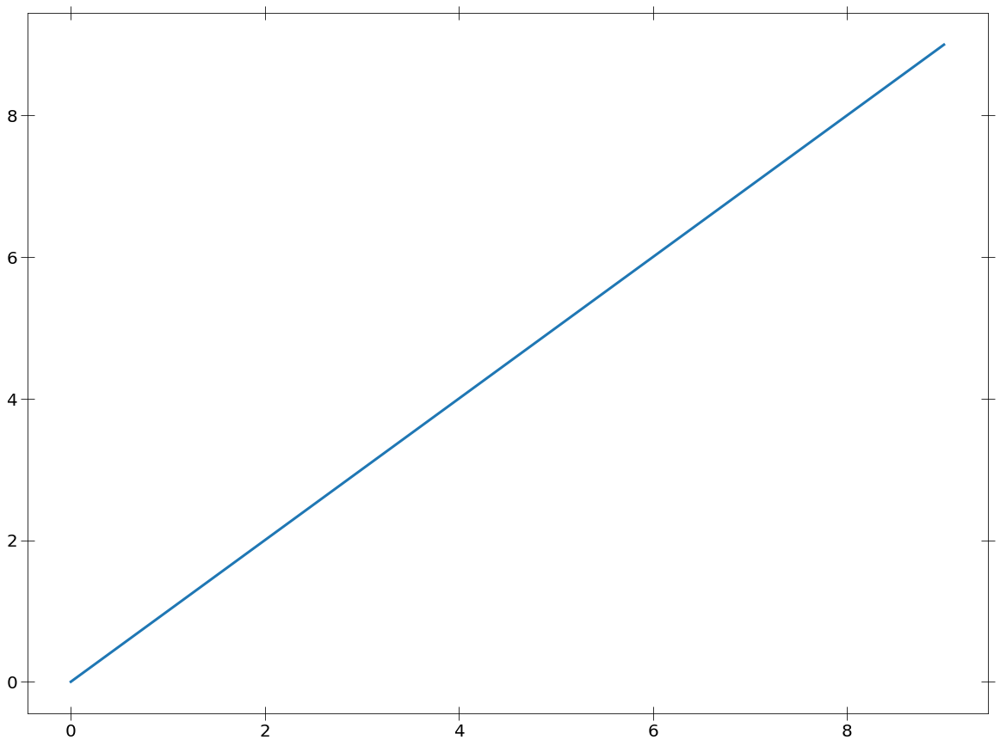

In [8]:
plt.plot(np.arange(10))

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:488: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:489: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:575: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:579: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:579: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:581: RuntimeWarning: invalid value encountered in sqrt


12.0


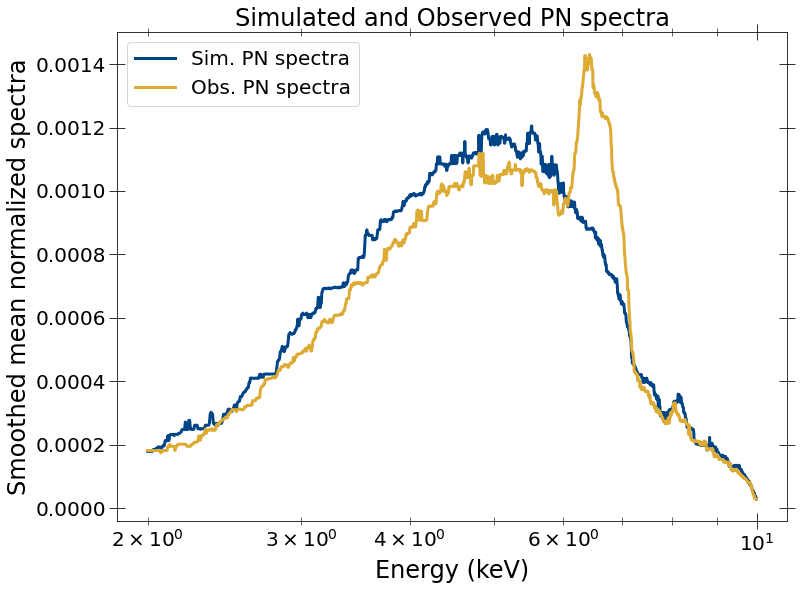

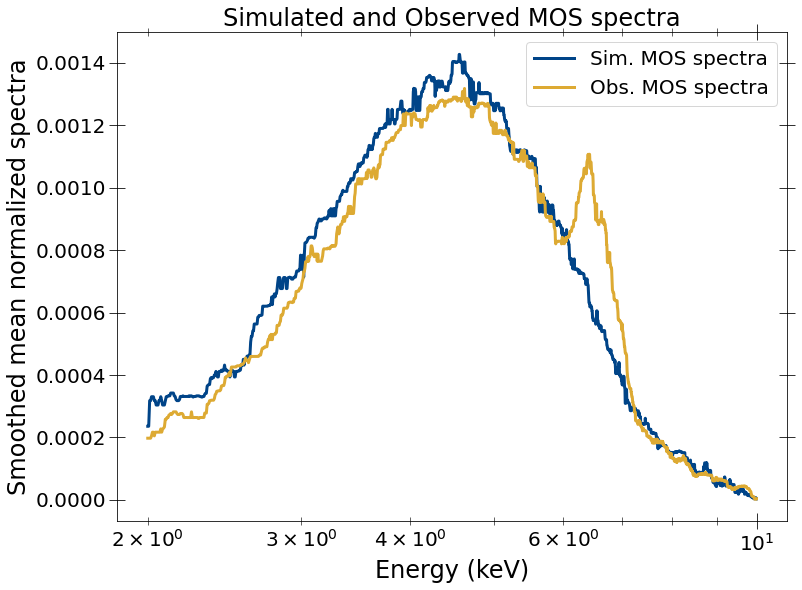

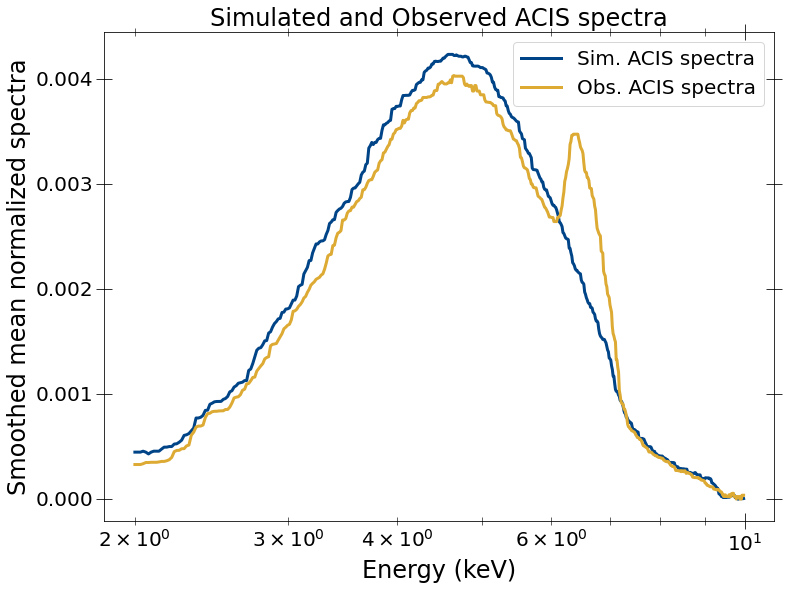

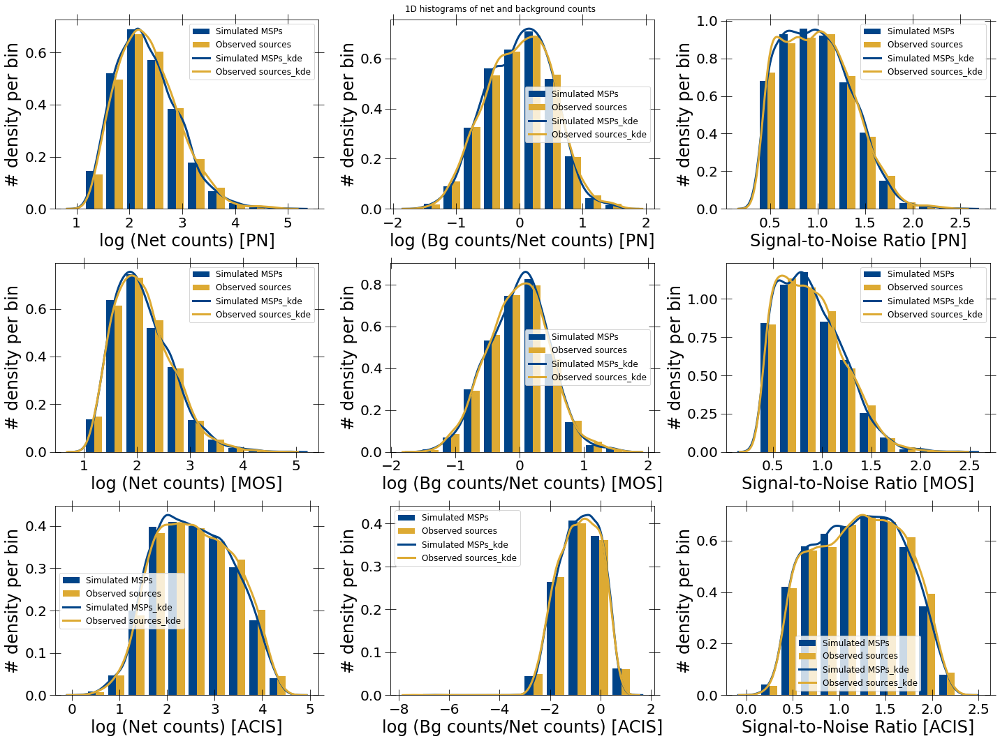

In [11]:
spec_summary = load_alldata(
     [pn_response_path, mos_response_path, chandra_response_path],
     [xmm_sim_path, xmm_sim_path, chandra_sim_path],
     [xmm_obs_path, xmm_obs_path, chandra_obs_path], en_range=[2, 10])

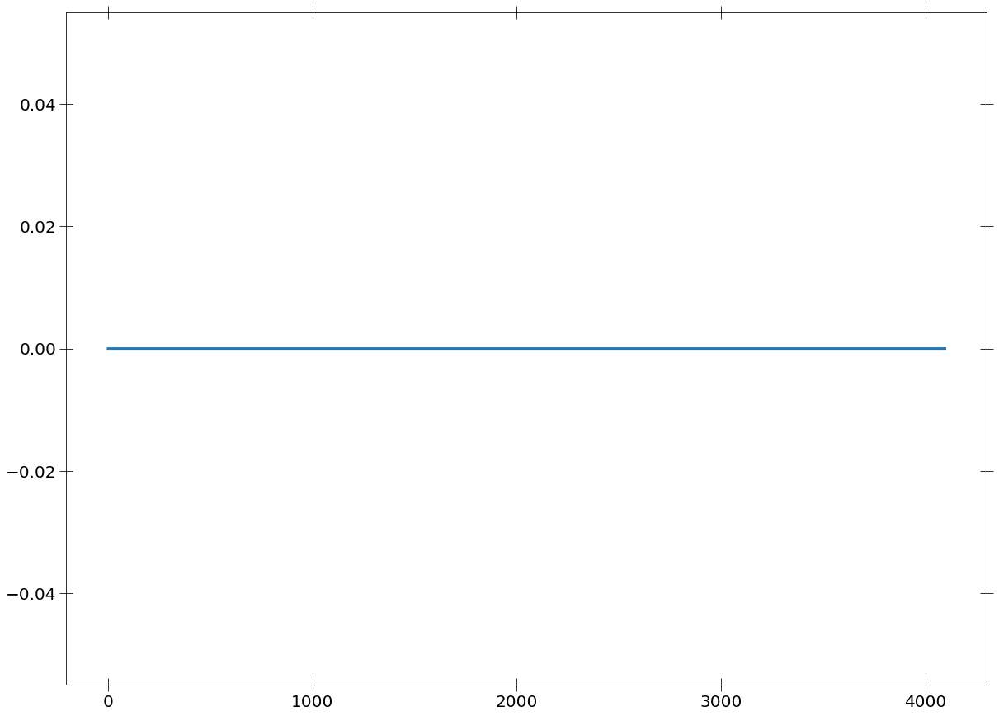

In [13]:
plt.plot(np.mean(spec_summary['specs'][0][0], axis=0))

In [144]:
counts_2keV_sim_mos = get_line_cont_counts(spec_summary['specs'][0][1][spec_summary['spec_masks'][0][1]],
                                           spec_summary['specs'][1][1][spec_summary['spec_masks'][0][1]],
                                           spec_summary['ebins'][0][1],
                                           range_fe=[2.1, 2.7])[0][0]
counts_2keV_obs_mos = get_line_cont_counts(spec_summary['specs'][2][1][spec_summary['spec_masks'][1][1]],
                                           spec_summary['specs'][3][1][spec_summary['spec_masks'][1][1]],
                                           spec_summary['ebins'][0][1],
                                           range_fe=[2.1, 2.7])[0][0]

1:80: E501 line too long (105 > 79 characters)
2:80: E501 line too long (105 > 79 characters)
5:80: E501 line too long (105 > 79 characters)
6:80: E501 line too long (105 > 79 characters)


In [158]:
counts_3keV_sim_mos = get_line_cont_counts(spec_summary['specs'][0][1][spec_summary['spec_masks'][0][1]],
                                           spec_summary['specs'][1][1][spec_summary['spec_masks'][0][1]],
                                           spec_summary['ebins'][0][1],
                                           range_fe=[2.7, 3.4])[0][0]
counts_3keV_obs_mos = get_line_cont_counts(spec_summary['specs'][2][1][spec_summary['spec_masks'][1][1]],
                                           spec_summary['specs'][3][1][spec_summary['spec_masks'][1][1]],
                                           spec_summary['ebins'][0][1],
                                           range_fe=[2.7, 3.4])[0][0]

1:80: E501 line too long (105 > 79 characters)
2:80: E501 line too long (105 > 79 characters)
5:80: E501 line too long (105 > 79 characters)
6:80: E501 line too long (105 > 79 characters)


In [159]:
netcounts_obs = spec_summary['counts'][0][1][1][spec_summary['spec_masks'][1][1]]
netcounts_sim = spec_summary['counts'][0][1][0][spec_summary['spec_masks'][0][1]]

1:80: E501 line too long (81 > 79 characters)


In [160]:
len(netcounts_obs)

445

In [161]:
spec_summary['src_nums'][0][spec_summary['spec_masks'][1][1]][105]

'201129721010057'

(array([[  0.,   0.,   0.,   0.,   0.,   0.,   0.,   3.,   1.,   1.,   1.,
           1.,   7.,   5.,   9.,  28.,  37.,  51.,  95., 233.],
        [  1.,   0.,   0.,   0.,   2.,   2.,   1.,   1.,   3.,   2.,   1.,
           1.,   5.,   7.,   4.,  11.,  10.,  11.,   9.,  22.]]),
 array([-4.25934684e-01, -4.04641850e-01, -3.83349017e-01, -3.62056183e-01,
        -3.40763350e-01, -3.19470516e-01, -2.98177682e-01, -2.76884849e-01,
        -2.55592015e-01, -2.34299182e-01, -2.13006348e-01, -1.91713515e-01,
        -1.70420681e-01, -1.49127848e-01, -1.27835014e-01, -1.06542181e-01,
        -8.52493473e-02, -6.39565138e-02, -4.26636802e-02, -2.13708467e-02,
        -7.80131905e-05]),
 <a list of 2 BarContainer objects>)

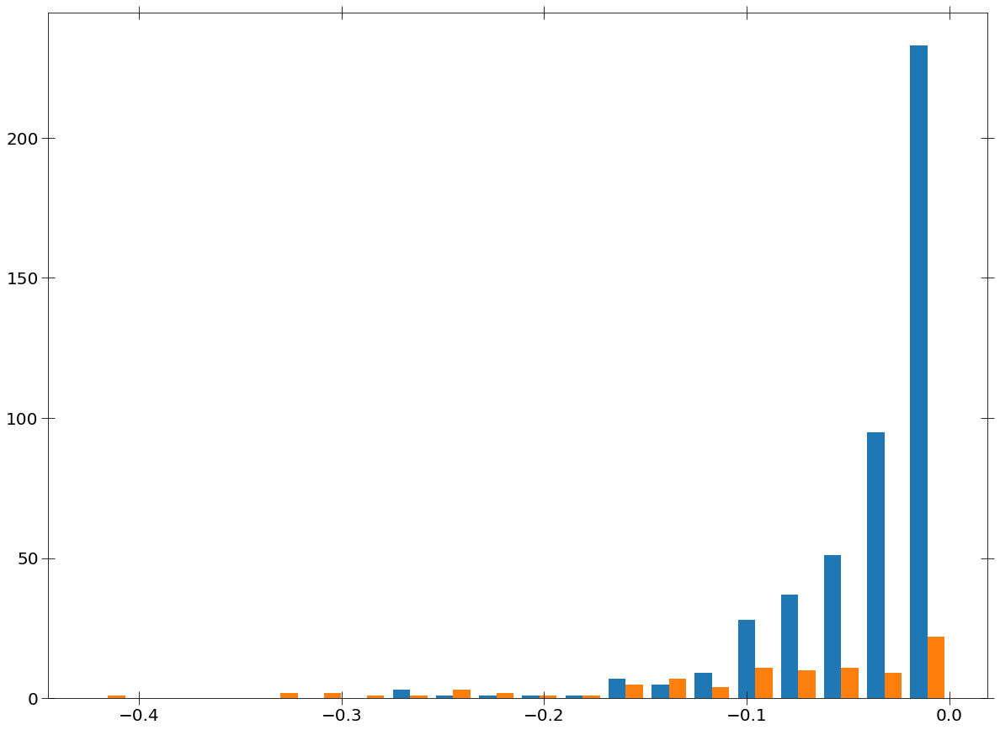

In [162]:
plt.hist([(counts_2keV_sim_mos/netcounts_sim)[counts_2keV_sim_mos < 0],
          (counts_2keV_obs_mos/netcounts_obs)[counts_2keV_obs_mos < 0]],
         bins=20)

(array([[  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
           0.,   0.,   0.,   0.,   0.,   0.,   0.,   1., 209.],
        [  1.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
           0.,   0.,   0.,   0.,   0.,   1.,   0.,   1.,  26.]]),
 array([-7.30066848e+02, -6.93565776e+02, -6.57064705e+02, -6.20563633e+02,
        -5.84062561e+02, -5.47561490e+02, -5.11060418e+02, -4.74559347e+02,
        -4.38058275e+02, -4.01557204e+02, -3.65056132e+02, -3.28555061e+02,
        -2.92053989e+02, -2.55552917e+02, -2.19051846e+02, -1.82550774e+02,
        -1.46049703e+02, -1.09548631e+02, -7.30475597e+01, -3.65464882e+01,
        -4.54166506e-02]),
 <a list of 2 BarContainer objects>)

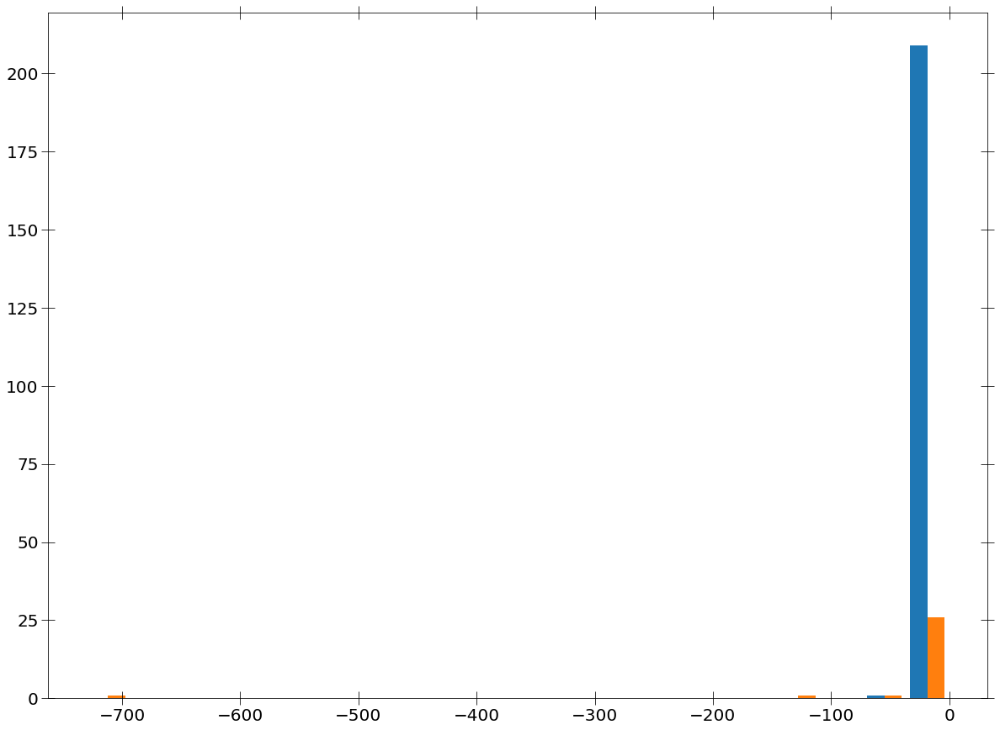

In [150]:
plt.hist([counts_3keV_sim_mos[counts_3keV_sim_mos < 0],
          counts_3keV_obs_mos[counts_3keV_obs_mos < 0]], bins=20)

In [165]:
np.sort(counts_2keV_obs_mos/netcounts_obs)[:10]

array([-0.42593468, -0.33020238, -0.32178032, -0.31756022, -0.317243  ,
       -0.2976317 , -0.26637052, -0.24287688, -0.24267083, -0.24171108])

In [163]:
spec_summary['src_nums'][0][spec_summary['spec_masks'][1][1]][np.argsort(counts_2keV_obs_mos/netcounts_obs)[:10]]

array(['206735502015094', '204024304010028', '206946410010097',
       '207848601010048', '206586001010103', '206735502010090',
       '206735502010070', '206746006015083', '206946410010058',
       '206586001010156'], dtype=object)

# PN files init: 853
# PN files init: 853


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:488: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:489: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:575: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:576: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:579: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:579: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:581: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ip

12.0


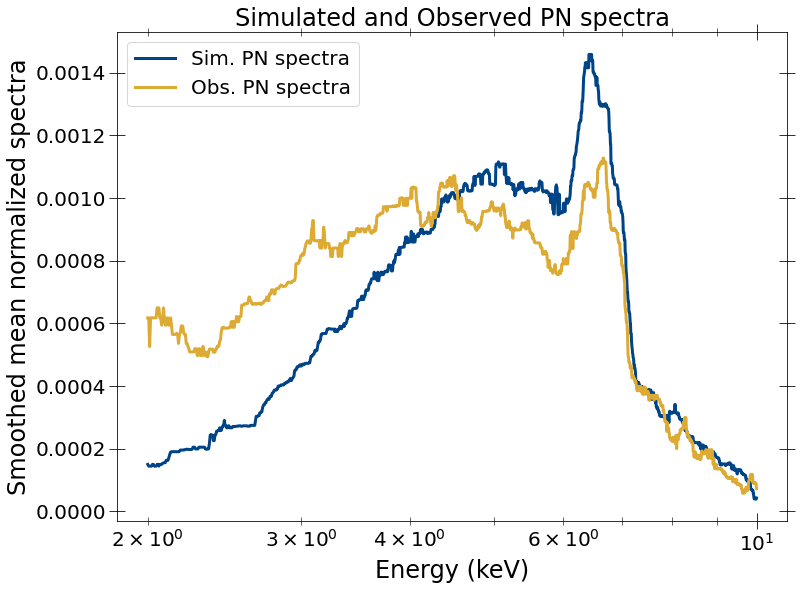

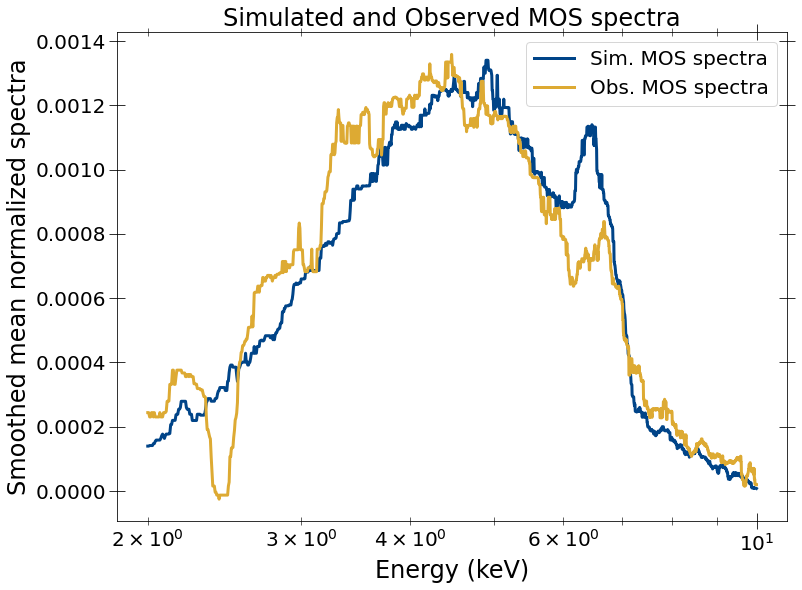

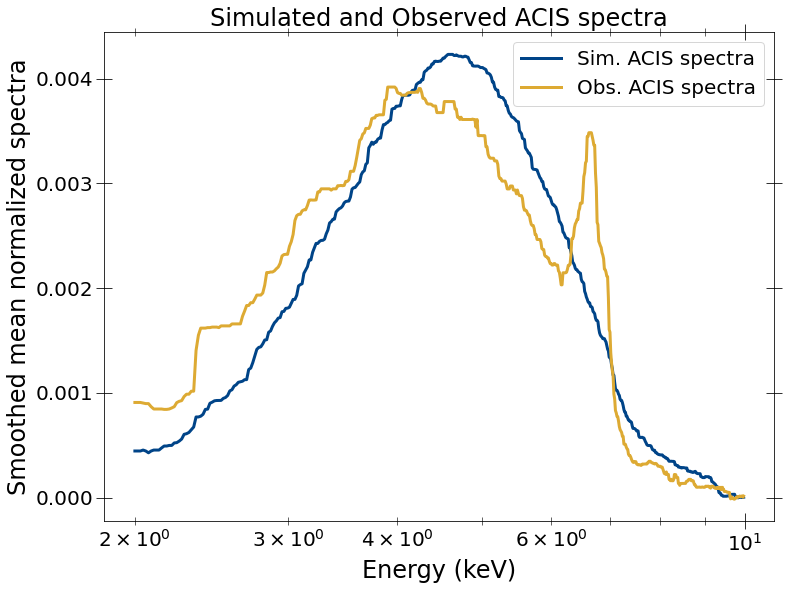

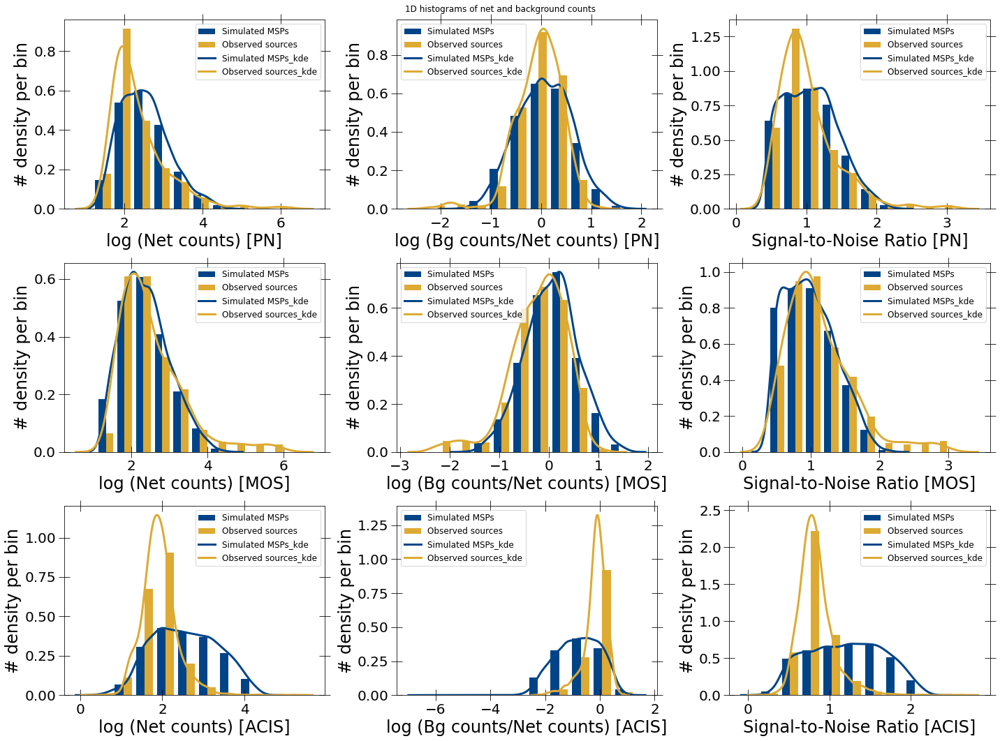

In [23]:
spec_summary_allobs = load_alldata(
     [pn_response_path, mos_response_path, chandra_response_path],
     [xmm_sim_path2, xmm_sim_path2, chandra_sim_path],
     [xmm_obs_path, xmm_obs_path, chandra_obs_path], en_range=[2, 10])

4572 4572 4572 4572
741 741 741 741
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:670: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:670: RuntimeWarning: invalid value encountered in true_divide


2382 2382 2382 2382
445 445 445 445
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:670: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:670: RuntimeWarning: invalid value encountered in true_divide


7873 7873 7873 7873
2670 2670 2670 2670
Calaculating mean and standard deviation in colors vs. Net counts


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:670: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:670: RuntimeWarning: invalid value encountered in true_divide


Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
16.0
16.0
16.0


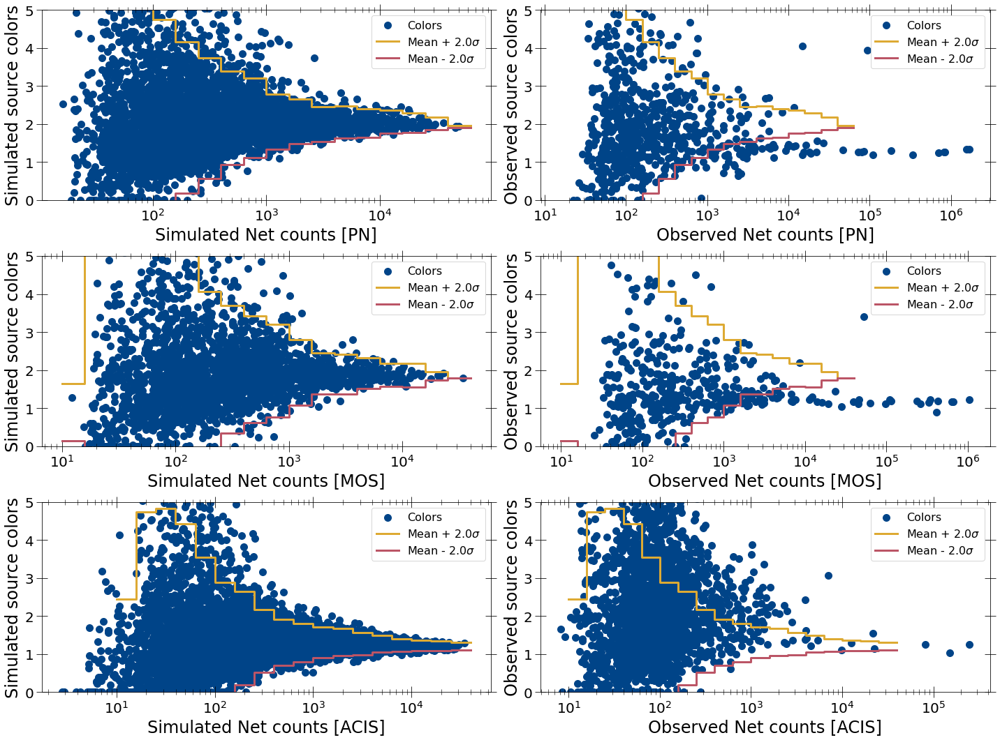

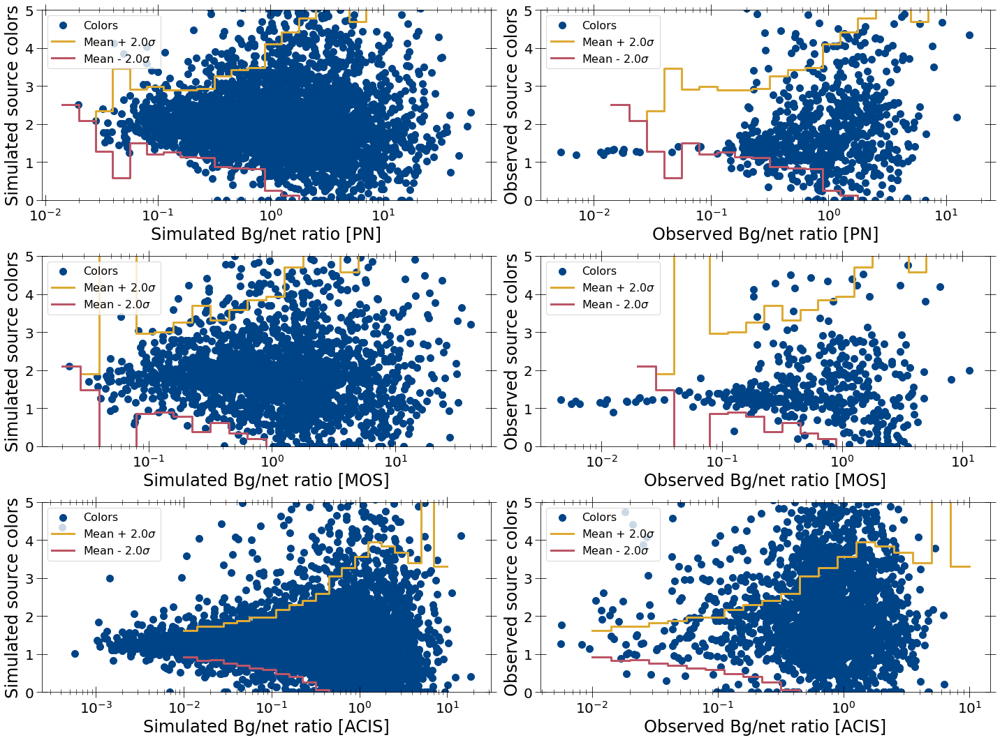

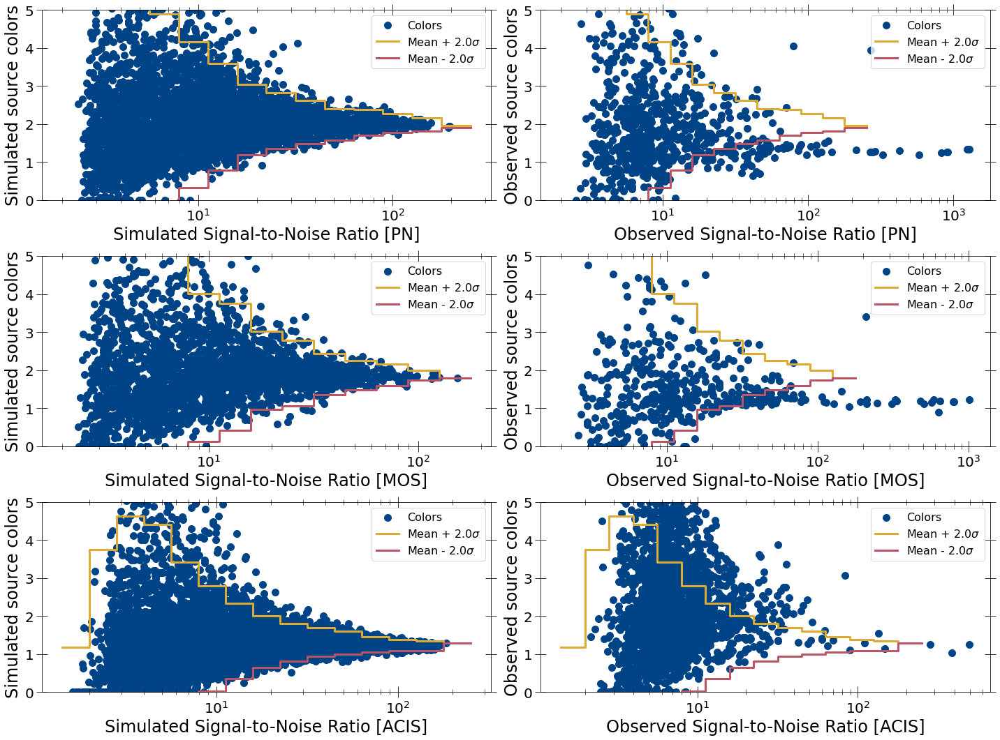

In [24]:
sim_color_dict_arr_clipped, obs_color_dict_arr_clipped = getcolor_prop_alldet(spec_summary_allobs, compare_det=True)

2772 2772 2772 2772
4419 4419 4419 4419


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:670: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:670: RuntimeWarning: invalid value encountered in true_divide


Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
1937 1937 1937 1937
3625 3625 3625 3625


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:670: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:670: RuntimeWarning: invalid value encountered in true_divide


Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
7873 7873 7873 7873
8132 8132 8132 8132


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:670: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:670: RuntimeWarning: invalid value encountered in true_divide


Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
16.0
16.0
16.0


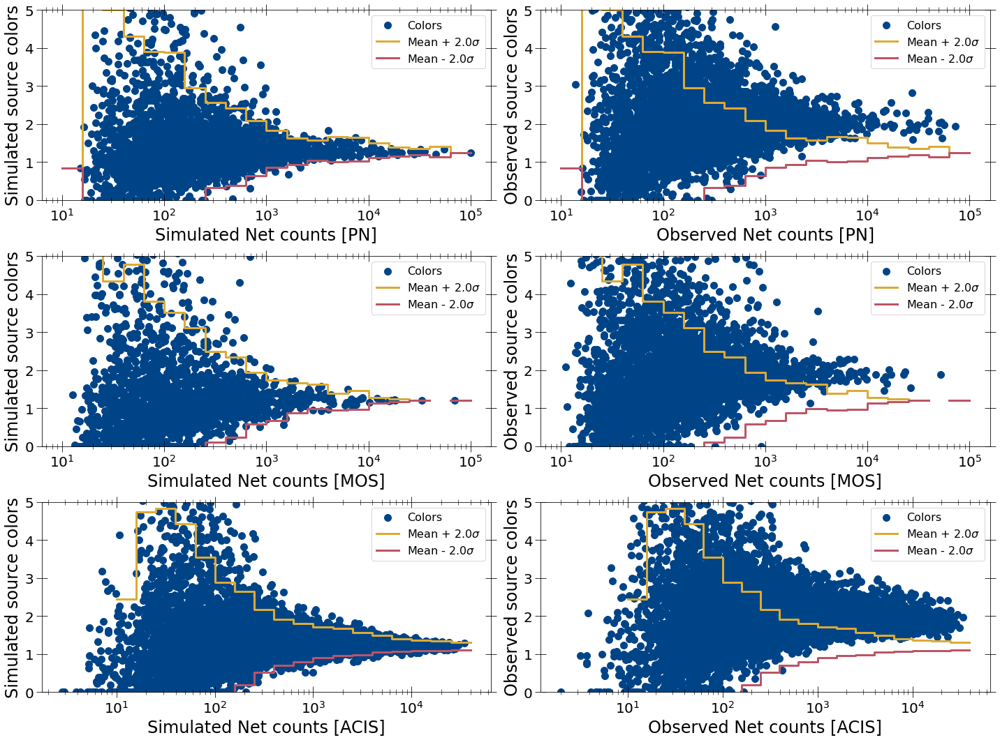

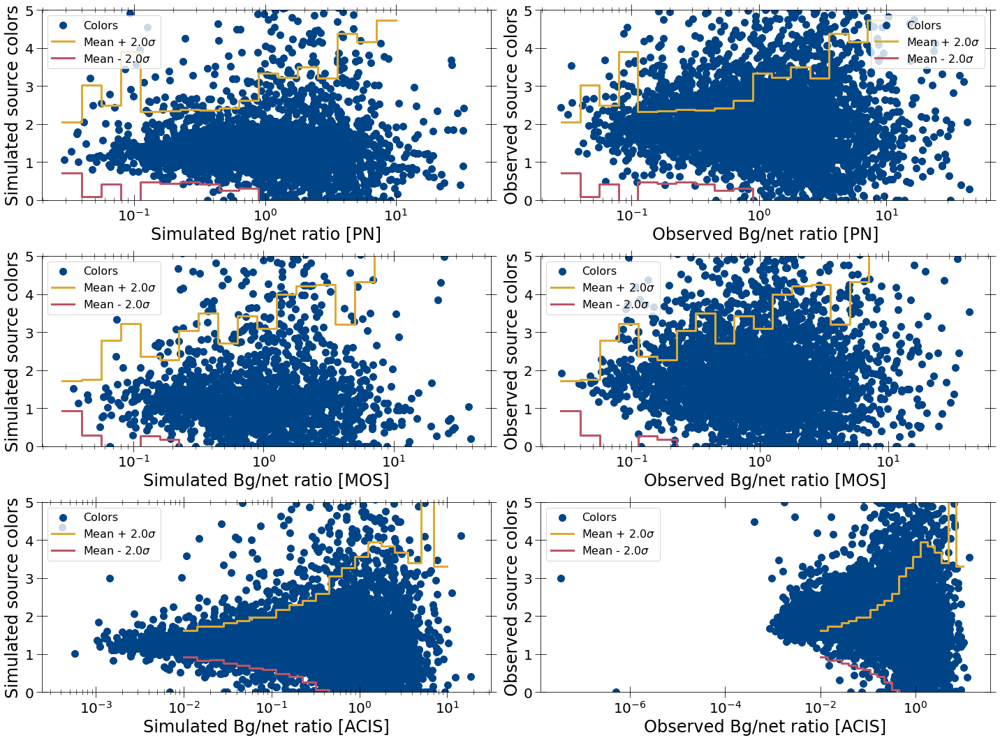

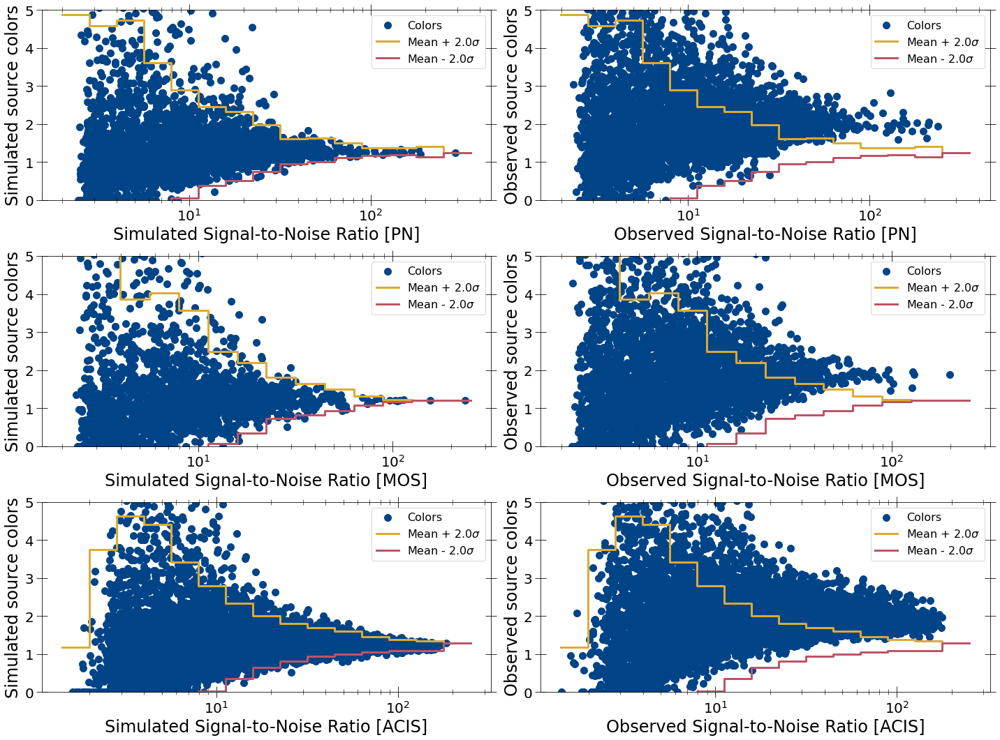

In [15]:
sim_color_dict_arr, obs_color_dict_arr = getcolor_prop_alldet(spec_summary, compare_det=True)

# PN files init: 853
# PN files init: 853


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:488: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:489: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:576: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:579: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:581: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:581: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:575: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ip

12.0


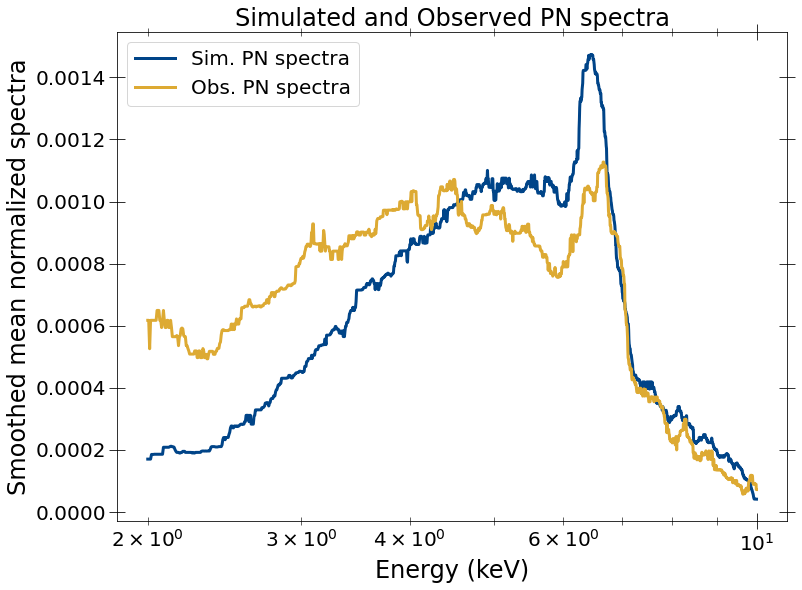

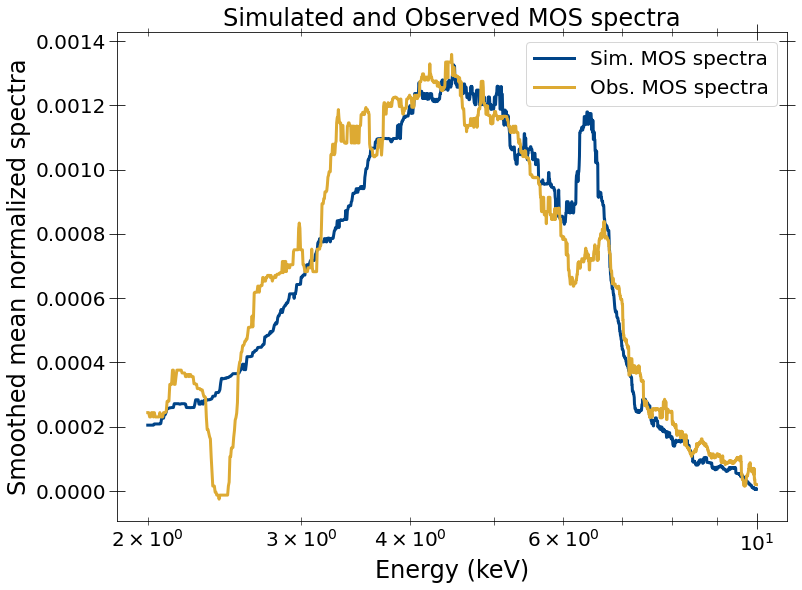

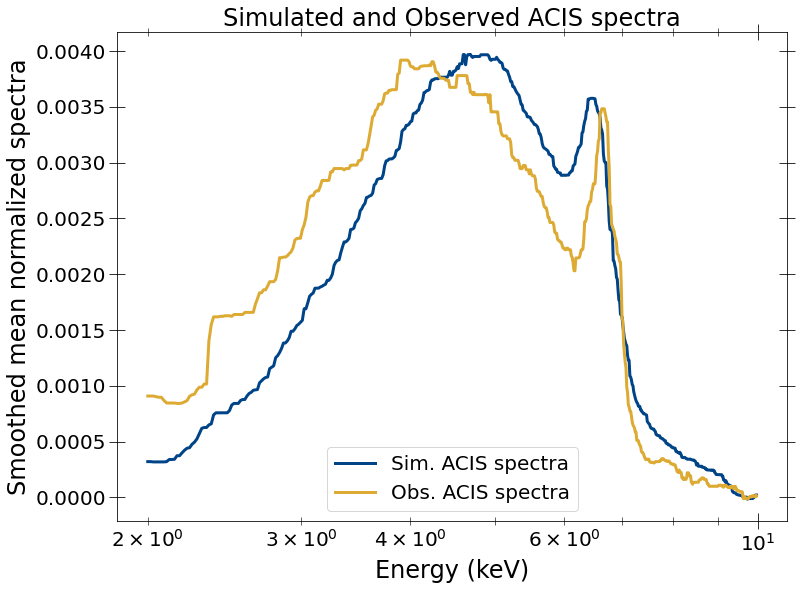

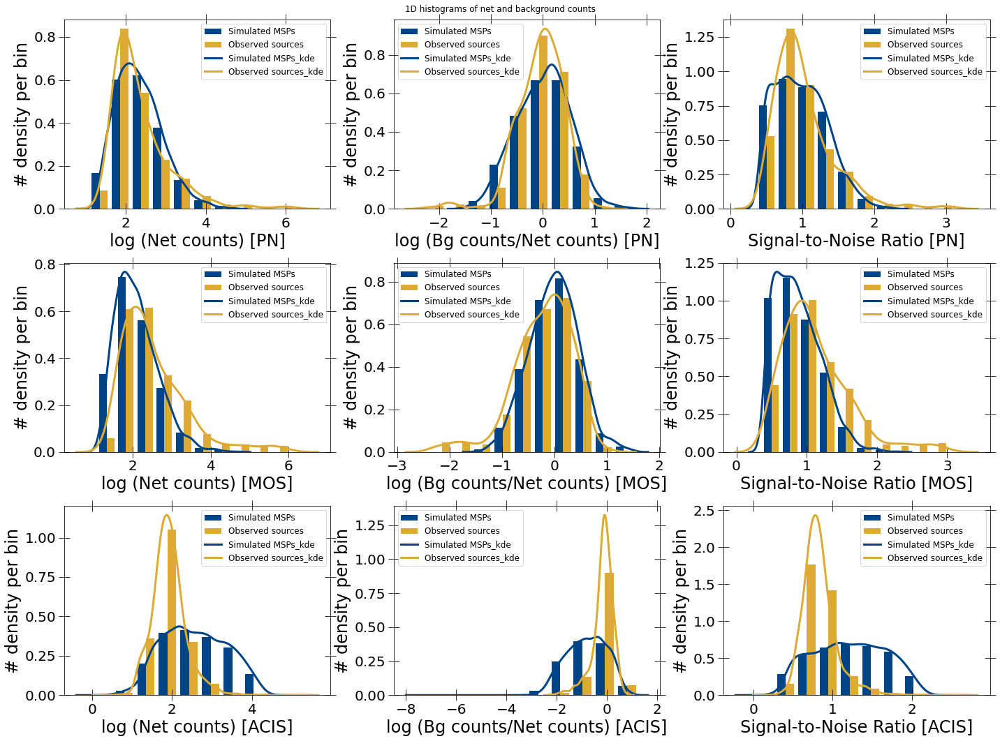

In [48]:
spec_summary2 = load_alldata(
     [pn_response_path, mos_response_path, chandra_response_path],
     [xmm_sim_path2, xmm_sim_path2, chandra_sim_path2],
     [xmm_obs_path, xmm_obs_path, chandra_obs_path], en_range=[2.0, 10.0])

4405 4405 4405 4405
741 741 741 741
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:670: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:670: RuntimeWarning: invalid value encountered in true_divide


3599 3599 3599 3599
445 445 445 445
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
7957 7957 7957 7957
2670 2670 2670 2670


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:670: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:670: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:670: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:670: RuntimeWarning: invalid value encountered in true_divide


Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
16.0
16.0
16.0


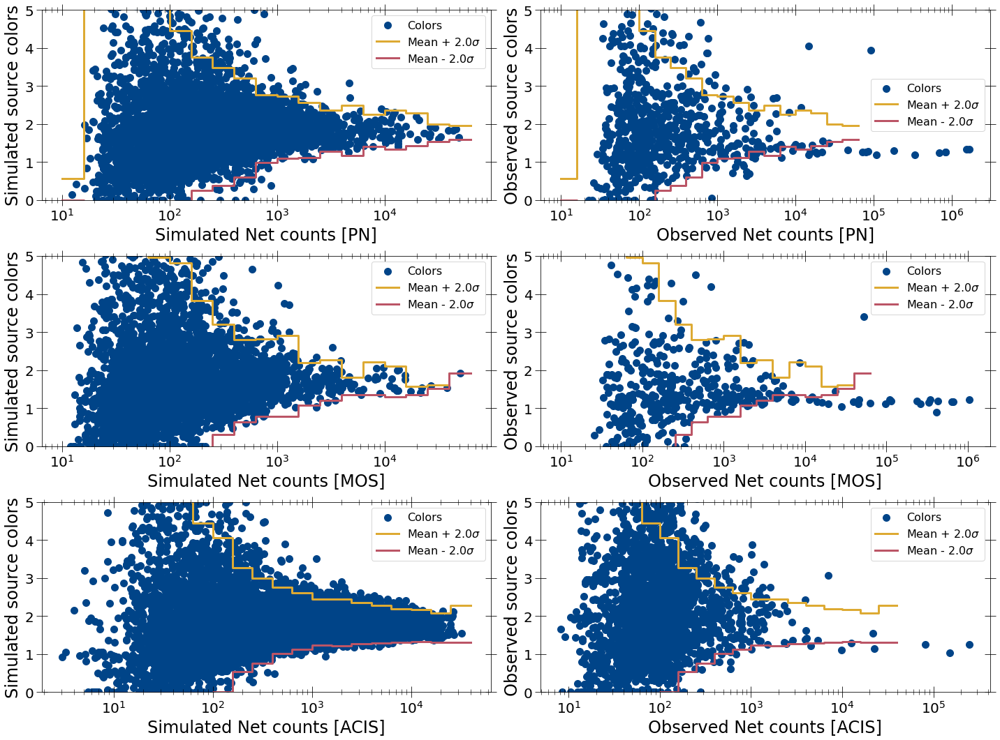

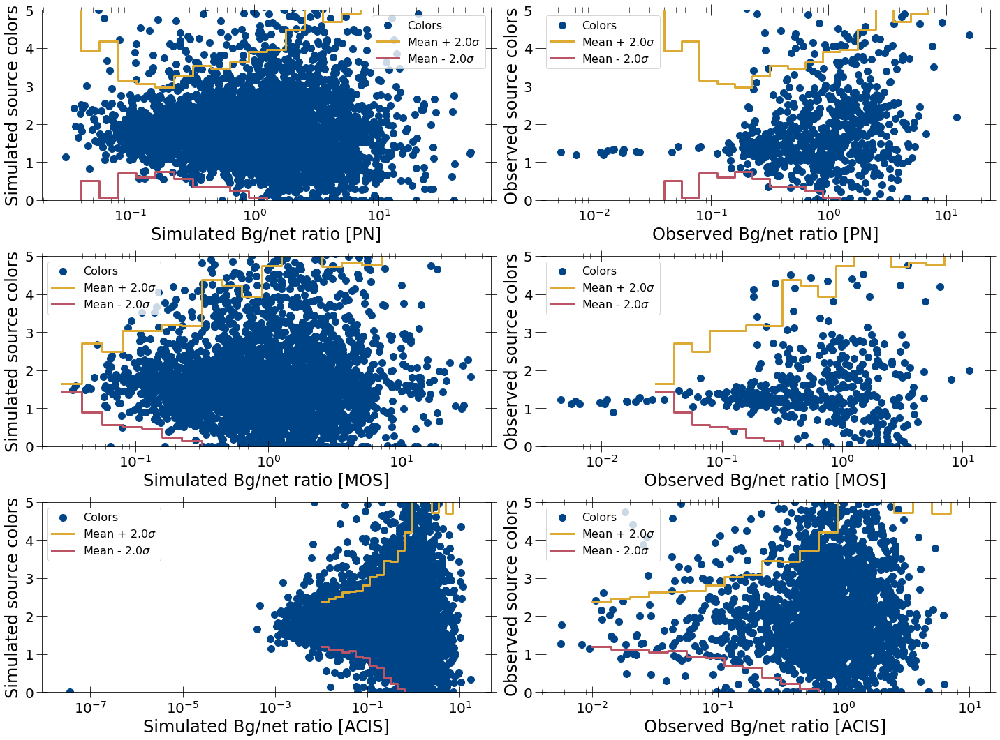

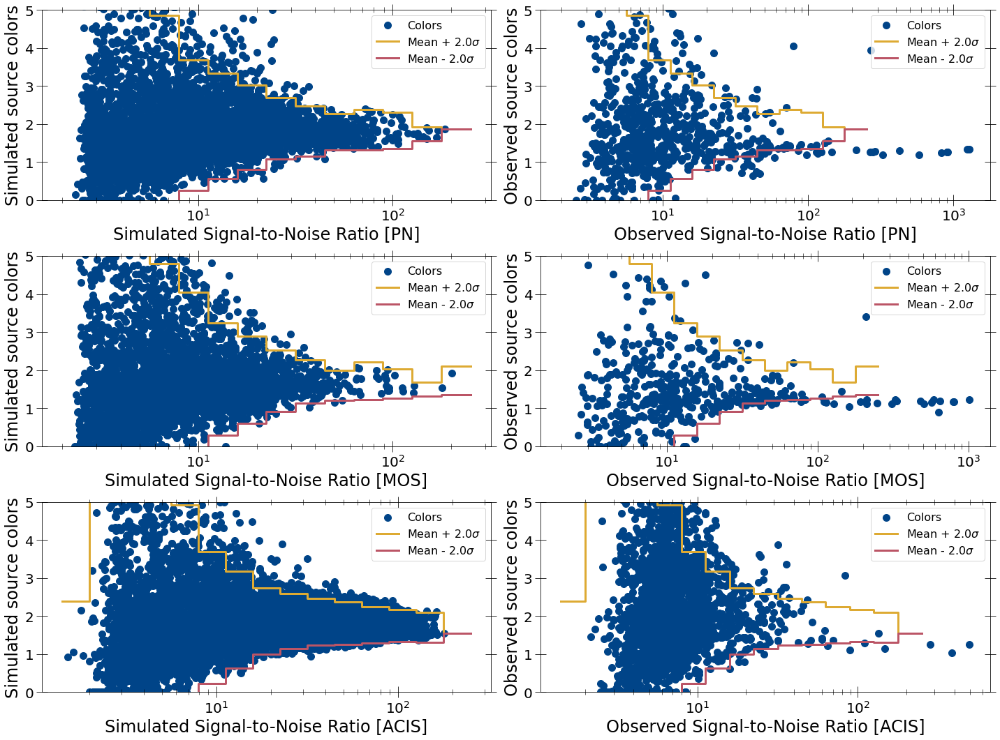

In [49]:
sim_color_dict_arr2, obs_color_dict_arr2 = getcolor_prop_alldet(spec_summary2, compare_det=True)

In [12]:
def get_candidate_src_nums_det(obs_src_nums, obs_det_mask, sim_color_dict,
                               obs_color_dict, min_counts):
    """Get src nums of quiescent sources for given detector"""
    obs_netcounts = obs_color_dict['prop_list'][0]
    netcount_bins = sim_color_dict['prop_bins'][0]
    obs_colors = obs_color_dict['colors']
    color_median = sim_color_dict['color_stat'][0][0]
    color_std = sim_color_dict['color_stat'][2][0]
    print(netcount_bins)
    print(color_median)
    print(color_std)
    interested_args = None
    for i, lower_bin in enumerate(netcount_bins):
        if lower_bin < min_counts:
            continue
        if i == len(netcount_bins) - 1:
            upper_bin = np.max(obs_netcounts) + 10
            median_color = color_median[-1]
            std_color = color_std[-1]
        else:
            upper_bin = netcount_bins[i+1]
            median_color = color_median[i]
            std_color = color_std[i]
        print(lower_bin, median_color + 2*std_color)
        if np.isnan(median_color) or np.isnan(std_color):
                    int_args = np.where(np.logical_and(
                        obs_netcounts >= lower_bin,
                        obs_netcounts < upper_bin))
        else:
        
            int_args = np.where(np.logical_and(
                np.logical_and(obs_netcounts >= lower_bin,
                               obs_netcounts < upper_bin),
                obs_colors < median_color + 2*std_color))[0]
        '''
        int_args = np.where(np.logical_and(
                np.logical_and(obs_netcounts >= lower_bin,
                               obs_netcounts < upper_bin),
                obs_colors < median_color + 2*std_color))[0]
        '''
        print(len(int_args))
        if interested_args is None:
            interested_args = int_args.copy()
        else:
            interested_args = np.append(interested_args.copy(), int_args)
    return interested_args, obs_src_nums[obs_det_mask][interested_args]


def get_candidate_src_nums_alldet(spec_summary, sim_color_dict_arr,
                                  obs_color_dict_arr, min_count_arr=None):
    """Get source nums for all detectors."""
    interested_args_alldet = []
    interested_sources_alldet = []
    if min_count_arr is None:
        min_count_arr = [700, 700, 250]
    for i, obs_color_dict in enumerate(obs_color_dict_arr):
        if i > 0:
            interested_args, interested_srcs = get_candidate_src_nums_det(
                spec_summary['src_nums'][i-1], spec_summary['spec_masks'][1][i],
                sim_color_dict_arr[i], obs_color_dict, min_count_arr[i])
        else:
            interested_args, interested_srcs = get_candidate_src_nums_det(
            spec_summary['src_nums'][i], spec_summary['spec_masks'][1][i],
            sim_color_dict_arr[i], obs_color_dict, min_count_arr[i])
        interested_args_alldet.append(interested_args)
        interested_sources_alldet.append(interested_srcs)
    return interested_args_alldet, interested_sources_alldet


26:21: E117 over-indented
30:1: W293 blank line contains whitespace
59:80: E501 line too long (80 > 79 characters)
63:13: E122 continuation line missing indentation or outdented
64:13: E122 continuation line missing indentation or outdented


In [13]:
interested_args_alldet2, interested_srcs_alldet2 = get_candidate_src_nums_alldet(spec_summary2, sim_color_dict_arr2,
                              obs_color_dict_arr2, min_count_arr=[39, 39, 39])

NameError: name 'spec_summary2' is not defined

1:80: E501 line too long (116 > 79 characters)
2:31: E128 continuation line under-indented for visual indent


In [16]:
interested_args_alldet, interested_srcs_alldet = get_candidate_src_nums_alldet(spec_summary, sim_color_dict_arr,
                              obs_color_dict_arr, min_count_arr=[150, 150, 150])

[1.00000000e+01 1.58489319e+01 2.51188643e+01 3.98107171e+01
 6.30957344e+01 1.00000000e+02 1.58489319e+02 2.51188643e+02
 3.98107171e+02 6.30957344e+02 1.00000000e+03 1.58489319e+03
 2.51188643e+03 3.98107171e+03 6.30957344e+03 1.00000000e+04
 1.58489319e+04 2.51188643e+04 3.98107171e+04 6.30957344e+04
 1.00000000e+05]
[0.8405164  2.07153913 1.67298979 1.57385831 1.58436607 1.66406679
 1.43030382 1.44713313 1.39609846 1.36984926 1.35086023 1.27893642
 1.31590127 1.33564778 1.334838   1.30071855 1.27144028 1.27383281
 1.26917868 1.24506393]
[0.         2.55426532 1.66817468 1.37071133 1.16334185 1.11434474
 0.75549623 0.56022382 0.51077116 0.36126324 0.24291962 0.17375792
 0.13254254 0.16428213 0.15864827 0.09633923 0.05725364 0.0421451
 0.0654287  0.        ]
158.48931924611142 2.9412962840318846
453
251.18864315095823 2.567580775527234
386
398.1071705534973 2.4176407708782373
325
630.957344480193 2.0923757354927424
197
1000.0 1.8366994711223559
67
1584.893192461114 1.6264522674211288

1:80: E501 line too long (112 > 79 characters)
2:31: E128 continuation line under-indented for visual indent


In [144]:
len(np.unique(interested_srcs_alldet[0]))

1455

In [18]:
len(np.sort(interested_srcs_alldet[1]))

957

In [19]:
len(np.sort(interested_srcs_alldet[2]))

1627

In [145]:
int_srcs_pn = np.random.choice(interested_srcs_alldet[0], 500, replace=False)
int_srcs_mos = np.random.choice(interested_srcs_alldet[1], 500, replace=False)
int_srcs_acis = np.random.choice(interested_srcs_alldet[2], 500, replace=False)

In [146]:
int_srcs_subset = [int_srcs_pn, int_srcs_mos, int_srcs_acis]

In [147]:
def mark_interested_srcs(sim_color_dict, obs_color_dict, src_nums, obs_mask,
                         interested_srcs, prop_num=0):
    props = obs_color_dict['prop_list'][prop_num]
    colors = obs_color_dict['colors']
    interested_args = np.where(np.isin(src_nums[obs_mask], interested_srcs))
    print(len(interested_args[0]), len(interested_srcs))
    print(len(np.unique(interested_srcs)))
    #print(interested_args)
    #print(src_nums[obs_mask][interested_args])
    #print(props[interested_args])
    #print(colors[interested_args])
    prop_bins = sim_color_dict['prop_bins'][prop_num]
    mean_color = sim_color_dict['color_stat'][0][prop_num]
    std_color = sim_color_dict['color_stat'][2][prop_num]
    plotline_scatter([props, props[interested_args], prop_bins, prop_bins],
                     [colors, colors[interested_args], mean_color + 2*std_color,
                      mean_color - 2*std_color],
                     pl_types=['scatter', 'scatter', 'step', 'step'],
                     xlabel='Net counts', ylabel='Colors',
                     pl_labels=['Colors', 'Colors (candidates)',
                                r'Mean + 2$\sigma$', r'Mean + 2$\sigma$'],
                     ylim=(0, 5))
    return (colors[interested_args], props[interested_args],
            src_nums[obs_mask][interested_args])

8:5: E265 block comment should start with '# '
9:5: E265 block comment should start with '# '
10:5: E265 block comment should start with '# '
11:5: E265 block comment should start with '# '
16:80: E501 line too long (80 > 79 characters)


In [23]:
np.where(spec_summary['src_nums'][0] == )

SyntaxError: invalid syntax (<ipython-input-23-8d0a30d54856>, line 1)

1:40: E202 whitespace before ')'
41: E999 SyntaxError: invalid syntax


Error before execution: invalid syntax (<ipython-input-23-8d0a30d54856>, line 1)


1455 1455
1455


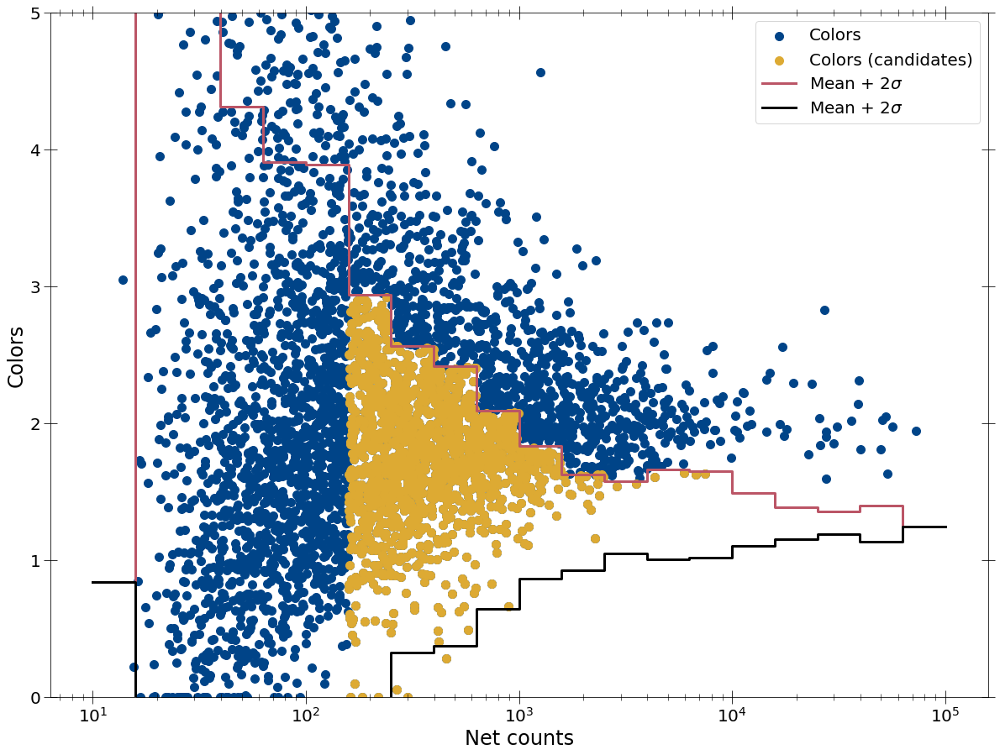

In [192]:
colors_int_pn, netcounts_int_pn = mark_interested_srcs(
    sim_color_dict_arr[0], obs_color_dict_arr[0], spec_summary['src_nums'][0],
    spec_summary['spec_masks'][1][0], interested_srcs_alldet[0], 0)[:2]

957 957
957


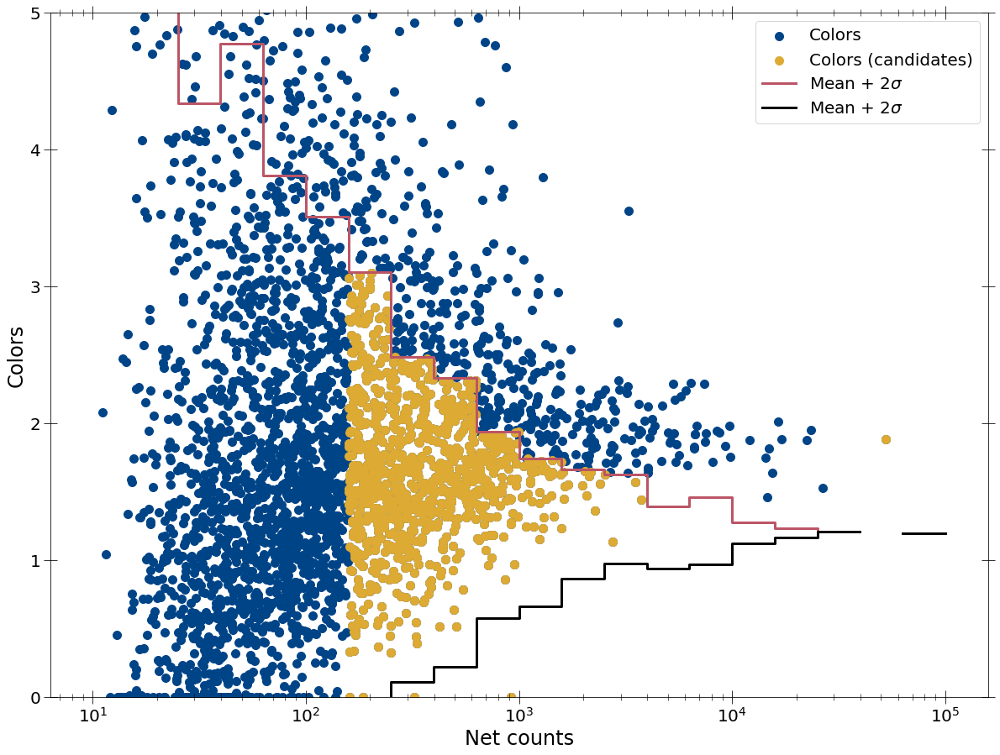

In [194]:
colors_int_mos, netcounts_int_mos = mark_interested_srcs(
    sim_color_dict_arr[1], obs_color_dict_arr[1], spec_summary['src_nums'][0],
    spec_summary['spec_masks'][1][1], interested_srcs_alldet[1], 0)[:2]

In [150]:
len(interested_srcs_alldet[0])

1455

1627 1627
1627


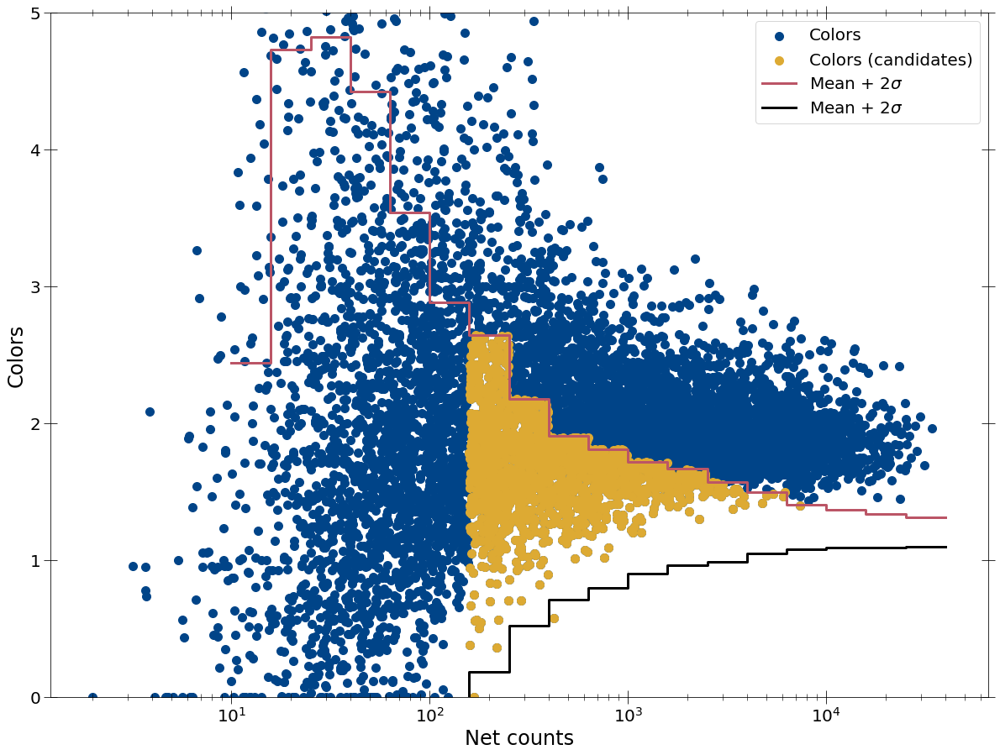

In [195]:
colors_int_acis, netcounts_int_acis = mark_interested_srcs(
    sim_color_dict_arr[2], obs_color_dict_arr[2], spec_summary['src_nums'][1],
    spec_summary['spec_masks'][1][2], interested_srcs_alldet[2], 0)[:2]

(array([[ 90.,  75.,  66.,  63.,  46.,  32.,  26.,   8.,   7.,   2.,   1.,
           0.,   2.,   0.,   0.,   0.,   0.,   0.,   0.,   0.],
        [127.,  90.,  82.,  70.,  60.,  34.,  16.,  15.,   4.,   1.,   0.,
           0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   1.],
        [111.,  95.,  83.,  48.,  46.,  32.,  34.,  25.,  12.,  10.,   2.,
           1.,   1.,   0.,   0.,   0.,   0.,   0.,   0.,   0.]]),
 array([2.20002422, 2.32604845, 2.45207269, 2.57809693, 2.70412116,
        2.8301454 , 2.95616964, 3.08219387, 3.20821811, 3.33424235,
        3.46026658, 3.58629082, 3.71231506, 3.83833929, 3.96436353,
        4.09038777, 4.216412  , 4.34243624, 4.46846048, 4.59448471,
        4.72050895]),
 <a list of 3 BarContainer objects>)

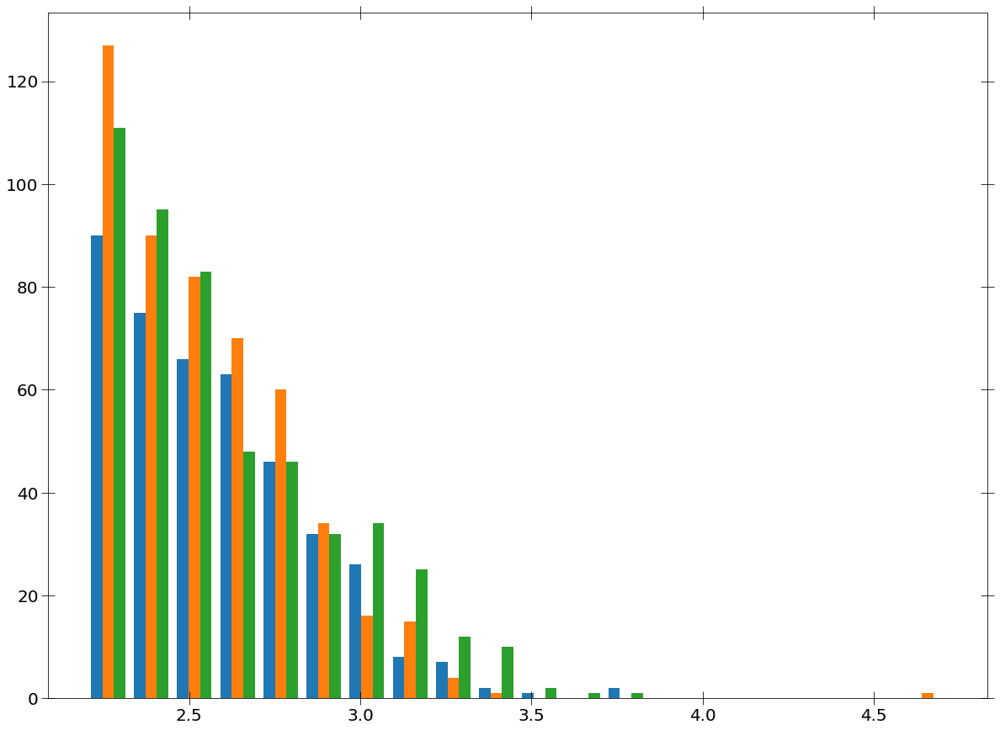

In [152]:
plt.hist([np.log10(net_counts_int_pn),
          np.log10(netcounts_int_mos),
          np.log10(netcounts_int_acis)], bins=20)

In [28]:
source_nums = np.loadtxt('Interested_sources.txt', dtype='object')

(array([ 24,  38,  43,  50,  75,  91,  98, 111, 121, 127, 140, 152, 187,
       191, 192, 195, 206, 211, 213, 223, 229, 240, 273, 308, 309, 311,
       441, 464, 465, 467, 481, 483]),)


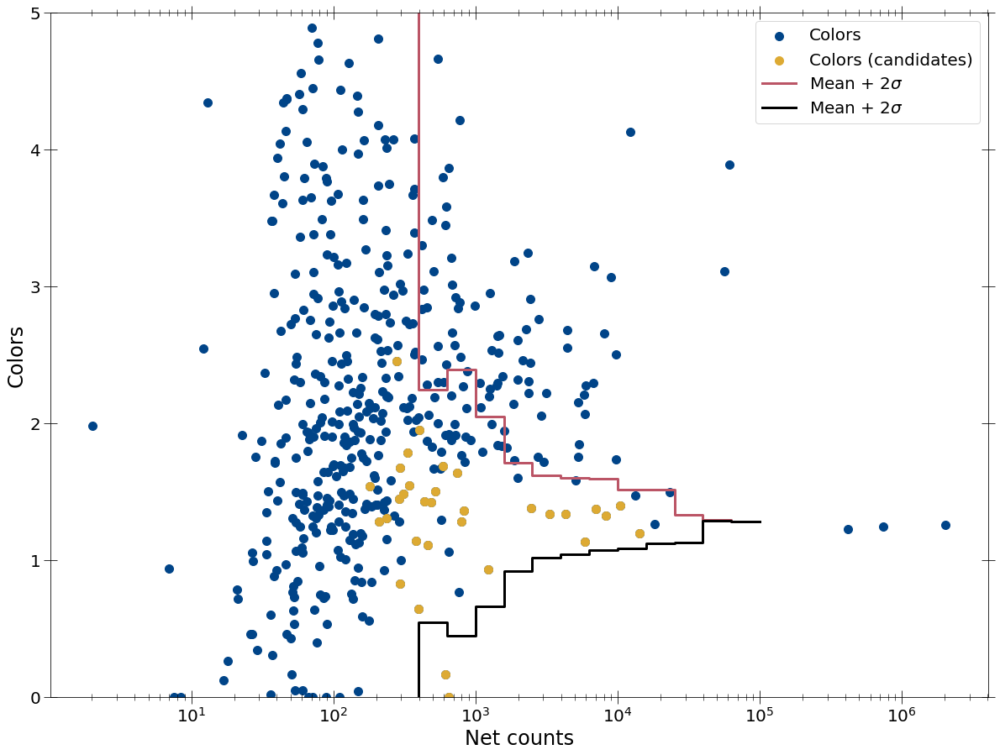

2:80: E501 line too long (83 > 79 characters)


In [29]:
mark_interested_srcs(sim_color_dict_arr[0], obs_color_dict_arr[0],
                     spec_summary['src_nums'][0], spec_summary['spec_masks'][1][0],
                     source_nums, 0)

(array([ 16,  24,  29,  33,  55,  66,  72,  84,  93,  97, 103, 119, 122,
       123, 125, 134, 137, 139, 157, 171, 183, 184, 185, 220, 224, 225,
       226, 229, 231]),)


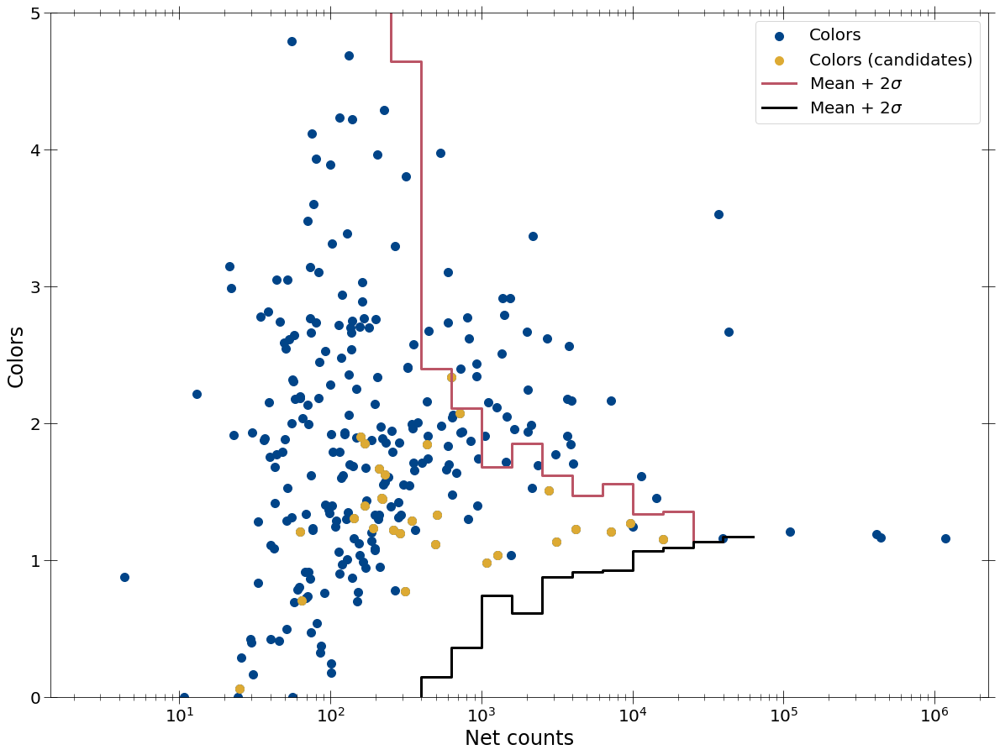

2:80: E501 line too long (83 > 79 characters)


In [30]:
mark_interested_srcs(sim_color_dict_arr[1], obs_color_dict_arr[1],
                     spec_summary['src_nums'][0], spec_summary['spec_masks'][1][1],
                     source_nums, 0)

# Checking for low norm sources

## def unmask_arr(masked_values, mask, filler=-100.0):
    unmasked_arr = np.ones(len(mask), dtype=float)*filler
    unmasked_arr[mask] = masked_values
    return unmasked_arr

In [23]:
print('MOS sources not detected in PN')
mos_not_pn = []
for src in interested_srcs_alldet[1]:
    if src not in interested_srcs_alldet[0]:
        mos_not_pn.append(src)
        print('Source: ', src)
        arg = np.where(spec_summary['src_nums'][0] == src)[0]
        print('Net counts (PN): ', spec_summary['counts'][0][0][1][arg])
        print('Net counts (MOS): ', spec_summary['counts'][0][1][1][arg])
        print('Bg counts (PN): ', spec_summary['counts'][1][0][1][arg])
        print('Bg counts (MOS): ', spec_summary['counts'][1][1][1][arg])
        print('Mask (PN): ', spec_summary['spec_masks'][1][3][arg])
        print('Mask (MOS): ', spec_summary['spec_masks'][1][4][arg])
        print('Color (PN): ', unmask_arr(obs_color_dict_arr[0]['colors'], spec_summary['spec_masks'][1][3])[arg])
        print('Color (MOS): ', unmask_arr(obs_color_dict_arr[1]['colors'], spec_summary['spec_masks'][1][4])[arg])

MOS sources not detected in PN
Source:  201129705010014
Net counts (PN):  [1984.88629568]
Net counts (MOS):  [608.05064636]
Bg counts (PN):  [2078.11370432]
Bg counts (MOS):  [524.94935364]


IndexError: list index out of range

14:80: E501 line too long (113 > 79 characters)


In [395]:
print('PN sources not detected in MOS')
pn_not_mos = []
for src in interested_srcs_alldet[0]:
    if src not in interested_srcs_alldet[1]:
        pn_not_mos.append(src)
        print('Source: ', src)
        arg = np.where(spec_summary['src_nums'][0] == src)[0]
        print('Net counts (PN): ', spec_summary['counts'][0][0][1][arg])
        print('Net counts (MOS): ', spec_summary['counts'][0][1][1][arg])
        print('Bg counts (PN): ', spec_summary['counts'][1][0][1][arg])
        print('Bg counts (MOS): ', spec_summary['counts'][1][1][1][arg])
        print('Mask (PN): ', spec_summary['spec_masks'][1][3][arg])
        print('Mask (MOS): ', spec_summary['spec_masks'][1][4][arg])
        print('Color (PN): ', unmask_arr(obs_color_dict_arr[0]['colors'], spec_summary['spec_masks'][1][3])[arg])
        print('Color (MOS): ', unmask_arr(obs_color_dict_arr[1]['colors'], spec_summary['spec_masks'][1][4])[arg])

PN sources not detected in MOS
Source:  201113501010066
Net counts (PN):  [569.59489915]
Net counts (MOS):  [77.06422098]
Bg counts (PN):  [1054.40510085]
Bg counts (MOS):  [132.93577902]
Mask (PN):  [ True]
Mask (MOS):  [ True]
Color (PN):  [1.67109356]
Color (MOS):  [3.60388168]
Source:  201113501010154
Net counts (PN):  [404.91355624]
Net counts (MOS):  [169.29402981]
Bg counts (PN):  [769.08644376]
Bg counts (MOS):  [251.70597019]
Mask (PN):  [ True]
Mask (MOS):  [ True]
Color (PN):  [1.95526699]
Color (MOS):  [1.4032798]
Source:  201129701010015
Net counts (PN):  [452.26180445]
Net counts (MOS):  [80.75597502]
Bg counts (PN):  [476.73819555]
Bg counts (MOS):  [149.24402498]
Mask (PN):  [ True]
Mask (MOS):  [ True]
Color (PN):  [1.87554681]
Color (MOS):  [2.73833179]
Source:  201129704010011
Net counts (PN):  [465.79990524]
Net counts (MOS):  [287.22584027]
Bg counts (PN):  [836.20009476]
Bg counts (MOS):  [147.77415973]
Mask (PN):  [ True]
Mask (MOS):  [ True]
Color (PN):  [2.0655

14:80: E501 line too long (113 > 79 characters)


In [396]:
len(mos_not_pn)

18

In [397]:
len(pn_not_mos)

37

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:486: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:487: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:573: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:574: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:577: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:577: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:579: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ip

8.0


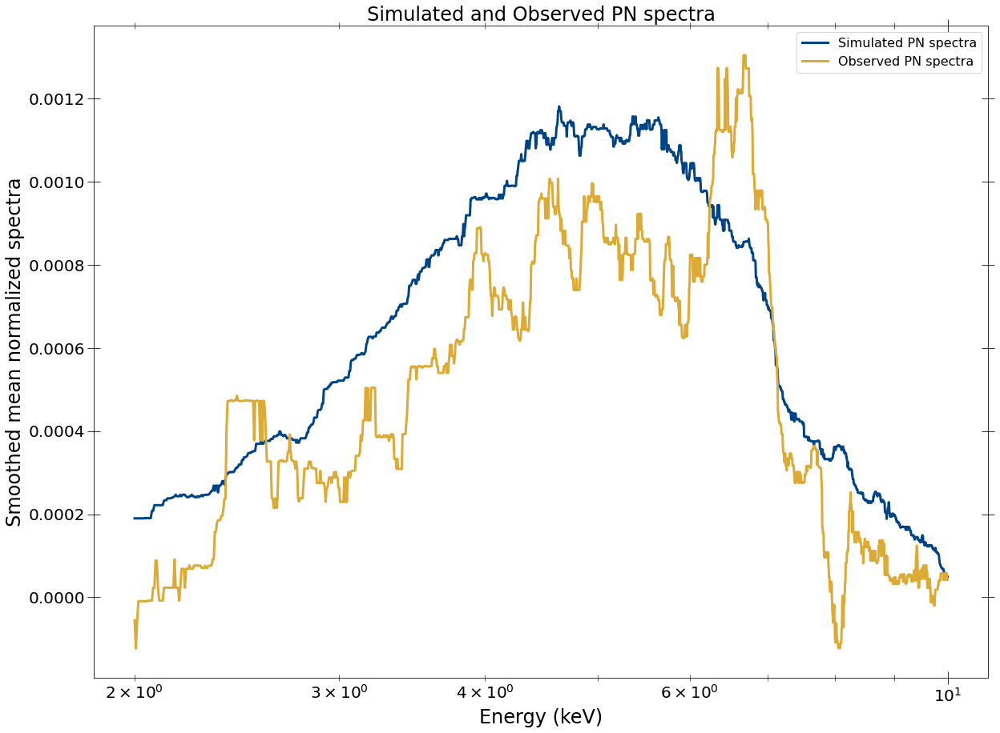

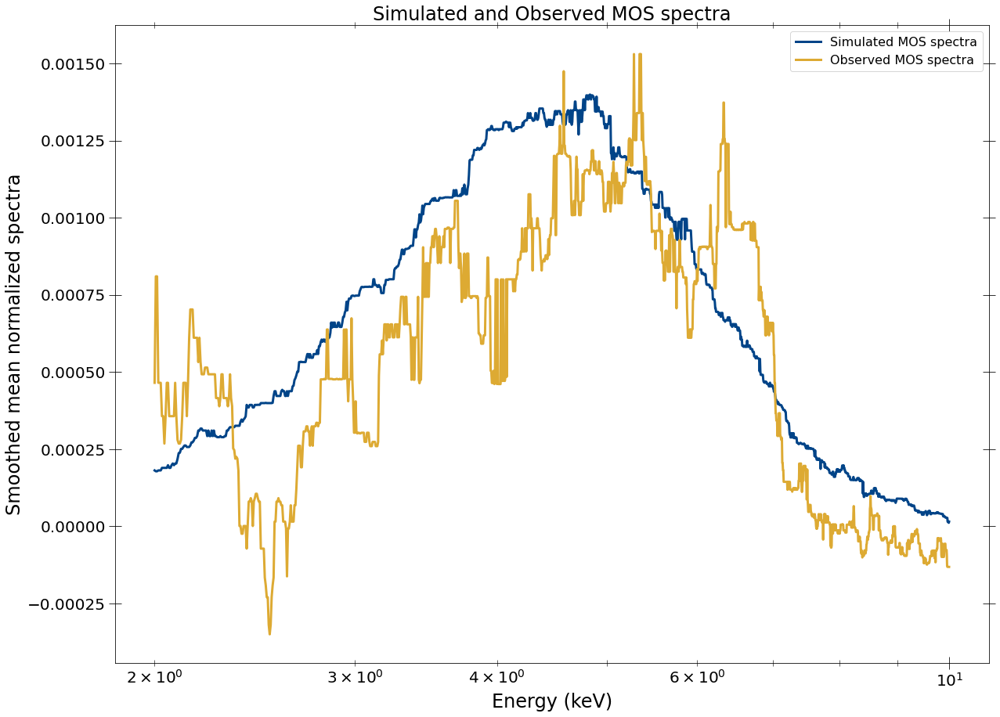

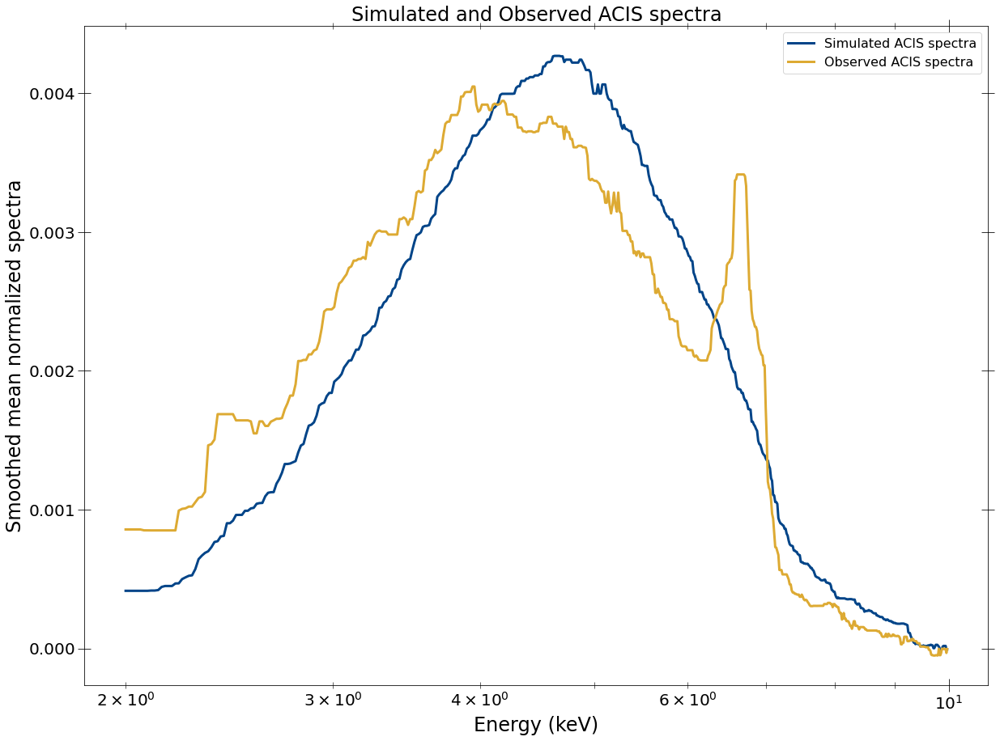

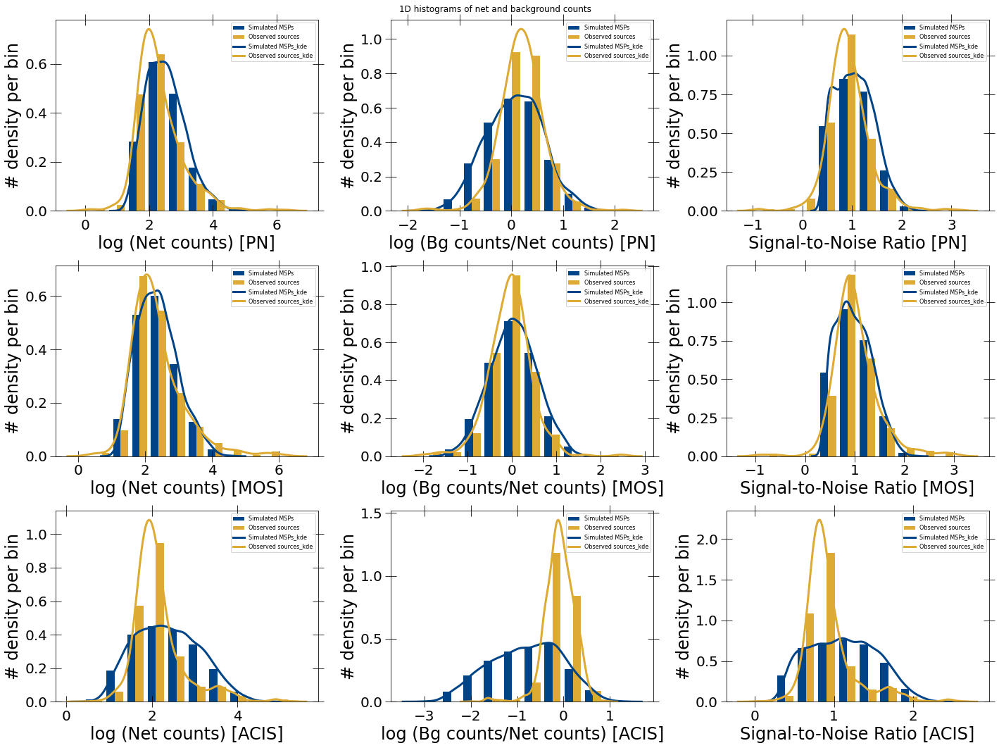

In [340]:
spec_summary = load_alldata(
     [pn_response_path, mos_response_path, chandra_response_path],
     [xmm_sim_path, xmm_sim_path, chandra_sim_path],
     [xmm_obs_path, xmm_obs_path, chandra_obs_path], en_range=[2, 10])

In [26]:
def fit_src_pl_gauss(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder + 'ip_' +
                                 str(source_num) + '_PN.fak')
        spec_mosfile = glob2.glob(src_folder + 'ip_' +
                                  str(source_num) + '_MOS.fak')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        #os.chdir(src_folder + '/' + source_num)
        spec_file = 'ip_' + str(source_num) + '.fak'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')
    
    model = xspec.Model('tbabs*(pegpwrlw+gauss)')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 5, 5]
    model.pegpwrlw.eMin.values = '2.0'
    model.pegpwrlw.eMax.values = '10.0'
    model.gaussian.LineE.values = '6.7, 0.0001, 6.1, 6.1, 7.3, 7.3'
    model.gaussian.Sigma.values = '0.1 0'
    model.gaussian.norm.values = '1.0E-5, 0.001,,,,'
    
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.query = 'yes'
    xspec.Fit.perform()
    xspec.Fit.error('2.706 6')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 8')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 6')
    xspec.Fit.error('2.706 8')
    #goodness = xspec.Fit.goodness(1000)
    goodness = 50.0
    line_pos_low = xspec.AllModels(1).gaussian.LineE.error[0]
    line_pos_high = xspec.AllModels(1).gaussian.LineE.error[1]
    line_norm_low = xspec.AllModels(1).gaussian.norm.error[0]
    line_norm_high = xspec.AllModels(1).gaussian.norm.error[1]
    print('Model params for ' + str(source_num) +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0],
          ' Fe_pos:', xspec.AllModels(1).gaussian.LineE.values[0],
          line_pos_low, line_pos_high,
          ' Fe_norm:', xspec.AllModels(1).gaussian.norm.values[0],
          line_norm_low, line_norm_high)
    print('Fit stats for ' + str(source_num) + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0],
             xspec.AllModels(1).gaussian.LineE.values[0], line_pos_low,
             line_pos_high,
             xspec.AllModels(1).gaussian.norm.values[0], line_norm_low,
             line_norm_high])


20:9: E265 block comment should start with '# '
27:1: W293 blank line contains whitespace
36:1: W293 blank line contains whitespace
48:5: E265 block comment should start with '# '
66:80: E501 line too long (80 > 79 characters)


In [27]:
def fit_src_pl(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder + 'ip_' +
                                 str(source_num) + '_PN.fak')
        spec_mosfile = glob2.glob(src_folder + 'ip_' +
                                  str(source_num) + '_MOS.fak')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        #os.chdir(src_folder + '/' + source_num)
        spec_file = 'ip_' + str(source_num) + '.fak'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')

    model = xspec.Model('tbabs*pegpwrlw')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 5, 5]
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.perform()
    xspec.Fit.error('2.706 2')
    xspec.Fit.perform()
    print('Calculating goodness')
    #goodness = xspec.Fit.goodness(1000)
    print('Finished calculating goodness')
    goodness = 50.0
    print('Model params for ' + str(source_num) +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0])
    print('Fit stats for ' + str(source_num) + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    if telescope == 'Chandra':
        os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0]])

20:9: E265 block comment should start with '# '
38:5: E265 block comment should start with '# '
50:80: E501 line too long (80 > 79 characters)


array([1260, 2375, 5933, 2930, 1209, 1344,  654, 1335, 9663,  261, 5707,
       4938, 8477, 8878, 9124, 5654, 8147, 7095, 1570, 8075, 8612, 7059,
        653, 3031, 1481, 3502, 5333, 8768, 9161, 9176, 5760, 1571, 7922,
       3337, 3514, 9312, 9124,  304, 3387, 2301, 9055, 1439, 8539, 3632,
       8645, 3481, 4731, 4900, 7008, 5171, 1260, 5046, 1335, 1962, 5045,
       7635, 9977, 4077, 8584, 4028, 5457, 6603, 3975, 3537, 6526, 3812,
       8911, 2653, 5183, 9964, 5051, 8218, 9378, 8114, 6184, 6441, 7879,
       2903, 2246,  559, 3263, 1544, 4819, 9798, 4538, 3136, 4131, 5417,
       3233, 1956, 9358, 5980, 6368, 8071, 9655, 5118, 9770,  544, 4353,
       4943,  927, 8123, 7508, 6935, 6184, 1672, 9655, 8371, 3284, 3120,
       1342, 3337, 5038, 9973, 4449, 4319, 3238, 2541, 2566, 9977, 2623,
       3234, 3659, 8482, 8584, 3565, 6891, 6730, 4950, 7896, 7142, 7948,
       3895, 3154, 8293, 6131,  153,  101, 9220, 3488, 8477, 7599, 8023,
       9567,  173, 9316, 9046, 1126, 6953, 3824, 73

In [154]:
fit_src_pl_gauss(int_srcs_subset[0][2], src_folder='./') #, telescope='Chandra')

Model params for 687: NH =  13.77877748184863  Gamma:  0.971793682930924  norm:  0.6099068919760459  Fe_pos: 6.45114713036861 6.253156014309786 6.736573713132607  Fe_norm: 1.5371355005717835e-06 3.825412216446349e-07 2.8436660485044743e-06
Fit stats for 687:  447.95957499588513 -8.450015973373384 50.0 389




([687, 447.95957499588513, -8.450015973373384, 50.0, 389],
 [687,
  13.77877748184863,
  0.971793682930924,
  0.6099068919760459,
  6.45114713036861,
  6.253156014309786,
  6.736573713132607,
  1.5371355005717835e-06,
  3.825412216446349e-07,
  2.8436660485044743e-06])

1:57: E261 at least two spaces before inline comment
1:58: E262 inline comment should start with '# '


In [165]:
xspec.AllData.clear()
os.chdir('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/sim_ips_highnh_xu2016_twice_ew/')

In [240]:
import xspec

In [166]:
os.getcwd()

'/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/sim_ips_highnh_xu2016_twice_ew'

In [167]:
pn_fit_stats_table_pl_g = []
pn_model_params_table_pl_g = []
pn_fit_stats_table_pl_g2 = []
pn_model_params_table_pl_g2 = []

for source_num in interested_srcs_alldet[0]:
    print(source_num)
    fit_stats, model_params = fit_src_pl_gauss(source_num)
    fit_stats2, model_params2 = fit_src_pl_gauss2(source_num)
    pn_fit_stats_table_pl_g.append(fit_stats)
    pn_model_params_table_pl_g.append(model_params)
    pn_fit_stats_table_pl_g2.append(fit_stats2)
    pn_model_params_table_pl_g2.append(model_params2)

4
Model params for 4: NH =  12.939033847759466  Gamma:  1.0495576273168419  norm:  0.7747105116913852  Fe_pos: 6.748569160260868 6.532337035259101 6.869068775817018  Fe_norm: 3.766184296667683e-06 2.0606292616486243e-06 5.708229440339099e-06
Fit stats for 4:  608.0728758029844 -10.024847085127355 50.0 564


Model params for 4: NH =  13.31158617384433  Gamma:  1.1606080899058462  norm:  0.7599683504249126  Fe_norms: 1.8460838584452523e-06 6.809398509499901e-07 3.184936867488509e-06 1.879182548933315e-06 6.833303364749949e-07 3.2692277285624898e-06 1.3875566644130817e-06 1.3954828608759118e-07 2.866092411796909e-06
Fit stats for 4:  607.150405764337 -10.34706214159795 50.0 563


6
Model params for 6: NH =  10.872950013804475  Gamma:  0.18826649369238468  norm:  0.270192916482999  Fe_pos: 6.438601603941166 6.298739280384795 6.666610327363354  Fe_norm: 1.243565643207551e-06 1.7825920116375028e-07 2.49240623607601e-06
Fit stats for 6:  772.6123327639315 -7.175178161764938 50.0 780


Model p

Model params for 354: NH =  12.397348451281392  Gamma:  1.6037495288627164  norm:  0.1447755708590061  Fe_pos: 6.513332174912184 6.397280569334253 6.62715050192552  Fe_norm: 1.0734440671919278e-06 4.469356930589469e-07 1.833990962894077e-06
Fit stats for 354:  353.7939778815429 -7.344331176772367 50.0 331


Model params for 354: NH =  13.451500370090058  Gamma:  1.8417855073300353  norm:  0.14658335082849064  Fe_norms: 7.000680666567744e-07 2.2436673689324935e-07 1.3095558130213283e-06 4.885103611827293e-07 4.3642082808494504e-08 1.0712508159075655e-06 2.5085225445787014e-07 0.0 8.168360261074328e-07
Fit stats for 354:  353.08928874313176 -7.3440642713271425 50.0 330


358
Model params for 358: NH =  17.44309400008306  Gamma:  0.00013109920554671227  norm:  0.23419969735774512  Fe_pos: 6.484277009392724 6.361374148516887 6.593613698691068  Fe_norm: 1.4569773414618727e-06 4.612927066029862e-07 2.846819851265798e-06
Fit stats for 358:  1083.1207208387953 -4.971049590785528 50.0 999


Mod

Model params for 734: NH =  19.104411585861012  Gamma:  0.8585985762674615  norm:  0.2057192034291874  Fe_pos: 6.733648365065792 6.611662767862401 6.857815509271095  Fe_norm: 1.1029238437910473e-06 4.3599313587573574e-07 2.0173891393946246e-06
Fit stats for 734:  365.30133861171134 -7.802138691551781 50.0 344


Model params for 734: NH =  20.150585443016976  Gamma:  0.9568695418844867  norm:  0.20935713060018155  Fe_norms: 1.6719702256335833e-16 0.0 3.7401592707190643e-07 8.911930285408799e-07 3.476274792465444e-07 1.6656442769781652e-06 3.9653123464241726e-07 0.0 1.030357838038925e-06
Fit stats for 734:  363.7249047167329 -7.878118271638794 50.0 343


750
Model params for 750: NH =  18.297976790065697  Gamma:  3.4339831462129333  norm:  0.23418805233488948  Fe_pos: 6.3484276018581465 0.0 0.0  Fe_norm: 4.3461049455905434e-07 0.0 1.733143389260553e-06
Fit stats for 750:  629.9890972043061 -4.9491815448261285 50.0 634


Model params for 750: NH =  16.183009206058905  Gamma:  2.9585786885

Model params for 901: NH =  71.77754983477631  Gamma:  1.7428394805559464  norm:  1.90788457777365  Fe_pos: 6.621059905019018 6.340847475570749 6.753605462113197  Fe_norm: 5.712534902153973e-06 1.5290464176945757e-06 1.1298207847460816e-05
Fit stats for 901:  1023.3441643488607 -6.72184033994282 50.0 942


Model params for 901: NH =  34.79697461446027  Gamma:  1.559006120788924e-06  norm:  0.8319225051829691  Fe_norms: 2.550251048929134e-06 5.573750723073422e-07 4.968584624247481e-06 3.193251272956071e-06 1.0613864957360453e-06 5.740059883488155e-06 1.0142678926937749e-21 0.0 1.507306869288585e-06
Fit stats for 901:  1025.070812903105 -6.485585214890648 50.0 941


903
Model params for 903: NH =  20.411377880266603  Gamma:  3.5556795250277995  norm:  0.07692334081952198  Fe_pos: 6.100000012294522 0.0 0.0  Fe_norm: 2.0153511923340297e-07 0.0 7.089514810150318e-07
Fit stats for 903:  1111.7610839540976 -5.465748290238253 50.0 1080


Model params for 903: NH =  16.901941793500196  Gamma:  

Model params for 1031: NH =  19.447493552678882  Gamma:  1.6102251799767382  norm:  0.4692852181123751  Fe_pos: 6.422401823992017 6.302412644152778 6.548373895191463  Fe_norm: 2.2245414118823437e-06 8.55271138870471e-07 3.853681321694198e-06
Fit stats for 1031:  344.4283533951025 -7.356839953119435 50.0 312


Model params for 1031: NH =  20.56873016499358  Gamma:  1.8160563671810077  norm:  0.48141049486782733  Fe_norms: 1.975526378422628e-06 7.925618102981641e-07 3.417767621520864e-06 1.9003287514520714e-07 0.0 1.3893816700921144e-06 8.78846070244652e-07 0.0 2.2881754358618614e-06
Fit stats for 1031:  342.92433019275734 -7.373104175433092 50.0 311


1053
Model params for 1053: NH =  9.811168428861913  Gamma:  1.0501000456626806  norm:  0.24950874919886892  Fe_pos: 6.7784708557357405 6.630888399481981 6.988639533400402  Fe_norm: 1.34737306445741e-06 1.7912838755004675e-07 2.729988388876901e-06
Fit stats for 1053:  692.9709810958097 -6.76328874458939 50.0 675


Model params for 1053: NH

Model params for 1373: NH =  21.06107196764266  Gamma:  2.177122740303469  norm:  1.5767556618021514  Fe_norms: 1.4447083915235133e-06 0.0 4.896515111328839e-06 2.449070478228654e-06 0.0 6.00930812754281e-06 3.9861998525353595e-11 0.0 3.1917256901741225e-06
Fit stats for 1373:  1021.8481966403683 -6.035782405930907 50.0 1095


1378
Model params for 1378: NH =  33.15010564757058  Gamma:  2.0971583271123744  norm:  1.1243882113480113  Fe_pos: 6.5863260986814565 0.0 0.0  Fe_norm: 1.5083530116044988e-06 0.0 4.76483705764168e-06
Fit stats for 1378:  909.4989704762288 -5.214527538125255 50.0 1682


Model params for 1378: NH =  32.97379313097025  Gamma:  2.1137747994540668  norm:  1.113004144819309  Fe_norms: 8.748603769055591e-07 0.0 3.4888458214805417e-06 1.212531986953943e-06 0.0 3.897027434239805e-06 9.878888188688021e-14 0.0 2.1385493930115902e-06
Fit stats for 1378:  909.0050114611711 -5.225539636486125 50.0 1681


1405
Model params for 1405: NH =  38.9615819400194  Gamma:  1.3257713438

Model params for 1654: NH =  13.323585900219705  Gamma:  1.2487032078423488  norm:  0.09466089387023477  Fe_norms: 6.881452106499184e-08 0.0 3.413285543933644e-07 3.1621645884346823e-07 5.4264655179968464e-08 6.450198925878183e-07 1.830831457286414e-07 0.0 5.027372348216398e-07
Fit stats for 1654:  408.6140729828827 -7.2333296157725835 50.0 375


1659
Model params for 1659: NH =  25.60266229278362  Gamma:  2.2172199489712985  norm:  0.5947864485012958  Fe_pos: 6.4990947821049 6.407631194476087 6.592055656392444  Fe_norm: 1.651319356023511e-06 7.166474293755712e-07 2.7323263426554567e-06
Fit stats for 1659:  839.777673440072 -7.632669279100436 50.0 779


Model params for 1659: NH =  26.036074227675456  Gamma:  2.2701482116527325  norm:  0.6071448060120672  Fe_norms: 9.287716414921058e-07 2.0007542273248762e-07 1.7941389721765943e-06 3.638717137186196e-07 0.0 1.147481682673671e-06 4.82068679721465e-07 0.0 1.340595204645542e-06
Fit stats for 1659:  843.4008030413255 -7.652261425258641 50.

Model params for 1904: NH =  9.415498765391456  Gamma:  1.4081258179529805  norm:  0.2957731008360866  Fe_norms: 5.83722590140364e-07 1.0082542083438859e-07 1.160675342025928e-06 6.017245708513691e-07 9.244066818114211e-08 1.2164690926689483e-06 4.625456001449513e-07 0.0 1.12894301504969e-06
Fit stats for 1904:  769.7812571656349 -8.41149684383803 50.0 703


1913
Model params for 1913: NH =  14.017434639189473  Gamma:  1.337158884237342  norm:  0.37209163920332455  Fe_pos: 6.620634379843619 0.0 0.0  Fe_norm: 1.0122417791125093e-06 0.0 2.4273446100862503e-06
Fit stats for 1913:  214.36418364147886 -7.4646484078297375 50.0 187


Model params for 1913: NH =  15.142640483178672  Gamma:  1.5439211735291176  norm:  0.3761425292821855  Fe_norms: 3.8082457729652694e-07 0.0 1.54092732174741e-06 6.708608558372093e-07 0.0 1.977624484124123e-06 7.628207406088495e-07 0.0 2.1063055965887773e-06
Fit stats for 1913:  213.279062920873 -7.3877105086133446 50.0 186


1933
Model params for 1933: NH =  8.6

Model params for 2173: NH =  16.350706747306557  Gamma:  2.3530981909924016  norm:  0.19482019511326287  Fe_norms: 1.3288019630519258e-06 7.084885871106128e-07 2.094760630320585e-06 7.138901438675481e-07 1.315960452286956e-07 1.4332519777884476e-06 1.242552736567947e-07 0.0 7.398853059439217e-07
Fit stats for 2173:  732.1985894832044 -9.073530129697879 50.0 737


2202
Model params for 2202: NH =  57.3549211489472  Gamma:  2.240274872063259  norm:  1.9036401378140155  Fe_pos: 6.585213682665148 6.516316799204643 6.654811601758566  Fe_norm: 9.052391903011939e-06 5.922623745289912e-06 1.2909949279053428e-05
Fit stats for 2202:  160.5453570370055 -6.5635506612508765 50.0 151


Model params for 2202: NH =  55.1703610728211  Gamma:  2.324832320455109  norm:  1.7770130511089024  Fe_norms: 4.362745888022548e-06 2.1010290772492337e-06 7.154946794271667e-06 5.567441164475422e-06 3.0602630204884723e-06 8.624323831898909e-06 1.973600465724179e-06 7.800678624470463e-08 4.382174286059265e-06
Fit stat

Model params for 2439: NH =  19.58904160125665  Gamma:  0.537695290273818  norm:  0.4373542953572108  Fe_pos: 6.547612429195242 6.409675076826459 6.724863300520107  Fe_norm: 2.4330946773963357e-06 1.2550690344571862e-06 3.846070362558089e-06
Fit stats for 2439:  247.983263985437 -8.61865704909207 50.0 280


Model params for 2439: NH =  19.533831631871482  Gamma:  0.6762339412153957  norm:  0.41269097886385475  Fe_norms: 1.5255154490523499e-06 6.426246447108177e-07 2.596097622280537e-06 1.4978157241421613e-06 4.547356512383264e-07 2.778640066946658e-06 7.887332672501436e-07 0.0 1.9839544190648056e-06
Fit stats for 2439:  242.33196357825196 -8.739756599947066 50.0 279


2444
Model params for 2444: NH =  24.786809982149588  Gamma:  1.7492477864136702  norm:  1.1155324386619632  Fe_pos: 6.714591025364501 6.642256169156474 6.782101873153225  Fe_norm: 6.0197163223491485e-06 3.969392542060783e-06 8.30251814142642e-06
Fit stats for 2444:  637.6038195966787 -9.605605135107282 50.0 590


Model p

Model params for 2621: NH =  18.592022121251173  Gamma:  1.3591065542475722  norm:  1.0175647846819522  Fe_pos: 7.019740922955452 6.731535253662731 7.156124801890252  Fe_norm: 4.299514389475663e-06 1.5008003028281218e-06 7.664747724648672e-06
Fit stats for 2621:  212.66029739226974 -7.233614570664974 50.0 205


Model params for 2621: NH =  18.972715522852855  Gamma:  1.5000176914142378  norm:  0.9996008776438803  Fe_norms: 5.919708089463705e-07 0.0 2.561988418428174e-06 2.4620973596579887e-06 6.302438250020381e-07 4.772211657267439e-06 3.137799183891117e-06 9.517576446349236e-07 5.861690679156158e-06
Fit stats for 2621:  208.58448858315455 -7.237799967355412 50.0 204


2631
Model params for 2631: NH =  12.623559963576344  Gamma:  0.6859627584360333  norm:  0.13958834626081215  Fe_pos: 6.379694749152096 6.204676449257741 6.600941956043824  Fe_norm: 4.525816192464151e-07 9.710668763165423e-08 8.614351745262244e-07
Fit stats for 2631:  1322.3071989241753 -7.300549850985397 50.0 1362


Mod

Model params for 2995: NH =  24.383597486972228  Gamma:  0.37187500326169676  norm:  0.7666134180519881  Fe_pos: 6.986395250283814 6.859698282626062 7.102770124163232  Fe_norm: 4.202438095491089e-06 1.7894306656494497e-06 7.196093364404392e-06
Fit stats for 2995:  272.9862258097697 -7.301659849389412 50.0 263


Model params for 2995: NH =  22.51222101694018  Gamma:  0.3438497152555665  norm:  0.7089750670075099  Fe_norms: 1.1083712575525027e-06 0.0 3.010324129032917e-06 1.2641521300202834e-06 0.0 3.3232492435822786e-06 3.2828832840716622e-06 1.3770999231895469e-06 5.679049613743126e-06
Fit stats for 2995:  270.9743411734154 -7.207321479530948 50.0 262


3032
Model params for 3032: NH =  23.247098998080247  Gamma:  2.7332668427877405  norm:  0.292033153748416  Fe_pos: 6.682217811664152 6.596469686210939 6.765892924292174  Fe_norm: 2.8924140259209565e-06 1.6240639553981525e-06 4.386864371063788e-06
Fit stats for 3032:  822.1449269763106 -7.765144716213084 50.0 1175


Model params for 303

Model params for 3261: NH =  31.936784107435223  Gamma:  1.9666011950323952  norm:  0.6863548715959268  Fe_norms: 1.4206997146832911e-06 4.971908393791668e-07 2.5504694522912075e-06 1.3575040092916588e-06 3.767489706151222e-07 2.560373832614651e-06 1.832565910788337e-06 7.19674499092409e-07 3.2036975437640673e-06
Fit stats for 3261:  275.2365280736291 -8.883675286750561 50.0 301


3265
Model params for 3265: NH =  75.28771923894377  Gamma:  1.747875718177082  norm:  1.071444539035578  Fe_pos: 6.816257077617494 6.716913116880091 6.910806836815716  Fe_norm: 3.365559468035109e-06 1.9799600480492774e-06 4.949301718720578e-06
Fit stats for 3265:  388.39774616485994 -7.855477909457847 50.0 359


Model params for 3265: NH =  70.35086369349402  Gamma:  1.6462023143745155  norm:  0.9250579410540944  Fe_norms: 9.057762909414174e-07 1.898463604876359e-09 1.9141014272743152e-06 1.8415136528984708e-06 8.775675282238973e-07 2.975277602825805e-06 1.7240487769847157e-06 8.127993144966269e-07 2.8061476

Model params for 3407: NH =  20.749264253906475  Gamma:  1.7253639694344907  norm:  0.09168811619068361  Fe_pos: 6.467974540603966 6.319171699253191 6.658840853570425  Fe_norm: 3.875810770444834e-07 6.823864625085182e-08 7.845508735948535e-07
Fit stats for 3407:  866.4365846284456 -6.772614252429373 50.0 932


Model params for 3407: NH =  20.633018432580467  Gamma:  1.6787005044669294  norm:  0.09193858946828  Fe_norms: 2.7935593716327334e-07 2.8190177123778668e-08 6.008390044318264e-07 4.3391351825720226e-08 0.0 3.314362439268106e-07 2.5664057703886306e-12 0.0 2.847051504535269e-07
Fit stats for 3407:  867.0935428427424 -6.77248314782529 50.0 931


3497
Model params for 3497: NH =  499.9998339074826  Gamma:  4.999999497521024  norm:  6.219006444990212e-05  Fe_pos: 6.100000497113731 0.0 0.0  Fe_norm: 7.884667071300496e-13 0.0 0.0009042470965965613
Fit stats for 3497:  1300.6205212174023 -1.5354571520840008 50.0 2822


Model params for 3497: NH =  500.0  Gamma:  5.0  norm:  3.1206147426

Model params for 3787: NH =  9.02478524924577  Gamma:  1.349822745509276  norm:  0.17600357754556822  Fe_pos: 7.1285658558683815 6.652455764911067 0.0  Fe_norm: 8.293043480655527e-07 8.31585436119909e-08 1.7788041864441012e-06
Fit stats for 3787:  485.6693617028716 -7.817563798173961 50.0 538


Model params for 3787: NH =  8.670460199962735  Gamma:  1.3107422600325065  norm:  0.17289241441455513  Fe_norms: 4.685961640325894e-08 0.0 5.913143108059912e-07 2.8993697947695225e-07 0.0 9.139576479004789e-07 4.5580174593115615e-07 0.0 1.1429882733932927e-06
Fit stats for 3787:  486.3371537513799 -7.856263374490259 50.0 537


3788
Model params for 3788: NH =  32.319912389801125  Gamma:  1.3194829961918741  norm:  0.7382250280082316  Fe_pos: 6.629150007491202 6.543913459498541 6.713588242898607  Fe_norm: 4.94438201782504e-06 2.854652254384806e-06 7.446252024860017e-06
Fit stats for 3788:  1268.6153947914377 -6.244573545170534 50.0 1739


Model params for 3788: NH =  32.85169488056549  Gamma:  1

Model params for 4259: NH =  69.35237390421686  Gamma:  3.3732301883690394  norm:  0.7104861336851739  Fe_norms: 7.419657529543137e-07 1.0532214037322593e-07 1.893597335411274e-06 9.675979806826337e-08 0.0 8.598048652421143e-07 9.48561129480704e-08 0.0 8.486710501844217e-07
Fit stats for 4259:  277.42791898753416 -7.9515418120146055 50.0 334


4277
Model params for 4277: NH =  56.401246967477256  Gamma:  2.000122542780263  norm:  0.8168985666862485  Fe_pos: 6.227368903894381 0.0 6.365298560784699  Fe_norm: 3.529792543825063e-06 1.6768761275520352e-06 6.021446819674593e-06
Fit stats for 4277:  324.4231914396448 -7.407422635428206 50.0 322


Model params for 4277: NH =  63.725081281348395  Gamma:  2.3900612648839585  norm:  1.090751221319399  Fe_norms: 1.903216835418939e-06 4.1561925815343903e-07 3.8412908971545084e-06 1.4398895817687526e-07 0.0 1.5643735592056582e-06 9.622800282449766e-07 0.0 2.568822031754082e-06
Fit stats for 4277:  329.091065360259 -6.981860936651375 50.0 321


4322


Model params for 4723: NH =  39.28087922833054  Gamma:  3.833934771856503  norm:  0.19420969207172878  Fe_norms: 4.6764900065801855e-21 0.0 2.4064998019840996e-07 2.414033492392533e-07 0.0 6.258899250387728e-07 1.2380230879760163e-17 0.0 1.8336267469397934e-07
Fit stats for 4723:  989.5343614717417 -7.080415304977294 50.0 978


4802
Model params for 4802: NH =  99.57670730371595  Gamma:  2.9850694908306554  norm:  2.4661464157514748  Fe_pos: 7.2266695930513 6.981087512354899 0.0  Fe_norm: 5.45045546120963e-06 1.438561064386842e-06 1.3226866656153826e-05
Fit stats for 4802:  938.53364440974 -6.854452825962574 50.0 907


Model params for 4802: NH =  82.22857316766094  Gamma:  2.281798824037469  norm:  1.3582769704022715  Fe_norms: 9.135104010523185e-08 0.0 1.621392161381403e-06 6.364122575123321e-07 0.0 2.1634308282204153e-06 1.409739310152343e-06 8.003474915956283e-08 3.0421913241895145e-06
Fit stats for 4802:  941.8229428179102 -6.719908032745278 50.0 906


4819
Model params for 4819: 

Model params for 5000: NH =  37.527558549754  Gamma:  1.6622257164967649  norm:  0.14372458562973556  Fe_norms: 1.0541640154690046e-07 0.0 4.936573247366975e-07 2.1930712108754671e-07 0.0 6.508160354345711e-07 3.497348211060936e-07 1.0653047967997558e-08 8.361075249960456e-07
Fit stats for 5000:  706.5434588918349 -5.73582974205421 50.0 691


5022
Model params for 5022: NH =  53.535516753834855  Gamma:  0.4391851889168257  norm:  0.4040573861359059  Fe_pos: 6.481322639630189 6.394843028991154 6.568500095706765  Fe_norm: 2.8213502347917495e-06 1.5957552045670246e-06 4.773338543701348e-06
Fit stats for 5022:  1734.7843384700413 -6.604220521876989 50.0 1669


Model params for 5022: NH =  58.910554417140254  Gamma:  0.5810262749580539  norm:  0.4560347074384174  Fe_norms: 1.7470198818592774e-06 8.147261819344501e-07 3.224420207565095e-06 9.014849705084094e-07 0.0 2.126099027436187e-06 2.1610732746266572e-14 0.0 8.67017365933106e-07
Fit stats for 5022:  1739.2540414201294 -6.534520635541207

Model params for 5242: NH =  7.43737681395719  Gamma:  1.2465230917984513  norm:  0.12737475229154174  Fe_norms: 4.569636342501316e-07 9.33217705059051e-08 8.945493521408306e-07 4.03946967730765e-07 1.864093578744102e-08 8.689834557029699e-07 2.406130807030151e-07 0.0 6.754854543830202e-07
Fit stats for 5242:  868.3352951053896 -8.302450712170943 50.0 876


5270
Model params for 5270: NH =  21.947395724791654  Gamma:  1.2709986481561366  norm:  0.13770036888450665  Fe_pos: 6.457392541977628 6.32560200609956 6.6722437940371595  Fe_norm: 8.085351740876065e-07 2.7773828774426813e-07 1.4928800222273827e-06
Fit stats for 5270:  599.8496287850598 -6.518002436127656 50.0 588


Model params for 5270: NH =  25.00675358659602  Gamma:  1.766648851516291  norm:  0.14511490213487885  Fe_norms: 6.801117065609221e-07 2.336740648880642e-07 1.3506821809396314e-06 4.5063654943822525e-07 4.115351720075239e-08 1.0240693969143962e-06 2.542848425368817e-07 0.0 7.561859224722135e-07
Fit stats for 5270:  595.

Model params for 5507: NH =  43.947689049966854  Gamma:  1.844129112324884  norm:  0.15943307523733619  Fe_pos: 6.612670031397656 6.497825944469216 6.716558956912104  Fe_norm: 4.7490478093825085e-07 2.736429862105492e-07 6.961172942482559e-07
Fit stats for 5507:  2855.27283862226 -7.922545109786209 50.0 2554


Model params for 5507: NH =  43.04341784522672  Gamma:  1.9622634371674104  norm:  0.15489664550823118  Fe_norms: 2.3570177479329175e-07 9.157614831212347e-08 3.9248446287575294e-07 2.78385124718685e-07 1.2152713969677603e-07 4.5012631879654725e-07 2.1405362006939115e-07 7.151265157735049e-08 3.703600262040305e-07
Fit stats for 5507:  2851.527931800232 -7.951956733289814 50.0 2553


5510
Model params for 5510: NH =  18.870604057204037  Gamma:  1.3669977109243647  norm:  0.2222814975482183  Fe_pos: 6.674143638335824 6.46290513199517 6.870226154846536  Fe_norm: 1.6432075566727118e-06 8.053399860490305e-07 2.634035551804922e-06
Fit stats for 5510:  429.9270959918177 -6.8290305632325

Model params for 6023: NH =  36.84311044982193  Gamma:  4.046717226748114  norm:  0.3587652510524786  Fe_pos: 6.206527061062377 0.0 6.394528548148835  Fe_norm: 6.239240838915199e-07 2.570061397402301e-08 1.4257307114279914e-06
Fit stats for 6023:  601.2503223792446 -5.962351422171379 50.0 610


Model params for 6023: NH =  44.324785354911064  Gamma:  4.991337745808938  norm:  0.7190365247911522  Fe_norms: 2.196353686405921e-07 0.0 7.723497293125749e-07 6.484372899949639e-08 0.0 6.056700808823358e-07 9.686169681492011e-07 3.8118760873044605e-07 1.6496130802981821e-06
Fit stats for 6023:  595.1461778824059 -5.4021108883501725 50.0 609


6054
Model params for 6054: NH =  56.96382589248825  Gamma:  1.3066862093359344  norm:  0.33242235246270724  Fe_pos: 6.292996582333657 0.0 0.0  Fe_norm: 9.302512668743213e-07 0.0 2.2296107858856215e-06
Fit stats for 6054:  366.89157688659924 -7.596560093216356 50.0 359


Model params for 6054: NH =  57.30700414824893  Gamma:  1.399864014301549  norm:  0.3

Model params for 6252: NH =  101.95074675616226  Gamma:  3.750180430853976  norm:  0.6858238371087012  Fe_pos: 6.388000474614553 6.2217498767897315 6.5648399502551795  Fe_norm: 1.108892421542846e-06 2.1817073053868987e-07 2.832673517157551e-06
Fit stats for 6252:  1442.4279270684367 -6.5863028833696875 50.0 1297


Model params for 6252: NH =  102.92497637715695  Gamma:  3.9794553051144157  norm:  0.7933960203745803  Fe_norms: 8.595588147268688e-07 1.4741473949945897e-07 2.2780819685218977e-06 1.0248030239084151e-07 0.0 8.310992288694798e-07 3.0083842418344546e-07 0.0 1.0283472039807119e-06
Fit stats for 6252:  1442.171299856768 -6.760811730049685 50.0 1296


6267
Model params for 6267: NH =  31.93054504162152  Gamma:  1.9972469806342898  norm:  1.307462943656618  Fe_pos: 6.567271539990885 0.0 0.0  Fe_norm: 2.203860495354152e-06 0.0 5.168619159258372e-06
Fit stats for 6267:  179.18740778268935 -8.189556887250653 50.0 198


Model params for 6267: NH =  31.91887386395286  Gamma:  1.977411

Model params for 6452: NH =  16.69039816788577  Gamma:  2.5638455371882642  norm:  0.0691657872231362  Fe_pos: 6.792465406631514 6.568656273798983 7.107560722147623  Fe_norm: 2.706515704450032e-07 0.0 6.226461729176776e-07
Fit stats for 6452:  499.81388793218866 -7.326437841020296 50.0 529


Model params for 6452: NH =  15.40821098812411  Gamma:  2.2939921506201792  norm:  0.06498316387365931  Fe_norms: 1.800730634628031e-12 0.0 1.4784752150121157e-07 1.5837017408817362e-07 0.0 4.4870458119172404e-07 3.906372254337942e-15 0.0 2.5336793703158875e-07
Fit stats for 6452:  501.30781230843957 -7.468040087327046 50.0 528


6456
Model params for 6456: NH =  9.481249367119439  Gamma:  1.1410028318366994  norm:  0.3081735382235325  Fe_pos: 6.779847350538533 6.666471843286353 6.892794928633977  Fe_norm: 1.8975682474714011e-06 7.9426418000015e-07 3.223561067520306e-06
Fit stats for 6456:  415.14239027008875 -7.108761124806633 50.0 416


Model params for 6456: NH =  9.473406217318527  Gamma:  1.13

Model params for 6748: NH =  23.016543248245085  Gamma:  1.520485952267308  norm:  1.0675780881266348  Fe_pos: 6.795054915032367 6.685969690328572 6.8906462779082736  Fe_norm: 4.0520438588792515e-06 1.6402126672661613e-06 6.9341962151437686e-06
Fit stats for 6748:  166.37419300100132 -7.853227220370706 50.0 186


Model params for 6748: NH =  23.188607320363076  Gamma:  1.5796276271752412  norm:  1.061480611726899  Fe_norms: 9.559740992955264e-07 0.0 2.8933063945242274e-06 2.7659120942393466e-06 9.447910614734979e-07 5.01510367058232e-06 1.1410010586846146e-06 0.0 3.2741841511034216e-06
Fit stats for 6748:  166.81970925109218 -7.8112132147122155 50.0 185


6787
Model params for 6787: NH =  21.348936547036885  Gamma:  1.067408148487318  norm:  0.29098556991984503  Fe_pos: 6.488430599371709 6.364780160995299 6.626618975473575  Fe_norm: 1.38138448366509e-06 5.504953401588386e-07 2.3639321220312333e-06
Fit stats for 6787:  365.6722893037354 -7.988202902234365 50.0 372


Model params for 678

Model params for 7045: NH =  17.43139058499878  Gamma:  1.1694682932549523  norm:  0.3881053195653367  Fe_norms: 1.1411345298499526e-06 9.332109366596058e-08 2.5629042047067898e-06 7.073854123296195e-07 0.0 2.1520582864580566e-06 9.587616054963629e-13 0.0 1.1534831421014075e-06
Fit stats for 7045:  550.5793603365303 -5.663512975531854 50.0 573


7076
Model params for 7076: NH =  7.240182837118958  Gamma:  6.649137801697405e-07  norm:  0.11183398723787412  Fe_pos: 6.932035731511478 6.838527251280123 7.027420366216645  Fe_norm: 1.243339904712947e-06 6.336277495940463e-07 1.937942948839624e-06
Fit stats for 7076:  549.8970056832385 -7.051101284724618 50.0 520


Model params for 7076: NH =  4.897565991654242  Gamma:  0.0014079230299596976  norm:  0.09536499171463213  Fe_norms: 3.980745280246646e-07 0.0 8.630648995112315e-07 4.0739454261015485e-07 0.0 9.206424169036367e-07 1.0586585301185982e-06 5.624833300510857e-07 1.6567552491672714e-06
Fit stats for 7076:  543.8725793772211 -7.476282356

Model params for 7266: NH =  29.114333101962572  Gamma:  2.283919717370653  norm:  0.26645635418606634  Fe_norms: 9.0090649611924e-07 2.860037962173474e-07 1.7025151358788146e-06 1.7556134523741794e-07 0.0 7.898702798455195e-07 1.2136730544387773e-18 0.0 4.468065207898305e-07
Fit stats for 7266:  429.86553053770524 -6.928021975932244 50.0 433


7270
Model params for 7270: NH =  36.573200173497064  Gamma:  1.8981970771121466  norm:  0.5742166356105973  Fe_pos: 6.262271670563808 6.15281832493895 6.375990950074108  Fe_norm: 2.429412563874569e-06 9.82409907956338e-07 4.224694052859124e-06
Fit stats for 7270:  619.8924407594726 -6.166682550721127 50.0 717


Model params for 7270: NH =  38.74304751670075  Gamma:  2.0340195884682655  norm:  0.6341397586015183  Fe_norms: 1.3573889210020755e-06 2.482012209776166e-07 2.765524139999074e-06 6.151497183877289e-07 0.0 1.9352418761442306e-06 2.165781119353428e-07 0.0 1.4180605718700272e-06
Fit stats for 7270:  623.3293877362258 -6.279169035750421 50.

Model params for 7636: NH =  118.0482095779224  Gamma:  3.064665482526224  norm:  2.857809035199772  Fe_norms: 2.7073361491659935e-06 0.0 7.476019415361892e-06 1.0702263508381354e-19 0.0 1.8088381289608847e-06 1.1491289607714888e-06 0.0 4.1975631157189145e-06
Fit stats for 7636:  456.507596744041 -7.0574950249690325 50.0 477


7650
Model params for 7650: NH =  25.516170769087573  Gamma:  1.6167278930120572  norm:  0.5493654236158706  Fe_pos: 6.46383767540371 6.39306804936319 6.530312627156808  Fe_norm: 6.159547412030813e-06 3.600025713200744e-06 9.391478341871577e-06
Fit stats for 7650:  162.31661800128586 -7.531562649798243 50.0 200


Model params for 7650: NH =  25.345351765911413  Gamma:  1.575541354745456  norm:  0.5491492750611126  Fe_norms: 3.986062342471318e-06 2.0777621150366318e-06 6.573283749659617e-06 2.0034986639691576e-06 0.0 4.556517428550432e-06 2.1734629101849666e-17 0.0 1.79455993421347e-06
Fit stats for 7650:  161.76367193222205 -7.532180667724633 50.0 199


7651
Mode

Model params for 7834: NH =  42.069957133980736  Gamma:  1.4499377132674482  norm:  0.48966285275403837  Fe_norms: 1.3364943287720275e-06 4.4390193171858243e-07 2.433918823232304e-06 1.2234758024581128e-06 3.955176148864849e-07 2.2624666859718103e-06 1.007172067105094e-06 1.4173666756233975e-07 2.103846023592828e-06
Fit stats for 7834:  392.57448391408786 -6.338098591360765 50.0 360


7891
Model params for 7891: NH =  72.92303329550012  Gamma:  1.7158665223888538  norm:  0.5328894542899125  Fe_pos: 6.578511012474276 6.122887837507388 0.0  Fe_norm: 1.1978838502372457e-06 0.0 2.8463311841263483e-06
Fit stats for 7891:  1148.0263828537898 -7.073498751717229 50.0 1330


Model params for 7891: NH =  41.69953818879328  Gamma:  5.147902231045513e-07  norm:  0.2712670444742248  Fe_norms: 3.5179722988997563e-07 0.0 1.0806093949462693e-06 4.820300585213097e-07 0.0 1.3136775702896969e-06 2.0696176067562782e-23 0.8224962005991274 0.0
Fit stats for 7891:  1153.1103918708668 -6.318361388832476 50.0 

Model params for 8059: NH =  41.2127309830448  Gamma:  1.7168663355925016  norm:  0.25360723513026046  Fe_pos: 6.638005910554834 6.269618421529757 7.299006286995825  Fe_norm: 7.042198292546719e-07 1.639357187100529e-10 1.5962150070773786e-06
Fit stats for 8059:  491.0315475174149 -6.534132731130913 50.0 537


Model params for 8059: NH =  42.15479137442315  Gamma:  2.083629217654135  norm:  0.2619482688017952  Fe_norms: 2.82107590952887e-07 0.0 9.585212029682237e-07 5.655510063413397e-07 2.1597297868803888e-08 1.3217536879610555e-06 5.371477324155618e-07 2.636198946181808e-08 1.2670265702164666e-06
Fit stats for 8059:  488.02169324866384 -6.636797445765928 50.0 536


8102
Model params for 8102: NH =  11.63760173590215  Gamma:  1.403042405157975  norm:  0.10607729195482166  Fe_pos: 7.299998782954432 0.0 0.0  Fe_norm: 1.9691751616640982e-07 0.0 8.003934693331839e-07
Fit stats for 8102:  699.8827249206979 -7.1481849788578575 50.0 651


Model params for 8102: NH =  11.540335887083792  Gamma

Model params for 8357: NH =  38.36179958824507  Gamma:  1.3505986179812486  norm:  0.42298493840991325  Fe_pos: 6.512215515667916 6.383683095421112 6.644263333853657  Fe_norm: 1.916843583590132e-06 8.728610728146367e-07 3.1708606699400185e-06
Fit stats for 8357:  650.130955553388 -8.01045522476109 50.0 618


Model params for 8357: NH =  37.67696203952633  Gamma:  1.3546579168813038  norm:  0.4114509550974305  Fe_norms: 1.2000486225932855e-06 4.264772142356993e-07 2.162980349240932e-06 9.746687752636554e-07 1.8813027618506788e-07 1.933675845800032e-06 1.1987368230624858e-13 0.0 5.501544509285915e-07
Fit stats for 8357:  649.2690502364167 -8.014789891178824 50.0 617


8373
Model params for 8373: NH =  33.84804336939228  Gamma:  1.6781625168219083  norm:  0.2338886158738681  Fe_pos: 7.182416970203111 6.27031190584652 0.0  Fe_norm: 6.74489159169587e-07 8.633119574254963e-08 1.5391931949937087e-06
Fit stats for 8373:  1655.4014251874846 -7.656719629681623 50.0 1841


Model params for 8373: 

Model params for 8571: NH =  9.74410724013558  Gamma:  1.1802051239418192  norm:  0.26036937953434325  Fe_pos: 6.713914447206884 0.0 0.0  Fe_norm: 4.638137461393437e-07 0.0 1.1654988853310005e-06
Fit stats for 8571:  834.2960782094963 -9.43037074580867 50.0 810


Model params for 8571: NH =  9.972928461661544  Gamma:  1.2264391687628147  norm:  0.2602661023847788  Fe_norms: 1.4724596315745116e-14 0.0 3.925661875946803e-07 5.185862671370634e-07 3.022961367621266e-08 1.1067220710638587e-06 1.0756071504621946e-07 0.0 7.143928510951213e-07
Fit stats for 8571:  832.751516008113 -9.400410348564316 50.0 809


8576
Model params for 8576: NH =  59.947788166735776  Gamma:  2.599143364501019  norm:  0.2606113354325915  Fe_pos: 6.3508809958704795 0.0 6.657777106818449  Fe_norm: 5.433453917953718e-07 0.0 1.39730438072108e-06
Fit stats for 8576:  978.3438679083947 -6.60240941218797 50.0 870


Model params for 8576: NH =  61.00895528684765  Gamma:  2.6422522222898186  norm:  0.2730394184855958  Fe_no

Model params for 8712: NH =  19.57120281858808  Gamma:  2.034083674064455  norm:  0.25798650355879515  Fe_pos: 6.139108119133316 0.0 0.0  Fe_norm: 6.835832985624449e-07 0.0 1.8280641755213645e-06
Fit stats for 8712:  1249.8773438385806 -5.453060708459626 50.0 2051


Model params for 8712: NH =  19.09809855094287  Gamma:  1.7981883029776953  norm:  0.2623307822450797  Fe_norms: 4.702283528845498e-24 0.8224962005991274 0.0 9.259369816588366e-24 0.8224962005991274 0.0 1.0692260014702769e-08 0.0 8.765993005435246e-07
Fit stats for 8712:  1251.3928638500747 -5.557196629773477 50.0 2050


8728
Model params for 8728: NH =  62.66198303117311  Gamma:  2.2872735264085655  norm:  1.1399726818853224  Fe_pos: 6.698909607963796 6.565169148115421 7.219570180858946  Fe_norm: 3.7465261041892084e-06 7.974718269318972e-07 7.2950247752701715e-06
Fit stats for 8728:  154.43378151361398 -9.066640531102598 50.0 241


Model params for 8728: NH =  63.209472892031  Gamma:  2.309728990458393  norm:  1.1627892885

Model params for 8917: NH =  15.7356693539842  Gamma:  2.497303453825744  norm:  0.023961502790617577  Fe_pos: 7.175415121337752 0.0 0.0  Fe_norm: 1.311089128310037e-07 0.0 4.682817972315649e-07
Fit stats for 8917:  1973.5564717546258 -6.2084125968099775 50.0 2057


Model params for 8917: NH =  12.197389426543372  Gamma:  1.7450012049772987  norm:  0.021111016083199333  Fe_norms: 1.4666345259082255e-13 0.0 1.4524003159161885e-07 3.812379278526264e-17 0.0 1.5204285124149054e-07 4.8032766634541114e-09 0.0 1.8448312756624701e-07
Fit stats for 8917:  1974.556487187016 -6.108985497421661 50.0 2056


8932
Model params for 8932: NH =  12.05367868031827  Gamma:  1.760148131899101  norm:  0.3573091089860728  Fe_pos: 6.48936331534274 6.363524526691102 6.592419350618248  Fe_norm: 2.195535685550117e-06 1.2028381191224605e-06 3.3443220614456865e-06
Fit stats for 8932:  192.11233536038083 -9.30566512771276 50.0 179


Model params for 8932: NH =  12.301206764219646  Gamma:  1.8242792208652319  norm: 

Model params for 9159: NH =  12.741578464652163  Gamma:  0.8104241914979495  norm:  0.445194589838577  Fe_pos: 6.44818442607664 6.361546197235381 6.539303754330653  Fe_norm: 2.0562038798232894e-06 1.1872595915489698e-06 3.011501362173499e-06
Fit stats for 9159:  1184.1650729736173 -9.296035650551568 50.0 1063


Model params for 9159: NH =  13.767365936917185  Gamma:  1.0161723647992473  norm:  0.4394223712192536  Fe_norms: 1.4186648325156054e-06 7.257515648849483e-07 2.1920650532891e-06 4.767794919687839e-07 0.0 1.2440474331696993e-06 1.3020991378853181e-06 5.176142482830569e-07 2.1809676043474315e-06
Fit stats for 9159:  1180.7877485158886 -9.043217968487296 50.0 1062


9178
Model params for 9178: NH =  62.44613060935049  Gamma:  5.7198730103357946e-06  norm:  0.056821743760916074  Fe_pos: 6.389723755689655 6.27399863739266 6.539285832569745  Fe_norm: 4.0053455247373435e-07 1.0374226131333427e-07 1.4753746311979839e-06
Fit stats for 9178:  1485.5213865643348 -4.711727230458753 50.0 14

Model params for 9504: NH =  40.09888355046083  Gamma:  1.8284728661323286  norm:  0.20410104038432575  Fe_norms: 4.7287285274906135e-07 3.1554878117907453e-07 6.45631247912524e-07 1.8992301782996093e-07 2.8401215343534702e-08 3.603403839755482e-07 3.235392311600482e-07 1.6879526749912071e-07 4.910159368192611e-07
Fit stats for 9504:  1868.7608698460574 -8.160387249786309 50.0 1693


9514
Model params for 9514: NH =  22.11302595894537  Gamma:  1.2857883270851982  norm:  0.1459289190404809  Fe_pos: 6.474395668590322 6.340682059235004 6.610843755753767  Fe_norm: 5.445042266483943e-07 1.4612498359794307e-07 1.0202466386408484e-06
Fit stats for 9514:  692.2147481264989 -6.494182539850225 50.0 646


Model params for 9514: NH =  23.53234943902937  Gamma:  1.555594954836533  norm:  0.14807566786868645  Fe_norms: 4.320503663893728e-07 1.0390389632427827e-07 8.398306248136814e-07 5.84604465651164e-08 0.0 4.3392413653410783e-07 4.299789783211577e-07 8.454695338334584e-08 8.632133327706417e-07
Fi

Model params for 9904: NH =  40.19225119332202  Gamma:  1.8508130263427414  norm:  0.21666201707018326  Fe_pos: 6.940266709151435 6.81819753094834 7.07114683043829  Fe_norm: 1.2047644083979708e-06 4.203602107374868e-07 2.112905955908146e-06
Fit stats for 9904:  1033.8289580710557 -6.61764721687714 50.0 974


Model params for 9904: NH =  38.905274240025406  Gamma:  1.659181815189285  norm:  0.20873099502129122  Fe_norms: 2.7988728096160136e-08 0.0 5.845213572444136e-07 1.421361668923565e-07 0.0 7.611038502187356e-07 7.63117562125104e-07 1.7292345116812303e-07 1.6026243193916125e-06
Fit stats for 9904:  1036.0814846553658 -6.6082634705316945 50.0 973


9955
Model params for 9955: NH =  28.237192044985676  Gamma:  1.3234044672915606  norm:  0.4419829850549778  Fe_pos: 6.671910411903602 6.615912414136249 6.738735763919864  Fe_norm: 5.279172006546593e-06 3.5853871968140687e-06 7.313825101553421e-06
Fit stats for 9955:  233.70454652390293 -7.428188519050341 50.0 220


Model params for 9955: 

Model params for 438: NH =  9.815528852903885  Gamma:  0.9851302749514342  norm:  0.39529357907724133  Fe_norms: 4.0976257287419676e-07 0.0 1.2086204017116745e-06 6.96536453264634e-07 0.0 1.5803728188210193e-06 7.583111193260831e-13 0.0 7.304275200314257e-07
Fit stats for 438:  156.3699444475426 -7.178878254848081 50.0 166


454
Model params for 454: NH =  48.10704362513165  Gamma:  2.2130121094628543  norm:  0.14999418912124396  Fe_pos: 6.351069717060502 6.255296128642404 6.445265253715783  Fe_norm: 7.045704843825401e-07 3.2611971313231473e-07 1.2893553376581526e-06
Fit stats for 454:  893.5671328277867 -8.270471388735569 50.0 878


Model params for 454: NH =  53.859839532337965  Gamma:  2.404146095886948  norm:  0.18554208737050698  Fe_norms: 5.310772881060627e-07 2.003410272830426e-07 1.0314722229226281e-06 1.5636135464217772e-17 0.0 1.9593063222730735e-07 2.199237421246523e-08 0.0 3.0589028803557176e-07
Fit stats for 454:  895.9917542679859 -8.268578432769317 50.0 877


455
Model p

Model params for 808: NH =  36.14617439179376  Gamma:  1.357432806569496  norm:  0.23333490922789152  Fe_norms: 1.5523548404423458e-07 0.0 7.157154901884816e-07 1.8589999832734847e-07 0.0 7.523036306725913e-07 5.94606723010193e-12 0.0 5.226585137368897e-07
Fit stats for 808:  1102.00331523918 -6.340447517020334 50.0 1024


841
Model params for 841: NH =  164.11517928864473  Gamma:  4.5000527517508635  norm:  8.900624611043009  Fe_pos: 6.596188750047229 0.0 0.0  Fe_norm: 1.423805150853794e-06 0.0 4.766540193436447e-06
Fit stats for 841:  1307.331958802072 -7.248689454956239 50.0 1196


Model params for 841: NH =  173.12980407424536  Gamma:  4.647625332592984  norm:  11.678750609640016  Fe_norms: 1.410254625632565e-08 0.0 2.821658018341213e-06 4.1297559263094254e-07 0.0 2.903614295515164e-06 1.6988295071035983e-22 0.8224962005991274 0.0
Fit stats for 841:  1307.8416087154385 -7.285845620619355 50.0 1195


863
Model params for 863: NH =  9.700726571336522  Gamma:  1.0797434874655878  norm

Model params for 1140: NH =  34.57983268293864  Gamma:  2.023285957156599  norm:  0.5075758713862143  Fe_norms: 5.813155720091883e-07 0.0 1.522234226785407e-06 3.9826355225511615e-07 0.0 1.354911952270891e-06 1.5035667463827091e-06 6.001839655982072e-07 2.6353265556525058e-06
Fit stats for 1140:  564.9565881254847 -8.504655440413517 50.0 508


1144
Model params for 1144: NH =  38.75013790147222  Gamma:  2.624857191550788  norm:  1.7386340876725972  Fe_pos: 6.538525487794344 6.460745006732213 6.624302970915307  Fe_norm: 1.0007684873513183e-05 6.265714243226051e-06 1.4769095915406724e-05
Fit stats for 1144:  1224.4217968049957 -6.854031965964893 50.0 1681


Model params for 1144: NH =  39.15499455352845  Gamma:  2.754877621798368  norm:  1.7871028792941448  Fe_norms: 5.7738476584817605e-06 2.9573120971051416e-06 9.460188910700345e-06 5.790211172396425e-06 3.0699916296580475e-06 9.297101788923132e-06 4.6177961478703384e-14 0.0 2.367057885764749e-06
Fit stats for 1144:  1221.2753344315192 

Model params for 1363: NH =  12.508049079445783  Gamma:  2.117622937814726  norm:  0.8083341411031277  Fe_norms: 9.89167792984745e-07 0.0 2.703613116773487e-06 1.2574576599299503e-06 0.0 3.139414811353203e-06 2.414359993703388e-07 0.0 2.276800438318334e-06
Fit stats for 1363:  932.7103202278493 -7.773466344767343 50.0 972


1366
Model params for 1366: NH =  34.085852451364296  Gamma:  0.8026096406544952  norm:  0.42277314229329477  Fe_pos: 6.448898135825087 6.272014149628705 6.640945878182594  Fe_norm: 9.64409610689203e-07 2.0098869343445445e-07 1.8192663441189285e-06
Fit stats for 1366:  782.6987467717593 -6.2595842456792745 50.0 743


Model params for 1366: NH =  34.61126821142526  Gamma:  1.0416317175302758  norm:  0.4077016399106962  Fe_norms: 7.927517315595915e-07 2.045555334882953e-07 1.483771513146332e-06 3.818434698277043e-07 0.0 1.0282289889626757e-06 1.057340411781453e-06 3.78948599206701e-07 1.8706896387941104e-06
Fit stats for 1366:  775.3928816793607 -6.2564246992998545 50

Model params for 1589: NH =  52.25593820945019  Gamma:  1.5225279974045496  norm:  1.0910526524551938  Fe_pos: 6.496377345098773 6.457574917248498 6.527625640408921  Fe_norm: 4.287790898441767e-06 3.5589911644932343e-06 5.0493309641888555e-06
Fit stats for 1589:  1406.8151852927613 -10.179827113185437 50.0 1322


Model params for 1589: NH =  51.85619147906249  Gamma:  1.652858576730354  norm:  1.067479865629522  Fe_norms: 2.863095771521564e-06 2.3231442428492916e-06 3.4450414939688563e-06 2.1432669386457064e-06 1.6022834881905294e-06 2.723364951726266e-06 1.066509341620552e-06 5.833349834242503e-07 1.5895343678345517e-06
Fit stats for 1589:  1383.2377217503386 -11.172878030058278 50.0 1321


1618
Model params for 1618: NH =  44.580293159442625  Gamma:  1.5932897018250962  norm:  0.80894731192624  Fe_pos: 6.434472946874049 6.352292673003862 6.518632354051443  Fe_norm: 2.20344584412131e-06 1.0945783211401417e-06 3.4568126041669045e-06
Fit stats for 1618:  485.5905755571075 -7.56464112579

Model params for 1906: NH =  100.53693677700116  Gamma:  2.4311964976595695  norm:  2.158142999045077  Fe_norms: 2.7014992069469597e-06 1.4274168605378946e-06 4.219115509180015e-06 2.0873390568730014e-06 8.964342996824951e-07 3.45913172054671e-06 1.9359126947138286e-06 7.892921621401085e-07 3.2721042064876803e-06
Fit stats for 1906:  907.9857498450851 -7.542107022953481 50.0 813


1920
Model params for 1920: NH =  19.2227179005007  Gamma:  1.2609445264850654  norm:  0.41592423150314717  Fe_pos: 6.488523373141922 6.388341083232454 6.600679575890016  Fe_norm: 2.399456738350657e-06 1.332708925002134e-06 3.6307502142950835e-06
Fit stats for 1920:  247.9492400716954 -7.825704077007223 50.0 250


Model params for 1920: NH =  21.1649939956962  Gamma:  1.659400390784509  norm:  0.4203604830785722  Fe_norms: 1.6601595708248274e-06 8.282518710732452e-07 2.666715275538144e-06 1.319342927112419e-06 4.5775367710276307e-07 2.345923594814958e-06 1.2685443857251802e-06 3.9915507712640486e-07 2.3209479

Model params for 2237: NH =  12.0283716303774  Gamma:  1.545238688695081  norm:  0.07110886017855136  Fe_pos: 7.299999670100553 0.0 0.0  Fe_norm: 2.1747873971514342e-07 0.0 6.290776063774332e-07
Fit stats for 2237:  888.6577000403886 -8.296043576524655 50.0 771


Model params for 2237: NH =  11.326283717407915  Gamma:  1.4542265977485183  norm:  0.06959013886309598  Fe_norms: 4.128934838160774e-14 0.0 1.527878023907751e-07 1.6046717471370981e-15 0.0 2.2407615426996396e-07 1.3992468418032288e-07 0.0 3.9395855335403553e-07
Fit stats for 2237:  888.6526124779016 -8.418884494061494 50.0 770


2242
Model params for 2242: NH =  15.315172912316177  Gamma:  1.145690311103197  norm:  1.0957150653948409  Fe_pos: 6.447549613407725 6.302562967913859 6.606756515092668  Fe_norm: 5.180076796392246e-06 2.298965157112888e-06 8.531904052231663e-06
Fit stats for 2242:  245.82149055290637 -8.62577998055142 50.0 245


Model params for 2242: NH =  15.984750606506841  Gamma:  1.308661399219027  norm:  1.0831

Model params for 2615: NH =  6.57476416025432  Gamma:  0.5024326409829996  norm:  0.06446901680445759  Fe_norms: 1.438850122580541e-07 0.0 5.005731928255651e-07 3.9368766139290286e-07 4.5884478008097505e-08 7.990384059770039e-07 3.7664832265746245e-07 2.5434251918368208e-08 7.898409834725573e-07
Fit stats for 2615:  1160.3575074575747 -7.2537715328264065 50.0 1180


2616
Model params for 2616: NH =  16.407488789209676  Gamma:  3.4618822489874566  norm:  0.012800564015200298  Fe_pos: 6.231461829875587 0.0 6.4008648152356855  Fe_norm: 1.0501891726403823e-07 1.0789535799348725e-08 2.4435276823028557e-07
Fit stats for 2616:  1833.0902473681233 -5.45665054699046 50.0 1759


Model params for 2616: NH =  11.845405111845094  Gamma:  2.4287456668271123  norm:  0.00962250286483126  Fe_norms: 5.183924257466469e-09 0.0 1.1014002124132612e-07 5.0962863866900825e-09 0.0 1.106270224809935e-07 2.9221534709741287e-08 0.0 1.311051518201067e-07
Fit stats for 2616:  1835.7415991920761 -5.381824862800688 5

Model params for 3099: NH =  78.43594070984162  Gamma:  3.1900843947358144  norm:  3.70958912191601  Fe_norms: 3.4261614303514284e-06 7.526143535267864e-07 6.80662201317617e-06 1.2016218747422495e-06 0.0 3.952214596478424e-06 1.3068996175593966e-06 0.0 3.886331155795016e-06
Fit stats for 3099:  1780.3827103125898 -7.53147707779494 50.0 1695


3114
Model params for 3114: NH =  7.823281804057326  Gamma:  1.0812495740317465  norm:  0.26843222718232085  Fe_pos: 6.599801415965925 6.428383823438279 6.780831504634289  Fe_norm: 1.256124622178969e-06 2.1222971736646856e-07 2.413839739400695e-06
Fit stats for 3114:  1673.0955053022044 -7.368173018848038 50.0 1583


Model params for 3114: NH =  7.541745551226317  Gamma:  1.0000054224103259  norm:  0.2720314458019862  Fe_norms: 2.0263706488655507e-07 0.0 9.327678180570174e-07 7.425022913194745e-07 1.098756692271765e-07 1.7371235318006289e-06 2.0537721314339005e-11 0.0 4.883209531131651e-07
Fit stats for 3114:  1672.6362483064306 -7.388170465194986

Model params for 3585: NH =  42.199301569606696  Gamma:  2.0292542627659844  norm:  0.7231982164685019  Fe_pos: 6.529496480159904 6.354067422645034 6.737206030440409  Fe_norm: 2.799965443109797e-06 1.2266113550202653e-06 4.724785564714081e-06
Fit stats for 3585:  219.98587379626304 -8.22033693650874 50.0 253


Model params for 3585: NH =  41.42004872312524  Gamma:  2.107229624285508  norm:  0.699533464934668  Fe_norms: 1.8738408329311607e-06 6.333862464232418e-07 3.4293814793742484e-06 1.8312868895497664e-06 5.434968367846961e-07 3.4522877688199974e-06 3.855745105273276e-12 0.0 6.889478809328233e-07
Fit stats for 3585:  216.74148491860961 -8.287390690143623 50.0 252


3638
Model params for 3638: NH =  46.59444415640716  Gamma:  2.3772353149676024  norm:  0.3895114883460549  Fe_pos: 6.579881939144808 6.374949354144689 6.7754372200937425  Fe_norm: 9.065002412051169e-07 1.8689229787656366e-07 1.7649894600129576e-06
Fit stats for 3638:  828.9386564207401 -7.861541436425563 50.0 782


Model

Model params for 3852: NH =  40.33086783699157  Gamma:  2.7337133389350248  norm:  0.5523574077028054  Fe_norms: 6.952584210280672e-07 2.1478670845042947e-07 1.274394910867437e-06 8.794441367391503e-07 3.666061133414673e-07 1.4982412850580409e-06 6.695369346360684e-07 1.6392456905570672e-07 1.2842028432559524e-06
Fit stats for 3852:  745.9535046763951 -9.224100802886216 50.0 688


3854
Model params for 3854: NH =  13.029216615632274  Gamma:  1.350850088193069  norm:  0.31385022228792964  Fe_pos: 6.620673485866233 6.481180428273883 6.7590641785455965  Fe_norm: 1.8729789158997427e-06 7.735365136915375e-07 3.1757901383356814e-06
Fit stats for 3854:  327.6816564065492 -6.526160447007603 50.0 332


Model params for 3854: NH =  14.338078612518599  Gamma:  1.654365613321364  norm:  0.3132459667534897  Fe_norms: 8.783850643825097e-07 8.565037040654791e-08 1.8628823938329946e-06 1.447357158059812e-06 5.624919096925502e-07 2.5408304894556087e-06 6.668762974769895e-07 0.0 1.6641514472779503e-06
F

Model params for 4127: NH =  56.287040508334506  Gamma:  3.027014631923025  norm:  1.477978575459699  Fe_pos: 6.772022901181199 6.267191128410843 6.9911921696291435  Fe_norm: 1.6366106231288814e-06 2.2515821710899252e-07 3.443275757648019e-06
Fit stats for 4127:  1526.125464387556 -7.5862248361550755 50.0 1434


Model params for 4127: NH =  58.2679348136804  Gamma:  3.434539440049542  norm:  1.7493934383748047  Fe_norms: 1.3377079382767825e-06 1.7574684064834246e-07 2.873447127222117e-06 1.5363771278603163e-06 2.9260618653342827e-07 3.18088171865229e-06 7.387391770154961e-07 0.0 2.093540003788233e-06
Fit stats for 4127:  1522.0765801085734 -7.74046146715723 50.0 1433


4192
Model params for 4192: NH =  57.830616928599476  Gamma:  2.004792301515892  norm:  1.2798880892138373  Fe_pos: 6.4908145323681135 6.2935349318619505 7.056425328752053  Fe_norm: 2.6492335435406935e-06 4.391484865918728e-07 5.249913395431564e-06
Fit stats for 4192:  1228.001951361809 -7.610299356867076 50.0 1383


Mod

Model params for 4509: NH =  16.57499278437802  Gamma:  1.171970072789363  norm:  0.4572353853626876  Fe_norms: 1.7671370884367387e-06 7.345365868862157e-07 2.9990798558458095e-06 7.709868029064877e-07 0.0 1.905941063015468e-06 2.9934517312259463e-07 0.0 1.4389764649122863e-06
Fit stats for 4509:  351.7540761707376 -7.615373155302087 50.0 313


4510
Model params for 4510: NH =  69.28715196076334  Gamma:  2.3300550896432526  norm:  1.300718456895361  Fe_pos: 6.4919737074304065 6.361047858257585 6.671816194590704  Fe_norm: 2.5420691003679858e-06 8.004674431997568e-07 4.709476746923084e-06
Fit stats for 4510:  1720.312162371466 -7.137289892632601 50.0 1616


Model params for 4510: NH =  65.270426032826  Gamma:  2.425050870590935  norm:  1.181074877778526  Fe_norms: 2.020752571646875e-06 7.979497424286887e-07 3.7125223108029875e-06 1.2560613498851401e-06 1.6214791167802166e-07 2.6666563671664217e-06 1.2221555572369968e-06 0.0 2.805192742919054e-06
Fit stats for 4510:  1714.8515602681528 -7

Model params for 4810: NH =  8.489688552699173  Gamma:  1.1749511172004887  norm:  0.4263542932188317  Fe_pos: 6.5515867138829345 6.502602895199661 6.600422972088749  Fe_norm: 1.6436644539182114e-06 1.3072966575947868e-06 1.9945806009547034e-06
Fit stats for 4810:  1567.0364623649525 -11.711056320155704 50.0 1489


Model params for 4810: NH =  9.018447881927907  Gamma:  1.3033963944724458  norm:  0.4226272906401378  Fe_norms: 8.806230453266338e-07 6.404597552851842e-07 1.1343116148375545e-06 9.18569125925263e-07 6.54517613937348e-07 1.1986701964272268e-06 6.796736907542118e-07 4.1535394506288403e-07 9.632156568346726e-07
Fit stats for 4810:  1553.8042829982837 -12.33094620827345 50.0 1488


4842
Model params for 4842: NH =  10.054840007822756  Gamma:  1.649275034487065  norm:  1.1018971210029502  Fe_pos: 6.497151332752258 6.409799179987138 6.580914473970097  Fe_norm: 5.639538891692856e-06 3.271462502649828e-06 8.252957207292248e-06
Fit stats for 4842:  1414.8602082650566 -8.12789118560

Model params for 5180: NH =  65.73954106024776  Gamma:  3.356755647134778  norm:  1.3769735916141512  Fe_norms: 1.0863255227280402e-06 1.727897814517906e-07 2.2936506106305075e-06 1.1754064917978607e-06 2.3380220101921476e-07 2.3980206182431067e-06 8.896989540748925e-07 6.15035168283165e-08 1.9954551872365204e-06
Fit stats for 5180:  269.1610872367875 -8.049233315729017 50.0 269


5209
Model params for 5209: NH =  4.335489833841893  Gamma:  1.0001473100583407  norm:  0.3761162619142925  Fe_pos: 6.838257862961147 6.653316411274169 6.9983280982904414  Fe_norm: 1.1766624314367817e-06 2.531423853677984e-07 2.277239186058825e-06
Fit stats for 5209:  283.2145702940528 -9.811636544526534 50.0 275


Model params for 5209: NH =  4.32378537406784  Gamma:  1.0000049537960098  norm:  0.3755033931890849  Fe_norms: 1.1071281076275573e-26 0.0 7.988756264921848e-07 7.706956048256156e-07 0.0 1.7723888686362243e-06 4.269961068547436e-07 0.0 1.3596513062646714e-06
Fit stats for 5209:  278.2931434818149 -

Model params for 5656: NH =  7.992351829169501  Gamma:  0.8476012790879193  norm:  0.12932029508875592  Fe_pos: 6.357548697650202 6.225490790475412 6.513188979462301  Fe_norm: 4.5339538728164334e-07 1.0590509020335917e-07 8.55748200214591e-07
Fit stats for 5656:  455.8282358861725 -8.167857849783598 50.0 449


Model params for 5656: NH =  8.392918396275379  Gamma:  0.9504932778709997  norm:  0.1274917265185562  Fe_norms: 3.8800503476514e-07 1.0370111324145396e-07 7.26189006194402e-07 2.52780826365862e-07 0.0 5.917442838227495e-07 9.032051753454966e-15 0.0 2.007095706681192e-07
Fit stats for 5656:  453.4741740170224 -8.185137345135674 50.0 448


5682
Model params for 5682: NH =  20.15421777197657  Gamma:  1.2728150645424663  norm:  0.7350532228606943  Fe_pos: 6.505518733712118 6.452809617990636 6.555158932360935  Fe_norm: 2.57822274997752e-06 1.813990432059268e-06 3.381024764628518e-06
Fit stats for 5682:  1985.8515819148618 -9.29967386759365 50.0 1881


Model params for 5682: NH =  20.

Model params for 5844: NH =  19.299817729328108  Gamma:  0.36537674698947126  norm:  0.10459647737542736  Fe_norms: 6.310852508343507e-07 3.120281424451518e-07 1.0319899236264253e-06 2.4293166168452503e-07 0.0 6.063005881427996e-07 2.8536341893985565e-07 0.0 6.527839503560036e-07
Fit stats for 5844:  630.3468064294767 -7.548159859670169 50.0 611


5847
Model params for 5847: NH =  30.545463076234277  Gamma:  1.460476584035789  norm:  0.37971037018764425  Fe_pos: 6.673479220190996 6.6139264061224186 6.744478149622432  Fe_norm: 2.973055420702921e-06 1.8736235566937895e-06 4.293008578306325e-06
Fit stats for 5847:  1092.3016571079206 -8.103118294459776 50.0 1842


Model params for 5847: NH =  29.10128143947548  Gamma:  1.4444145768819145  norm:  0.35550920517570217  Fe_norms: 1.0891908742645468e-06 4.484140927652481e-07 1.9155993549173256e-06 2.3670655252466542e-06 1.47884294207273e-06 3.471965727408307e-06 1.8733550455914884e-12 0.0 5.237575850307045e-07
Fit stats for 5847:  1085.7032765

Model params for 6098: NH =  10.84927663149816  Gamma:  1.586924149600215  norm:  1.285759555495857  Fe_pos: 6.876065040729146 6.795142921028532 6.9563921527655905  Fe_norm: 4.882037531487177e-06 2.8366592748077744e-06 7.16912974832081e-06
Fit stats for 6098:  258.114421054143 -9.67925846717352 50.0 260


Model params for 6098: NH =  11.355313062668392  Gamma:  1.7244952175711667  norm:  1.27939569580004  Fe_norms: 1.577108443701062e-06 2.375948396256544e-07 3.108824427907231e-06 2.458287151383463e-06 1.054405764802136e-06 4.0854465944495315e-06 3.2133308176098753e-06 1.6477636538293345e-06 5.040906523716984e-06
Fit stats for 6098:  251.96983597718923 -9.626558609361712 50.0 259


6108
Model params for 6108: NH =  30.34698502305208  Gamma:  1.6631458418880443  norm:  0.613267632434963  Fe_pos: 6.5285930339420615 6.438327583511306 6.6214859112254665  Fe_norm: 2.9110796322427306e-06 1.6887486157123084e-06 4.333093038030288e-06
Fit stats for 6108:  729.3398085913121 -9.801699602105076 50.

Model params for 6316: NH =  14.9558297680126  Gamma:  1.3453926943015533  norm:  0.3224207366702254  Fe_norms: 5.0033571341182e-07 0.0 1.2514019747340995e-06 2.102689692183402e-07 0.0 9.170245861157846e-07 1.2920193112118361e-23 0.0 2.4579249872536004e-07
Fit stats for 6316:  974.9006216687251 -8.38514660199501 50.0 1783


6345
Model params for 6345: NH =  61.13493844479612  Gamma:  2.2798022670322777  norm:  0.5340215375426933  Fe_pos: 6.633277064663419 6.517619113392249 6.7532984374715905  Fe_norm: 1.4385414282209005e-06 5.637902515037814e-07 2.6217987759481377e-06
Fit stats for 6345:  1002.9191667721713 -8.082968528252076 50.0 1106


Model params for 6345: NH =  63.15391841181775  Gamma:  2.824343123155376  norm:  0.6249151895963542  Fe_norms: 6.615231574452356e-07 5.361604738594271e-08 1.569677282417059e-06 1.176219343351335e-06 4.682365112302674e-07 1.9930156698288546e-06 8.244019524739916e-07 1.8434728823053356e-07 1.7868965134936535e-06
Fit stats for 6345:  997.5786965082309 -7

Model params for 6647: NH =  36.97906898839497  Gamma:  1.9003418380016268  norm:  1.1146001789318971  Fe_pos: 6.475379469556675 6.392668463643094 6.559056617149796  Fe_norm: 4.180223360894619e-06 2.2537536290028957e-06 6.485118767723173e-06
Fit stats for 6647:  556.2719052049082 -9.87378058616549 50.0 566


Model params for 6647: NH =  37.58557466233682  Gamma:  1.9742135716738978  norm:  1.140016154400718  Fe_norms: 2.6596140793765128e-06 1.2226311807762665e-06 4.424804608878692e-06 1.281596799225677e-06 1.602390288293489e-09 2.8665353213269663e-06 6.884980146380944e-07 0.0 2.2744123059279003e-06
Fit stats for 6647:  558.3106035151244 -9.783805203888251 50.0 565


6696
Model params for 6696: NH =  81.47829411616253  Gamma:  2.5443707226008287  norm:  2.0883705700027755  Fe_pos: 6.579137051714619 6.493508691798973 6.660180268900682  Fe_norm: 8.439172008278052e-06 5.311047379418003e-06 1.2513148929649997e-05
Fit stats for 6696:  288.92630232975023 -7.4551392205305325 50.0 307


Model p

Model params for 6905: NH =  2.313138682278349  Gamma:  0.4870603071586758  norm:  0.054298316776868506  Fe_norms: 1.6341722205864442e-23 0.0 1.5244030718350713e-07 1.220933287307651e-22 0.0 1.3263639701422254e-07 2.3797272912076367e-24 0.8224962005991274 0.0
Fit stats for 6905:  359.89445611355984 -8.42978687717532 50.0 339


6941
Model params for 6941: NH =  71.72141507013055  Gamma:  1.6142289040945275  norm:  0.9690881400156163  Fe_pos: 6.754234577241786 6.305848321887126 6.941922922524599  Fe_norm: 1.9017957237580712e-06 1.813680848731596e-07 3.8881598957941495e-06
Fit stats for 6941:  350.1953425334727 -8.858607359391575 50.0 400


Model params for 6941: NH =  63.76901459000199  Gamma:  1.4030522798651168  norm:  0.7697619671370596  Fe_norms: 1.5948914484827053e-06 3.781034099135373e-07 3.151592996980952e-06 1.2604371609625292e-06 1.2007736011361354e-07 2.679490455022848e-06 3.9029346218909126e-07 0.0 1.627772683194054e-06
Fit stats for 6941:  346.7353475582919 -8.762330857240459

Model params for 7179: NH =  63.50242404574194  Gamma:  1.5267174839498425  norm:  1.2727929132654885  Fe_pos: 6.437045660496165 6.2989556199738335 6.56737767244976  Fe_norm: 2.57412555577251e-06 7.738856745271069e-07 4.601832110307367e-06
Fit stats for 7179:  600.4674291620718 -8.227983857608212 50.0 580


Model params for 7179: NH =  64.50174173032744  Gamma:  1.5864170570602025  norm:  1.3117232575589304  Fe_norms: 1.916753229373902e-06 4.941945910102769e-07 3.5847118494588537e-06 9.318063889390193e-08 0.0 1.5945007601303575e-06 6.215487009995615e-07 0.0 2.2001886813956326e-06
Fit stats for 7179:  600.8203200704456 -8.235485321291792 50.0 579


7220
Model params for 7220: NH =  9.466875983848809  Gamma:  0.5981100205928752  norm:  0.07437326901408509  Fe_pos: 6.536406391957775 0.0 0.0  Fe_norm: 2.5706533354331713e-07 0.0 5.782408958029257e-07
Fit stats for 7220:  683.1081373998918 -7.899316393766562 50.0 739


Model params for 7220: NH =  9.599074555048134  Gamma:  0.618891194961746

Model params for 7387: NH =  23.05594087613791  Gamma:  1.5101889345377564  norm:  0.16336343032506073  Fe_pos: 6.5193382754270095 0.0 0.0  Fe_norm: 2.950118280348919e-07 0.0 7.300289217311789e-07
Fit stats for 7387:  489.5745253248633 -7.434828716814426 50.0 469


Model params for 7387: NH =  23.1350568039886  Gamma:  1.5403149724548546  norm:  0.1629673774125338  Fe_norms: 2.014436223992928e-07 0.0 5.433726243815241e-07 1.4399410228555343e-07 0.0 4.833447387460666e-07 1.9792283978170347e-08 0.0 3.34560279183165e-07
Fit stats for 7387:  489.3505597675522 -7.423292914626691 50.0 468


7424
Model params for 7424: NH =  16.455321693823567  Gamma:  0.7832217464766477  norm:  0.9604203247315234  Fe_pos: 6.608600447403812 6.5267231216012735 6.682122737597897  Fe_norm: 6.398440193389403e-06 3.839868376225409e-06 9.327992228201915e-06
Fit stats for 7424:  825.497822231784 -8.584042553216257 50.0 839


Model params for 7424: NH =  17.51566020465951  Gamma:  1.002849778728672  norm:  0.94177538

Model params for 7975: NH =  80.85911365214704  Gamma:  4.316510505030568  norm:  1.1797043351871344  Fe_pos: 6.957284709897596 6.805375547689744 7.116635469428234  Fe_norm: 9.916466675507458e-07 1.9404075443900584e-07 2.0706193522359398e-06
Fit stats for 7975:  1749.3213081431247 -7.1253470515592126 50.0 1621


Model params for 7975: NH =  73.59122581784455  Gamma:  4.301815811263734  norm:  0.959180027115676  Fe_norms: 1.7989932713832388e-07 0.0 9.40699819686643e-07 3.71489365870302e-07 0.0 1.1440260673633996e-06 8.262015045964041e-07 2.5625698196586786e-07 1.634106174793307e-06
Fit stats for 7975:  1747.0372416571342 -7.177729340523033 50.0 1620


7983
Model params for 7983: NH =  46.941320286606576  Gamma:  1.6345264114770508  norm:  1.2590654233310925  Fe_pos: 6.824098201734963 6.675667586477807 6.940030982983402  Fe_norm: 5.18299790312167e-06 2.8434717809610814e-06 7.953160753260135e-06
Fit stats for 7983:  334.47443846829515 -7.522431143478244 50.0 335


Model params for 7983: N

Model params for 8248: NH =  9.796825579579192  Gamma:  0.883603710474317  norm:  0.1685288131747959  Fe_norms: 5.520460670213368e-08 0.0 3.7044208827783044e-07 1.6509480649719012e-07 0.0 5.212398681702741e-07 2.6001763888457634e-08 0.0 3.841356349219001e-07
Fit stats for 8248:  514.5799994369443 -9.106598991657934 50.0 471


8252
Model params for 8252: NH =  5.872871885579157  Gamma:  1.5711470548483597  norm:  0.11228303628659637  Fe_pos: 6.684238920674889 6.552743563502878 6.826403725494835  Fe_norm: 4.884694263523836e-07 1.10319035797195e-07 9.422090896566804e-07
Fit stats for 8252:  363.17953567433625 -8.771061383369751 50.0 374


Model params for 8252: NH =  6.402335638330638  Gamma:  1.715325902130791  norm:  0.11203686700991419  Fe_norms: 3.815445117394639e-08 0.0 3.549258323295274e-07 4.804298332964621e-07 1.589206141174463e-07 8.75333530960853e-07 1.8574518719993833e-07 0.0 5.473813544431087e-07
Fit stats for 8252:  360.26413501866057 -8.905143495207895 50.0 373


8261
Model 

Model params for 8484: NH =  68.59927599759075  Gamma:  2.934209194080127  norm:  0.5632374842757656  Fe_pos: 6.923078739246852 6.780939215390674 7.067045734912861  Fe_norm: 1.1351903225119973e-06 4.2554821563377925e-07 2.1327803566208477e-06
Fit stats for 8484:  700.4966149872838 -7.526653798713264 50.0 699


Model params for 8484: NH =  64.36411312451082  Gamma:  2.931994034317978  norm:  0.4921964118290492  Fe_norms: 3.8852604160197116e-07 0.0 1.075557226431807e-06 4.6258891739616165e-07 0.0 1.1434806805825492e-06 8.115427280753554e-07 2.807956984329128e-07 1.5726357449066313e-06
Fit stats for 8484:  699.352242644654 -7.828418090403557 50.0 698


8497
Model params for 8497: NH =  39.349992634916305  Gamma:  2.2614573525228057  norm:  0.2752603652908237  Fe_pos: 6.820759980514655 6.518004175312143 7.0237620627365445  Fe_norm: 9.283205677980759e-07 2.358439046166104e-07 1.8834227491473141e-06
Fit stats for 8497:  850.3253187514719 -7.653197138834406 50.0 840


Model params for 8497: N

Model params for 8776: NH =  17.264029049786142  Gamma:  2.372102074719842  norm:  1.148086344464478  Fe_norms: 4.343938349796641e-06 1.847948720085319e-06 7.361790656350407e-06 4.302472626530619e-06 1.92490307836154e-06 7.30894696605555e-06 2.8827073159187045e-06 2.7910840254845276e-07 5.9538531412342605e-06
Fit stats for 8776:  1067.9054786598738 -7.012134181368943 50.0 998


8805
Model params for 8805: NH =  16.18565804184123  Gamma:  1.89148816050677  norm:  0.7637301719459441  Fe_pos: 6.737547995414563 6.580861287795748 6.889967752614413  Fe_norm: 1.603482848230565e-06 6.614392062596046e-07 2.6579919968928396e-06
Fit stats for 8805:  945.7864602548716 -8.7901548528397 50.0 826


Model params for 8805: NH =  16.617583239164066  Gamma:  1.9879883546247468  norm:  0.7706294481803556  Fe_norms: 5.752413837104584e-07 0.0 1.3262215795553573e-06 1.107269668693237e-06 3.705021897955395e-07 1.952259873802417e-06 6.692170101652545e-07 0.0 1.4989420836484313e-06
Fit stats for 8805:  944.3526

Model params for 9012: NH =  10.063656536430633  Gamma:  1.2821131367923093  norm:  0.2128055579579092  Fe_pos: 6.955295922700502 6.856942328979408 7.058594452433112  Fe_norm: 1.1561376918276728e-06 5.531850017404129e-07 1.8378479585241966e-06
Fit stats for 9012:  767.7209820982158 -7.919068230925829 50.0 735


Model params for 9012: NH =  10.560767498233314  Gamma:  1.4334967198806698  norm:  0.2085267644445104  Fe_norms: 5.468115572394663e-07 1.64604911331805e-07 9.916870382829028e-07 1.152409431088133e-07 0.0 5.547899236382009e-07 9.097260026458898e-07 4.0893488831802534e-07 1.49188609931167e-06
Fit stats for 9012:  764.3079638900963 -7.862872430526103 50.0 734


9048
Model params for 9048: NH =  81.30745379066259  Gamma:  1.6868596813047765  norm:  0.9554249836672678  Fe_pos: 6.47936196230214 6.390759118543788 6.569179219134398  Fe_norm: 3.1842080272882944e-06 1.57280894398571e-06 5.426112448474933e-06
Fit stats for 9048:  790.136176650477 -7.4763010308608235 50.0 725


Model param

Model params for 9221: NH =  36.3370090440592  Gamma:  1.3332304138680071  norm:  0.40122974430590064  Fe_norms: 1.482746629963606e-06 6.152847612114997e-07 2.53176133731411e-06 8.106581202812535e-15 0.0 7.704055604353338e-07 1.9295688242309653e-13 0.0 7.528786792197905e-07
Fit stats for 9221:  406.93495860701194 -7.362602109835244 50.0 425


9271
Model params for 9271: NH =  10.31900868076468  Gamma:  1.330304137556937  norm:  0.3347636049682627  Fe_pos: 6.716944242704232 6.5934918443418695 6.8339851328834005  Fe_norm: 1.439865637093603e-06 5.825117697268557e-07 2.426891308623273e-06
Fit stats for 9271:  1395.3970933716198 -8.256501133016176 50.0 1338


Model params for 9271: NH =  9.850057838340884  Gamma:  1.2038511586134464  norm:  0.3392082819719705  Fe_norms: 3.316171538532203e-14 0.0 3.591534865158838e-07 8.02362882404495e-07 1.8640303959750036e-07 1.544400877439093e-06 4.062233292103892e-19 0.0 5.175286685502243e-07
Fit stats for 9271:  1399.1792608828378 -8.21443932052389 50.0

Model params for 9717: NH =  33.798677499356835  Gamma:  1.432327373018305  norm:  0.6149779686387978  Fe_pos: 6.502619153752803 6.429099270015789 6.575927299176186  Fe_norm: 2.630618718976214e-06 1.6414773995472239e-06 3.737129024494268e-06
Fit stats for 9717:  1580.4938312061684 -7.778090385377451 50.0 1540


Model params for 9717: NH =  34.4512541113965  Gamma:  1.6155481731806929  norm:  0.6150322765231238  Fe_norms: 1.7863832435430108e-06 1.0219024409740234e-06 2.6624306660139906e-06 1.174357753303728e-06 4.3039222337722125e-07 2.0462979422441972e-06 1.0198265825830547e-06 2.7859185432916204e-07 1.8919723324833221e-06
Fit stats for 9717:  1576.990218656014 -7.897038783360859 50.0 1539


9764
Model params for 9764: NH =  10.101666973024706  Gamma:  1.245662467579336  norm:  0.7248670157428255  Fe_pos: 6.938484322782245 6.762361254759061 7.177090886871972  Fe_norm: 3.4131213279992252e-06 1.4178409407452722e-06 5.699513749932098e-06
Fit stats for 9764:  209.67377102038597 -8.86204064

Model params for 95: NH =  24.644386973891777  Gamma:  1.279078195767314  norm:  0.07304141922506095  Fe_norms: 1.577990858790036e-07 0.0 3.5103851159621384e-07 2.6241272788445685e-07 7.620016331711465e-08 4.842860174294628e-07 3.378655163486868e-07 1.4948079281930485e-07 5.693221567723771e-07
Fit stats for 95:  2649.128837626754 -6.1587896451544015 50.0 2548


124
Model params for 124: NH =  29.58903220883846  Gamma:  1.0505115394624984  norm:  1.0229890799932473  Fe_pos: 6.404269793741224 6.319146334488352 6.498887337563589  Fe_norm: 3.602539650451826e-06 2.253559534930004e-06 5.043647105445006e-06
Fit stats for 124:  919.7626577207293 -8.971391122215104 50.0 743


Model params for 124: NH =  30.031127257509066  Gamma:  1.27131217119382  norm:  0.9905625118904837  Fe_norms: 2.928949025902411e-06 1.7904216532232185e-06 4.176588322389101e-06 1.9027587681209882e-06 9.422895427371108e-07 2.9739910139443496e-06 2.074017691547475e-06 1.0611164597320554e-06 3.2099944424348232e-06
Fit stats 

Model params for 401: NH =  8.631166001410877  Gamma:  1.1879550860569288  norm:  1.0378398678451635  Fe_pos: 6.437612564357092 6.3745851753419105 6.504243504425419  Fe_norm: 4.7994255916415135e-06 3.377462832620761e-06 6.343475203687306e-06
Fit stats for 401:  1105.4166953152921 -9.181283438956406 50.0 1017


Model params for 401: NH =  8.726012496828883  Gamma:  1.203890822046107  norm:  1.0400737175208488  Fe_norms: 3.1288474001585426e-06 2.0269368927805083e-06 4.351698621419467e-06 1.746668569242465e-06 7.510243626956514e-07 2.8790286780028942e-06 1.0409755079987941e-07 0.0 1.1517602657972576e-06
Fit stats for 401:  1108.8823400731674 -9.197153570704614 50.0 1016


440
Model params for 440: NH =  6.919548490792166  Gamma:  1.034910004663843  norm:  0.8046796827960329  Fe_pos: 6.6531369366935875 6.571964519840321 6.737864133714501  Fe_norm: 4.842252973920134e-06 2.974876679465437e-06 6.918237893845713e-06
Fit stats for 440:  332.9385860434519 -9.15906800303623 50.0 310


Model param

Model params for 718: NH =  28.025841885349163  Gamma:  1.4235646348681783  norm:  0.12254476827565687  Fe_norms: 1.109257254675159e-07 0.0 4.6332441056110867e-07 1.3441394189355464e-07 0.0 5.137650686649126e-07 2.3747234036002374e-07 0.0 6.434156482447533e-07
Fit stats for 718:  1364.2448948096949 -6.3172117853756715 50.0 1253


736
Model params for 736: NH =  14.146444671398468  Gamma:  2.036508494532068  norm:  0.26142795666793417  Fe_pos: 6.61758571213565 6.45886985832852 6.7367398664719085  Fe_norm: 1.037540069674619e-06 4.4976625153617375e-07 1.712070496025458e-06
Fit stats for 736:  701.6220563480717 -8.804534598187033 50.0 627


Model params for 736: NH =  14.325256350398256  Gamma:  2.088867310280921  norm:  0.261720720887945  Fe_norms: 4.920767976773603e-07 1.063927040205712e-07 9.559545397276142e-07 7.2589937963592e-07 2.5735849837456345e-07 1.2805904498162705e-06 1.0857070489983055e-13 0.0 3.5664190745881973e-07
Fit stats for 736:  699.735724461373 -8.804973480511796 50.0 6

Model params for 947: NH =  12.647783365988332  Gamma:  1.2410711647368242  norm:  1.0001631634523742  Fe_pos: 6.647244880244318 6.165244366923418 6.815288963974145  Fe_norm: 3.666110473526149e-06 4.330508619492377e-07 7.049785973714836e-06
Fit stats for 947:  151.63377594788625 -8.535625194298794 50.0 173


Model params for 947: NH =  12.98656584084703  Gamma:  1.3268412763393682  norm:  0.9926089851198697  Fe_norms: 1.8209498363963072e-06 0.0 3.987469087770081e-06 2.7450058641248667e-06 1.2094417177489392e-07 5.832801298939186e-06 2.842841835838927e-22 0.8224962005991274 0.0
Fit stats for 947:  148.97381307594307 -8.537967506160333 50.0 172


961
Model params for 961: NH =  28.417968930347705  Gamma:  2.6134187944563676  norm:  0.4831448646519115  Fe_pos: 6.58408948369258 6.47518878999178 6.704633216265404  Fe_norm: 2.8867371552677285e-06 1.144703232392819e-06 5.205438967978649e-06
Fit stats for 961:  1862.6153705246259 -6.989027842111348 50.0 1646


Model params for 961: NH =  27.36

Model params for 1280: NH =  39.53042632230083  Gamma:  0.8083972255600861  norm:  0.023183414174385852  Fe_norms: 8.682435095045699e-08 0.0 2.2320843260240218e-07 2.073723241593207e-20 0.0 5.513495617421066e-08 1.099925074181373e-08 0.0 1.0710822579345327e-07
Fit stats for 1280:  2017.2161217371167 -6.121715977979643 50.0 2120


1286
Model params for 1286: NH =  23.734834693547587  Gamma:  1.6087446399273952  norm:  0.6119519914607419  Fe_pos: 6.761154377633368 6.690140147705037 6.83691084403681  Fe_norm: 3.42729532597696e-06 2.3999709736202784e-06 4.566238405119153e-06
Fit stats for 1286:  490.3056346083678 -9.85286246398954 50.0 451


Model params for 1286: NH =  24.457053634427997  Gamma:  1.759591419401423  norm:  0.6172309185471693  Fe_norms: 5.135148161626147e-07 0.0 1.3184230725041136e-06 2.190837761444141e-06 1.404671284270224e-06 3.082939337898701e-06 1.7210262373268358e-06 9.419351967271398e-07 2.612605408858885e-06
Fit stats for 1286:  486.3236318111127 -9.98373126812045 50

Model params for 1669: NH =  49.734723477246376  Gamma:  1.4380550941549222  norm:  1.4989783156206338  Fe_pos: 6.580395257042502 6.507880984072742 6.655197678239993  Fe_norm: 4.532157996040649e-06 2.5157629310047104e-06 6.801493662592472e-06
Fit stats for 1669:  232.46164604333885 -8.872139825497234 50.0 230


Model params for 1669: NH =  49.975381487899824  Gamma:  1.473504958594265  norm:  1.5066004763945207  Fe_norms: 1.5763317219820373e-06 3.624728315866543e-08 3.3101733203247942e-06 2.6425146895912226e-06 1.0833476356996547e-06 4.4471623510081195e-06 6.734772643133459e-07 0.0 2.245446606659393e-06
Fit stats for 1669:  237.18855657697304 -8.804781664328468 50.0 229


1679
Model params for 1679: NH =  24.105683215974597  Gamma:  1.691954779770769  norm:  0.9213943955959423  Fe_pos: 6.590584402314228 6.526073561692052 6.651852996543549  Fe_norm: 4.934158281949052e-06 3.2559006476805477e-06 6.82382055864217e-06
Fit stats for 1679:  449.2660407628024 -10.288050368614945 50.0 403


Mod

Model params for 2107: NH =  43.372689158993765  Gamma:  2.639662636832565  norm:  0.6936114905323687  Fe_norms: 1.0035735939848217e-06 3.9263044703780474e-07 1.7320081790372125e-06 7.661715704138462e-07 1.785254187649175e-07 1.4688130658322252e-06 7.609222655040277e-07 2.0169330677776956e-07 1.4424065989381618e-06
Fit stats for 2107:  445.8757327825167 -8.713363477259515 50.0 403


2163
Model params for 2163: NH =  43.988777813256185  Gamma:  1.696768033441333  norm:  0.21125065285759975  Fe_pos: 6.782001352811348 0.0 0.0  Fe_norm: 3.055744497742487e-07 0.0 7.312237689668975e-07
Fit stats for 2163:  2272.3587299064884 -5.725301225533012 50.0 1988


Model params for 2163: NH =  44.859950055220665  Gamma:  1.6489243617900997  norm:  0.2173313918239757  Fe_norms: 1.5940235561666416e-15 0.0 1.6310595560572398e-07 1.4534045808259818e-07 0.0 4.6701811017096675e-07 3.4874776191831677e-15 0.0 2.5426834061620845e-07
Fit stats for 2163:  2273.4004471930475 -5.7674597068455675 50.0 1987


2267
M

Model params for 2581: NH =  7.540410548413099  Gamma:  1.1819710083349075  norm:  0.44765732265734787  Fe_pos: 7.026352060136605 6.463357408655606 7.189806089424811  Fe_norm: 1.5077972876052603e-06 2.851731128921575e-07 2.9663437411981897e-06
Fit stats for 2581:  1394.9710957884413 -8.092352567080333 50.0 1433


Model params for 2581: NH =  7.890780032728141  Gamma:  1.2924786221426754  norm:  0.4393747616118304  Fe_norms: 3.208493683794392e-07 0.0 1.303611891582642e-06 8.347487966943258e-07 0.0 2.001241474732251e-06 1.2096610178169662e-06 1.992633735502656e-07 2.4232778846865778e-06
Fit stats for 2581:  1393.1960847107093 -8.077564413639939 50.0 1432


2594
Model params for 2594: NH =  71.72064355335024  Gamma:  1.316434294179581  norm:  0.9471963027738294  Fe_pos: 6.7842935173452545 6.610695133153772 6.915017930444091  Fe_norm: 2.5368731278942015e-06 1.2093041999024421e-06 4.028096519446385e-06
Fit stats for 2594:  942.4125113082872 -7.986373918997044 50.0 807


Model params for 259

Model params for 2883: NH =  34.86069021838985  Gamma:  1.6868362756349717  norm:  0.5948298761152466  Fe_norms: 2.2112985370678634e-06 1.1235254890507654e-06 3.5313682381603225e-06 1.5083666891706327e-06 5.236248222237736e-07 2.703192212062467e-06 3.717539994496025e-07 0.0 1.521108184850218e-06
Fit stats for 2883:  476.5201963462865 -8.383945993859465 50.0 486


2886
Model params for 2886: NH =  27.919271660455365  Gamma:  1.3684994673987296  norm:  1.181195741984414  Fe_pos: 6.492836807654153 6.454615941336157 6.524323391207204  Fe_norm: 2.4936148063891594e-06 2.024279313016324e-06 2.9693654901879916e-06
Fit stats for 2886:  1953.710765044967 -11.359994051077054 50.0 1820


Model params for 2886: NH =  28.71956937916069  Gamma:  1.4964851795236345  norm:  1.19540394553926  Fe_norms: 1.6846818599441884e-06 1.3323536216574834e-06 2.05111008726101e-06 1.134008938010734e-06 7.67784633452026e-07 1.5158174974559735e-06 9.908793398294844e-07 6.109092059888692e-07 1.3891851637903343e-06
Fit 

Model params for 3447: NH =  42.481132240733494  Gamma:  1.97389337450504  norm:  0.9151800381466765  Fe_pos: 6.848579538694929 6.679372636018341 7.004919489626631  Fe_norm: 1.8149879172438293e-06 6.774280906214042e-08 3.861983812028422e-06
Fit stats for 3447:  1652.53847947183 -6.871692632094246 50.0 1518


Model params for 3447: NH =  40.677682811679404  Gamma:  1.9700215864112576  norm:  0.852733099093784  Fe_norms: 1.4591914473217666e-06 2.1543935248497836e-07 3.0148024824955683e-06 7.11381126520005e-07 0.0 2.195199343981275e-06 7.934774756664147e-07 0.0 2.268890386418932e-06
Fit stats for 3447:  1650.6490865048595 -7.022975835256009 50.0 1517


3490
Model params for 3490: NH =  15.760239281590342  Gamma:  9.401157841257676e-08  norm:  0.09736033641531047  Fe_pos: 6.510026600040382 6.391847376888474 6.636940050614898  Fe_norm: 5.29088194533696e-07 2.757844147800615e-07 7.929752309889127e-07
Fit stats for 3490:  3131.719613742718 -7.896025833647594 50.0 2761


Model params for 3490:

Model params for 3993: NH =  24.497127856887523  Gamma:  1.9201243313251066  norm:  0.027698667688799455  Fe_norms: 1.2414815542113656e-07 1.1458620787745003e-08 2.7578798584011794e-07 1.449063720451092e-07 8.891454347822727e-09 3.160210480757646e-07 1.0487980163033627e-13 0.0 1.0452058426614289e-07
Fit stats for 3993:  2074.955911673413 -6.64238617890451 50.0 1991


4034
Model params for 4034: NH =  12.79844417231632  Gamma:  1.8504268525617407  norm:  0.37272945665256  Fe_pos: 6.523747341903221 6.406017034890039 6.645387838391386  Fe_norm: 1.1120518620789966e-06 4.206916041983478e-07 1.9093493891462936e-06
Fit stats for 4034:  323.72596314986606 -8.966686968531457 50.0 320


Model params for 4034: NH =  13.030182958502365  Gamma:  1.9071153063702504  norm:  0.37394041511203346  Fe_norms: 6.722690467301596e-07 1.3722550459446192e-07 1.3132042797853636e-06 4.929715604610937e-07 0.0 1.1176346629850992e-06 1.9077490144422002e-07 0.0 7.656734012703313e-07
Fit stats for 4034:  324.48120492

Model params for 4333: NH =  24.191359592094756  Gamma:  0.6905540374524546  norm:  0.09567710597933383  Fe_pos: 6.381634594206412 6.14794932260047 6.611714375043374  Fe_norm: 3.748630211165054e-07 1.8749053589633392e-07 8.260190060129263e-07
Fit stats for 4333:  1688.2728598196456 -7.802316070606311 50.0 1620


Model params for 4333: NH =  26.429286905763945  Gamma:  1.0341953822268657  norm:  0.0969955893626861  Fe_norms: 2.7116887971899706e-07 0.0 6.475574630681311e-07 3.735423866576333e-13 0.0 3.1983976465459307e-07 3.801175534824846e-07 5.4118890795830025e-08 8.102048226263095e-07
Fit stats for 4333:  1685.3661796890917 -7.937450766431396 50.0 1619


4351
Model params for 4351: NH =  24.851527244743895  Gamma:  1.3578311957904878  norm:  0.18349030037462505  Fe_pos: 6.529383198767845 6.378476160493031 6.691427506871878  Fe_norm: 7.458593987600207e-07 2.943785607462999e-07 1.2648090054711893e-06
Fit stats for 4351:  1385.6880454397178 -7.707259214841804 50.0 1204


Model params for

Model params for 4645: NH =  18.15455680253309  Gamma:  1.8442549683225589  norm:  0.17230953574649413  Fe_norms: 7.502848152980982e-07 4.2908024526969764e-07 1.1250235446013787e-06 2.3325978650444285e-07 0.0 5.515668081366423e-07 4.403628857150983e-07 1.439416098601716e-07 7.961733695339955e-07
Fit stats for 4645:  713.5359790300146 -7.537102261286489 50.0 682


4701
Model params for 4701: NH =  17.38596864914863  Gamma:  0.8458962558826565  norm:  0.038487790232363345  Fe_pos: 6.818780964678006 6.704640843187664 6.933815668046658  Fe_norm: 4.4045667228223033e-07 1.6642516063054965e-07 7.853280928141638e-07
Fit stats for 4701:  2061.0556818639534 -4.886793222337762 50.0 1958


Model params for 4701: NH =  16.149317283317732  Gamma:  0.6847800992253994  norm:  0.038159547458078674  Fe_norms: 6.790702566394317e-08 0.0 2.6444125170115454e-07 1.918262469709389e-07 0.0 4.297942008493509e-07 1.272699073662617e-07 0.0 3.6170815703130444e-07
Fit stats for 4701:  2064.8743471563685 -4.87767228

Model params for 5034: NH =  20.724811711077372  Gamma:  2.0082889892189466  norm:  0.8065208295447954  Fe_pos: 6.486322572804013 6.332393776894118 6.6251055597963  Fe_norm: 1.997460033438327e-06 4.873803513832572e-07 3.752980495201788e-06
Fit stats for 5034:  1183.70770263456 -6.030210820212339 50.0 1223


Model params for 5034: NH =  20.44605330677953  Gamma:  1.920706664318177  norm:  0.8046716596767758  Fe_norms: 1.0614179140736545e-06 2.930672786952784e-09 2.352623042603984e-06 1.9538390577556818e-08 0.0 1.3208805683857612e-06 1.3982691740839603e-12 0.0 1.1578044758802195e-06
Fit stats for 5034:  1185.9445011983619 -6.0459007085372205 50.0 1222


5042
Model params for 5042: NH =  66.90210133726733  Gamma:  2.5205692455927315  norm:  0.04114988826450916  Fe_pos: 6.36919626255857 0.0 0.0  Fe_norm: 1.9591054219163656e-07 0.0 1.8468119066332937e-06
Fit stats for 5042:  1703.5729700181785 -5.067910326440918 50.0 1726


Model params for 5042: NH =  4.180084381617388  Gamma:  0.486564920

Model params for 5398: NH =  17.512827021954706  Gamma:  1.4411446280149482  norm:  0.47915993257933  Fe_norms: 5.718196750150584e-07 0.0 1.3330823818355022e-06 1.1168462300956868e-06 4.027269585872719e-07 1.958430967628147e-06 5.306598323073072e-07 0.0 1.2965626772547255e-06
Fit stats for 5398:  257.87445521383734 -10.0658282489525 50.0 274


5408
Model params for 5408: NH =  23.61536323061054  Gamma:  1.674839503892653  norm:  0.8880894535627317  Fe_pos: 6.917708797354153 6.761289532816727 7.12012550560151  Fe_norm: 2.389905478994659e-06 8.600138060028426e-07 4.166973913845602e-06
Fit stats for 5408:  558.7827210698791 -7.673749229794389 50.0 525


Model params for 5408: NH =  23.85420126211807  Gamma:  1.768857919213019  norm:  0.8825208658925092  Fe_norms: 9.012008819862485e-07 0.0 2.113329730879847e-06 8.631469594439169e-07 0.0 2.105660320025984e-06 1.6415805166502656e-06 4.066471902627815e-07 3.1105979193075345e-06
Fit stats for 5408:  558.118293040094 -7.732071375407022 50.0 524

Model params for 5859: NH =  18.427331364488072  Gamma:  1.395292229205878  norm:  0.9487119254950566  Fe_pos: 6.543178466798302 6.4288094970604766 6.6667913931237806  Fe_norm: 2.864507100235507e-06 1.3951232972686538e-06 4.504756752921481e-06
Fit stats for 5859:  1364.99151446817 -7.910610427167695 50.0 1265


Model params for 5859: NH =  18.77577045738447  Gamma:  1.473025320113603  norm:  0.9484156384709923  Fe_norms: 1.59257741573421e-06 4.845058232156769e-07 2.8554722959091213e-06 1.5442148363290558e-06 4.195929668331559e-07 2.8467527455215364e-06 6.586167022031637e-07 0.0 1.8955842717974124e-06
Fit stats for 5859:  1365.374431079952 -7.904318576927574 50.0 1264


5897
Model params for 5897: NH =  13.832311132099955  Gamma:  1.366621704062132  norm:  0.16414628002885828  Fe_pos: 6.711076800897028 6.5237101477864154 6.869784021351107  Fe_norm: 4.340531708201954e-07 1.212299089508979e-07 7.797675837238995e-07
Fit stats for 5897:  847.9557626153089 -8.004913408769418 50.0 814


Model

Model params for 6330: NH =  12.656754776734365  Gamma:  1.5527996430723434  norm:  0.420352555316971  Fe_norms: 4.686465690229408e-07 0.0 1.0522539954319279e-06 7.224367833895735e-07 1.6717424359855246e-07 1.3749937864625165e-06 3.878475434176057e-07 0.0 1.018359926849571e-06
Fit stats for 6330:  463.0799752082401 -8.31947001367359 50.0 439


6337
Model params for 6337: NH =  5.29743837445617  Gamma:  0.7658985293036038  norm:  0.03404024565923207  Fe_pos: 6.5785029499088745 6.4200149753655955 6.76076250380248  Fe_norm: 2.2476513052950942e-07 6.933166875040522e-08 3.981760279813562e-07
Fit stats for 6337:  1823.559611209042 -7.609632456710735 50.0 1681


Model params for 6337: NH =  5.227601120987582  Gamma:  0.7465829253260364  norm:  0.034159803837664114  Fe_norms: 9.839225844941373e-08 0.0 2.313552254787439e-07 1.1725245156454225e-07 0.0 2.5790933896085484e-07 1.896589298591727e-15 0.0 9.648704603204978e-08
Fit stats for 6337:  1825.33535581541 -7.587402078039986 50.0 1680


6339
M

Model params for 6808: NH =  23.750575353170994  Gamma:  1.629260614945965  norm:  0.6065394355737913  Fe_pos: 6.688782173808806 6.647071684325022 6.733742629193083  Fe_norm: 6.229216614228738e-06 4.647499426284806e-06 8.044371982950837e-06
Fit stats for 6808:  415.9651850949755 -8.491107152101044 50.0 470


Model params for 6808: NH =  23.584824098619844  Gamma:  1.6182040814194523  norm:  0.6019183714722919  Fe_norms: 8.233664756333338e-07 0.0 1.9062821738761627e-06 5.201589008713517e-06 3.764516063005618e-06 6.865398444962474e-06 1.8626642705352e-07 0.0 1.3847638871534238e-06
Fit stats for 6808:  415.6278409382278 -8.554429794341207 50.0 469


6869
Model params for 6869: NH =  23.090780758988085  Gamma:  2.5324549587911163  norm:  0.16045703276231227  Fe_pos: 6.432780017984932 6.333939317662251 6.538181601769627  Fe_norm: 5.688532601489905e-07 2.621986421454039e-07 9.277481703821528e-07
Fit stats for 6869:  1106.6366763319813 -9.076787818439195 50.0 1030


Model params for 6869: NH 

Model params for 7268: NH =  39.924034229012456  Gamma:  2.0775337509792533  norm:  0.9189816205097158  Fe_norms: 7.864019685499831e-07 4.097029535901453e-08 1.645840102142061e-06 1.6054012119803072e-06 7.784396634539873e-07 2.56905131403355e-06 1.2779010150189037e-06 4.5205029795094927e-07 2.255371422334681e-06
Fit stats for 7268:  737.241893773114 -7.933043789577267 50.0 602


7292
Model params for 7292: NH =  15.156467982431554  Gamma:  1.5845114473740454  norm:  0.1297008531950323  Fe_pos: 7.152412205371031 0.0 0.0  Fe_norm: 1.8449771587485895e-07 0.0 5.714540833587656e-07
Fit stats for 7292:  1404.5505509874831 -6.148361466180583 50.0 1273


Model params for 7292: NH =  15.203436713592499  Gamma:  1.6540965493773874  norm:  0.127523485736665  Fe_norms: 1.49615246755244e-07 0.0 4.016328912429054e-07 1.1188105244226405e-07 0.0 3.692564787971877e-07 7.119994402394919e-08 0.0 3.4151418243112174e-07
Fit stats for 7292:  1403.5053177386835 -6.168418143082832 50.0 1272


7330
Model param

Model params for 7581: NH =  33.019521510216855  Gamma:  0.37669858936537787  norm:  0.2039602305147943  Fe_pos: 6.3264143516575535 6.154449088527492 6.793340968705064  Fe_norm: 5.573219763162127e-07 6.80021461445812e-08 1.105094630046334e-06
Fit stats for 7581:  1194.8825291488522 -8.034251320695958 50.0 1078


Model params for 7581: NH =  32.27820115777523  Gamma:  0.4711398621844178  norm:  0.19585155876055202  Fe_norms: 3.506803160128862e-07 0.0 7.909750090471345e-07 3.3212559573466154e-07 0.0 8.12541421014017e-07 2.4884884632852973e-07 0.0 7.19537219346939e-07
Fit stats for 7581:  1194.2953676033624 -7.988657699867855 50.0 1077


7605
Model params for 7605: NH =  12.126160467478732  Gamma:  0.7681076826971881  norm:  0.142387291309947  Fe_pos: 6.5460637799682715 0.0 0.0  Fe_norm: 2.8576496872296613e-07 0.0 7.115729589569766e-07
Fit stats for 7605:  2517.797109892067 -7.00618641574812 50.0 2186


Model params for 7605: NH =  12.054417576592673  Gamma:  0.7278810051403694  norm:  0.

Model params for 7974: NH =  16.728589740587182  Gamma:  0.7895220438907324  norm:  0.5703368851765722  Fe_pos: 6.539513446518688 6.405544255205268 6.697228001632742  Fe_norm: 1.7611455374142716e-06 5.946639158345662e-07 3.0731539943247815e-06
Fit stats for 7974:  545.2961072127141 -9.740553882172659 50.0 569


Model params for 7974: NH =  16.65338549779527  Gamma:  0.7796632410366671  norm:  0.5698083802280904  Fe_norms: 9.637068016307494e-07 1.0237635720122259e-07 1.988283017411596e-06 8.968429661673847e-07 0.0 1.9861762454886256e-06 1.663955533364239e-12 0.0 8.60466357240406e-07
Fit stats for 7974:  546.1293583789609 -9.597466254358467 50.0 568


8005
Model params for 8005: NH =  22.31306664221949  Gamma:  1.386489176231975  norm:  0.7134117205483491  Fe_pos: 6.545279907350814 6.301712506051727 6.96932145525766  Fe_norm: 1.7935531493826677e-06 5.005429392188845e-07 3.2771149247733935e-06
Fit stats for 8005:  567.8505036173995 -7.536978447549838 50.0 578


Model params for 8005: NH =

Model params for 8158: NH =  24.296724242314298  Gamma:  2.4292302211535834  norm:  0.8424151073486822  Fe_norms: 9.68781391928113e-07 0.0 2.47626083317602e-06 3.953884419344819e-06 2.211438027002622e-06 6.07730507771051e-06 1.3618780380823867e-06 2.888755821205663e-08 3.06391550446672e-06
Fit stats for 8158:  1081.0279720170233 -7.570131607196937 50.0 1200


8253
Model params for 8253: NH =  87.63768675425166  Gamma:  1.6883824463965367  norm:  1.0310282049078665  Fe_pos: 6.604574231897517 6.438479043794101 6.765486231873094  Fe_norm: 1.93428058190175e-06 1.4454229172326687e-07 4.101927456178655e-06
Fit stats for 8253:  2097.038361808461 -5.233627117125615 50.0 1853


Model params for 8253: NH =  94.5596657273475  Gamma:  1.8620043084821085  norm:  1.2437116706876548  Fe_norms: 4.230095692512926e-15 0.0 1.1053053589543437e-06 9.805670237556723e-07 0.0 2.6929611608498654e-06 1.6957111417214337e-07 0.0 1.5563195785335032e-06
Fit stats for 8253:  2098.7836530509644 -5.2826736565419115 50

Model params for 8454: NH =  24.194026070894164  Gamma:  1.6389175331942594  norm:  0.17034303051388688  Fe_pos: 6.70329219840268 6.566466049360619 6.826073097485608  Fe_norm: 5.261051183073951e-07 2.1323439874925806e-07 8.826726118457718e-07
Fit stats for 8454:  1433.1872387052172 -9.02325624874953 50.0 1307


Model params for 8454: NH =  24.79496257312323  Gamma:  1.8107496052235075  norm:  0.17037674763865943  Fe_norms: 2.613811176280793e-07 5.0961785725151356e-08 5.076043844868668e-07 4.341115234962831e-07 1.813377239554347e-07 7.292554706758635e-07 1.6439181410277175e-07 0.0 4.2896343310533e-07
Fit stats for 8454:  1428.2644142315808 -8.946566741633168 50.0 1306


8463
Model params for 8463: NH =  19.882705578550453  Gamma:  1.5334834605832026  norm:  1.1358190188488035  Fe_pos: 6.8308685245435266 6.486512196371455 6.978543077440488  Fe_norm: 2.8775638833141016e-06 7.013715022459775e-07 5.414968099918022e-06
Fit stats for 8463:  410.894677175556 -9.026629342758982 50.0 386


Model

Model params for 8873: NH =  57.846994864218345  Gamma:  1.847484894802486  norm:  0.7470123616348939  Fe_norms: 1.5306450096776025e-06 6.774048945120992e-07 2.5554181931114115e-06 5.832033494274217e-07 0.0 1.423997918308098e-06 7.96439791794916e-08 0.0 8.753296800815512e-07
Fit stats for 8873:  2160.0529711590652 -6.133651006376169 50.0 2008


8919
Model params for 8919: NH =  20.337883054866975  Gamma:  1.9986501404417298  norm:  0.13511454921416288  Fe_pos: 6.678250040912068 0.0 0.0  Fe_norm: 2.777490398275738e-07 0.0 6.554127987016762e-07
Fit stats for 8919:  1285.4309038205483 -8.125323930490925 50.0 1166


Model params for 8919: NH =  21.784054068604096  Gamma:  2.24315932130227  norm:  0.14304974786662145  Fe_norms: 3.576363651865286e-08 0.0 3.3680098033367413e-07 2.956087667642748e-07 3.496879440802373e-08 6.128620887867297e-07 1.5225375522150903e-07 0.0 4.622985781665877e-07
Fit stats for 8919:  1283.1789923655074 -8.131034685807855 50.0 1165


8995
Model params for 8995: NH =

Model params for 9338: NH =  33.14799355282949  Gamma:  1.557616799525517  norm:  1.099125393496125  Fe_pos: 6.468892546970332 6.3971827004591635 6.54380748747968  Fe_norm: 4.367657153635985e-06 2.51383597161614e-06 6.494374852627868e-06
Fit stats for 9338:  411.0060611603705 -8.442476821957154 50.0 400


Model params for 9338: NH =  32.85882532940803  Gamma:  1.6599138664394038  norm:  1.0747547360246645  Fe_norms: 3.3528473193433708e-06 1.8325525842173605e-06 5.137479089584399e-06 1.171167827493087e-06 0.0 2.6334941172726887e-06 1.7306805132021844e-06 4.058953346818501e-07 3.320793369835469e-06
Fit stats for 9338:  408.31570829277524 -8.396511168933092 50.0 399


9353
Model params for 9353: NH =  19.506440275480358  Gamma:  1.748904525104527  norm:  0.2370498907225562  Fe_pos: 6.396104906705039 6.308600868599893 6.487176812418741  Fe_norm: 1.2207616785057464e-06 6.635183335315251e-07 1.8671153807267231e-06
Fit stats for 9353:  687.495940388601 -8.83747095471169 50.0 671


Model param

Model params for 9857: NH =  14.08500593179035  Gamma:  1.5398970412549793  norm:  0.1817704662969077  Fe_norms: 2.294772205030927e-07 0.0 5.585646677089807e-07 2.1397237875661692e-07 0.0 5.697942572743439e-07 1.849521546326436e-13 0.0 2.7967073780940593e-07
Fit stats for 9857:  1043.457827951168 -7.474604005980572 50.0 989


9872
Model params for 9872: NH =  50.29172341980042  Gamma:  1.5594501689993512  norm:  0.75808640915559  Fe_pos: 6.526523063876181 6.385641954287319 6.707300933373057  Fe_norm: 1.3456682316713432e-06 4.076787358852826e-07 2.366433720634959e-06
Fit stats for 9872:  267.69973155436645 -9.572251489214368 50.0 302


Model params for 9872: NH =  48.22713132946006  Gamma:  1.6116511624051348  norm:  0.7048522376227964  Fe_norms: 9.825232788220403e-07 2.542188426791759e-07 1.8065753545022068e-06 6.891844117782331e-07 0.0 1.4726181539620399e-06 9.271417174824703e-07 2.1535376677194632e-07 1.75252271223374e-06
Fit stats for 9872:  262.9373256690646 -10.189404818178339 50.

Model params for 115: NH =  8.204412123501212  Gamma:  1.3486987909502144  norm:  1.1065996444478359  Fe_pos: 6.693481284569491 6.6700840131005155 6.719219071765202  Fe_norm: 4.3195465118858725e-06 3.794208905526808e-06 4.860067240431443e-06
Fit stats for 115:  1991.0948682106298 -12.87122128591567 50.0 1857


Model params for 115: NH =  8.409733587400359  Gamma:  1.4051286637733282  norm:  1.1008349824105366  Fe_norms: 1.2323591840188058e-06 9.029034851261987e-07 1.5760877239237636e-06 2.939915565610916e-06 2.5256704422334672e-06 3.3684072073813162e-06 1.10899937394826e-06 7.417743352892455e-07 1.4947684145770065e-06
Fit stats for 115:  1991.016190579683 -13.365198096792136 50.0 1856


146
Model params for 146: NH =  34.72325284057284  Gamma:  1.5193768542400543  norm:  1.2152271016238243  Fe_pos: 6.554822909098302 6.483605584601595 6.6228899801892585  Fe_norm: 3.887192186709994e-06 2.5091720845610505e-06 5.381964112811613e-06
Fit stats for 146:  1124.5458766378301 -9.973666217465668 

Model params for 519: NH =  16.97563646629243  Gamma:  1.134442354521722  norm:  1.1082662424200713  Fe_norms: 7.216899441381187e-07 0.0 2.0171932401793342e-06 1.3346533050061114e-06 4.592288895063087e-08 2.800455344448983e-06 1.696427422521568e-06 2.5991688320137614e-07 3.3241338997317546e-06
Fit stats for 519:  426.26257820195775 -9.771036364755568 50.0 499


569
Model params for 569: NH =  11.856005805774688  Gamma:  1.4679087448762593  norm:  1.2093701344071153  Fe_pos: 6.590071800229273 6.448905200744351 6.680818532008657  Fe_norm: 3.3064944410078754e-06 1.9235356159131697e-06 4.8324165528178065e-06
Fit stats for 569:  438.96616048535486 -10.134904911223696 50.0 416


Model params for 569: NH =  11.919181047638373  Gamma:  1.4951517625349469  norm:  1.202585795014743  Fe_norms: 1.6760230403937806e-06 6.482482687277332e-07 2.828007523784825e-06 2.2825397318533086e-06 1.1777223158199943e-06 3.5201968506194394e-06 6.796543921824907e-08 0.0 1.0570214028768232e-06
Fit stats for 569:  4

Model params for 1336: NH =  15.340573700191577  Gamma:  1.5160136880396644  norm:  0.2743185020908045  Fe_norms: 7.916180843584393e-07 3.7724137641709223e-07 1.2718000266124164e-06 7.362471452069279e-07 3.10382251726966e-07 1.2322493791822882e-06 2.641192875933959e-09 0.0 4.0838327588856623e-07
Fit stats for 1336:  475.3041650104649 -8.239547501508392 50.0 439


1442
Model params for 1442: NH =  2.9338567319742546  Gamma:  0.31832818921189426  norm:  0.029767824250146846  Fe_pos: 6.659433029825798 6.497067737965268 6.792527693371001  Fe_norm: 1.4097205284031524e-07 3.498208989056779e-08 2.55805412421031e-07
Fit stats for 1442:  1774.4938221262216 -8.509986870820889 50.0 1624


Model params for 1442: NH =  2.892828280808475  Gamma:  0.3069522277845177  norm:  0.029856239068442876  Fe_norms: 2.4125534815454048e-08 0.0 1.0044207681671195e-07 1.0931161243043016e-07 1.9736800384937156e-08 2.021912650319479e-07 9.431062468303952e-17 0.0 3.438809482326628e-08
Fit stats for 1442:  1774.842214

Model params for 2053: NH =  14.430287041031818  Gamma:  1.715482351749401  norm:  0.551568499703881  Fe_pos: 6.765613626558473 6.66019697887004 6.869319286601109  Fe_norm: 1.3420247631714909e-06 7.82582631930652e-07 1.9488692072732493e-06
Fit stats for 2053:  1221.452996853609 -9.88792199907201 50.0 1067


Model params for 2053: NH =  14.811688893220541  Gamma:  1.8169361290230899  norm:  0.5513109541871042  Fe_norms: 6.668727999083266e-07 2.6653819058459424e-07 1.1066175601160616e-06 8.293723902441306e-07 3.996021753869555e-07 1.3041577889285416e-06 6.053002816624217e-07 1.886400497349898e-07 1.0722770870155317e-06
Fit stats for 2053:  1216.3389614148603 -9.879535585170665 50.0 1066


2099
Model params for 2099: NH =  10.447267692985543  Gamma:  1.8513002323075702  norm:  0.7277860661371415  Fe_pos: 6.92920901598896 6.840296411703863 7.047200274863415  Fe_norm: 5.240226822010265e-06 2.682197549715679e-06 8.106929394526334e-06
Fit stats for 2099:  1582.8856212485778 -7.571260504678189

Model params for 2492: NH =  8.510709456772206  Gamma:  1.6627948332462046  norm:  0.07384210154742914  Fe_norms: 2.3737109693500282e-07 6.9262176718587e-08 4.264972495949513e-07 1.748313083415809e-07 2.678493727171943e-09 3.691888116146116e-07 5.762616260930834e-09 0.0 1.9317256222947023e-07
Fit stats for 2492:  1867.322171923935 -7.367014269709448 50.0 1646


2589
Model params for 2589: NH =  12.372836365318303  Gamma:  1.3447486607263592  norm:  1.1858728973442265  Fe_pos: 6.633848030387672 6.5555702155687845 6.7163547248858615  Fe_norm: 4.501962243397332e-06 2.794894895782163e-06 6.365448663457406e-06
Fit stats for 2589:  428.7056545549172 -8.563455671447803 50.0 353


Model params for 2589: NH =  12.53181658885144  Gamma:  1.3900839678982646  norm:  1.1799337083425923  Fe_norms: 1.7369436942268826e-06 5.363691291416188e-07 3.0787110327171888e-06 3.2277038178728296e-06 1.863706544943959e-06 4.752441186575134e-06 3.457831606621208e-07 0.0 1.6331537032512003e-06
Fit stats for 2589:  

Model params for 3116: NH =  10.584053582419017  Gamma:  1.448005588022514  norm:  0.2939423992030167  Fe_norms: 9.103127484460591e-07 5.104840293543569e-07 1.3584503350234498e-06 7.802562157742388e-07 3.619986107452485e-07 1.2514421891432039e-06 3.738714669654829e-07 0.0 8.132717965669976e-07
Fit stats for 3116:  588.8103304459011 -10.110918934773462 50.0 549


3151
Model params for 3151: NH =  41.411314614389056  Gamma:  2.07506191432173  norm:  0.7179091249466001  Fe_pos: 6.501392452009459 6.366727889470604 6.6320815415358645  Fe_norm: 1.6787771557516786e-06 8.29262656107893e-07 2.63771870007895e-06
Fit stats for 3151:  840.0789068487462 -8.634262655344687 50.0 829


Model params for 3151: NH =  42.43778562548818  Gamma:  2.292574498517937  norm:  0.7513550594500934  Fe_norms: 1.0542809894509497e-06 4.055666544348209e-07 1.8101892608980102e-06 7.733174765686787e-07 1.4862674015863101e-07 1.5004823105229624e-06 8.414176406450036e-07 1.896547109042531e-07 1.6086574535584618e-06
Fit st

Model params for 3641: NH =  30.91433698319573  Gamma:  1.2167556316675079  norm:  1.035638308645089  Fe_pos: 6.376232374220372 6.306880902494928 6.4418471522401415  Fe_norm: 4.452903971509537e-06 3.0446293211066597e-06 5.978593770913194e-06
Fit stats for 3641:  399.15193061048853 -7.992192638017393 50.0 378


Model params for 3641: NH =  31.78114446939955  Gamma:  1.493720688042586  norm:  1.021321794561775  Fe_norms: 3.473906252600757e-06 2.3178385819969202e-06 4.7696608815072805e-06 2.2876343201711247e-06 1.2259156987346412e-06 3.4884390064356923e-06 2.2088393964121253e-06 1.0967538527759581e-06 3.476502311820543e-06
Fit stats for 3641:  382.1214110255315 -7.956441448472458 50.0 377


3676
Model params for 3676: NH =  22.797790283890183  Gamma:  1.1475368940590551  norm:  0.4104390489081762  Fe_pos: 6.444231778703594 6.368663302232862 6.519876038703656  Fe_norm: 1.7767171387895876e-06 1.0182148006926186e-06 2.627371363274484e-06
Fit stats for 3676:  744.2192397719967 -8.461698801404

Model params for 4279: NH =  26.46133418069636  Gamma:  1.1824458160043425  norm:  1.0697648447292292  Fe_norms: 2.7304548946482136e-06 1.6126918243701996e-06 4.000581114807874e-06 8.806706504954158e-17 0.0 6.503084322034431e-07 5.758799070273034e-07 0.0 1.6609521207079222e-06
Fit stats for 4279:  1565.1642011768213 -8.66565633277998 50.0 1354


4295
Model params for 4295: NH =  44.23462714855666  Gamma:  1.494480265919744  norm:  0.8054128260160213  Fe_pos: 6.513257029462815 6.396334880131039 6.624851411099573  Fe_norm: 2.4247778506090785e-06 1.35665998656364e-06 3.6043570993111496e-06
Fit stats for 4295:  545.8522702635353 -8.473914692487142 50.0 543


Model params for 4295: NH =  43.883634268323625  Gamma:  1.4875091991505147  norm:  0.7960891183018884  Fe_norms: 1.4007180459551308e-06 5.803937032514973e-07 2.3370468724973367e-06 1.186593746211619e-06 3.6786237256556855e-07 2.1086562825649865e-06 3.2877039420484397e-13 0.0 6.702415539622623e-07
Fit stats for 4295:  547.4231253575339

Model params for 4871: NH =  18.400403376865683  Gamma:  1.5809771469132212  norm:  0.2209170995868055  Fe_pos: 6.983999362399154 6.928872996062113 7.040981138892184  Fe_norm: 1.1545071750416795e-06 7.670476718231183e-07 1.5865336161520377e-06
Fit stats for 4871:  1214.56115273629 -8.533984916816182 50.0 1069


Model params for 4871: NH =  17.98341635590762  Gamma:  1.5826489631623561  norm:  0.21483588278352483  Fe_norms: 2.6679469075520826e-07 2.690529295900148e-08 5.390399107472236e-07 1.714566314279839e-07 0.0 4.591868416267778e-07 9.12919938561434e-07 5.936372147792483e-07 1.2738822428889244e-06
Fit stats for 4871:  1213.3305854953774 -8.789804096262554 50.0 1068


4894
Model params for 4894: NH =  8.878495770609304  Gamma:  1.5172730076273888  norm:  0.8098312849198529  Fe_pos: 6.44402699526388 6.37854067711734 6.51554582873507  Fe_norm: 4.163407748964347e-06 2.686443791330886e-06 5.7802054803119645e-06
Fit stats for 4894:  556.0333591820508 -8.026916939757383 50.0 520


Model pa

Model params for 5472: NH =  35.76845851496649  Gamma:  1.534064361918051  norm:  1.314081830457491  Fe_norms: 1.9052641127490505e-06 6.651332259626734e-07 3.26943913680541e-06 1.411276520183427e-06 2.3207234321457315e-07 2.713867152132402e-06 1.0141692725842013e-06 0.0 2.263698801081865e-06
Fit stats for 5472:  332.1088077446698 -10.77554130697025 50.0 355


5562
Model params for 5562: NH =  16.578696008320605  Gamma:  0.5969665505945094  norm:  0.19415540985405905  Fe_pos: 6.939543312991635 6.845534348838212 7.03252110350183  Fe_norm: 6.519628237749836e-07 3.0852359340272083e-07 1.0341225329684655e-06
Fit stats for 5562:  917.862663962558 -9.345645839969947 50.0 847


Model params for 5562: NH =  15.634970786372536  Gamma:  0.5981761558736156  norm:  0.1828766567740762  Fe_norms: 4.5236546271231513e-07 1.9879267311450176e-07 7.375340519245867e-07 8.227877864976781e-08 0.0 3.5574889972606073e-07 5.291576317644971e-07 2.4462467739103477e-07 8.524891963911201e-07
Fit stats for 5562:  91

Model params for 6112: NH =  24.321196158312617  Gamma:  1.5659861017063677  norm:  1.1436032599627488  Fe_pos: 6.862263829183129 6.692667073990685 6.975689621541048  Fe_norm: 3.891136456909174e-06 2.2275206808298694e-06 5.709567431570516e-06
Fit stats for 6112:  544.3926578574115 -9.30115874047844 50.0 470


Model params for 6112: NH =  24.478276960088255  Gamma:  1.6606869950783694  norm:  1.1296404454852889  Fe_norms: 4.871676669182058e-07 0.0 1.6546065263381357e-06 2.288346840654312e-06 1.0574076182708321e-06 3.6968702979293614e-06 2.7834314499762524e-06 1.5300890626269282e-06 4.227488988954757e-06
Fit stats for 6112:  536.7879017490857 -9.728646898622126 50.0 469


6192
Model params for 6192: NH =  20.55065015793038  Gamma:  1.527133131022104  norm:  0.4535915891060168  Fe_pos: 6.405527327461609 6.294817177433321 6.544348147186366  Fe_norm: 1.2077372636763603e-06 5.470807276489875e-07 1.923338588430054e-06
Fit stats for 6192:  970.370045114843 -8.195372317356563 50.0 926


Model p

Model params for 6679: NH =  48.401407525053024  Gamma:  1.4712617267683181  norm:  1.4993476866746924  Fe_pos: 6.957662099319792 6.87164366983443 7.048526372201141  Fe_norm: 3.89788240724303e-06 2.1293992009233264e-06 5.8929498069377735e-06
Fit stats for 6679:  791.129831854738 -9.761809687341984 50.0 699


Model params for 6679: NH =  45.995585041127384  Gamma:  1.418213199563214  norm:  1.391663611618069  Fe_norms: 3.338601744136948e-07 0.0 1.636405194334158e-06 1.6218185755819987e-06 2.862115921877294e-07 3.0976500592253737e-06 3.090081377953663e-06 1.7348219197979733e-06 4.644934911381849e-06
Fit stats for 6679:  786.6055105818184 -9.977102124342455 50.0 698


6730
Model params for 6730: NH =  13.520237147429409  Gamma:  0.8979028347108313  norm:  0.16706124330456873  Fe_pos: 6.412232405508767 6.316797988717418 6.504901604161945  Fe_norm: 4.896454271521981e-07 2.2548407842423947e-07 7.782428347652449e-07
Fit stats for 6730:  1260.0038928826655 -8.836227448886607 50.0 1110


Model 

Model params for 7564: NH =  52.41172284158155  Gamma:  2.2229782609437496  norm:  0.6058379226417382  Fe_pos: 6.749168625452473 0.0 0.0  Fe_norm: 3.921567060047871e-07 0.0 9.159584906362217e-07
Fit stats for 7564:  912.5788955179285 -10.166331034541296 50.0 843


Model params for 7564: NH =  50.63818300499329  Gamma:  2.1749402425702438  norm:  0.5667403866557085  Fe_norms: 3.68894651077869e-07 0.0 8.021888261673177e-07 3.1152767792776893e-07 0.0 7.252258344604423e-07 4.0903617002313784e-08 0.0 4.1905751822747635e-07
Fit stats for 7564:  910.5082981144059 -10.081774643537976 50.0 842


7577
Model params for 7577: NH =  11.089245922442755  Gamma:  1.0293743450766482  norm:  0.6536092046277223  Fe_pos: 6.714573960023662 6.6306112087390225 6.827448433030366  Fe_norm: 2.165928121875194e-06 1.4800030176602476e-06 2.8805873433916375e-06
Fit stats for 7577:  1936.6970996267198 -10.347499400317378 50.0 1850


Model params for 7577: NH =  11.44870467879602  Gamma:  1.1251247407949727  norm:  0

Model params for 8086: NH =  8.001316927709642  Gamma:  1.3448904937290722  norm:  0.2515514218131727  Fe_norms: 1.1077603373489629e-11 0.0 3.5708121773806855e-07 8.447129452820508e-07 3.7961844945598144e-07 1.3856661885121833e-06 3.158104201961026e-07 0.0 7.966208489874851e-07
Fit stats for 8086:  287.88139689812164 -8.73564711879951 50.0 262


8258
Model params for 8258: NH =  8.621448874426541  Gamma:  0.98343990790404  norm:  1.0133400250030544  Fe_pos: 6.475982531065964 6.324417483082315 6.6362097760242005  Fe_norm: 2.3866218760183725e-06 8.805154350045781e-07 4.065880898493991e-06
Fit stats for 8258:  426.81010346886524 -9.139001465313802 50.0 408


Model params for 8258: NH =  9.04104405368548  Gamma:  1.089262593440991  norm:  1.000740795180219  Fe_norms: 1.6188724690738056e-06 5.232330390628056e-07 2.884834718940018e-06 8.928653880920959e-07 0.0 2.1618050556620465e-06 1.727098405454275e-06 4.6753066105970875e-07 3.2202090723842052e-06
Fit stats for 8258:  421.9409377903798 -9.

Model params for 8868: NH =  9.272374112516617  Gamma:  1.5955689593854918  norm:  1.0529525208457762  Fe_pos: 6.733301779801619 6.645029104139725 6.823142153234353  Fe_norm: 3.9349957965688114e-06 2.055314468685287e-06 6.054647527405107e-06
Fit stats for 8868:  502.4167192246251 -10.074236860114572 50.0 431


Model params for 8868: NH =  9.47400801460164  Gamma:  1.6461849924050866  norm:  1.0529495591478224  Fe_norms: 7.592703868482424e-08 0.0 1.2895271654153086e-06 3.2004098200230058e-06 1.692518677580804e-06 4.944457821990901e-06 1.417171217273913e-06 9.941123763921855e-08 3.0106342405612133e-06
Fit stats for 8868:  498.9757498873646 -10.158389658148337 50.0 430


8925
Model params for 8925: NH =  26.897544305533916  Gamma:  1.1956429956890593  norm:  1.0571321827624753  Fe_pos: 6.538747321189231 6.412898529354649 6.617037803194209  Fe_norm: 4.5665350382776494e-06 3.1087304102847373e-06 6.148033067062919e-06
Fit stats for 8925:  143.5064846002583 -9.66089830157565 50.0 136


Model 

Model params for 9701: NH =  22.00624094867599  Gamma:  1.4504881497467694  norm:  0.44235691822029927  Fe_norms: 1.8335710007053366e-14 0.0 3.973096683387705e-07 5.809345682289068e-07 1.0472652643576961e-07 1.1364723605559752e-06 4.6988108208276367e-07 0.0 1.0408073093834747e-06
Fit stats for 9701:  519.0829343355957 -8.911677361446026 50.0 533


9702
Model params for 9702: NH =  7.819922952478396  Gamma:  1.2288719427351953  norm:  0.18309360973215286  Fe_pos: 6.549784240290569 6.409859022143648 6.719672714116857  Fe_norm: 5.571846160114589e-07 2.0063608246934694e-07 9.599202819074464e-07
Fit stats for 9702:  621.5831644665394 -9.173954915244313 50.0 568


Model params for 9702: NH =  7.855972865200246  Gamma:  1.2427965989022631  norm:  0.18249807623563746  Fe_norms: 3.0295188152808194e-07 4.597754860195576e-08 6.055150378337338e-07 3.113775981009281e-07 3.614357204172722e-08 6.35140481006321e-07 2.0099863645885623e-12 0.0 2.924915265265392e-07
Fit stats for 9702:  621.4902904960404

Model params for 352: NH =  17.52406604969501  Gamma:  1.059601762686148  norm:  0.817761343583284  Fe_pos: 6.49260176855418 6.405034387665103 6.582169786206095  Fe_norm: 2.4007905198174825e-06 1.4070916741528136e-06 3.4763007598205005e-06
Fit stats for 352:  293.1095835058622 -10.56035253247805 50.0 288


Model params for 352: NH =  17.81026854326334  Gamma:  1.1572456564724525  norm:  0.8036037618304561  Fe_norms: 1.8273480778725124e-06 1.029467813251081e-06 2.7117132600723663e-06 1.0395563404064742e-06 2.9077924688845744e-07 1.882951955728347e-06 1.010091291935028e-06 2.420460076565471e-07 1.882928544026177e-06
Fit stats for 352:  285.9233639923658 -10.960032731277021 50.0 287


425
Model params for 425: NH =  19.21946438015594  Gamma:  1.9626273559976524  norm:  1.3103286847728082  Fe_pos: 6.725914102522512 6.689300969545928 6.764323336990941  Fe_norm: 7.652188847725876e-06 5.904785762201824e-06 9.545042105356603e-06
Fit stats for 425:  1947.581416157172 -9.821327450247646 50.0 182

Model params for 2872: NH =  13.728393255125694  Gamma:  1.6334508052412726  norm:  0.3001423417950688  Fe_norms: 2.4901076568231405e-07 0.0 5.422811402963324e-07 6.008288979178569e-07 3.0403345951959463e-07 9.294773936906494e-07 3.80668016489985e-07 1.01440176072666e-07 6.949952379950618e-07
Fit stats for 2872:  1306.609746193003 -8.846842691479274 50.0 1174


2897
Model params for 2897: NH =  32.443351315915585  Gamma:  1.3910008176117092  norm:  0.41672360190743657  Fe_pos: 6.850413190015088 6.750237540558248 6.946159551924771  Fe_norm: 1.221143065278008e-06 7.52781796202605e-07 1.7266437900337553e-06
Fit stats for 2897:  2285.695923713376 -9.518310879047622 50.0 1966


Model params for 2897: NH =  31.920435069055277  Gamma:  1.4511803281920188  norm:  0.40220947025013426  Fe_norms: 4.1380440875339776e-07 1.1521850347107824e-07 7.382842561037029e-07 6.833107059027177e-07 3.4622308832327374e-07 1.0513014189167919e-06 7.25678381448199e-07 3.754999479670141e-07 1.1114521735428786e-06
F

Model params for 4743: NH =  10.05791924710223  Gamma:  1.4168244886184282  norm:  0.5877588203257915  Fe_pos: 6.574151572147635 6.3927220684903725 6.955370632033859  Fe_norm: 6.805802113382943e-07 6.980970061928134e-08 1.3659338371887623e-06
Fit stats for 4743:  675.3749809747219 -10.196083804262585 50.0 660


Model params for 4743: NH =  10.024101584472133  Gamma:  1.4041716709634886  norm:  0.589179023727933  Fe_norms: 1.6308692737507665e-07 0.0 6.549458380420605e-07 2.9483578127162976e-07 0.0 8.111423578364099e-07 8.510130828049838e-08 0.0 5.978557066369283e-07
Fit stats for 4743:  677.5903952286217 -10.178209550644418 50.0 659


4761
Model params for 4761: NH =  13.587003566960632  Gamma:  2.320489221870682  norm:  0.2216521819633993  Fe_pos: 6.478874867580905 6.341975397961868 6.722722356673501  Fe_norm: 3.7611283737630674e-07 9.974430163852282e-08 6.833427691606132e-07
Fit stats for 4761:  2401.3628959696653 -7.764091407809939 50.0 2260


Model params for 4761: NH =  13.91469502

Model params for 5663: NH =  46.10545877984389  Gamma:  1.6083745571546302  norm:  1.0713413710987119  Fe_norms: 1.8910959576329545e-06 1.0704164008863913e-06 2.804844677093439e-06 1.6794888558440466e-06 8.545865365125618e-07 2.596151126426828e-06 1.1786423027207149e-06 4.1699471440498263e-07 2.03587857183804e-06
Fit stats for 5663:  855.9279982172238 -9.896229085049502 50.0 798


5677
Model params for 5677: NH =  16.47471391470314  Gamma:  1.4885125845075002  norm:  0.5883463460675012  Fe_pos: 6.59900676309206 6.508767398955076 6.693705115102591  Fe_norm: 1.28536167199593e-06 6.846086044559726e-07 1.9337621885233343e-06
Fit stats for 5677:  884.6682522242888 -9.928976285552944 50.0 730


Model params for 5677: NH =  16.698642232668995  Gamma:  1.53334942159215  norm:  0.5897169463112286  Fe_norms: 3.835339731585753e-07 0.0 8.670277664611232e-07 6.564431873197223e-07 1.782020584890007e-07 1.1895558621104997e-06 5.484223156383622e-07 9.807745064153249e-08 1.057705832189484e-06
Fit stats

Model params for 6772: NH =  11.32164374502932  Gamma:  1.3145994638445464  norm:  0.4154341888539622  Fe_norms: 7.722546689217768e-07 4.465988559863226e-07 1.1241856286476106e-06 2.418792633702065e-07 0.0 5.966964335643265e-07 1.2042701329993309e-06 8.133517897535402e-07 1.6282327402164649e-06
Fit stats for 6772:  1610.6714071102274 -10.020528423876279 50.0 1511


6970
Model params for 6970: NH =  9.83788593208763  Gamma:  0.029690472072940954  norm:  0.027664147446044934  Fe_pos: 6.926417261164828 6.202779174305618 7.155202719112706  Fe_norm: 1.3164564527084728e-07 4.8268076658006484e-09 2.663170315115658e-07
Fit stats for 6970:  1762.0890706199689 -6.54097077174719 50.0 1851


Model params for 6970: NH =  8.647284151872022  Gamma:  1.083409706324403e-06  norm:  0.026185495838833894  Fe_norms: 4.876299568586171e-08 0.0 1.4627700900290827e-07 4.690591991400107e-08 0.0 1.6478571944925904e-07 1.0239623761895784e-07 2.5697891201515224e-09 2.0577832419304626e-07
Fit stats for 6970:  1761.

Model params for 9521: NH =  24.311859077541502  Gamma:  0.7176192363782451  norm:  1.0890859480300576  Fe_pos: 6.484580538113856 6.346769629959887 6.631822519096067  Fe_norm: 1.6275417857153138e-06 3.3530559244324255e-07 3.02529770183337e-06
Fit stats for 9521:  945.0010596160869 -9.398686004907514 50.0 952


Model params for 9521: NH =  24.483248824322573  Gamma:  0.7360774186246544  norm:  1.0917628035720388  Fe_norms: 1.0435790653487877e-06 5.866588371223144e-08 2.134806190858679e-06 2.990954123327775e-07 0.0 1.3820130715696796e-06 3.938730527342471e-07 0.0 1.5028308638227151e-06
Fit stats for 9521:  945.9581742207101 -9.420425677205788 50.0 951


9619
Model params for 9619: NH =  9.891037769099873  Gamma:  1.3551983218315269  norm:  0.5235236546874885  Fe_pos: 6.4101184509193105 6.322379782190192 6.498479704049643  Fe_norm: 1.6777535718457729e-06 9.987743470609316e-07 2.4176734122139083e-06
Fit stats for 9619:  785.2084415070999 -8.354838247074236 50.0 673


Model params for 9619:

Model params for 5205: NH =  10.858319703916752  Gamma:  1.4306203645745041  norm:  0.2427848336646223  Fe_norms: 3.166942847554407e-07 4.0289117891351695e-08 6.213811102466074e-07 4.2540712972104586e-07 1.0866998506986739e-07 7.736020573965474e-07 2.0140409289652893e-07 0.0 5.409798170432369e-07
Fit stats for 5205:  2193.650327449156 -8.964604238156348 50.0 2963


5753
Model params for 5753: NH =  20.269421271853936  Gamma:  1.0929895288020606  norm:  0.5775081502420871  Fe_pos: 6.880651921563765 6.7718624823475615 6.986570344784086  Fe_norm: 1.1996229935105258e-06 6.025689884810478e-07 1.8417955182762572e-06
Fit stats for 5753:  969.6719359653338 -9.957053813698838 50.0 922


Model params for 5753: NH =  19.911247407750338  Gamma:  1.114934358169192  norm:  0.5612289012007458  Fe_norms: 5.367766992848607e-07 1.0830585146595169e-07 1.002852768054554e-06 5.094895873860247e-07 6.172896605064846e-08 9.991374343617984e-07 7.872264526328703e-07 3.203075038779692e-07 1.301346888061609e-06
F

Model params for 127: NH =  11.013887891908329  Gamma:  1.2163155676477757  norm:  0.4947895001466227  Fe_pos: 6.684557252989077 6.363234531954244 6.7728299698754615  Fe_norm: 1.0443666910057555e-06 6.950596888743513e-07 1.4077705312924155e-06
Fit stats for 127:  1946.7772385288758 -9.983149462474016 50.0 1834


Model params for 127: NH =  11.149700891536044  Gamma:  1.2736281055660594  norm:  0.48814534143137034  Fe_norms: 6.995460872217304e-07 4.5512211598461985e-07 9.579203032052698e-07 7.152703606460761e-07 4.532017801887901e-07 9.926432722201473e-07 1.6388307377934097e-07 0.0 4.2214482486752074e-07
Fit stats for 127:  1929.1903613230384 -10.36010755368614 50.0 1833


5140
Model params for 5140: NH =  9.564180849580042  Gamma:  1.29291102750348  norm:  0.9550745367552806  Fe_pos: 6.470253011437506 6.398857837963109 6.542812500597892  Fe_norm: 2.138045391143956e-06 1.475367673046916e-06 2.8327660267931646e-06
Fit stats for 5140:  606.0106245147914 -10.788234845791255 50.0 603


Mode

In [168]:
pn_fit_stats_table_pl = []
pn_model_params_table_pl = []

for source_num in interested_srcs_alldet[0]:
    print(source_num)
    fit_stats, model_params = fit_src_pl(source_num)
    pn_fit_stats_table_pl.append(fit_stats)
    pn_model_params_table_pl.append(model_params)

4
Calculating goodness
Finished calculating goodness
Model params for 4: NH =  11.620922970293591  Gamma:  0.727643765389173  norm:  0.8104914816968776
Fit stats for 4:  623.4372777446952 -9.30656980577281 50.0 566


6
Calculating goodness
Finished calculating goodness
Model params for 6: NH =  12.303836003135851  Gamma:  0.1931938476570903  norm:  0.2962631282823263
Fit stats for 6:  776.3567004546262 -7.00627110354486 50.0 782


47
Calculating goodness
Finished calculating goodness
Model params for 47: NH =  13.09215928561049  Gamma:  1.4281369132291755  norm:  0.18344867837245424
Fit stats for 47:  722.681510128296 -7.54081751953593 50.0 990


54
Calculating goodness
Finished calculating goodness
Model params for 54: NH =  47.69759869012006  Gamma:  2.1308551577192554  norm:  0.8538021192135523
Fit stats for 54:  231.9908958760164 -6.694914230522929 50.0 226


113
Calculating goodness
Finished calculating goodness
Model params for 113: NH =  7.450730042298145  Gamma:  1.295469364085

Calculating goodness
Finished calculating goodness
Model params for 898: NH =  18.660760328447623  Gamma:  0.6078841931122276  norm:  0.5526858896531156
Fit stats for 898:  725.2071516072192 -6.887796727241401 50.0 912


899
Calculating goodness
Finished calculating goodness
Model params for 899: NH =  18.78621539741053  Gamma:  1.048857479956309  norm:  1.0193858968800658
Fit stats for 899:  429.0870217440166 -8.674094099707768 50.0 412


901
Calculating goodness
Finished calculating goodness
Model params for 901: NH =  91.45280249480597  Gamma:  2.143029997002987  norm:  3.2569181661909363
Fit stats for 901:  1028.150132570974 -6.533009195177983 50.0 944


903
Calculating goodness
Finished calculating goodness
Model params for 903: NH =  19.177121186019367  Gamma:  3.13132317984308  norm:  0.06941161351832088
Fit stats for 903:  1112.4036444992803 -5.44668649775902 50.0 1082


917
Calculating goodness
Finished calculating goodness
Model params for 917: NH =  18.276225973729414  Gamma

Calculating goodness
Finished calculating goodness
Model params for 1610: NH =  7.088898931912833  Gamma:  0.5121529319368529  norm:  0.22720347628545015
Fit stats for 1610:  1850.723966106466 -5.008988902627111 50.0 1769


1630
Calculating goodness
Finished calculating goodness
Model params for 1630: NH =  7.939897950048862  Gamma:  1.4482927466098907  norm:  0.06981668371011888
Fit stats for 1630:  646.3539293660161 -6.599236640245713 50.0 653


1653
Calculating goodness
Finished calculating goodness
Model params for 1653: NH =  65.0712942604037  Gamma:  2.2894990084309828  norm:  0.7374240563245043
Fit stats for 1653:  499.97843564570235 -6.799189731356634 50.0 479


1654
Calculating goodness
Finished calculating goodness
Model params for 1654: NH =  12.169029971075668  Gamma:  0.8970322826986397  norm:  0.10016761281500056
Fit stats for 1654:  413.97838764395703 -7.1966341051560025 50.0 378


1659
Calculating goodness
Finished calculating goodness
Model params for 1659: NH =  24.27

Calculating goodness
Finished calculating goodness
Model params for 2385: NH =  10.078713363183667  Gamma:  1.438833127888362  norm:  0.08803337968374426
Fit stats for 2385:  1552.90141026062 -6.38238859975422 50.0 1468


2398
Calculating goodness
Finished calculating goodness
Model params for 2398: NH =  30.280022275585697  Gamma:  1.4216276956478675  norm:  0.34341711738405095
Fit stats for 2398:  500.80569649343613 -6.405309465068194 50.0 500


2408
Calculating goodness
Finished calculating goodness
Model params for 2408: NH =  56.64669217182838  Gamma:  3.6835294214523358  norm:  0.6539009349713399
Fit stats for 2408:  290.8190649655501 -7.09880991711636 50.0 283


2409
Calculating goodness
Finished calculating goodness
Model params for 2409: NH =  57.01818595063334  Gamma:  1.2956309440119533  norm:  0.7968152122958566
Fit stats for 2409:  833.2307313806679 -7.808410943794326 50.0 669


2412
Calculating goodness
Finished calculating goodness
Model params for 2412: NH =  39.1757103

Calculating goodness
Finished calculating goodness
Model params for 3069: NH =  9.994424393300516  Gamma:  1.0337582474374225  norm:  0.07919135296899453
Fit stats for 3069:  799.2899594855775 -6.248949718557696 50.0 1496


3070
Calculating goodness
Finished calculating goodness
Model params for 3070: NH =  79.98328248507651  Gamma:  1.9600564990254998  norm:  1.211084154680408
Fit stats for 3070:  333.1569820511177 -6.903926935564547 50.0 290


3083
Calculating goodness
Finished calculating goodness
Model params for 3083: NH =  41.57920616957177  Gamma:  2.0636461528191394  norm:  0.4565792916437476
Fit stats for 3083:  1707.6458687544423 -6.996464039887897 50.0 1495


3087
Calculating goodness
Finished calculating goodness
Model params for 3087: NH =  13.603650305310545  Gamma:  1.332849549818018  norm:  0.03088071266916605
Fit stats for 3087:  972.9693730518001 -7.357132019100953 50.0 1010


3108
Calculating goodness
Finished calculating goodness
Model params for 3108: NH =  10.3520

Calculating goodness
Finished calculating goodness
Model params for 3835: NH =  42.44710366784402  Gamma:  0.997427671195412  norm:  0.4278530863430078
Fit stats for 3835:  313.6089649720231 -5.412154735428618 50.0 320


3838
Calculating goodness
Finished calculating goodness
Model params for 3838: NH =  12.945565584817697  Gamma:  1.3842733308518602  norm:  0.35374588656184974
Fit stats for 3838:  728.4015013780493 -8.66598006074829 50.0 642


3874
Calculating goodness
Finished calculating goodness
Model params for 3874: NH =  56.50109573098387  Gamma:  1.986822984718948  norm:  2.123865975563347
Fit stats for 3874:  2087.308693750712 -8.398882623958954 50.0 2047


3886
Calculating goodness
Finished calculating goodness
Model params for 3886: NH =  7.925592804686601  Gamma:  1.191710680648558  norm:  0.3943075636028455
Fit stats for 3886:  293.8566721138359 -7.125753366698554 50.0 330


3978
Calculating goodness
Finished calculating goodness
Model params for 3978: NH =  17.21102717798

Calculating goodness
Finished calculating goodness
Model params for 5000: NH =  43.322348814380454  Gamma:  1.5054789616784068  norm:  0.17402728765734807
Fit stats for 5000:  710.3060430059801 -5.546971286864614 50.0 694


5022
Calculating goodness
Finished calculating goodness
Model params for 5022: NH =  96.64376443704842  Gamma:  1.4283891629192598  norm:  1.0549301453694784
Fit stats for 5022:  1750.0165054378765 -6.175430149268558 50.0 1671


5043
Calculating goodness
Finished calculating goodness
Model params for 5043: NH =  10.309721809110773  Gamma:  0.8099856674001615  norm:  0.24168635259215007
Fit stats for 5043:  333.7698812429695 -7.012362078899121 50.0 356


5052
Calculating goodness
Finished calculating goodness
Model params for 5052: NH =  30.766382461097937  Gamma:  2.0561478489137883  norm:  0.07430492863835318
Fit stats for 5052:  2124.325769053052 -6.267081616386022 50.0 1900


5058
Calculating goodness
Finished calculating goodness
Model params for 5058: NH =  44.

Calculating goodness
Finished calculating goodness
Model params for 5919: NH =  20.254162497650615  Gamma:  1.0401930076454262  norm:  0.07798672713237008
Fit stats for 5919:  1032.363871163869 -6.692027373016436 50.0 1017


5972
Calculating goodness
Finished calculating goodness
Model params for 5972: NH =  17.21942316147548  Gamma:  0.9202270486391315  norm:  0.14030696263836065
Fit stats for 5972:  1468.343956057254 -4.450552534279561 50.0 1575


5999
Calculating goodness
Finished calculating goodness
Model params for 5999: NH =  0.10007632301911579  Gamma:  0.26291585416040975  norm:  0.06405720375631838
Fit stats for 5999:  533.8548244408244 -7.439635663201741 50.0 776


6023
Calculating goodness
Finished calculating goodness
Model params for 6023: NH =  34.47815797845533  Gamma:  3.412280388207364  norm:  0.27806063366595357
Fit stats for 6023:  604.3233050168692 -5.696396819624748 50.0 612


6054
Calculating goodness
Finished calculating goodness
Model params for 6054: NH =  69.

Calculating goodness
Finished calculating goodness
Model params for 6641: NH =  8.742123423825197  Gamma:  1.176472753436212  norm:  0.03572804220575215
Fit stats for 6641:  357.79010961438684 -5.196491572427978 50.0 394


6644
Calculating goodness
Finished calculating goodness
Model params for 6644: NH =  23.34749639517589  Gamma:  0.9348541856992516  norm:  0.14374502786194596
Fit stats for 6644:  463.3234017049057 -6.079645355247267 50.0 477


6645
Calculating goodness
Finished calculating goodness
Model params for 6645: NH =  111.42613301497438  Gamma:  1.3791270765997412  norm:  1.316120978959514
Fit stats for 6645:  527.7833266831224 -7.728880669379374 50.0 524


6646
Calculating goodness
Finished calculating goodness
Model params for 6646: NH =  17.203336245368618  Gamma:  2.1759730626590628  norm:  0.16291319388645795
Fit stats for 6646:  388.5233800082304 -7.521156848626386 50.0 352


6668
Calculating goodness
Finished calculating goodness
Model params for 6668: NH =  43.97838

Calculating goodness
Finished calculating goodness
Model params for 7487: NH =  22.916966389534895  Gamma:  1.7398406543396263  norm:  0.04305992078067786
Fit stats for 7487:  1560.0287551844742 -6.703373636361019 50.0 1426


7493
Calculating goodness
Finished calculating goodness
Model params for 7493: NH =  84.83334383575254  Gamma:  1.0524038377687495  norm:  0.46058945667501394
Fit stats for 7493:  2139.272888703781 -5.20320383941696 50.0 1963


7508
Calculating goodness
Finished calculating goodness
Model params for 7508: NH =  10.21732788505783  Gamma:  1.525646750073406  norm:  0.1031886713998141
Fit stats for 7508:  1308.028144721913 -6.341515264352307 50.0 1216


7513
Calculating goodness
Finished calculating goodness
Model params for 7513: NH =  4.24517159314989  Gamma:  1.6735915191949087  norm:  0.07936520898014401
Fit stats for 7513:  1726.012373066823 -5.054071805780873 50.0 1735


7533
Calculating goodness
Finished calculating goodness
Model params for 7533: NH =  195.43

Calculating goodness
Finished calculating goodness
Model params for 8119: NH =  25.576841296815363  Gamma:  2.0910982759439154  norm:  0.4114113796816922
Fit stats for 8119:  1062.8843670603028 -8.328960562005426 50.0 970


8196
Calculating goodness
Finished calculating goodness
Model params for 8196: NH =  144.48988820211758  Gamma:  4.481874051436485  norm:  3.788481178905446
Fit stats for 8196:  2458.981605789632 -5.745658194783752 50.0 2122


8202
Calculating goodness
Finished calculating goodness
Model params for 8202: NH =  30.175390148644475  Gamma:  1.1044414465714536  norm:  0.49926138308657997
Fit stats for 8202:  529.2322128728579 -8.087316572980944 50.0 471


8220
Calculating goodness
Finished calculating goodness
Model params for 8220: NH =  76.7620313206154  Gamma:  3.7518270710533543  norm:  1.68051131525312
Fit stats for 8220:  820.9787622098356 -6.107903973737003 50.0 1048


8300
Calculating goodness
Finished calculating goodness
Model params for 8300: NH =  20.0033053

Calculating goodness
Finished calculating goodness
Model params for 8700: NH =  56.484638282398556  Gamma:  2.518629391922443  norm:  0.5063261179862847
Fit stats for 8700:  1226.6639883853477 -8.036749213233861 50.0 1146


8712
Calculating goodness
Finished calculating goodness
Model params for 8712: NH =  18.642031902825842  Gamma:  1.7581269253364988  norm:  0.2578046321463235
Fit stats for 8712:  1251.3965491888662 -5.553995067964987 50.0 2053


8728
Calculating goodness
Finished calculating goodness
Model params for 8728: NH =  72.90823246252165  Gamma:  2.2634255289805747  norm:  1.5302238598959172
Fit stats for 8728:  158.93714819609363 -8.218849772282196 50.0 243


8753
Calculating goodness
Finished calculating goodness
Model params for 8753: NH =  32.75233116984285  Gamma:  0.9465482069148645  norm:  0.5236601121729857
Fit stats for 8753:  355.5747151414616 -7.8522822970738035 50.0 335


8786
Calculating goodness
Finished calculating goodness
Model params for 8786: NH =  19.32

Calculating goodness
Finished calculating goodness
Model params for 9389: NH =  10.662525561012265  Gamma:  0.8542015310196603  norm:  0.44261783467967314
Fit stats for 9389:  284.9867475620094 -7.119510907905344 50.0 259


9425
Calculating goodness
Finished calculating goodness
Model params for 9425: NH =  17.714096715427218  Gamma:  2.1311256007652317  norm:  0.4756807560485006
Fit stats for 9425:  224.28028239641986 -7.68453955822432 50.0 226


9495
Calculating goodness
Finished calculating goodness
Model params for 9495: NH =  19.320814400927727  Gamma:  1.8415184534884583  norm:  0.11412661586052991
Fit stats for 9495:  495.56618713622703 -7.34667876540125 50.0 522


9504
Calculating goodness
Finished calculating goodness
Model params for 9504: NH =  46.97725327881614  Gamma:  1.777113492606092  norm:  0.2557154963582612
Fit stats for 9504:  1905.8453679604263 -7.194684309738549 50.0 1696


9514
Calculating goodness
Finished calculating goodness
Model params for 9514: NH =  22.146

Calculating goodness
Finished calculating goodness
Model params for 704: NH =  75.05952953220205  Gamma:  2.434613486423165  norm:  0.7782831332194758
Fit stats for 704:  1325.8681065064582 -5.159955726610843 50.0 1185


723
Calculating goodness
Finished calculating goodness
Model params for 723: NH =  50.039823863429724  Gamma:  1.5186306773415497  norm:  0.9851393500537682
Fit stats for 723:  301.84542697667234 -8.718536395270768 50.0 305


756
Calculating goodness
Finished calculating goodness
Model params for 756: NH =  6.299281653042064  Gamma:  0.8716178537135253  norm:  0.6891745117408083
Fit stats for 756:  309.4353486007487 -6.5926046765722495 50.0 318


795
Calculating goodness
Finished calculating goodness
Model params for 795: NH =  114.92484364255563  Gamma:  2.9567524606653954  norm:  3.252555730577578
Fit stats for 795:  468.4998360469109 -7.223510397101225 50.0 431


808
Calculating goodness
Finished calculating goodness
Model params for 808: NH =  37.93161262360103  Ga

Calculating goodness
Finished calculating goodness
Model params for 1511: NH =  83.1767138876566  Gamma:  2.4048335770163134  norm:  1.838364268813649
Fit stats for 1511:  227.30064492600152 -7.820188492912172 50.0 237


1527
Calculating goodness
Finished calculating goodness
Model params for 1527: NH =  86.87288454908978  Gamma:  1.9037882466704545  norm:  1.647926536929113
Fit stats for 1527:  1722.2007980998178 -7.895686533760058 50.0 1479


1547
Calculating goodness
Finished calculating goodness
Model params for 1547: NH =  12.666077311567975  Gamma:  1.1440784751956905  norm:  0.09540698168099984
Fit stats for 1547:  1193.3495154053294 -7.174594325286036 50.0 1539


1570
Calculating goodness
Finished calculating goodness
Model params for 1570: NH =  27.887790119852152  Gamma:  1.7138413334236438  norm:  0.6370403138918023
Fit stats for 1570:  441.1478434856363 -7.8236873428624625 50.0 478


1574
Calculating goodness
Finished calculating goodness
Model params for 1574: NH =  7.3015

Calculating goodness
Finished calculating goodness
Model params for 2410: NH =  16.705716956091376  Gamma:  1.8581331818365958  norm:  0.1907963503264304
Fit stats for 2410:  468.08061766322135 -5.672445290824639 50.0 439


2424
Calculating goodness
Finished calculating goodness
Model params for 2424: NH =  17.460011380943424  Gamma:  0.9057243552048795  norm:  0.8445919572484241
Fit stats for 2424:  270.3758710953134 -8.922311109641521 50.0 248


2449
Calculating goodness
Finished calculating goodness
Model params for 2449: NH =  11.644836269043207  Gamma:  1.3793573658400604  norm:  0.3050834465382636
Fit stats for 2449:  368.3501626894143 -6.76017111474825 50.0 337


2456
Calculating goodness
Finished calculating goodness
Model params for 2456: NH =  6.395810738652315  Gamma:  1.0713734744438008  norm:  0.5247545886648097
Fit stats for 2456:  485.61475946522296 -6.561145596148702 50.0 474


2517
Calculating goodness
Finished calculating goodness
Model params for 2517: NH =  16.74552

Calculating goodness
Finished calculating goodness
Model params for 3673: NH =  14.868601982691656  Gamma:  0.18191699376373643  norm:  0.24212192165469892
Fit stats for 3673:  369.6796285288027 -8.08149602511786 50.0 377


3687
Calculating goodness
Finished calculating goodness
Model params for 3687: NH =  28.42575605819111  Gamma:  1.988390323593229  norm:  1.1005550784950358
Fit stats for 3687:  2155.9412386627873 -5.4714041889496015 50.0 2275


3704
Calculating goodness
Finished calculating goodness
Model params for 3704: NH =  11.078623748863215  Gamma:  1.024284235939782  norm:  0.8198921362626995
Fit stats for 3704:  576.0194744910593 -7.877823297040607 50.0 547


3717
Calculating goodness
Finished calculating goodness
Model params for 3717: NH =  13.284753612553281  Gamma:  1.324284493207531  norm:  0.3752690681886237
Fit stats for 3717:  1209.3903605584583 -8.654153716307118 50.0 1205


3743
Calculating goodness
Finished calculating goodness
Model params for 3743: NH =  7.8757

Calculating goodness
Finished calculating goodness
Model params for 4530: NH =  3.573578958598078  Gamma:  0.42448626161038505  norm:  0.03382409867854151
Fit stats for 4530:  1109.9171000459949 -7.206880919141001 50.0 1030


4557
Calculating goodness
Finished calculating goodness
Model params for 4557: NH =  72.00614193009866  Gamma:  2.6996515240831993  norm:  0.0681194475922811
Fit stats for 4557:  2012.55564899459 -3.982857143658288 50.0 2056


4564
Calculating goodness
Finished calculating goodness
Model params for 4564: NH =  63.2954947169608  Gamma:  1.8189946061735758  norm:  0.622481505974729
Fit stats for 4564:  2066.051851234511 -5.579861001793661 50.0 1882


4574
Calculating goodness
Finished calculating goodness
Model params for 4574: NH =  46.67890239257392  Gamma:  0.6013098604166636  norm:  0.26666990226870585
Fit stats for 4574:  1767.35496653958 -7.039095511525301 50.0 1809


4581
Calculating goodness
Finished calculating goodness
Model params for 4581: NH =  20.72363

Calculating goodness
Finished calculating goodness
Model params for 5656: NH =  7.666098810719068  Gamma:  0.6905465331922049  norm:  0.13686805104466754
Fit stats for 5656:  460.64689347049875 -8.003606066140462 50.0 451


5682
Calculating goodness
Finished calculating goodness
Model params for 5682: NH =  19.314571502812147  Gamma:  1.0290485949731003  norm:  0.7585205577479901
Fit stats for 5682:  2021.659103624701 -8.91026117146271 50.0 1883


5703
Calculating goodness
Finished calculating goodness
Model params for 5703: NH =  8.010468833696406  Gamma:  0.9140042417757035  norm:  0.5392491521361349
Fit stats for 5703:  220.76594215698876 -6.812572181702686 50.0 227


5709
Calculating goodness
Finished calculating goodness
Model params for 5709: NH =  7.3924413107657285  Gamma:  0.3449335831862436  norm:  0.699454968721907
Fit stats for 5709:  370.1925931598287 -7.683159052008789 50.0 392


5733
Calculating goodness
Finished calculating goodness
Model params for 5733: NH =  7.156184

Calculating goodness
Finished calculating goodness
Model params for 6315: NH =  58.84959342446944  Gamma:  3.0823361084938696  norm:  2.005881245408755
Fit stats for 6315:  1555.7381257746938 -7.338428861517629 50.0 1364


6316
Calculating goodness
Finished calculating goodness
Model params for 6316: NH =  14.458892662686353  Gamma:  1.1865845867371294  norm:  0.33003513225295167
Fit stats for 6316:  977.1939647847005 -8.254081083459027 50.0 1786


6345
Calculating goodness
Finished calculating goodness
Model params for 6345: NH =  68.4977147108905  Gamma:  2.195709510667773  norm:  0.6534774041869318
Fit stats for 6345:  1010.5746398830186 -7.651056635410029 50.0 1108


6355
Calculating goodness
Finished calculating goodness
Model params for 6355: NH =  9.50846503587449  Gamma:  1.634143331652372  norm:  0.26956588387426017
Fit stats for 6355:  246.61227568217168 -8.967894013533286 50.0 256


6362
Calculating goodness
Finished calculating goodness
Model params for 6362: NH =  15.20146

Calculating goodness
Finished calculating goodness
Model params for 7158: NH =  5.69111395262493  Gamma:  0.4343704308999965  norm:  0.32931389056340626
Fit stats for 7158:  596.6273030925053 -8.155281081233296 50.0 532


7162
Calculating goodness
Finished calculating goodness
Model params for 7162: NH =  30.221124292103084  Gamma:  0.5756729565604142  norm:  0.15807775436319085
Fit stats for 7162:  781.2705896191459 -6.516124742462621 50.0 725


7178
Calculating goodness
Finished calculating goodness
Model params for 7178: NH =  108.01015774173665  Gamma:  3.0421671641934993  norm:  0.7247588473879327
Fit stats for 7178:  1101.050248124351 -7.454026845077639 50.0 1232


7179
Calculating goodness
Finished calculating goodness
Model params for 7179: NH =  69.78096044064775  Gamma:  1.649443939146082  norm:  1.5416715100168168
Fit stats for 7179:  606.0089525127812 -8.103376037277934 50.0 582


7220
Calculating goodness
Finished calculating goodness
Model params for 7220: NH =  9.4881826

Calculating goodness
Finished calculating goodness
Model params for 8095: NH =  71.26711734671899  Gamma:  2.048907737818843  norm:  0.40476246431343793
Fit stats for 8095:  935.008411840243 -6.757310750126887 50.0 859


8103
Calculating goodness
Finished calculating goodness
Model params for 8103: NH =  22.330035744076895  Gamma:  1.5648644326449275  norm:  0.8355122122239238
Fit stats for 8103:  467.98715353047635 -8.045099039161244 50.0 412


8118
Calculating goodness
Finished calculating goodness
Model params for 8118: NH =  32.07790757160732  Gamma:  1.3925802696911815  norm:  0.27517156147010147
Fit stats for 8118:  1171.767668284396 -9.019247669342262 50.0 1034


8139
Calculating goodness
Finished calculating goodness
Model params for 8139: NH =  7.476600686595854  Gamma:  1.0840264494157459  norm:  0.5001143052308002
Fit stats for 8139:  711.6305574979668 -8.824066743232926 50.0 571


8228
Calculating goodness
Finished calculating goodness
Model params for 8228: NH =  19.752925

Calculating goodness
Finished calculating goodness
Model params for 8890: NH =  9.28118490454818  Gamma:  1.3958212098964022  norm:  0.4997361125332263
Fit stats for 8890:  426.67056626684666 -9.049001580157912 50.0 343


8922
Calculating goodness
Finished calculating goodness
Model params for 8922: NH =  12.647992822083154  Gamma:  0.8729266710330862  norm:  0.2199678543194881
Fit stats for 8922:  788.5950228034502 -8.272726311105949 50.0 702


8924
Calculating goodness
Finished calculating goodness
Model params for 8924: NH =  5.502302684670577  Gamma:  1.022711344062903  norm:  0.47520984703599645
Fit stats for 8924:  444.5503804916156 -9.000651250588918 50.0 418


8946
Calculating goodness
Finished calculating goodness
Model params for 8946: NH =  60.757366648476264  Gamma:  0.944347458102342  norm:  1.1177973126267116
Fit stats for 8946:  871.36229817715 -7.433967495580612 50.0 873


8965
Calculating goodness
Finished calculating goodness
Model params for 8965: NH =  19.6367952914

Calculating goodness
Finished calculating goodness
Model params for 9858: NH =  16.641872851541375  Gamma:  1.5527783247399256  norm:  0.22081873737956165
Fit stats for 9858:  1466.5817763780228 -6.939475568827879 50.0 1355


9863
Calculating goodness
Finished calculating goodness
Model params for 9863: NH =  9.31058501378593  Gamma:  1.181720599054897  norm:  0.28224153588328926
Fit stats for 9863:  330.9051874562807 -6.9182760678538715 50.0 383


9879
Calculating goodness
Finished calculating goodness
Model params for 9879: NH =  53.936058358060144  Gamma:  2.016303299641616  norm:  1.462009219772284
Fit stats for 9879:  1276.577477353968 -7.845632844437101 50.0 1494


9913
Calculating goodness
Finished calculating goodness
Model params for 9913: NH =  40.96579146975224  Gamma:  2.2932814719074175  norm:  0.22388970168226596
Fit stats for 9913:  1379.2143647809758 -6.627856903805717 50.0 1421


9931
Calculating goodness
Finished calculating goodness
Model params for 9931: NH =  11.45

Calculating goodness
Finished calculating goodness
Model params for 818: NH =  9.574449443294366  Gamma:  1.230759958257769  norm:  0.471238147345633
Fit stats for 818:  348.7078416929579 -9.038096998816576 50.0 386


846
Calculating goodness
Finished calculating goodness
Model params for 846: NH =  11.33502882108849  Gamma:  1.1412581900960341  norm:  0.31521180875112875
Fit stats for 846:  637.525838937576 -6.103059172082279 50.0 575


850
Calculating goodness
Finished calculating goodness
Model params for 850: NH =  55.36912073376393  Gamma:  1.8704771875844732  norm:  0.8951047891069079
Fit stats for 850:  887.6589164110444 -7.748740395309782 50.0 990


871
Calculating goodness
Finished calculating goodness
Model params for 871: NH =  11.874936830755908  Gamma:  1.1618988962535377  norm:  0.19315358493575807
Fit stats for 871:  857.1013655891634 -7.987038277893038 50.0 783


892
Calculating goodness
Finished calculating goodness
Model params for 892: NH =  7.19578761050862  Gamma: 

Calculating goodness
Finished calculating goodness
Model params for 1734: NH =  4.7764815617139185  Gamma:  0.8522775647401175  norm:  0.3964587802654919
Fit stats for 1734:  237.88854662525114 -8.54266114516208 50.0 248


1835
Calculating goodness
Finished calculating goodness
Model params for 1835: NH =  47.11564568031468  Gamma:  2.2010747201902428  norm:  0.5658936808665728
Fit stats for 1835:  1045.4072871995063 -8.007375487919871 50.0 975


1911
Calculating goodness
Finished calculating goodness
Model params for 1911: NH =  53.81533242786983  Gamma:  1.8862761131383348  norm:  1.3448744663089294
Fit stats for 1911:  521.2261241322462 -6.557046404965528 50.0 477


1915
Calculating goodness
Finished calculating goodness
Model params for 1915: NH =  11.053672448541322  Gamma:  1.4203230614549829  norm:  0.7109147889291738
Fit stats for 1915:  518.6592515109973 -7.773967308363529 50.0 404


1961
Calculating goodness
Finished calculating goodness
Model params for 1961: NH =  15.708658

Calculating goodness
Finished calculating goodness
Model params for 2985: NH =  11.345972012053627  Gamma:  0.9911280384117853  norm:  0.19728085974072399
Fit stats for 2985:  2672.310144086574 -6.819535952458597 50.0 2508


3012
Calculating goodness
Finished calculating goodness
Model params for 3012: NH =  9.934875148856316  Gamma:  1.4819975911303123  norm:  0.8736444913916522
Fit stats for 3012:  1003.4585889650666 -7.864047637954046 50.0 886


3022
Calculating goodness
Finished calculating goodness
Model params for 3022: NH =  27.235352656203776  Gamma:  1.2451460041924776  norm:  0.18964766132102084
Fit stats for 3022:  830.515239264835 -7.874623927759349 50.0 703


3090
Calculating goodness
Finished calculating goodness
Model params for 3090: NH =  10.987078940507221  Gamma:  1.4974945431369995  norm:  0.448963817848868
Fit stats for 3090:  208.58896857123688 -9.363684244114081 50.0 223


3124
Calculating goodness
Finished calculating goodness
Model params for 3124: NH =  7.0503

Calculating goodness
Finished calculating goodness
Model params for 4351: NH =  26.293931299316956  Gamma:  1.2093342160512153  norm:  0.20295175590100176
Fit stats for 4351:  1393.5205452691907 -7.242112218528901 50.0 1206


4356
Calculating goodness
Finished calculating goodness
Model params for 4356: NH =  8.523105721117942  Gamma:  0.638576268425027  norm:  0.1631278114178157
Fit stats for 4356:  900.5748512180367 -8.840638453315881 50.0 855


4452
Calculating goodness
Finished calculating goodness
Model params for 4452: NH =  13.57846040960889  Gamma:  0.7891204944905824  norm:  1.0627265464561104
Fit stats for 4452:  1067.0912065524224 -9.093212298674112 50.0 913


4479
Calculating goodness
Finished calculating goodness
Model params for 4479: NH =  6.995641540518535  Gamma:  0.5626558726981273  norm:  0.26132313206931534
Fit stats for 4479:  512.6490423980755 -7.121113152629474 50.0 485


4497
Calculating goodness
Finished calculating goodness
Model params for 4497: NH =  6.76832

Calculating goodness
Finished calculating goodness
Model params for 5398: NH =  17.72232795816111  Gamma:  1.284920974216146  norm:  0.5124267733204666
Fit stats for 5398:  268.8339478992803 -8.801851060930588 50.0 277


5408
Calculating goodness
Finished calculating goodness
Model params for 5408: NH =  22.204630476308488  Gamma:  1.4021624810299818  norm:  0.8736699225260693
Fit stats for 5408:  565.9892579948764 -7.632392167194487 50.0 527


5414
Calculating goodness
Finished calculating goodness
Model params for 5414: NH =  13.603324178779529  Gamma:  1.4156701468016097  norm:  0.46509264393644806
Fit stats for 5414:  1853.214636359226 -7.362502140592943 50.0 1729


5474
Calculating goodness
Finished calculating goodness
Model params for 5474: NH =  7.770966944604351  Gamma:  1.2722220871032865  norm:  0.12490017043781969
Fit stats for 5474:  789.1064153702308 -7.896723808793173 50.0 694


5523
Calculating goodness
Finished calculating goodness
Model params for 5523: NH =  71.35143

Calculating goodness
Finished calculating goodness
Model params for 6784: NH =  25.932607421416787  Gamma:  0.8241222224176183  norm:  0.6538172134538918
Fit stats for 6784:  1454.8223305269016 -8.813983942711818 50.0 1411


6798
Calculating goodness
Finished calculating goodness
Model params for 6798: NH =  66.3594738787819  Gamma:  1.8314527326773866  norm:  1.6605051990757107
Fit stats for 6798:  593.3600639870424 -6.735551503816514 50.0 574


6808
Calculating goodness
Finished calculating goodness
Model params for 6808: NH =  27.985975817169738  Gamma:  1.3974368175728134  norm:  0.7821976786110709
Fit stats for 6808:  478.98128318745137 -6.905189670015167 50.0 472


6869
Calculating goodness
Finished calculating goodness
Model params for 6869: NH =  21.657859737237036  Gamma:  2.1387923713380377  norm:  0.1529039914143022
Fit stats for 6869:  1117.203174489661 -8.15294310573983 50.0 1032


6923
Calculating goodness
Finished calculating goodness
Model params for 6923: NH =  41.4425

Calculating goodness
Finished calculating goodness
Model params for 7913: NH =  19.63583407665346  Gamma:  1.287831198370813  norm:  0.4536721184456114
Fit stats for 7913:  300.4745688355956 -8.555861466101344 50.0 304


7921
Calculating goodness
Finished calculating goodness
Model params for 7921: NH =  13.290603326493889  Gamma:  1.360046345924946  norm:  0.31093585628378795
Fit stats for 7921:  588.1907534612471 -7.427356259526771 50.0 604


7939
Calculating goodness
Finished calculating goodness
Model params for 7939: NH =  10.597872255348387  Gamma:  1.3656390584029252  norm:  1.0608635553044958
Fit stats for 7939:  212.97758770633044 -8.431603338576787 50.0 203


7956
Calculating goodness
Finished calculating goodness
Model params for 7956: NH =  9.335771242972081  Gamma:  1.4279171667906791  norm:  0.6582946012166483
Fit stats for 7956:  408.63336049194487 -9.219384431209466 50.0 377


7974
Calculating goodness
Finished calculating goodness
Model params for 7974: NH =  17.097921

Calculating goodness
Finished calculating goodness
Model params for 8693: NH =  61.152939242340786  Gamma:  2.379167408658101  norm:  1.1234397080490597
Fit stats for 8693:  520.3789483372042 -7.268354201091606 50.0 442


8709
Calculating goodness
Finished calculating goodness
Model params for 8709: NH =  11.828728135424198  Gamma:  1.2401019096823758  norm:  0.016513363923770286
Fit stats for 8709:  2803.860894309477 -5.909732986797984 50.0 2725


8746
Calculating goodness
Finished calculating goodness
Model params for 8746: NH =  35.58448420042441  Gamma:  1.0644313820049933  norm:  1.1246678774180459
Fit stats for 8746:  187.75329486296138 -7.8308359411598785 50.0 189


8752
Calculating goodness
Finished calculating goodness
Model params for 8752: NH =  13.081705610240977  Gamma:  0.8423713297637806  norm:  0.27226140103590984
Fit stats for 8752:  327.23576641349575 -9.141188774020216 50.0 343


8854
Calculating goodness
Finished calculating goodness
Model params for 8854: NH =  58.

Calculating goodness
Finished calculating goodness
Model params for 9959: NH =  3.8604519146490093  Gamma:  0.14975328397196414  norm:  0.06071609429728429
Fit stats for 9959:  3097.9841675046905 -6.052907575345475 50.0 2892


9962
Calculating goodness
Finished calculating goodness
Model params for 9962: NH =  47.9885896004447  Gamma:  1.7409814749690038  norm:  0.6618559141414999
Fit stats for 9962:  1518.6675989505702 -8.429148848476277 50.0 1370


9963
Calculating goodness
Finished calculating goodness
Model params for 9963: NH =  24.407503721519294  Gamma:  1.2760222123652083  norm:  0.4927839770279489
Fit stats for 9963:  496.9331623052245 -6.4955475104101845 50.0 494


9967
Calculating goodness
Finished calculating goodness
Model params for 9967: NH =  59.16792921725829  Gamma:  1.715523838854133  norm:  0.8428860756379034
Fit stats for 9967:  1190.1732228482983 -7.715330977723301 50.0 2016


9973
Calculating goodness
Finished calculating goodness
Model params for 9973: NH =  37.

Calculating goodness
Finished calculating goodness
Model params for 1678: NH =  15.64196648686155  Gamma:  1.8559314840120869  norm:  0.5373411654065703
Fit stats for 1678:  1581.3664576674632 -8.479854269174428 50.0 1461


1711
Calculating goodness
Finished calculating goodness
Model params for 1711: NH =  7.721141356950585  Gamma:  1.095938157381384  norm:  0.3773738721997783
Fit stats for 1711:  462.1658924219762 -9.068575300756335 50.0 416


1840
Calculating goodness
Finished calculating goodness
Model params for 1840: NH =  13.89468866084644  Gamma:  1.236138610533587  norm:  1.0301925345559926
Fit stats for 1840:  1001.4202193525125 -9.993627151700066 50.0 885


1858
Calculating goodness
Finished calculating goodness
Model params for 1858: NH =  66.44846911267739  Gamma:  2.122878194804555  norm:  1.667136391344597
Fit stats for 1858:  769.0342735467925 -8.646243110817993 50.0 670


1999
Calculating goodness
Finished calculating goodness
Model params for 1999: NH =  68.3255385097

Calculating goodness
Finished calculating goodness
Model params for 3317: NH =  10.03686619177753  Gamma:  1.3933682499469013  norm:  0.3214915484376054
Fit stats for 3317:  545.439750975776 -9.05943884414821 50.0 569


3329
Calculating goodness
Finished calculating goodness
Model params for 3329: NH =  32.08922877534194  Gamma:  1.219298414687196  norm:  1.3461408796855876
Fit stats for 3329:  750.8007089004094 -8.382938779355634 50.0 671


3417
Calculating goodness
Finished calculating goodness
Model params for 3417: NH =  21.686359472729485  Gamma:  1.5351797365270043  norm:  0.9680198910238826
Fit stats for 3417:  1849.1371402352129 -8.548305578303536 50.0 1824


3436
Calculating goodness
Finished calculating goodness
Model params for 3436: NH =  6.266961404193583  Gamma:  0.7245278641932875  norm:  0.23680477840810693
Fit stats for 3436:  961.6679344578308 -8.913287261194458 50.0 855


3448
Calculating goodness
Finished calculating goodness
Model params for 3448: NH =  14.38600820

Calculating goodness
Finished calculating goodness
Model params for 4925: NH =  49.01504488732762  Gamma:  1.7602635720381004  norm:  1.378573514954069
Fit stats for 4925:  367.21793003984465 -7.306186325022575 50.0 332


4942
Calculating goodness
Finished calculating goodness
Model params for 4942: NH =  19.875371114700183  Gamma:  1.5769891474739808  norm:  0.2617069868162747
Fit stats for 4942:  940.1672044079776 -8.596875317922736 50.0 863


5168
Calculating goodness
Finished calculating goodness
Model params for 5168: NH =  10.799398761348908  Gamma:  1.5303919668100643  norm:  0.5231300317642849
Fit stats for 5168:  1769.8378695327706 -7.354925146438087 50.0 1729


5221
Calculating goodness
Finished calculating goodness
Model params for 5221: NH =  10.524234838687178  Gamma:  1.152279019214359  norm:  0.4208498111265668
Fit stats for 5221:  1415.8228153698346 -9.479651156238655 50.0 1246


5363
Calculating goodness
Finished calculating goodness
Model params for 5363: NH =  9.1910

Calculating goodness
Finished calculating goodness
Model params for 6783: NH =  7.960850832023047  Gamma:  1.1156460998211415  norm:  0.49152540277066065
Fit stats for 6783:  553.6439280502539 -8.197509167548786 50.0 520


7021
Calculating goodness
Finished calculating goodness
Model params for 7021: NH =  7.765946720025432  Gamma:  0.9349217838105821  norm:  0.9595807455151066
Fit stats for 7021:  519.5898562067105 -9.573100431121548 50.0 408


7106
Calculating goodness
Finished calculating goodness
Model params for 7106: NH =  40.93694637021349  Gamma:  1.4816915979933234  norm:  1.4629360917669139
Fit stats for 7106:  533.7139843036299 -9.743805131759938 50.0 502


7258
Calculating goodness
Finished calculating goodness
Model params for 7258: NH =  10.27001272528479  Gamma:  0.9245446022392836  norm:  0.9017846680402555
Fit stats for 7258:  1538.7304028694605 -7.586995896551792 50.0 1287


7366
Calculating goodness
Finished calculating goodness
Model params for 7366: NH =  26.305692

Calculating goodness
Finished calculating goodness
Model params for 8925: NH =  29.453018626897887  Gamma:  1.168356068769763  norm:  1.2114137477405817
Fit stats for 8925:  174.89714794812568 -8.257741779585887 50.0 138


8935
Calculating goodness
Finished calculating goodness
Model params for 8935: NH =  27.04229016882892  Gamma:  0.9375390629245486  norm:  0.6037949711878962
Fit stats for 8935:  563.1774749923901 -9.31375191717894 50.0 535


8982
Calculating goodness
Finished calculating goodness
Model params for 8982: NH =  87.30488894860008  Gamma:  2.423469961394704  norm:  0.28140371344192816
Fit stats for 8982:  1681.6333897729492 -6.76857216063784 50.0 1650


9097
Calculating goodness
Finished calculating goodness
Model params for 9097: NH =  43.09256714503793  Gamma:  1.6261311692772606  norm:  1.2318171789968972
Fit stats for 9097:  1534.581024405241 -8.443567110956419 50.0 1397


9104
Calculating goodness
Finished calculating goodness
Model params for 9104: NH =  17.4473417

Calculating goodness
Finished calculating goodness
Model params for 2897: NH =  32.971409918427305  Gamma:  1.232950573908358  norm:  0.43763138250434475
Fit stats for 2897:  2306.209263166159 -8.974926982776648 50.0 1968


2954
Calculating goodness
Finished calculating goodness
Model params for 2954: NH =  11.002535308104617  Gamma:  1.135111907343752  norm:  0.5947865100017865
Fit stats for 2954:  790.2111687462534 -9.1667539694652 50.0 690


2969
Calculating goodness
Finished calculating goodness
Model params for 2969: NH =  24.694592540989085  Gamma:  1.4410939133489005  norm:  0.39465520420996986
Fit stats for 2969:  809.2362034574014 -8.688292743777023 50.0 738


3169
Calculating goodness
Finished calculating goodness
Model params for 3169: NH =  8.29374070134936  Gamma:  0.9969744708131093  norm:  0.45355317611256385
Fit stats for 3169:  656.354497795265 -8.017006753632064 50.0 573


3363
Calculating goodness
Finished calculating goodness
Model params for 3363: NH =  51.58922906

Calculating goodness
Finished calculating goodness
Model params for 6970: NH =  13.510397228796196  Gamma:  0.12471950441299672  norm:  0.031493524758506836
Fit stats for 6970:  1764.9658259457428 -6.251839732757067 50.0 1853


7029
Calculating goodness
Finished calculating goodness
Model params for 7029: NH =  10.882230785123795  Gamma:  1.3743023069858296  norm:  0.9394461509272456
Fit stats for 7029:  2400.1050133993267 -9.396406193097922 50.0 2103


7243
Calculating goodness
Finished calculating goodness
Model params for 7243: NH =  23.392979899131145  Gamma:  1.373444981143628  norm:  0.5571755032142467
Fit stats for 7243:  718.9350668100221 -8.600371974638952 50.0 646


7336
Calculating goodness
Finished calculating goodness
Model params for 7336: NH =  20.31009561670851  Gamma:  1.3265431608837026  norm:  0.5991895287209308
Fit stats for 7336:  720.5305572144721 -9.41904965119674 50.0 623


7485
Calculating goodness
Finished calculating goodness
Model params for 7485: NH =  6.13

Calculating goodness
Finished calculating goodness
Model params for 8950: NH =  9.317766636693696  Gamma:  1.4049727301888721  norm:  1.2221848289429056
Fit stats for 8950:  778.4668609245161 -9.69268440982715 50.0 730


127
Calculating goodness
Finished calculating goodness
Model params for 127: NH =  10.650131638587986  Gamma:  1.0990142684537139  norm:  0.5049724755868177
Fit stats for 127:  1973.3599323020435 -9.562852406881136 50.0 1836


5140
Calculating goodness
Finished calculating goodness
Model params for 5140: NH =  9.35217435834565  Gamma:  1.195446954248917  norm:  0.9811728525504317
Fit stats for 5140:  638.3854603992241 -10.165316993067426 50.0 605


2090
Calculating goodness
Finished calculating goodness
Model params for 2090: NH =  32.279877074166784  Gamma:  1.3871341596179034  norm:  0.3849188825291394
Fit stats for 2090:  2021.2294607181134 -9.479461459529352 50.0 1953


9564
Calculating goodness
Finished calculating goodness
Model params for 9564: NH =  12.96939191

In [169]:
mos_fit_stats_table_pl = []
mos_model_params_table_pl = []

for source_num in interested_srcs_alldet[1]:
    print(source_num)
    fit_stats, model_params = fit_src_pl(source_num)
    mos_fit_stats_table_pl.append(fit_stats)
    mos_model_params_table_pl.append(model_params)

3
Calculating goodness
Finished calculating goodness
Model params for 3: NH =  44.36043517736898  Gamma:  1.6784325513408738  norm:  0.8465811658784554
Fit stats for 3:  317.71830798040435 -7.932166804314249 50.0 347


31
Calculating goodness
Finished calculating goodness
Model params for 31: NH =  75.32335445885253  Gamma:  1.253525437629537  norm:  0.9580481404513286
Fit stats for 31:  395.5016828721831 -6.218800314712123 50.0 409


66
Calculating goodness
Finished calculating goodness
Model params for 66: NH =  17.444603524889544  Gamma:  1.50681091040327  norm:  0.32634920777052834
Fit stats for 66:  1083.618865634647 -8.252464442669497 50.0 1023


102
Calculating goodness
Finished calculating goodness
Model params for 102: NH =  29.280394128000058  Gamma:  1.4965836868096787  norm:  0.2837484812414958
Fit stats for 102:  294.264011220592 -7.586531230042141 50.0 314


181
Calculating goodness
Finished calculating goodness
Model params for 181: NH =  17.3989310936334  Gamma:  0.7128

Calculating goodness
Finished calculating goodness
Model params for 939: NH =  29.79248962563438  Gamma:  1.124842928279957  norm:  0.8480721046143216
Fit stats for 939:  288.5720351376426 -7.801749915502364 50.0 269


948
Calculating goodness
Finished calculating goodness
Model params for 948: NH =  40.985853968539566  Gamma:  1.1386211794341663  norm:  0.5512700829920946
Fit stats for 948:  366.01189561003963 -7.347003856991254 50.0 405


951
Calculating goodness
Finished calculating goodness
Model params for 951: NH =  9.011029335712388  Gamma:  1.053829424146556  norm:  0.8942145673110072
Fit stats for 951:  459.59256581331795 -8.606494027874598 50.0 357


954
Calculating goodness
Finished calculating goodness
Model params for 954: NH =  83.37118587832583  Gamma:  3.268958464679387  norm:  1.2790685478413324
Fit stats for 954:  1324.138790530231 -6.83840866789881 50.0 1173


968
Calculating goodness
Finished calculating goodness
Model params for 968: NH =  9.839819392996615  Gamma:

Calculating goodness
Finished calculating goodness
Model params for 1782: NH =  37.499389542574626  Gamma:  1.9557627492082752  norm:  0.10676096059457862
Fit stats for 1782:  2069.6182486698 -6.331036711664839 50.0 1847


1851
Calculating goodness
Finished calculating goodness
Model params for 1851: NH =  9.854048021848824  Gamma:  1.1634094948674003  norm:  0.7424686787603731
Fit stats for 1851:  1523.875154293471 -9.458585365962813 50.0 1375


1858
Calculating goodness
Finished calculating goodness
Model params for 1858: NH =  66.44846911267739  Gamma:  2.122878194804555  norm:  1.667136391344597
Fit stats for 1858:  769.0342735467925 -8.646243110817993 50.0 670


1920
Calculating goodness
Finished calculating goodness
Model params for 1920: NH =  19.202626704473445  Gamma:  0.9983047931681762  norm:  0.4561289255773848
Fit stats for 1920:  264.580680529239 -7.531788967838728 50.0 252


1946
Calculating goodness
Finished calculating goodness
Model params for 1946: NH =  41.815631648

Calculating goodness
Finished calculating goodness
Model params for 3111: NH =  18.918690772270462  Gamma:  0.6447962273971098  norm:  0.1235536242952202
Fit stats for 3111:  802.6413662241313 -6.306495363899605 50.0 794


3116
Calculating goodness
Finished calculating goodness
Model params for 3116: NH =  9.821954479950847  Gamma:  1.1424313313275098  norm:  0.31440843830134735
Fit stats for 3116:  617.743146783529 -9.003036129727699 50.0 552


3124
Calculating goodness
Finished calculating goodness
Model params for 3124: NH =  7.050302159149308  Gamma:  0.9095098220765272  norm:  0.3002287331818936
Fit stats for 3124:  514.7350992874256 -9.03394327839806 50.0 414


3128
Calculating goodness
Finished calculating goodness
Model params for 3128: NH =  35.99356719051957  Gamma:  1.7713066047881516  norm:  0.1813164882168384
Fit stats for 3128:  1590.2681906426355 -8.05143461297834 50.0 1446


3130
Calculating goodness
Finished calculating goodness
Model params for 3130: NH =  25.67521616

Calculating goodness
Finished calculating goodness
Model params for 4077: NH =  12.250597881313665  Gamma:  1.5164643794444164  norm:  0.47823370448824726
Fit stats for 4077:  846.350548405109 -6.763455114719468 50.0 898


4127
Calculating goodness
Finished calculating goodness
Model params for 4127: NH =  54.73391663425294  Gamma:  2.6948410298955365  norm:  1.3133872347348325
Fit stats for 4127:  1529.7847012330394 -7.509442238327962 50.0 1436


4152
Calculating goodness
Finished calculating goodness
Model params for 4152: NH =  19.140090803658218  Gamma:  1.263953849270206  norm:  0.416951560377417
Fit stats for 4152:  679.892084618543 -8.248719844438506 50.0 646


4170
Calculating goodness
Finished calculating goodness
Model params for 4170: NH =  12.284555124206749  Gamma:  1.2393664812013112  norm:  0.583083018453912
Fit stats for 4170:  837.5591619648861 -7.949981970146394 50.0 693


4234
Calculating goodness
Finished calculating goodness
Model params for 4234: NH =  7.172343732

Calculating goodness
Finished calculating goodness
Model params for 4975: NH =  34.80810676735122  Gamma:  1.6547868183831644  norm:  0.7970294500612315
Fit stats for 4975:  500.56838353896495 -8.296106645940524 50.0 521


4988
Calculating goodness
Finished calculating goodness
Model params for 4988: NH =  6.860696920204271  Gamma:  0.787592181169015  norm:  0.9108186032885837
Fit stats for 4988:  2315.223411850985 -8.540595542220347 50.0 2135


4991
Calculating goodness
Finished calculating goodness
Model params for 4991: NH =  14.835927500090955  Gamma:  1.4675514699284116  norm:  0.5763008766661198
Fit stats for 4991:  510.09246148741477 -8.200346287121986 50.0 501


5030
Calculating goodness
Finished calculating goodness
Model params for 5030: NH =  10.535863496840577  Gamma:  1.2161069334732373  norm:  1.0708541699218341
Fit stats for 5030:  3486.960026398617 -8.163097203321604 50.0 2340


5043
Calculating goodness
Finished calculating goodness
Model params for 5043: NH =  10.3097

Calculating goodness
Finished calculating goodness
Model params for 5892: NH =  42.35410613275697  Gamma:  2.0175130483420197e-06  norm:  0.1182616594755042
Fit stats for 5892:  2192.584331231262 -6.364565684909815 50.0 1916


5958
Calculating goodness
Finished calculating goodness
Model params for 5958: NH =  16.845250311009995  Gamma:  9.369335316157262e-05  norm:  0.16494599634671342
Fit stats for 5958:  699.5537909934751 -5.5752597908345 50.0 658


6017
Calculating goodness
Finished calculating goodness
Model params for 6017: NH =  23.946960386021033  Gamma:  1.6640583950632382  norm:  1.2750896385513069
Fit stats for 6017:  1164.4577058063117 -8.24878118644769 50.0 1065


6035
Calculating goodness
Finished calculating goodness
Model params for 6035: NH =  18.585807284076207  Gamma:  1.3177851578965885  norm:  0.5531778737646608
Fit stats for 6035:  1882.4737317796664 -8.891865916028019 50.0 1762


6113
Calculating goodness
Finished calculating goodness
Model params for 6113: NH = 

Calculating goodness
Finished calculating goodness
Model params for 7336: NH =  20.31009561670851  Gamma:  1.3265431608837026  norm:  0.5991895287209308
Fit stats for 7336:  720.5305572144721 -9.41904965119674 50.0 623


7346
Calculating goodness
Finished calculating goodness
Model params for 7346: NH =  32.40174959157192  Gamma:  1.7930718995033472  norm:  0.79339375372574
Fit stats for 7346:  592.0789909687821 -8.84647291691633 50.0 595


7347
Calculating goodness
Finished calculating goodness
Model params for 7347: NH =  28.113174256583882  Gamma:  2.031171023461107  norm:  0.5468113002766901
Fit stats for 7347:  369.1382276726779 -8.77041226793518 50.0 362


7366
Calculating goodness
Finished calculating goodness
Model params for 7366: NH =  26.305692077753235  Gamma:  1.4672664198372385  norm:  1.031531046336603
Fit stats for 7366:  442.3236524382636 -8.029039252491978 50.0 365


7370
Calculating goodness
Finished calculating goodness
Model params for 7370: NH =  41.2757231993625 

Calculating goodness
Finished calculating goodness
Model params for 8114: NH =  17.338480633737785  Gamma:  3.2017774462136224  norm:  0.11220853947796852
Fit stats for 8114:  1112.8860328533617 -5.821516954592712 50.0 959


8119
Calculating goodness
Finished calculating goodness
Model params for 8119: NH =  25.576841296815363  Gamma:  2.0910982759439154  norm:  0.4114113796816922
Fit stats for 8119:  1062.8843670603028 -8.328960562005426 50.0 970


8152
Calculating goodness
Finished calculating goodness
Model params for 8152: NH =  24.50561709742462  Gamma:  2.0282537367005242e-06  norm:  0.039363078773303695
Fit stats for 8152:  1628.4712369778724 -4.666991612164692 50.0 1508


8248
Calculating goodness
Finished calculating goodness
Model params for 8248: NH =  9.587379082469699  Gamma:  0.8078923681070849  norm:  0.17184906046514922
Fit stats for 8248:  515.4568727678236 -9.030225599916863 50.0 474


8268
Calculating goodness
Finished calculating goodness
Model params for 8268: NH =

Calculating goodness
Finished calculating goodness
Model params for 9042: NH =  8.089386237825474  Gamma:  1.0318605530468443  norm:  0.4047643886454325
Fit stats for 9042:  332.7451566255753 -7.917643137449354 50.0 387


9091
Calculating goodness
Finished calculating goodness
Model params for 9091: NH =  79.23257970401244  Gamma:  1.815912951475492  norm:  2.0411775305832704
Fit stats for 9091:  316.0757811043029 -7.704003996701205 50.0 294


9208
Calculating goodness
Finished calculating goodness
Model params for 9208: NH =  10.90151663855224  Gamma:  1.2449633997032976  norm:  0.9635204174051893
Fit stats for 9208:  284.13565219767213 -8.832344843389274 50.0 290


9234
Calculating goodness
Finished calculating goodness
Model params for 9234: NH =  9.376494249847855  Gamma:  1.4845366924360006  norm:  0.2779656804435331
Fit stats for 9234:  250.79475722623965 -7.19755764570218 50.0 225


9248
Calculating goodness
Finished calculating goodness
Model params for 9248: NH =  6.9318153307

Calculating goodness
Finished calculating goodness
Model params for 65: NH =  34.92906390644766  Gamma:  1.2485944810512326  norm:  0.2545965786549306
Fit stats for 65:  1187.16843084108 -8.335950316603139 50.0 1103


84
Calculating goodness
Finished calculating goodness
Model params for 84: NH =  11.726280190323628  Gamma:  1.7117536937252622  norm:  0.3512388972559989
Fit stats for 84:  368.3194601177487 -8.096801274912213 50.0 352


93
Calculating goodness
Finished calculating goodness
Model params for 93: NH =  7.905314200903468  Gamma:  1.3695403532784398  norm:  0.39916175780037416
Fit stats for 93:  503.74292208986617 -8.867568757640848 50.0 478


126
Calculating goodness
Finished calculating goodness
Model params for 126: NH =  8.536054863911325  Gamma:  1.4828106601355122  norm:  0.08641023260558413
Fit stats for 126:  1302.5228518178121 -5.997382806971457 50.0 1310


127
Calculating goodness
Finished calculating goodness
Model params for 127: NH =  10.650131638587986  Gamma: 

Calculating goodness
Finished calculating goodness
Model params for 1163: NH =  15.195621385807094  Gamma:  0.874818799505836  norm:  1.0537065235185457
Fit stats for 1163:  314.882492768833 -9.349630752572942 50.0 317


1174
Calculating goodness
Finished calculating goodness
Model params for 1174: NH =  17.2001324130637  Gamma:  1.4258728363994677  norm:  1.363716995028559
Fit stats for 1174:  199.0621962760676 -8.823289477723803 50.0 179


1249
Calculating goodness
Finished calculating goodness
Model params for 1249: NH =  15.18594751472427  Gamma:  1.0345379152971266  norm:  1.0712307119689095
Fit stats for 1249:  1812.607115313181 -8.701717916549645 50.0 1626


1324
Calculating goodness
Finished calculating goodness
Model params for 1324: NH =  12.152027215932083  Gamma:  1.297975475286655  norm:  0.2296917048897469
Fit stats for 1324:  1530.6475450501298 -5.975771350326228 50.0 1539


1348
Calculating goodness
Finished calculating goodness
Model params for 1348: NH =  23.026381711

Calculating goodness
Finished calculating goodness
Model params for 2790: NH =  11.55153862278182  Gamma:  1.4257348981656681  norm:  1.0535926724840492
Fit stats for 2790:  1608.7163494670044 -9.021188920239693 50.0 1441


2798
Calculating goodness
Finished calculating goodness
Model params for 2798: NH =  11.435386297300317  Gamma:  1.3159962562631484  norm:  0.5138491257314869
Fit stats for 2798:  1283.3615792317094 -9.58064391179328 50.0 1148


2825
Calculating goodness
Finished calculating goodness
Model params for 2825: NH =  17.601035247550126  Gamma:  1.4880542834283745  norm:  0.5490340812349971
Fit stats for 2825:  312.53685690022655 -7.677427352397851 50.0 278


2917
Calculating goodness
Finished calculating goodness
Model params for 2917: NH =  8.391461561202357  Gamma:  0.2310872994557821  norm:  0.14368236439811927
Fit stats for 2917:  738.0000148386482 -7.653751808035055 50.0 706


2928
Calculating goodness
Finished calculating goodness
Model params for 2928: NH =  6.318

Calculating goodness
Finished calculating goodness
Model params for 4993: NH =  7.532043453960829  Gamma:  0.6883927954184227  norm:  0.5692992153274603
Fit stats for 4993:  392.59627869175955 -8.890592167472018 50.0 356


5109
Calculating goodness
Finished calculating goodness
Model params for 5109: NH =  21.102462187500148  Gamma:  1.0774256292132074  norm:  0.13154277004294454
Fit stats for 5109:  1386.0190564100255 -6.651602381225607 50.0 1238


5124
Calculating goodness
Finished calculating goodness
Model params for 5124: NH =  16.960240484672465  Gamma:  1.297048398067257  norm:  0.02036979361478584
Fit stats for 5124:  1889.1363986991944 -5.472216164113046 50.0 1773


5128
Calculating goodness
Finished calculating goodness
Model params for 5128: NH =  9.427385313883004  Gamma:  1.225825783290969  norm:  0.6637344492271128
Fit stats for 5128:  2795.3294955213833 -9.053893730174902 50.0 2605


5191
Calculating goodness
Finished calculating goodness
Model params for 5191: NH =  35.

Calculating goodness
Finished calculating goodness
Model params for 6392: NH =  9.852603739867341  Gamma:  0.9424395266760753  norm:  0.6345114805294668
Fit stats for 6392:  1499.5110491890837 -7.974975570299009 50.0 1225


6468
Calculating goodness
Finished calculating goodness
Model params for 6468: NH =  11.043383668944557  Gamma:  1.6135322473979647  norm:  0.7014527302145173
Fit stats for 6468:  463.8484289740565 -6.418439227995652 50.0 494


6490
Calculating goodness
Finished calculating goodness
Model params for 6490: NH =  8.976198707830497  Gamma:  1.124854986486656  norm:  0.6026976451951666
Fit stats for 6490:  519.0989377564798 -6.844166956327871 50.0 532


6514
Calculating goodness
Finished calculating goodness
Model params for 6514: NH =  12.02356868305604  Gamma:  1.5080018011594156  norm:  0.1341533890823014
Fit stats for 6514:  1183.1449329096158 -7.09425035192545 50.0 1056


6526
Calculating goodness
Finished calculating goodness
Model params for 6526: NH =  14.248968

Calculating goodness
Finished calculating goodness
Model params for 7790: NH =  17.608279399842026  Gamma:  0.8147644227053679  norm:  1.1648008968171677
Fit stats for 7790:  669.514885261123 -9.005337064095528 50.0 594


7841
Calculating goodness
Finished calculating goodness
Model params for 7841: NH =  10.720860787511155  Gamma:  1.5088485244264904  norm:  0.283606849494847
Fit stats for 7841:  229.7490789079518 -8.572182116536657 50.0 216


7849
Calculating goodness
Finished calculating goodness
Model params for 7849: NH =  13.580336139353005  Gamma:  0.9471733595311546  norm:  0.2658315450872531
Fit stats for 7849:  698.4563997356602 -7.289870965874948 50.0 733


7917
Calculating goodness
Finished calculating goodness
Model params for 7917: NH =  20.31812645195261  Gamma:  0.06443166461596087  norm:  0.9025886536980247
Fit stats for 7917:  1176.8475907053335 -7.680968043577975 50.0 1009


7999
Calculating goodness
Finished calculating goodness
Model params for 7999: NH =  15.61250

Calculating goodness
Finished calculating goodness
Model params for 8819: NH =  21.72079025895699  Gamma:  1.194348903029108  norm:  1.1457898685187826
Fit stats for 8819:  835.5535532106261 -9.211441269780646 50.0 784


8836
Calculating goodness
Finished calculating goodness
Model params for 8836: NH =  91.31424497113578  Gamma:  2.5454312548113815  norm:  1.582597466214286
Fit stats for 8836:  1940.1116486821213 -8.741708948000628 50.0 1822


8920
Calculating goodness
Finished calculating goodness
Model params for 8920: NH =  108.45781480359061  Gamma:  1.7693146466953926  norm:  1.0911840330736313
Fit stats for 8920:  740.0635476422 -6.512710422902782 50.0 703


8932
Calculating goodness
Finished calculating goodness
Model params for 8932: NH =  10.832232470988435  Gamma:  1.3871902700119059  norm:  0.36971091293545166
Fit stats for 8932:  208.71506131041872 -9.135125425407413 50.0 181


8939
Calculating goodness
Finished calculating goodness
Model params for 8939: NH =  60.84473136

Calculating goodness
Finished calculating goodness
Model params for 1016: NH =  9.728639501225185  Gamma:  1.2938361757817032  norm:  0.42535567086061826
Fit stats for 1016:  434.45078526036497 -7.85323440962915 50.0 409


1124
Calculating goodness
Finished calculating goodness
Model params for 1124: NH =  15.636070421463394  Gamma:  1.8060459519354857  norm:  1.3170290833774845
Fit stats for 1124:  565.9219081536337 -8.964942667556398 50.0 511


1164
Calculating goodness
Finished calculating goodness
Model params for 1164: NH =  20.175492245668426  Gamma:  1.1575159328104132  norm:  1.1854859574143817
Fit stats for 1164:  261.35927215552647 -7.9373372395966575 50.0 189


1212
Calculating goodness
Finished calculating goodness
Model params for 1212: NH =  14.04009887339813  Gamma:  1.589480758286342  norm:  0.3745635757382278
Fit stats for 1212:  3019.7358296389198 -6.67629770623756 50.0 2917


1278
Calculating goodness
Finished calculating goodness
Model params for 1278: NH =  12.3539

Calculating goodness
Finished calculating goodness
Model params for 2564: NH =  24.729853054738008  Gamma:  1.2655869011195156  norm:  1.3468027214375544
Fit stats for 2564:  3687.354889781389 -8.415929225116805 50.0 2897


2581
Calculating goodness
Finished calculating goodness
Model params for 2581: NH =  6.80587547757012  Gamma:  0.992954549889037  norm:  0.4577011058060055
Fit stats for 2581:  1399.2414839067812 -8.064694556507412 50.0 1435


2651
Calculating goodness
Finished calculating goodness
Model params for 2651: NH =  37.63641365118581  Gamma:  1.7281367629632116  norm:  1.248515937910783
Fit stats for 2651:  520.0150709476297 -9.379165331773471 50.0 477


2683
Calculating goodness
Finished calculating goodness
Model params for 2683: NH =  31.87986354005692  Gamma:  1.367397307823192  norm:  0.5992767795788388
Fit stats for 2683:  1056.701810217324 -8.805597097630898 50.0 903


2689
Calculating goodness
Finished calculating goodness
Model params for 2689: NH =  8.6646794025

Calculating goodness
Finished calculating goodness
Model params for 3887: NH =  9.016820050919439  Gamma:  0.8036454060172652  norm:  0.7615746528119489
Fit stats for 3887:  282.14528914689834 -9.00555085145577 50.0 238


3916
Calculating goodness
Finished calculating goodness
Model params for 3916: NH =  15.227450139657394  Gamma:  0.9544207838098343  norm:  0.8208245377093443
Fit stats for 3916:  538.8925492105667 -9.636564691648031 50.0 402


3922
Calculating goodness
Finished calculating goodness
Model params for 3922: NH =  6.540810895263055  Gamma:  0.9172754881501396  norm:  1.2474474050298119
Fit stats for 3922:  3837.791546256544 -8.841219812576696 50.0 2328


4005
Calculating goodness
Finished calculating goodness
Model params for 4005: NH =  38.12502637015136  Gamma:  1.626210639660776  norm:  0.728708875615528
Fit stats for 4005:  2063.6707515019393 -8.311749364495912 50.0 1917


4314
Calculating goodness
Finished calculating goodness
Model params for 4314: NH =  11.5108220

Calculating goodness
Finished calculating goodness
Model params for 5997: NH =  11.004369328669117  Gamma:  0.9768850331568133  norm:  0.41822565375376347
Fit stats for 5997:  1878.978326629351 -7.296727447001783 50.0 1817


6135
Calculating goodness
Finished calculating goodness
Model params for 6135: NH =  22.039213380620467  Gamma:  1.366277843499063  norm:  0.3234794186881966
Fit stats for 6135:  1706.7335606714778 -7.052501312985072 50.0 1478


6161
Calculating goodness
Finished calculating goodness
Model params for 6161: NH =  8.558740932539687  Gamma:  0.9039492885573431  norm:  0.39859482652917416
Fit stats for 6161:  580.4422314381225 -9.857452742600287 50.0 539


6294
Calculating goodness
Finished calculating goodness
Model params for 6294: NH =  23.153930367541076  Gamma:  1.2164818780630202  norm:  1.188253977461155
Fit stats for 6294:  246.83139143955486 -8.995570314710514 50.0 215


6339
Calculating goodness
Finished calculating goodness
Model params for 6339: NH =  18.62

Calculating goodness
Finished calculating goodness
Model params for 8174: NH =  15.10904709963762  Gamma:  1.0990091785749465  norm:  0.46238975545456323
Fit stats for 8174:  869.5561204741305 -9.023068838652721 50.0 720


8261
Calculating goodness
Finished calculating goodness
Model params for 8261: NH =  23.865770767524754  Gamma:  0.8291168546861318  norm:  0.5792426585236603
Fit stats for 8261:  303.41715180566894 -9.159348362835651 50.0 256


8264
Calculating goodness
Finished calculating goodness
Model params for 8264: NH =  17.020508224560594  Gamma:  1.2545219042430669  norm:  1.2573038357744932
Fit stats for 8264:  288.47573183108693 -9.223751791641478 50.0 254


8321
Calculating goodness
Finished calculating goodness
Model params for 8321: NH =  22.426512083493964  Gamma:  1.3113628743565178  norm:  0.09753801648010194
Fit stats for 8321:  2166.806898588213 -8.72914605570672 50.0 1978


8448
Calculating goodness
Finished calculating goodness
Model params for 8448: NH =  8.440

Calculating goodness
Finished calculating goodness
Model params for 390: NH =  11.444595432247446  Gamma:  1.075950199920391  norm:  0.14809689721158628
Fit stats for 390:  2606.467380422103 -8.743949938612166 50.0 2364


425
Calculating goodness
Finished calculating goodness
Model params for 425: NH =  17.68888481657026  Gamma:  1.5209852205462413  norm:  1.317749811543421
Fit stats for 425:  2018.946435777936 -9.210585454573199 50.0 1830


569
Calculating goodness
Finished calculating goodness
Model params for 569: NH =  11.517507769799675  Gamma:  1.336934273091895  norm:  1.2398117754299633
Fit stats for 569:  456.58338005775215 -9.905474048165258 50.0 418


593
Calculating goodness
Finished calculating goodness
Model params for 593: NH =  20.080816391342818  Gamma:  0.908904477090309  norm:  1.223146459442439
Fit stats for 593:  437.14363862174537 -9.039825616096762 50.0 389


641
Calculating goodness
Finished calculating goodness
Model params for 641: NH =  13.052805339939258  Ga

Calculating goodness
Finished calculating goodness
Model params for 2751: NH =  18.347632979406754  Gamma:  1.1818074676002481  norm:  1.14085890893579
Fit stats for 2751:  511.1937270321131 -8.310995868921063 50.0 408


2772
Calculating goodness
Finished calculating goodness
Model params for 2772: NH =  20.315376755868872  Gamma:  0.4348243039639224  norm:  0.1221294451137286
Fit stats for 2772:  1565.8518471757336 -7.946276127103931 50.0 1396


2879
Calculating goodness
Finished calculating goodness
Model params for 2879: NH =  6.506595704410444  Gamma:  0.8214695175530327  norm:  0.8890013433187088
Fit stats for 2879:  1349.0886567395182 -9.013533926893473 50.0 1120


3107
Calculating goodness
Finished calculating goodness
Model params for 3107: NH =  12.62599296179431  Gamma:  1.3765061497541948  norm:  0.7460381987614846
Fit stats for 3107:  279.5027209525145 -8.885029432571939 50.0 239


3171
Calculating goodness
Finished calculating goodness
Model params for 3171: NH =  36.18078

Calculating goodness
Finished calculating goodness
Model params for 5752: NH =  44.284111171333855  Gamma:  0.7901628912168651  norm:  0.46276995260758214
Fit stats for 5752:  2184.062249343129 -6.688220136868026 50.0 2042


5893
Calculating goodness
Finished calculating goodness
Model params for 5893: NH =  17.779988017141132  Gamma:  1.578739186066801  norm:  0.9241219790868276
Fit stats for 5893:  275.573095538904 -8.298964649990241 50.0 218


6005
Calculating goodness
Finished calculating goodness
Model params for 6005: NH =  9.975115679739936  Gamma:  1.1245448970196477  norm:  0.831204346111014
Fit stats for 6005:  252.73426638574477 -8.277423789605404 50.0 253


6172
Calculating goodness
Finished calculating goodness
Model params for 6172: NH =  16.15814216852891  Gamma:  1.1906435936847328  norm:  1.220435781788156
Fit stats for 6172:  254.2505885037143 -8.466311317205964 50.0 238


6276
Calculating goodness
Finished calculating goodness
Model params for 6276: NH =  36.96079135

Calculating goodness
Finished calculating goodness
Model params for 442: NH =  10.644427391848357  Gamma:  0.8054403845489236  norm:  0.11724266555169141
Fit stats for 442:  2701.8700270788677 -8.38473551183819 50.0 2441


511
Calculating goodness
Finished calculating goodness
Model params for 511: NH =  19.8073501134839  Gamma:  1.523243839218471  norm:  0.8731787447235704
Fit stats for 511:  521.427938056861 -9.843768596542901 50.0 479


550
Calculating goodness
Finished calculating goodness
Model params for 550: NH =  42.46281055239174  Gamma:  1.5841547903611997  norm:  0.8793922195685152
Fit stats for 550:  1211.54043011961 -8.716027049226238 50.0 1057


809
Calculating goodness
Finished calculating goodness
Model params for 809: NH =  29.362084050368072  Gamma:  1.2042488538969052  norm:  0.9409881427683002
Fit stats for 809:  576.4520131460683 -7.985335073800296 50.0 539


1196
Calculating goodness
Finished calculating goodness
Model params for 1196: NH =  25.866719435943274  Ga

Calculating goodness
Finished calculating goodness
Model params for 1328: NH =  6.586112973544241  Gamma:  0.54900706019895  norm:  0.3746161443688215
Fit stats for 1328:  1850.7343917611618 -9.651659244744613 50.0 1638


1840
Calculating goodness
Finished calculating goodness
Model params for 1840: NH =  13.89468866084644  Gamma:  1.236138610533587  norm:  1.0301925345559926
Fit stats for 1840:  1001.4202193525125 -9.993627151700066 50.0 885


2674
Calculating goodness
Finished calculating goodness
Model params for 2674: NH =  21.013362742099897  Gamma:  1.3807850063772886  norm:  1.1580142955821604
Fit stats for 2674:  1657.4057052036483 -9.292459943807495 50.0 1465


3189
Calculating goodness
Finished calculating goodness
Model params for 3189: NH =  14.206399989002295  Gamma:  0.8706491964656697  norm:  0.7462885568828411
Fit stats for 3189:  885.2824338698208 -9.488155800945712 50.0 873


3577
Calculating goodness
Finished calculating goodness
Model params for 3577: NH =  12.68627

In [170]:
mos_fit_stats_table_pl_g = []
mos_model_params_table_pl_g = []
mos_fit_stats_table_pl_g2 = []
mos_model_params_table_pl_g2 = []

for source_num in interested_srcs_alldet[1]:
    print(source_num)
    fit_stats, model_params = fit_src_pl_gauss(source_num)
    fit_stats2, model_params2 = fit_src_pl_gauss2(source_num)
    mos_fit_stats_table_pl_g.append(fit_stats)
    mos_model_params_table_pl_g.append(model_params)
    mos_fit_stats_table_pl_g2.append(fit_stats2)
    mos_model_params_table_pl_g2.append(model_params2)

3
Model params for 3: NH =  40.33332525053706  Gamma:  1.9447234317945712  norm:  0.7077735681296388  Fe_pos: 6.473359991648975 6.362715283189538 6.601335635434984  Fe_norm: 4.298541852537035e-06 2.1180079321198224e-06 6.781464412895094e-06
Fit stats for 3:  304.51756828376733 -8.445395881609498 50.0 345


Model params for 3: NH =  42.35342405572074  Gamma:  2.2528177506232248  norm:  0.7654241117863914  Fe_norms: 2.9170223556157363e-06 1.2221303351266329e-06 5.45928256099073e-06 2.1350164492101863e-06 4.966089765436922e-07 4.476872314379942e-06 5.98247007878364e-07 0.0 2.566746792452216e-06
Fit stats for 3:  303.8285103871378 -8.488492531995696 50.0 344


31
Model params for 31: NH =  54.565408964643446  Gamma:  0.7384386463760638  norm:  0.5799691596091759  Fe_pos: 6.491158831949092 6.379523465119183 6.6043667349583615  Fe_norm: 2.491484304791318e-06 1.1225945369836167e-06 4.252331955079638e-06
Fit stats for 31:  386.85152345963604 -6.1881579539740255 50.0 407


Model params for 31: 

Model params for 381: NH =  8.766626296559057  Gamma:  1.4773253161769941  norm:  0.48362492097802595  Fe_norms: 9.931015335070198e-07 8.579357352743699e-07 1.1316300038776515e-06 1.06172394341656e-06 9.234547674315736e-07 1.2036639561859027e-06 4.317127552944884e-07 3.052909033071225e-07 5.622142977500444e-07
Fit stats for 381:  1866.5060741252473 -12.151479717516043 50.0 1678


387
Model params for 387: NH =  13.835856802065779  Gamma:  1.8099329825769994  norm:  0.0568483083034235  Fe_pos: 6.755918553466224 6.572438091193494 6.908380968576355  Fe_norm: 3.985573570935575e-07 6.985888881730607e-08 8.415184801278235e-07
Fit stats for 387:  685.6790382786619 -7.037771996713178 50.0 766


Model params for 387: NH =  14.101935505672909  Gamma:  1.8841572308526648  norm:  0.05674280322496212  Fe_norms: 1.2269909654720195e-07 0.0 4.070475507725101e-07 3.178168610906487e-07 5.121058173686534e-08 6.77586940436828e-07 2.987766188639737e-08 0.0 3.183487765494304e-07
Fit stats for 387:  684.9982

Model params for 764: NH =  8.061937667017421  Gamma:  1.4944115830615066  norm:  0.14909367966435183  Fe_pos: 6.904946443427114 6.742536119863725 7.230245707311383  Fe_norm: 4.909919330960655e-07 1.0510787887040211e-07 9.453236989320114e-07
Fit stats for 764:  1004.0600402798947 -8.732648643229991 50.0 899


Model params for 764: NH =  8.091684092236685  Gamma:  1.5249928190177553  norm:  0.1474117220205327  Fe_norms: 4.0591730701515246e-07 8.310846260118681e-08 7.863582355024731e-07 8.66655542682341e-08 0.0 4.0818075119219513e-07 2.1262722809093488e-07 0.0 5.525231872480839e-07
Fit stats for 764:  1002.7793917650873 -9.02377297662056 50.0 898


767
Model params for 767: NH =  10.624021086029808  Gamma:  1.8230720157057894  norm:  0.021912710848088133  Fe_pos: 6.941488120151006 6.4972539273530385 7.21246485901842  Fe_norm: 2.883098895751081e-07 2.5218317153749337e-08 6.047601192745459e-07
Fit stats for 767:  1474.7158992335226 -7.136813291769982 50.0 1302


Model params for 767: NH = 

Model params for 939: NH =  28.549694195719148  Gamma:  1.418569007991482  norm:  0.7490728583380019  Fe_norms: 1.2623434203610782e-06 4.2256958032372156e-07 2.224116785990618e-06 1.9026136970107313e-06 9.593662125648684e-07 2.9851139952223932e-06 1.8316706077779396e-06 8.282692540851059e-07 2.994323407252583e-06
Fit stats for 939:  262.17730342770284 -8.812431977664883 50.0 266


948
Model params for 948: NH =  39.76816896698577  Gamma:  1.3713736178119544  norm:  0.5050102846717334  Fe_pos: 6.644390151641687 6.519739931638415 6.767951068514787  Fe_norm: 2.005399296059368e-06 7.556255804899059e-07 3.5829645452521904e-06
Fit stats for 948:  358.3184879995775 -7.359283611081058 50.0 403


Model params for 948: NH =  40.206268370608555  Gamma:  1.4749021060276377  norm:  0.5054573397200424  Fe_norms: 6.671363723336725e-07 0.0 1.7523795900011471e-06 1.4769725267150896e-06 5.088554584741747e-07 2.7533262384297185e-06 3.5230143700682965e-07 0.0 1.582457207136509e-06
Fit stats for 948:  357.

Model params for 1103: NH =  19.05350337233564  Gamma:  1.783074086311191  norm:  0.26618079566775343  Fe_norms: 8.643528181088615e-07 0.0 2.0711497599945333e-06 5.313595262634424e-07 0.0 1.8230645776552186e-06 1.988761319546617e-06 6.202801683467032e-07 3.6947888955619405e-06
Fit stats for 1103:  400.85248647121784 -7.391066275434096 50.0 371


1284
Model params for 1284: NH =  25.35736085290292  Gamma:  1.4416830846330722  norm:  0.812548779076738  Fe_pos: 6.6084627818826185 6.463575321961428 6.773841274037436  Fe_norm: 2.5621987269604295e-06 1.3654261116037008e-06 3.904002992806063e-06
Fit stats for 1284:  520.4239575771984 -9.460950398862261 50.0 489


Model params for 1284: NH =  26.075361957381364  Gamma:  1.6578973161941515  norm:  0.8066252454323939  Fe_norms: 1.516991720503978e-06 7.105061063939605e-07 2.4605923911666104e-06 1.748202679449932e-06 8.674169556989638e-07 2.776516787256648e-06 1.3846154799589774e-06 5.528050765506414e-07 2.373437783835678e-06
Fit stats for 1284:  

Model params for 1583: NH =  8.30663531100279  Gamma:  1.2053429328362846  norm:  0.5292003489687157  Fe_pos: 6.618135557529986 6.180064706944547 0.0  Fe_norm: 1.386493066894752e-06 2.236385987465794e-08 2.973938820429699e-06
Fit stats for 1583:  169.19046793183352 -9.478154665007331 50.0 187


Model params for 1583: NH =  8.897971841113884  Gamma:  1.3500261775505003  norm:  0.5242138605284558  Fe_norms: 7.321191092842905e-07 0.0 2.070004732536471e-06 7.954053059653458e-07 0.0 2.2407479579012966e-06 8.94432592768246e-07 0.0 2.361410006340577e-06
Fit stats for 1583:  167.82650922853338 -9.563198030927355 50.0 186


1635
Model params for 1635: NH =  6.313323098754547  Gamma:  0.37442047991468347  norm:  0.10386807823406083  Fe_pos: 6.328002828673706 0.0 0.0  Fe_norm: 4.7211676297306565e-07 0.0 1.0766062376698723e-06
Fit stats for 1635:  445.3144267409646 -7.83206844334907 50.0 477


Model params for 1635: NH =  6.28441835287074  Gamma:  0.3473213261621697  norm:  0.10541642515063093  Fe

Model params for 1858: NH =  57.511362298276524  Gamma:  1.9655744226591485  norm:  1.2415443588683583  Fe_norms: 2.366645084524541e-06 1.3967137446868239e-06 3.4701335984087062e-06 1.0697749465308566e-06 2.095899969578831e-07 2.0305877049284887e-06 1.8566438989550242e-07 0.0 1.055971934918609e-06
Fit stats for 1858:  748.6936845618545 -10.125079145491165 50.0 667


1920
Model params for 1920: NH =  19.2227179005007  Gamma:  1.2609445264850654  norm:  0.41592423150314717  Fe_pos: 6.488523373141922 6.388341083232454 6.600679575890016  Fe_norm: 2.399456738350657e-06 1.332708925002134e-06 3.6307502142950835e-06
Fit stats for 1920:  247.9492400716954 -7.825704077007223 50.0 250


Model params for 1920: NH =  21.1649939956962  Gamma:  1.659400390784509  norm:  0.4203604830785722  Fe_norms: 1.6601595708248274e-06 8.282518710732452e-07 2.666715275538144e-06 1.319342927112419e-06 4.5775367710276307e-07 2.345923594814958e-06 1.2685443857251802e-06 3.9915507712640486e-07 2.3209479373497575e-06
F

Model params for 2307: NH =  10.481234698036257  Gamma:  1.711738101406596  norm:  0.7540129177238175  Fe_norms: 1.7621155336516436e-06 1.0869989917696217e-06 2.5161708572197066e-06 1.8418452204242703e-06 1.1443629058519716e-06 2.6275530726809815e-06 7.211315242947762e-07 1.2193595923809762e-07 1.4185783242839792e-06
Fit stats for 2307:  254.6992839338234 -10.723724950403998 50.0 248


2342
Model params for 2342: NH =  27.171022835315924  Gamma:  1.3240079354563248  norm:  0.4262009511344106  Fe_pos: 6.637510860726926 6.603155896708703 6.675139546625279  Fe_norm: 4.102563703859904e-06 3.2075136051892804e-06 5.1400923164850075e-06
Fit stats for 2342:  1105.1680895360473 -8.48580439478377 50.0 1062


Model params for 2342: NH =  26.778895134082678  Gamma:  1.3784692951456128  norm:  0.4138389510973137  Fe_norms: 1.198018181953491e-06 6.442007651585603e-07 1.8322583374458457e-06 2.9686146725201415e-06 2.2518877182345715e-06 3.8040906018722e-06 4.4474255040536073e-07 0.0 1.0212238902360036

Model params for 2889: NH =  11.545735238862974  Gamma:  1.0369476161183797  norm:  0.22202826870481426  Fe_pos: 6.552470821869777 6.442833840619147 6.650179277254578  Fe_norm: 1.8025384689464243e-06 6.252737836747956e-07 3.292867582488114e-06
Fit stats for 2889:  424.78930373726104 -7.345851874628866 50.0 424


Model params for 2889: NH =  11.617853536722139  Gamma:  1.0269355520311676  norm:  0.22469676547449466  Fe_norms: 5.433845644878989e-07 0.0 1.6605350027508406e-06 5.393100473107033e-07 0.0 1.711893378817482e-06 6.718522914588933e-07 0.0 1.9053192234724959e-06
Fit stats for 2889:  428.86422032839323 -7.2978080940105645 50.0 423


2936
Model params for 2936: NH =  111.28283169868422  Gamma:  3.0644222661873206  norm:  1.419451647495662  Fe_pos: 6.519474850393383 6.443117506967409 6.597028123027395  Fe_norm: 4.349635410012927e-06 2.5091392692781083e-06 7.950952463137213e-06
Fit stats for 2936:  1337.39973183835 -7.597790229774968 50.0 1305


Model params for 2936: NH =  94.995086

Model params for 3128: NH =  32.830085340755616  Gamma:  1.966443491241921  norm:  0.15679060197957487  Fe_norms: 3.726620003770051e-07 1.4889161362876662e-07 6.369714133288238e-07 4.468799405679426e-07 2.2256880800577285e-07 7.132084957936364e-07 1.1071329047597353e-08 0.0 2.3028208233722783e-07
Fit stats for 3128:  1571.0913086275887 -8.63312364717129 50.0 1443


3130
Model params for 3130: NH =  25.676602210419798  Gamma:  2.0691176008775862  norm:  0.22628991645226845  Fe_pos: 6.497480444586204 6.4052833795896955 6.601499639717198  Fe_norm: 9.472981995154918e-07 5.159672055899193e-07 1.4375401405756052e-06
Fit stats for 3130:  992.8972319276947 -9.007598641438769 50.0 913


Model params for 3130: NH =  28.28562355959084  Gamma:  2.5563410441487804  norm:  0.25383905521488737  Fe_norms: 7.330174987336391e-07 3.9773974614505047e-07 1.1353685731081149e-06 5.613456801896822e-07 2.3640703576223947e-07 9.498202152756869e-07 4.981257601552461e-07 1.7473671557571097e-07 8.868494249774213e-

Model params for 3446: NH =  14.286099905857075  Gamma:  1.2707797640467855  norm:  0.8291629695754479  Fe_pos: 6.498951140150551 6.447509354180815 6.549210788219122  Fe_norm: 3.8884306222048086e-06 2.8827972353969217e-06 4.969211772997878e-06
Fit stats for 3446:  488.93798170409957 -9.637981742423728 50.0 413


Model params for 3446: NH =  14.552690406202526  Gamma:  1.359677734406688  norm:  0.8182075702942402  Fe_norms: 2.6671550128134205e-06 1.85426727639056e-06 3.5597159419789584e-06 1.5427283063555282e-06 7.83183450059744e-07 2.3829809558196902e-06 1.075637448949084e-06 3.605618192188106e-07 1.8770986178356812e-06
Fit stats for 3446:  486.03013649431136 -9.657559448190877 50.0 412


3474
Model params for 3474: NH =  7.774970662084833  Gamma:  1.073942078642094  norm:  0.12367792109559601  Fe_pos: 6.1 0.0 0.0  Fe_norm: 1.4296196328482836e-07 0.0 6.764126728490186e-07
Fit stats for 3474:  916.036701472304 -7.090004730045399 50.0 1071


Model params for 3474: NH =  8.058181879831556

Model params for 3851: NH =  11.152753416473452  Gamma:  1.3744975697137407  norm:  0.7625495785992533  Fe_norms: 2.991819780354312e-06 1.946221128080744e-06 4.155522844292516e-06 2.4179285413685278e-06 1.4074493519203456e-06 3.554081999357552e-06 8.972682288040652e-07 1.8879503468160634e-08 1.909904722216418e-06
Fit stats for 3851:  331.78903847601674 -9.106593016131482 50.0 301


3890
Model params for 3890: NH =  22.302549501873603  Gamma:  1.214817765651655  norm:  0.09257566716093502  Fe_pos: 6.720691810804782 6.585961960673472 6.843881832742938  Fe_norm: 6.731867212797861e-07 2.4556902015825417e-07 1.2204485322082217e-06
Fit stats for 3890:  549.312792147167 -7.788582878082516 50.0 635


Model params for 3890: NH =  21.83551053793625  Gamma:  1.193341645248836  norm:  0.09061544440645776  Fe_norms: 1.9729336843650096e-07 0.0 5.669284403624088e-07 4.773986230201331e-07 1.4213846301175556e-07 9.201325472557448e-07 3.769143672756837e-08 0.0 4.021305898139459e-07
Fit stats for 3890:  

Model params for 4242: NH =  11.352261821222633  Gamma:  1.6483190081531915  norm:  0.5081979185174906  Fe_pos: 6.670236340650236 6.608021440571256 6.733737322632237  Fe_norm: 5.242774527358648e-06 3.6420228879275508e-06 7.056951434843623e-06
Fit stats for 4242:  389.08868831160964 -7.943519401229168 50.0 348


Model params for 4242: NH =  11.847056495617165  Gamma:  1.7889804244304701  norm:  0.505421583058633  Fe_norms: 1.7942440829813018e-06 8.64464932641599e-07 2.9085274490499535e-06 3.713307145727805e-06 2.426422413387272e-06 5.211614363049266e-06 8.336848308605301e-07 0.0 2.017593893738883e-06
Fit stats for 4242:  385.4813442905902 -7.9813883920993005 50.0 347


4244
Model params for 4244: NH =  8.78479799405968  Gamma:  1.0971308831528435  norm:  0.41384056024998067  Fe_pos: 6.336533402825057 0.0 6.928198288938288  Fe_norm: 9.102761145174077e-07 5.030555649278768e-08 1.9004105453097992e-06
Fit stats for 4244:  341.1557122952952 -7.906433014740256 50.0 335


Model params for 4244

Model params for 4539: NH =  14.943851167529484  Gamma:  1.5845951347621068  norm:  0.5351027873090836  Fe_norms: 7.342491393100493e-07 0.0 2.145629794625082e-06 1.4733216975357722e-06 1.8174105509577534e-07 3.119456640515287e-06 4.2367261907798653e-17 0.0 7.173431317264535e-07
Fit stats for 4539:  1097.0619923108568 -8.74108134414855 50.0 1498


4568
Model params for 4568: NH =  13.921143441539527  Gamma:  1.536544433464282  norm:  0.36127088448742317  Fe_pos: 6.8829970807307905 6.805471014057449 6.9637731144858455  Fe_norm: 1.4000482568730153e-06 8.813288455530807e-07 1.961608423045648e-06
Fit stats for 4568:  1395.036534928734 -9.906237474755358 50.0 1273


Model params for 4568: NH =  14.605213586868784  Gamma:  1.7308484014087233  norm:  0.3579832345591712  Fe_norms: 6.406963816011217e-07 2.8785019244794303e-07 1.0296143685607088e-06 6.742885815156381e-07 3.002672618526782e-07 1.0873440086512022e-06 9.771876919722372e-07 5.616752874855018e-07 1.436874391855098e-06
Fit stats for 45

Model params for 4775: NH =  49.15090517176479  Gamma:  2.808716332287204  norm:  1.0427198949975536  Fe_pos: 6.392237503166442 6.165827636445416 7.063787905279044  Fe_norm: 1.0638469731291328e-06 2.0704724942629502e-07 2.0103763270246885e-06
Fit stats for 4775:  700.9999098285109 -7.758292082954049 50.0 611


Model params for 4775: NH =  50.336372967468485  Gamma:  3.002919033362925  norm:  1.1310563689625923  Fe_norms: 7.831792965107993e-07 9.171535716052674e-08 1.5749115094719694e-06 4.10805024134229e-07 0.0 1.1351008513292374e-06 5.968039404876821e-07 0.0 1.3316809698991934e-06
Fit stats for 4775:  699.2146681973825 -7.678622384061598 50.0 610


4802
Model params for 4802: NH =  99.57670730371595  Gamma:  2.9850694908306554  norm:  2.4661464157514748  Fe_pos: 7.2266695930513 6.981087512354899 0.0  Fe_norm: 5.45045546120963e-06 1.438561064386842e-06 1.3226866656153826e-05
Fit stats for 4802:  938.53364440974 -6.854452825962574 50.0 907


Model params for 4802: NH =  82.2285731676609

Model params for 5168: NH =  14.42634032487066  Gamma:  2.4121291904271827  norm:  0.5516977174495297  Fe_norms: 2.4197612297684084e-06 1.3451621628088155e-06 3.657549020056204e-06 2.29498494132826e-06 1.0559115181892367e-06 3.6489956082135763e-06 6.856269840799937e-07 0.0 1.8757192039095482e-06
Fit stats for 5168:  1743.9726017689852 -7.609100780432666 50.0 1726


5188
Model params for 5188: NH =  7.718510197063499  Gamma:  0.8456994597712986  norm:  0.31214199541876764  Fe_pos: 6.472811593470304 6.352513933876594 6.592475459314617  Fe_norm: 1.4434239746442725e-06 5.634304625877767e-07 2.4883740708263687e-06
Fit stats for 5188:  1566.6338817521398 -6.974638367309429 50.0 1667


Model params for 5188: NH =  8.52308241395499  Gamma:  0.9998835702563577  norm:  0.31056081032214683  Fe_norms: 9.959476811646769e-07 2.925489846390944e-07 1.8619624755233292e-06 2.0143880440697078e-07 0.0 1.0715416576277336e-06 6.942258630363154e-07 0.0 1.8471539041770618e-06
Fit stats for 5188:  1568.1128431

Model params for 5437: NH =  9.11559348938283  Gamma:  1.4370752534677538  norm:  0.804004862584888  Fe_pos: 6.804314181136587 6.744235937630727 6.869363069915282  Fe_norm: 4.121201657362666e-06 2.6831127671960102e-06 5.726500692426471e-06
Fit stats for 5437:  278.9536474852871 -8.881355011301304 50.0 262


Model params for 5437: NH =  9.170264384706487  Gamma:  1.4588686614203072  norm:  0.8000531132536834  Fe_norms: 6.79245408761217e-07 0.0 1.6351654288430485e-06 2.264021649157e-06 1.1769722990822817e-06 3.516446827030785e-06 1.5073071105734734e-06 4.633596686364143e-07 2.737809070304085e-06
Fit stats for 5437:  287.35689359527765 -8.860155565345764 50.0 261


5472
Model params for 5472: NH =  36.94418146964996  Gamma:  1.5176447052896367  norm:  1.3801367665927733  Fe_pos: 6.451797720974764 6.288977503123612 6.675884721657729  Fe_norm: 2.5812118163577025e-06 1.014036494129211e-06 4.251032562151399e-06
Fit stats for 5472:  336.31090179084606 -10.217968367205465 50.0 356


Model param

Model params for 5762: NH =  11.7658414471816  Gamma:  1.6763527228326562  norm:  0.2919857798773877  Fe_norms: 1.448059544643377e-06 2.0417800596560425e-07 3.09496519938559e-06 9.768396018148932e-07 0.0 2.4782201632012388e-06 1.3263070914741332e-07 0.0 1.5616654793910362e-06
Fit stats for 5762:  347.9618122809384 -6.68110584667045 50.0 489


5812
Model params for 5812: NH =  19.989701375396823  Gamma:  1.7762761711713122  norm:  0.2843854549291568  Fe_pos: 6.1 0.0 6.221331522883996  Fe_norm: 2.4712337339981263e-06 5.249747061541782e-07 6.722000754899356e-06
Fit stats for 5812:  1527.1701853809807 -7.296114238803447 50.0 1523


Model params for 5812: NH =  20.06752810043676  Gamma:  1.4831568335066014  norm:  0.30823289385809693  Fe_norms: 5.175825410827503e-07 0.0 2.587860115577648e-06 2.4647725035498023e-07 0.0 2.150264630618105e-06 1.4873223615644528e-16 0.0 1.2222797742282284e-06
Fit stats for 5812:  1531.129785518629 -7.0304396016754485 50.0 1522


5831
Model params for 5831: NH =

Model params for 6279: NH =  40.77378680697359  Gamma:  1.7208581770875349  norm:  0.5363216075970385  Fe_pos: 6.503220740812119 6.39677964388343 6.619939106684395  Fe_norm: 2.1866159348254094e-06 1.0863901611237482e-06 3.4929141996173375e-06
Fit stats for 6279:  718.5534176424889 -9.109738347443376 50.0 744


Model params for 6279: NH =  39.763764637696504  Gamma:  1.7257716810264998  norm:  0.516530513156855  Fe_norms: 1.4774620946171088e-06 5.94791497910553e-07 2.547724535932046e-06 9.757987705971229e-07 1.371492272512252e-07 1.9885180704860256e-06 8.075092731660606e-08 0.0 9.19071138807151e-07
Fit stats for 6279:  718.5991709454596 -9.062679700164832 50.0 743


6281
Model params for 6281: NH =  48.6131726633627  Gamma:  1.8314134083961795  norm:  0.9239935343454112  Fe_pos: 6.520109255537597 6.411841237917178 6.631261028345846  Fe_norm: 3.4252614674618635e-06 1.440704550078962e-06 6.076682645432792e-06
Fit stats for 6281:  1559.8417548271113 -6.86673629450883 50.0 1539


Model para

Model params for 6461: NH =  12.563531793840333  Gamma:  1.6644534676335832  norm:  0.20198733379748765  Fe_norms: 2.374202398545546e-07 0.0 7.591398473827908e-07 7.204549188640849e-07 2.1643659550364095e-07 1.3496699643647382e-06 4.763881353694597e-09 0.0 5.997648918785024e-07
Fit stats for 6461:  1336.9560624608987 -7.773141820837437 50.0 1294


6504
Model params for 6504: NH =  62.02810824128666  Gamma:  3.4491541146963214  norm:  2.560447884266367  Fe_pos: 6.813740648075701 6.706057027838371 6.912863239221044  Fe_norm: 6.554683898534165e-06 2.417681213991586e-06 1.2863405381606591e-05
Fit stats for 6504:  1372.768533410171 -6.448533653075669 50.0 1664


Model params for 6504: NH =  66.96548349999324  Gamma:  4.227157306530699  norm:  3.9677304734580123  Fe_norms: 4.601420840217077e-06 1.3785185209096184e-06 8.83350513178344e-06 4.495495890809447e-06 7.684637025913054e-07 9.35163970939224e-06 1.22761740515389e-06 0.0 5.051515681927099e-06
Fit stats for 6504:  1370.7226284279395 -6.3

Model params for 7199: NH =  44.18273945165009  Gamma:  1.4848724830383624  norm:  0.6629831818121887  Fe_pos: 6.480263609447644 6.429578296678089 6.527633449140562  Fe_norm: 2.160791687245384e-06 1.6119650422166456e-06 2.742638631781341e-06
Fit stats for 7199:  1196.394633964762 -8.156477066582967 50.0 1096


Model params for 7199: NH =  42.370280563857186  Gamma:  1.5270559537402066  norm:  0.6191007514741372  Fe_norms: 1.6146405420117889e-06 1.176883384773119e-06 2.0884596898212537e-06 8.268234192560401e-07 4.2464287315781506e-07 1.259277606612726e-06 8.076693437830451e-07 4.2587336915045505e-07 1.2233394339710792e-06
Fit stats for 7199:  1183.6316672265161 -8.548118242013823 50.0 1095


7254
Model params for 7254: NH =  40.18606278895106  Gamma:  3.371407205197392  norm:  0.22882229642616977  Fe_pos: 6.513590097662708 6.339910848798994 7.267394069466116  Fe_norm: 6.107448597061102e-07 4.8126758579042615e-08 1.5186318968114953e-06
Fit stats for 7254:  706.091236895973 -6.52321708445

Model params for 7466: NH =  11.849025577218935  Gamma:  1.4331519651704023  norm:  0.3160792228494523  Fe_pos: 7.0125472047757285 6.870167010341742 7.157546679944808  Fe_norm: 8.606776063475855e-07 4.587827354884813e-07 1.2865848882750364e-06
Fit stats for 7466:  2068.0231517655134 -9.791946005303481 50.0 1880


Model params for 7466: NH =  11.542429727890799  Gamma:  1.4165194645483916  norm:  0.31018238132317594  Fe_norms: 2.4460505493470173e-07 0.0 5.729962972650652e-07 3.491109708100869e-07 0.0 7.54861105972774e-07 5.867676514784528e-07 2.5979293242862627e-07 9.370430714891712e-07
Fit stats for 7466:  2068.269072448005 -9.941890614304006 50.0 1879


7467
Model params for 7467: NH =  9.665198440145277  Gamma:  1.2820391182036084  norm:  1.1803606095269166  Fe_pos: 6.446959650207207 6.38772069768384 6.499741174673092  Fe_norm: 6.771100760422048e-06 5.028537545798941e-06 8.637366582245049e-06
Fit stats for 7467:  319.4125227788354 -9.46659012827066 50.0 265


Model params for 7467: N

Model params for 7738: NH =  53.79514211769104  Gamma:  1.7380989005894008  norm:  0.35734433410651767  Fe_norms: 9.340935636067889e-07 3.5097932408263227e-07 1.669450963597566e-06 6.527612773489967e-07 1.0824895551542283e-07 1.3222319540118609e-06 2.192878513712389e-07 0.0 7.922231985023091e-07
Fit stats for 7738:  550.6006397801475 -6.693213855199785 50.0 511


7753
Model params for 7753: NH =  23.997079282790775  Gamma:  0.9029735706222405  norm:  0.39731743910904477  Fe_pos: 6.470310652687086 6.354327931288316 6.608389480059946  Fe_norm: 1.981469044548405e-06 8.426541486877729e-07 3.3518964658582403e-06
Fit stats for 7753:  233.3183143806968 -8.680664464673187 50.0 219


Model params for 7753: NH =  24.40658456878035  Gamma:  1.0281963240532455  norm:  0.39072853684475367  Fe_norms: 1.3470541013528668e-06 4.621494139655361e-07 2.4661678813620702e-06 8.221257175625347e-07 0.0 1.900924434000894e-06 5.301307959166966e-07 0.0 1.5986555298474147e-06
Fit stats for 7753:  232.970768531990

Model params for 8064: NH =  77.11954750428542  Gamma:  2.4883652399273055  norm:  0.9725178496825386  Fe_pos: 6.471941781029022 6.364095997715169 6.578841049752515  Fe_norm: 1.2862940259677272e-06 5.652123699662582e-07 2.0778794025120467e-06
Fit stats for 8064:  1279.7943246923508 -7.015571986111887 50.0 1130


Model params for 8064: NH =  76.77048950568017  Gamma:  2.576426667359617  norm:  0.9841070016166529  Fe_norms: 8.519048252247287e-07 2.955339914372068e-07 1.4762936869306566e-06 3.255742498502196e-07 0.0 8.743385636770672e-07 5.059992131822468e-07 3.184752920603562e-08 1.0385313230521646e-06
Fit stats for 8064:  1279.915364123985 -6.977691050658802 50.0 1129


8114
Model params for 8114: NH =  23.392092807019576  Gamma:  4.486943817478146  norm:  0.20302243416444343  Fe_pos: 7.24402479788565 7.146671719630514 0.0  Fe_norm: 1.5404581886558342e-06 5.795052172146056e-07 2.780548509393033e-06
Fit stats for 8114:  1104.5717503403332 -5.98958262118615 50.0 957


Model params for 811

Model params for 8371: NH =  28.883305246313043  Gamma:  1.7642021008520332  norm:  0.3024215077610895  Fe_norms: 7.546572833448094e-07 4.065636954888437e-07 1.1514266738106645e-06 8.271558233546968e-07 4.561871946413745e-07 1.2498951367438203e-06 2.458930713615836e-07 0.0 5.981447710269495e-07
Fit stats for 8371:  1847.2491511987412 -8.424375691024844 50.0 1844


8383
Model params for 8383: NH =  28.83916178800092  Gamma:  1.6870266896769563  norm:  0.767290752775373  Fe_pos: 6.640886920691359 6.567370394890268 6.713624856930396  Fe_norm: 2.41773337472225e-06 1.7366676161506932e-06 3.14273892683818e-06
Fit stats for 8383:  1958.6062431057203 -9.865661636351293 50.0 1874


Model params for 8383: NH =  27.816498251856693  Gamma:  1.7484272490111221  norm:  0.7242192139626091  Fe_norms: 1.2766513378597035e-06 7.763221812509487e-07 1.8166516633054875e-06 1.6823782651477738e-06 1.1552271664911957e-06 2.252886722700583e-06 1.197864241063052e-06 7.161051731970888e-07 1.7246729427760553e-06
F

Model params for 8755: NH =  80.21594073831967  Gamma:  2.3771375271125206  norm:  2.0929043191502714  Fe_norms: 4.268978022406707e-06 3.293240396379738e-06 5.3515176841522615e-06 8.41327889237708e-06 7.198415504638034e-06 9.78861708847789e-06 1.0300226367855123e-06 3.029993338357852e-07 1.8019977787272672e-06
Fit stats for 8755:  832.044300753726 -9.448643763027906 50.0 695


8756
Model params for 8756: NH =  55.47079859368582  Gamma:  1.7253949979902083  norm:  1.5968049334592629  Fe_pos: 6.3826110574762 6.291622879968791 6.4910268630894485  Fe_norm: 3.1165363990927795e-06 1.5251962651020829e-06 4.8388038277691e-06
Fit stats for 8756:  1400.1810027375618 -8.35996056429914 50.0 1257


Model params for 8756: NH =  55.93263042861312  Gamma:  1.8290820603088944  norm:  1.628498364115103  Fe_norms: 1.8498576321854813e-06 6.878744747443259e-07 3.1565383271202524e-06 9.891146378314787e-07 0.0 2.2212890842392436e-06 1.0993394446572556e-06 1.4251714415185675e-08 2.3345374344366526e-06
Fit sta

Model params for 9091: NH =  71.2710486105157  Gamma:  1.6884009762425274  norm:  1.6252352200185782  Fe_pos: 6.698036172947487 6.5698063313293735 6.82190065122336  Fe_norm: 3.2472576496215513e-06 1.453773249555255e-06 5.211650436828678e-06
Fit stats for 9091:  307.14412749735993 -7.866369759424796 50.0 292


Model params for 9091: NH =  71.79315726850257  Gamma:  1.6918563186769584  norm:  1.6476227115974544  Fe_norms: 5.018008448148337e-07 0.0 1.8516508224323605e-06 2.2795588541692755e-06 8.022567997295114e-07 3.9189824769813695e-06 2.6903136414074685e-07 0.0 1.5950136560998956e-06
Fit stats for 9091:  309.4810262896911 -7.855197766024743 50.0 291


9208
Model params for 9208: NH =  10.839547653058084  Gamma:  1.335404305548216  norm:  0.9175225871999192  Fe_pos: 6.444830069694443 6.323238207441433 6.599229133656594  Fe_norm: 3.1061668353449322e-06 1.6031340176488918e-06 4.785526340115508e-06
Fit stats for 9208:  270.86517981359117 -9.197431832532244 50.0 288


Model params for 9208:

Model params for 9443: NH =  39.865652534388694  Gamma:  1.957164502578122  norm:  1.583388636600342  Fe_norms: 7.707559440194969e-07 0.0 4.128920540155909e-06 9.348126583305527e-07 0.0 4.248141409652318e-06 3.4384982695040247e-07 0.0 3.690974777132327e-06
Fit stats for 9443:  936.1034196162597 -6.201826747545298 50.0 877


9459
Model params for 9459: NH =  58.99749142237904  Gamma:  0.7770512401515005  norm:  0.2858824990145319  Fe_pos: 6.1 0.0 0.0  Fe_norm: 2.947727774778097e-07 0.0 1.4008426205277545e-06
Fit stats for 9459:  723.643321383149 -6.468576972562761 50.0 687


Model params for 9459: NH =  57.2216527594066  Gamma:  0.8648193098625625  norm:  0.27504105752817354  Fe_norms: 1.1109870471425663e-07 0.0 9.081290123181694e-07 6.76685808776447e-23 0.0 3.502297710097589e-07 4.382210676109952e-07 0.0 1.3343463541904125e-06
Fit stats for 9459:  722.7941160369911 -6.543267884869016 50.0 686


9510
Model params for 9510: NH =  21.85826014611062  Gamma:  1.8612427365122144  norm:  1.11

Model params for 9822: NH =  38.239969841155464  Gamma:  1.3622825113663213  norm:  0.3960354461826833  Fe_norms: 8.799377279499756e-07 1.6838065216283156e-07 1.7587613942081117e-06 2.686701748084507e-08 0.0 8.281129016332484e-07 4.497065738700899e-08 0.0 8.201727620739306e-07
Fit stats for 9822:  349.0073488473412 -7.7769831102264835 50.0 362


9836
Model params for 9836: NH =  22.84712174457403  Gamma:  1.8706964092002352  norm:  0.6303454477389647  Fe_pos: 6.485431524204895 6.384188036669909 6.5951144654708145  Fe_norm: 3.7828933517768986e-06 1.4018102559828525e-06 6.884890579622964e-06
Fit stats for 9836:  1428.6564019250795 -5.663597049808243 50.0 1936


Model params for 9836: NH =  23.243776483177232  Gamma:  1.9271085645541415  norm:  0.6392171845106083  Fe_norms: 2.5352371837286404e-06 6.902637156007312e-07 5.028163277595041e-06 7.123968072864765e-07 0.0 3.0475981804143524e-06 8.014224562024408e-07 0.0 3.0322338373188895e-06
Fit stats for 9836:  1430.0521592612831 -5.6627910706

Model params for 126: NH =  14.895592717787808  Gamma:  3.0185688601936937  norm:  0.10541519773092345  Fe_pos: 6.3367882716150525 6.260817643452027 6.414851872473228  Fe_norm: 1.1420641808653711e-06 5.921669525374275e-07 1.9106773232902e-06
Fit stats for 126:  1287.2610268996286 -6.016281672506969 50.0 1308


Model params for 126: NH =  13.663970455469899  Gamma:  2.7039399336660863  norm:  0.09834139697564712  Fe_norms: 7.253925499393484e-07 3.2526628629213687e-07 1.2634652582829334e-06 6.639506077810772e-08 0.0 4.552113187359657e-07 2.2468480400312386e-07 0.0 6.932643399233672e-07
Fit stats for 126:  1290.8635092960546 -6.047920431840491 50.0 1307


127
Model params for 127: NH =  11.013887891908329  Gamma:  1.2163155676477757  norm:  0.4947895001466227  Fe_pos: 6.684557252989077 6.363234531954244 6.7728299698754615  Fe_norm: 1.0443666910057555e-06 6.950596888743513e-07 1.4077705312924155e-06
Fit stats for 127:  1946.7772385288758 -9.983149462474016 50.0 1834


Model params for 127:

Model params for 449: NH =  24.447759921733756  Gamma:  1.420328247074781  norm:  1.1222907224182717  Fe_norms: 2.4900394059528756e-06 1.511927966310502e-06 3.579364805194682e-06 1.193620999515031e-06 3.069713331488729e-07 2.198500227010289e-06 1.0241304430997467e-06 1.1440058520129592e-07 2.0657965283218563e-06
Fit stats for 449:  423.1622221449935 -11.051389745881812 50.0 381


560
Model params for 560: NH =  82.62452531856131  Gamma:  2.4536684443845793  norm:  0.6942249143855392  Fe_pos: 6.388242768055624 6.333927586800005 6.441132440626183  Fe_norm: 2.0565495896364825e-06 1.321080760460952e-06 3.0032594901197263e-06
Fit stats for 560:  1655.6854673547418 -7.184062765384305 50.0 1577


Model params for 560: NH =  82.40799951685624  Gamma:  2.658588440147559  norm:  0.7291883198763117  Fe_norms: 1.7099289056749921e-06 1.0914351314458598e-06 2.532829742592541e-06 1.7914024441785743e-07 0.0 6.684304065978392e-07 6.907409222628578e-07 2.203210921342391e-07 1.2475474469316114e-06
Fit st

Model params for 830: NH =  56.714484531675346  Gamma:  0.39471223946647505  norm:  0.2960651495462006  Fe_pos: 6.489192987667355 6.372584931194805 6.63397702959774  Fe_norm: 1.162013596483062e-06 4.646882598811952e-07 2.0123224424411336e-06
Fit stats for 830:  779.938372213761 -7.869884677860911 50.0 775


Model params for 830: NH =  48.121449604276435  Gamma:  0.2831822120419716  norm:  0.2402642582102011  Fe_norms: 7.79309660421068e-07 2.89234677029893e-07 1.4055733319904315e-06 4.579111340960734e-07 0.0 1.0156197386634187e-06 6.331094958842144e-07 1.613122991678123e-07 1.2257006678372704e-06
Fit stats for 830:  776.1714454304939 -8.244400635806887 50.0 774


837
Model params for 837: NH =  41.910764883356265  Gamma:  2.172251416994155  norm:  0.5800060842921146  Fe_pos: 6.884866263638131 6.760785945817546 6.993399904155225  Fe_norm: 1.4256056664025066e-06 3.5206797422095327e-07 2.77581433317744e-06
Fit stats for 837:  2148.8366399342076 -6.56438364166532 50.0 1919


Model params fo

Model params for 1324: NH =  13.363020401947583  Gamma:  1.6085153402677963  norm:  0.22588170174039715  Fe_norms: 2.4531269842997282e-12 0.0 6.946802465022099e-07 1.0638766531989323e-06 2.7106345375246513e-07 2.100277786848855e-06 5.0498110965872415e-16 0.0 7.037850572054672e-07
Fit stats for 1324:  1525.2617965577629 -5.971505014221726 50.0 1536


1348
Model params for 1348: NH =  23.170348573306658  Gamma:  1.4748932543008664  norm:  0.538568087929865  Fe_pos: 6.594673292851417 6.495651052149246 6.72225940578951  Fe_norm: 2.5601288031244662e-06 1.559004779483103e-06 3.6795196784783234e-06
Fit stats for 1348:  346.7153186103361 -8.804951525766047 50.0 326


Model params for 1348: NH =  24.512968296495337  Gamma:  1.7706026430335735  norm:  0.5448520959073709  Fe_norms: 1.514136627189543e-06 7.984484317825658e-07 2.337154542991031e-06 1.6924192732132819e-06 9.149466642589518e-07 2.589549460538949e-06 1.1311167227857642e-06 3.5697502414958524e-07 2.0413392025584776e-06
Fit stats for 13

Model params for 1876: NH =  19.248674483688024  Gamma:  2.6009552831474063  norm:  0.19544487776007358  Fe_pos: 6.476118820303047 0.0 0.0  Fe_norm: 5.202794558577179e-07 0.0 1.3104087271485456e-06
Fit stats for 1876:  2565.618577381812 -5.23348112456338 50.0 2300


Model params for 1876: NH =  18.619290076772515  Gamma:  2.471695222537033  norm:  0.18949200903652327  Fe_norms: 3.0196019012016754e-07 0.0 8.733506201545004e-07 4.443680488236397e-08 0.0 6.227479188224983e-07 1.1552476012257294e-20 0.0 3.5082236894121234e-07
Fit stats for 1876:  2566.235843652016 -5.232735359252094 50.0 2299


1918
Model params for 1918: NH =  29.22908737855005  Gamma:  1.5827267418253006  norm:  1.2097522898707878  Fe_pos: 6.680257155903587 6.613225802407975 6.74559428694977  Fe_norm: 5.1730541581389655e-06 3.499183562377247e-06 7.037788028328271e-06
Fit stats for 1918:  711.2978389952709 -8.953020696049881 50.0 668


Model params for 1918: NH =  29.073176515664695  Gamma:  1.6787086262640105  norm:  1.1

Model params for 2421: NH =  24.15289355811033  Gamma:  2.0754481361074966  norm:  0.02932133904691601  Fe_pos: 7.235265194850148 0.0 0.0  Fe_norm: 1.27868835014061e-07 0.0 5.195798040105812e-07
Fit stats for 2421:  1927.2288342250201 -5.36242414961584 50.0 1805


Model params for 2421: NH =  20.47512413964871  Gamma:  1.4283494636811516  norm:  0.025879663269451313  Fe_norms: 1.0388767877137288e-14 0.0 1.7219028183449686e-07 4.478877142932116e-08 0.0 2.5310175026601764e-07 7.063676883384729e-15 0.0 1.6693575406287678e-07
Fit stats for 2421:  1927.9327132361882 -5.187056917069044 50.0 1804


2433
Model params for 2433: NH =  22.304264631578828  Gamma:  1.3627033111519562  norm:  0.7790010664933436  Fe_pos: 6.420917322968099 6.3348163954087955 6.510462521796455  Fe_norm: 4.0760985061548335e-06 2.03277374780482e-06 6.6018215547566495e-06
Fit stats for 2433:  198.28830566749878 -8.452064293744224 50.0 178


Model params for 2433: NH =  24.321559439518886  Gamma:  1.7580941814166813  norm:

Model params for 2917: NH =  9.202811865122627  Gamma:  0.5389315048587756  norm:  0.1294847048990858  Fe_norms: 3.70823277779771e-07 5.98231499382737e-08 7.346422109800806e-07 4.3980189397479807e-07 9.177024776758245e-08 8.421377147667797e-07 1.654266449570031e-14 0.0 1.5672410581063814e-07
Fit stats for 2917:  729.0310516383163 -7.659578608504695 50.0 703


2928
Model params for 2928: NH =  6.620461877566265  Gamma:  0.871211340352881  norm:  0.10711106970935971  Fe_pos: 6.329550013054766 0.0 0.0  Fe_norm: 1.7271034282412524e-07 0.0 5.377638270183577e-07
Fit stats for 2928:  924.6933036386342 -9.49653319837805 50.0 838


Model params for 2928: NH =  6.394524675644793  Gamma:  0.8070930751641306  norm:  0.10852639180126372  Fe_norms: 1.2786379568474314e-07 0.0 4.354531220133276e-07 8.27551150549465e-15 0.0 2.9050513492731717e-07 1.7996777667091786e-14 0.0 2.7797583462307403e-07
Fit stats for 2928:  924.8072407935119 -9.380616359962263 50.0 837


3065
Model params for 3065: NH =  30.50

Model params for 3459: NH =  11.366382252269036  Gamma:  1.0845725523073388  norm:  1.089352358087039  Fe_pos: 6.572978305202894 6.503523460609276 6.641661414138796  Fe_norm: 3.466102995722039e-06 2.7097037754125316e-06 4.253414590444907e-06
Fit stats for 3459:  1277.9579182571642 -10.060428193755595 50.0 1124


Model params for 3459: NH =  11.648402151374261  Gamma:  1.1936923986485244  norm:  1.0619701038426523  Fe_norms: 2.118270261036674e-06 1.5355133476696776e-06 2.7354961888059684e-06 2.034122932085984e-06 1.443291731611858e-06 2.6622345805128913e-06 1.9417535645581463e-06 1.3353551115972767e-06 2.5877735253786157e-06
Fit stats for 3459:  1239.1447496833812 -11.304368125087663 50.0 1123


3522
Model params for 3522: NH =  53.76748327435304  Gamma:  1.4840732130157823  norm:  1.246659863309293  Fe_pos: 6.4687824427098075 6.3988064223484695 6.538202396035726  Fe_norm: 4.251297569018343e-06 2.992308680300912e-06 5.62061238076733e-06
Fit stats for 3522:  588.4644290834606 -9.00466447

Model params for 4339: NH =  24.204908154061773  Gamma:  0.1524875185776629  norm:  0.5723209874990962  Fe_norms: 8.361842061339675e-08 0.0 1.004907132821004e-06 3.150345964490475e-07 0.0 1.4459141296783407e-06 8.118141454073144e-08 0.0 1.203770687538047e-06
Fit stats for 4339:  1216.0368794831081 -7.746427891000461 50.0 1127


4379
Model params for 4379: NH =  47.26493603797832  Gamma:  1.6052355804718959  norm:  0.9013284521951688  Fe_pos: 6.627607429725221 6.594795050351534 6.66479172613251  Fe_norm: 6.887866855245522e-06 5.646136539810364e-06 8.288506686064504e-06
Fit stats for 4379:  728.5947205043537 -9.546372057520923 50.0 602


Model params for 4379: NH =  44.17763783824994  Gamma:  1.6332610538523673  norm:  0.8028906612119189  Fe_norms: 2.8156934192628436e-06 2.033155460833146e-06 3.7033496763414402e-06 4.646579707401602e-06 3.7016826570087974e-06 5.718592621357846e-06 1.2904429281174517e-06 6.277305972043429e-07 2.042968244757073e-06
Fit stats for 4379:  713.8626671084445 -1

Model params for 5195: NH =  11.8831394670518  Gamma:  0.8547707498056941  norm:  1.1653762638792458  Fe_pos: 6.44350737331576 0.0 0.0  Fe_norm: 1.4403579480192583e-06 0.0 4.0041800257429466e-06
Fit stats for 5195:  182.283058263641 -9.520024301933445 50.0 169


Model params for 5195: NH =  12.079468827428888  Gamma:  0.8808736498594586  norm:  1.1682615270145005  Fe_norms: 1.2468019924325851e-06 0.0 3.306915971343422e-06 4.404011125178558e-11 0.0 1.57413965110282e-06 3.3166290783096617e-07 0.0 2.7400684298818434e-06
Fit stats for 5195:  182.0036357414943 -9.52873413124143 50.0 168


5243
Model params for 5243: NH =  43.227771443449576  Gamma:  1.447776813245308  norm:  0.43145417789134444  Fe_pos: 6.439633003491525 6.363365933939684 6.514891583277203  Fe_norm: 1.1386241669566905e-06 6.944019057858231e-07 1.6083616770194347e-06
Fit stats for 5243:  1309.0117302750132 -8.643199137181174 50.0 1229


Model params for 5243: NH =  41.02433637373543  Gamma:  1.4765952269869023  norm:  0.3974

Model params for 5761: NH =  19.171816025978814  Gamma:  1.4060361365933407  norm:  1.0672227892559158  Fe_norms: 1.1278536148479862e-06 0.0 2.6487205744440088e-06 3.3248608763872297e-06 1.652335881339116e-06 5.281415752824221e-06 1.7267744057357476e-06 2.525204299276277e-07 3.5136445623716664e-06
Fit stats for 5761:  422.36165991009693 -8.69900433374854 50.0 439


5772
Model params for 5772: NH =  11.233462745531412  Gamma:  1.2451503987905914  norm:  0.5387881447430045  Fe_pos: 6.496148266041137 6.452803822287739 6.528074057069  Fe_norm: 1.4266047645501186e-06 1.2451227475931348e-06 1.6080747272137306e-06
Fit stats for 5772:  2293.2334576123553 -10.382085370077718 50.0 2059


Model params for 5772: NH =  11.581435065256379  Gamma:  1.3641846660185941  norm:  0.5288324566383342  Fe_norms: 1.0435163509551212e-06 9.022093882806944e-07 1.1881689194897489e-06 8.368273001087938e-07 6.952806293352895e-07 9.819708664125835e-07 7.860650045764606e-07 6.461387090567031e-07 9.299040950289191e-07

Model params for 6170: NH =  15.373060598340125  Gamma:  1.8234594419679226  norm:  1.0052572843989314  Fe_norms: 2.1134501737539285e-06 7.632157345062302e-07 3.7135487448843336e-06 1.1194703110332204e-06 0.0 2.6402016900946235e-06 4.576277857734756e-12 0.0 1.2710806338967073e-06
Fit stats for 6170:  504.0290434199808 -8.348485801179903 50.0 421


6182
Model params for 6182: NH =  6.521492267445057  Gamma:  0.7730419633301103  norm:  0.28870875368195204  Fe_pos: 6.881514934556142 6.718509630438454 7.009285477666762  Fe_norm: 1.879222416629648e-06 5.735780233987112e-07 3.4627193934148977e-06
Fit stats for 6182:  676.6995182524741 -7.985212358159722 50.0 644


Model params for 6182: NH =  6.452236919975295  Gamma:  0.7616326369891818  norm:  0.2883144833527037  Fe_norms: 3.4841458275263936e-07 0.0 1.3512371907471964e-06 3.633778517898777e-07 0.0 1.5588741731763792e-06 1.2008109286680378e-06 5.502462229412061e-08 2.6297220631332735e-06
Fit stats for 6182:  679.2472679608924 -7.99838313539

Model params for 6541: NH =  21.10017225140795  Gamma:  1.386325079339348  norm:  1.157128580322217  Fe_norms: 1.977315417799466e-06 1.67862480300364e-06 2.2847677214274834e-06 2.2423884047296234e-06 1.9259136979516996e-06 2.568530513141943e-06 2.085533325276467e-06 1.7671468867558346e-06 2.41454244848811e-06
Fit stats for 6541:  1629.5394431018813 -12.687365106758772 50.0 1554


6554
Model params for 6554: NH =  10.01222511946631  Gamma:  1.130751418328897  norm:  0.1199054016408054  Fe_pos: 6.553455896322288 0.0 0.0  Fe_norm: 2.263928737502781e-07 0.0 8.573804095325505e-07
Fit stats for 6554:  632.581100195287 -5.9370628913448416 50.0 605


Model params for 6554: NH =  9.422497899602547  Gamma:  0.9813419230239239  norm:  0.12212231420372328  Fe_norms: 6.963515936939997e-17 0.0 4.1730518767256595e-07 5.8829672179897705e-18 0.0 4.878765269429596e-07 1.0283294649247417e-15 0.0 3.145370559481493e-07
Fit stats for 6554:  633.0547996737752 -5.950928175898623 50.0 604


6574
Model params f

Model params for 7096: NH =  9.165127716395764  Gamma:  1.638561581068016  norm:  0.25501837339327804  Fe_pos: 6.887930647955146 6.711882405034852 7.004751943471295  Fe_norm: 1.0358119937898047e-06 4.810942400593267e-07 1.654036437020872e-06
Fit stats for 7096:  1886.3538521366338 -9.489179886898073 50.0 1802


Model params for 7096: NH =  9.763949334265797  Gamma:  1.8504293602762028  norm:  0.2491286447843482  Fe_norms: 7.353143890198645e-07 3.192477084833806e-07 1.2136331992237225e-06 5.306958866032709e-07 9.859941629505566e-08 1.024994068304099e-06 7.956076496714149e-07 3.509676498120209e-07 1.3028769657271143e-06
Fit stats for 7096:  1875.2104291267976 -9.875896437265386 50.0 1801


7155
Model params for 7155: NH =  42.42400777788767  Gamma:  2.9437843125309255  norm:  2.3504284929689594  Fe_pos: 6.385917723882708 6.275154997691371 6.534785216226645  Fe_norm: 3.642272600505684e-06 1.1638658333191138e-06 6.799394494738968e-06
Fit stats for 7155:  1502.7681134457598 -8.3507390610092

Model params for 7597: NH =  40.99492230879759  Gamma:  1.905424775881697  norm:  0.5004815888228351  Fe_norms: 2.3582593506289953e-06 1.2783901646976168e-06 3.915902044394496e-06 6.901187810370552e-07 0.0 1.8220879700595084e-06 1.2465515491676483e-06 2.7158653413173685e-07 2.537083405264232e-06
Fit stats for 7597:  830.0375152983147 -7.593961016904596 50.0 712


7599
Model params for 7599: NH =  19.588443175514808  Gamma:  1.1706110563380807  norm:  0.22945279543180339  Fe_pos: 6.415155341112071 6.336508282976468 6.495632804708415  Fe_norm: 9.222318890376944e-07 5.307241374267981e-07 1.3570089403214286e-06
Fit stats for 7599:  1708.8311435811615 -8.746690537794708 50.0 1568


Model params for 7599: NH =  19.698452845837927  Gamma:  1.1491941659946883  norm:  0.23264157607485356  Fe_norms: 6.749720661544206e-07 3.677922674199473e-07 1.0325676030548543e-06 1.4515049050948347e-07 0.0 4.803127118140462e-07 1.0937726079673877e-11 0.0 2.741761208037076e-07
Fit stats for 7599:  1710.56585127

Model params for 8125: NH =  29.711033857150806  Gamma:  1.976913433622006  norm:  0.1874497882632327  Fe_pos: 6.876955766441247 0.0 0.0  Fe_norm: 4.7157472901161333e-07 0.0 1.3015900968600752e-06
Fit stats for 8125:  1224.2256360565912 -7.767363639528336 50.0 1098


Model params for 8125: NH =  28.496565964195543  Gamma:  1.862670666305348  norm:  0.17938088682776723  Fe_norms: 1.5501471023967363e-07 0.0 1.1340084672174242e-06 4.068746914744855e-08 0.0 9.554923069653192e-07 1.5283854286981553e-07 0.0 1.1539201636937283e-06
Fit stats for 8125:  1224.8587676567486 -7.706499723059755 50.0 1097


8202
Model params for 8202: NH =  30.639137639836463  Gamma:  1.339149995308171  norm:  0.4849781093004329  Fe_pos: 6.918711826466026 6.609601133424888 7.113418588707779  Fe_norm: 1.4862468192699885e-06 4.3220026802984773e-07 2.7188605611109214e-06
Fit stats for 8202:  523.3951166431018 -8.176812095501223 50.0 469


Model params for 8202: NH =  30.62132504718595  Gamma:  1.4311464189235665  norm:

Model params for 8483: NH =  10.38941896504101  Gamma:  1.1770309819105214  norm:  1.1656360656064253  Fe_norms: 1.416221422170646e-06 0.0 3.231246388730075e-06 1.999300666066716e-06 1.392218168927899e-07 4.219650810494198e-06 2.0892082130449633e-06 1.4673041128446553e-07 4.436259285372388e-06
Fit stats for 8483:  391.1558987784414 -9.68942047310395 50.0 389


8524
Model params for 8524: NH =  80.13442760607306  Gamma:  1.615535199589973  norm:  0.7169272707565025  Fe_pos: 6.435403708735456 6.291245281954002 6.851422189799261  Fe_norm: 1.3207730451751519e-06 2.121592471893569e-07 2.584346196881094e-06
Fit stats for 8524:  596.1088790168903 -8.41104067307388 50.0 569


Model params for 8524: NH =  71.92383709514047  Gamma:  1.6306927808083223  norm:  0.5744330004600752  Fe_norms: 1.286288353201277e-06 5.170652880286913e-07 2.3059727801601447e-06 9.306836539055977e-07 2.0218617601181345e-07 1.8416542870362737e-06 6.384633548396048e-07 0.0 1.5351205240768283e-06
Fit stats for 8524:  588.8

Model params for 8723: NH =  27.60103018183228  Gamma:  2.8941938016049567  norm:  0.34235176065317624  Fe_pos: 6.897769208990552 6.710160386164663 7.137220574547913  Fe_norm: 9.693833116489425e-07 8.487011865582685e-08 2.0939296595312143e-06
Fit stats for 8723:  1321.4367395841864 -7.007716183998369 50.0 1421


Model params for 8723: NH =  28.387351425011996  Gamma:  3.05182393731304  norm:  0.3605244988454677  Fe_norms: 3.7610704602209287e-07 0.0 1.0816522024910667e-06 2.4799577110648576e-07 0.0 9.920617654168178e-07 5.9888535602152e-07 0.0 1.5500192690735185e-06
Fit stats for 8723:  1321.607685965685 -7.005578971785173 50.0 1420


8760
Model params for 8760: NH =  15.735531204596196  Gamma:  1.3333234160676204  norm:  0.708207283486173  Fe_pos: 6.488757869893189 6.434714592135645 6.546680640753113  Fe_norm: 3.4154008403921682e-06 2.6772791554684355e-06 4.19842050239867e-06
Fit stats for 8760:  722.7621685528542 -10.26670759371845 50.0 657


Model params for 8760: NH =  15.9205063478

Model params for 9174: NH =  9.37309536924625  Gamma:  1.4230801606999468  norm:  0.09596862849084459  Fe_norms: 7.00059128138004e-08 0.0 4.333699326556497e-07 2.0340726556924214e-07 0.0 6.345885862026506e-07 2.0414585999180176e-07 0.0 6.147357481055537e-07
Fit stats for 9174:  1645.147364768412 -6.376995498199882 50.0 1525


9197
Model params for 9197: NH =  41.66703796842803  Gamma:  2.1997143521144964  norm:  1.186383976585106  Fe_pos: 6.470621561598975 6.365200254328787 6.568714497202732  Fe_norm: 3.202758660157954e-06 1.0720992433922717e-06 5.807994025369332e-06
Fit stats for 9197:  849.1658256752088 -6.199409071609429 50.0 763


Model params for 9197: NH =  42.08627088100892  Gamma:  2.2174510354272745  norm:  1.2082125167493185  Fe_norms: 2.3439039632224963e-06 6.564653399408003e-07 4.47916085337224e-06 5.3113510357797455e-08 0.0 1.8109564222361638e-06 6.205684183602748e-07 0.0 2.390537624851251e-06
Fit stats for 9197:  849.8583002126699 -6.197441514121784 50.0 762


9203
Model 

Model params for 9542: NH =  64.1635412471438  Gamma:  1.6080013870274377  norm:  1.4409408925404925  Fe_norms: 2.835028738390537e-06 2.4113612024592426e-06 3.2762817647287187e-06 2.6518481801134745e-06 2.249935606851225e-06 3.0688262902771543e-06 8.646269027578988e-07 5.196195552086133e-07 1.2181280076874813e-06
Fit stats for 9542:  3240.0933968564104 -10.176254473675698 50.0 3125


9652
Model params for 9652: NH =  17.784595911971802  Gamma:  1.6366903554003327  norm:  0.10392386709369944  Fe_pos: 7.261139001509013 0.0 0.0  Fe_norm: 3.1540438792629777e-07 0.0 8.271575248208604e-07
Fit stats for 9652:  1634.5254629660276 -6.208274010460227 50.0 1435


Model params for 9652: NH =  15.900490161573378  Gamma:  1.4069817783679623  norm:  0.09852992280894622  Fe_norms: 9.403722528262929e-08 0.0 3.809175329762167e-07 6.946555499169641e-08 0.0 3.316404843977619e-07 3.13082122351657e-14 0.0 2.4242000602026033e-07
Fit stats for 9652:  1635.7677039757361 -6.2017390472710945 50.0 1434


9665
Mod

Model params for 355: NH =  40.45729324946896  Gamma:  1.912825483049979  norm:  1.4144009000649094  Fe_pos: 6.577815702838542 6.491047852471378 6.665659879793162  Fe_norm: 6.551154350414329e-06 3.688736356024374e-06 1.0018924407766957e-05
Fit stats for 355:  318.9166591366544 -8.149145727649513 50.0 312


Model params for 355: NH =  42.047124217262486  Gamma:  2.1208040962048087  norm:  1.4988082790425634  Fe_norms: 2.610265580918323e-06 6.168938053276898e-07 5.125100765876533e-06 3.336721769509233e-06 1.1449217409407007e-06 6.103176557707251e-06 2.439502729646139e-06 2.2518401026672453e-07 5.190224385038444e-06
Fit stats for 355:  322.8597797337351 -8.16382506312934 50.0 311


667
Model params for 667: NH =  90.2639773223146  Gamma:  2.014183883781695  norm:  0.5608971665725135  Fe_pos: 6.534701982387999 6.461858381325196 6.607996888156409  Fe_norm: 1.8590521364792673e-06 1.306130197943171e-06 2.544099984401226e-06
Fit stats for 667:  2896.020778437648 -7.2665438352458285 50.0 2567



Model params for 1664: NH =  20.068053551264917  Gamma:  2.102000576737396  norm:  0.14100201712237362  Fe_norms: 2.5602821777588466e-07 7.223337550207684e-09 5.420271337107412e-07 3.50882743505168e-08 0.0 3.298229572305554e-07 1.363028171853275e-07 0.0 4.0826228284025186e-07
Fit stats for 1664:  2324.62844248057 -7.811021153297876 50.0 2251


1707
Model params for 1707: NH =  15.229652229313093  Gamma:  0.9094565230589063  norm:  0.3911254202478213  Fe_pos: 6.542970398955912 6.130754760940901 6.721976625208058  Fe_norm: 1.1996876631988617e-06 1.037031771751348e-07 2.49559918059364e-06
Fit stats for 1707:  666.3940981368814 -7.83407663113166 50.0 614


Model params for 1707: NH =  16.085363587787977  Gamma:  1.0546267932419626  norm:  0.3908241537579072  Fe_norms: 5.357632630251334e-07 0.0 1.529382971339467e-06 3.3462149546340975e-07 0.0 1.415874491773337e-06 8.908906125202048e-07 0.0 2.070379949605086e-06
Fit stats for 1707:  666.3009600240664 -7.824162491471799 50.0 613


1710
Model 

Model params for 2048: NH =  18.9384291991156  Gamma:  0.7598233161802501  norm:  1.0902181510365216  Fe_pos: 6.453467275988328 6.345359428994789 6.682381450089286  Fe_norm: 6.1854663085798445e-06 3.960492547778891e-06 8.76736405446273e-06
Fit stats for 2048:  2022.819365645741 -8.853287635180742 50.0 1822


Model params for 2048: NH =  20.28513490468629  Gamma:  1.0541866428536997  norm:  1.059985587748847  Fe_norms: 4.258461505081508e-06 2.64921554306278e-06 6.094221358494572e-06 4.393784138669532e-06 2.591753764230637e-06 6.429153562754334e-06 2.2319936654090464e-06 5.377624151789432e-07 4.166930180101159e-06
Fit stats for 2048:  2006.5284046262138 -9.208126867751027 50.0 1821


2081
Model params for 2081: NH =  16.912248828900015  Gamma:  1.2861548467628885  norm:  0.7262495925370201  Fe_pos: 6.691634915966074 6.661011908099498 6.724599854235931  Fe_norm: 5.858091924199211e-06 4.867296553137988e-06 6.917955473425444e-06
Fit stats for 2081:  327.62647260638204 -8.61463146902564 50.0

Model params for 2531: NH =  13.157207260729862  Gamma:  1.490394948473208  norm:  0.1895649108321905  Fe_pos: 6.347492655640927 6.2045554534599 6.4796117019976  Fe_norm: 8.327088641564835e-07 2.7775474634999906e-07 1.4831814575445367e-06
Fit stats for 2531:  1312.2816906092537 -8.610236675435099 50.0 1250


Model params for 2531: NH =  13.999468062092973  Gamma:  1.651528951076975  norm:  0.19265626737927755  Fe_norms: 6.554473100932978e-07 2.0940529084153696e-07 1.1941930759000948e-06 1.2490631037419332e-14 0.0 3.0712186110532107e-07 6.495638826090031e-07 1.4955284589120673e-07 1.2633462144554538e-06
Fit stats for 2531:  1308.453029372118 -8.693182410203159 50.0 1249


2540
Model params for 2540: NH =  74.2794463272841  Gamma:  1.5164184373948995  norm:  0.5171473469195575  Fe_pos: 6.754940628261718 6.639826028710439 6.869873457560831  Fe_norm: 1.1898117741334142e-06 4.211482030007521e-07 2.0577553316138726e-06
Fit stats for 2540:  1647.917857578614 -7.76654919623783 50.0 1442


Mode

Model params for 2933: NH =  12.46900816149982  Gamma:  1.354921219069855  norm:  1.0672050694195085  Fe_norms: 1.928933923958954e-06 1.4380757044320097e-06 2.444592200569292e-06 2.49166125068446e-06 1.9676147376975727e-06 3.0433789786265182e-06 2.5327042071730277e-06 1.9933291660698363e-06 3.1027843089403764e-06
Fit stats for 2933:  2265.526439809743 -11.631222631210205 50.0 2226


2942
Model params for 2942: NH =  7.206361212221089  Gamma:  1.2387445538459219  norm:  0.08340488446861292  Fe_pos: 6.843577042954034 0.0 0.0  Fe_norm: 2.2601091546030347e-07 0.0 5.51554414748081e-07
Fit stats for 2942:  980.821941642685 -9.174052640972462 50.0 870


Model params for 2942: NH =  6.617117669659018  Gamma:  1.090035439864972  norm:  0.08460740364147748  Fe_norms: 6.218232573528234e-08 0.0 2.9617018194197105e-07 1.7484773850038142e-16 0.0 2.3084159185829186e-07 2.279851102863885e-16 0.0 2.065724838285177e-07
Fit stats for 2942:  982.3529530603556 -9.269736957400175 50.0 869


2980
Model param

Model params for 3512: NH =  25.785168166589315  Gamma:  3.841919116837332  norm:  0.02703866340013657  Fe_pos: 6.189004367770584 0.0 6.28105619012466  Fe_norm: 1.8628666656411564e-07 5.2883867931079295e-08 3.5962017963933576e-07
Fit stats for 3512:  1842.000939267097 -6.989687229684128 50.0 1802


Model params for 3512: NH =  14.21693504281373  Gamma:  1.72763929836711  norm:  0.014052235750946196  Fe_norms: 2.0251825086696627e-17 0.0 6.294743195812e-08 2.133050730793214e-09 0.0 1.2630459239029438e-07 3.85735613223279e-15 0.0 8.447393802350009e-08
Fit stats for 3512:  1848.2913549722111 -6.76450172460853 50.0 1801


3693
Model params for 3693: NH =  8.06345960960262  Gamma:  1.1211471198553358  norm:  0.7739504119145456  Fe_pos: 6.7059557954121045 6.617955561934358 6.833014691674457  Fe_norm: 4.0839973337785975e-06 2.7975329471614937e-06 5.490410076035352e-06
Fit stats for 3693:  489.0597613282614 -9.98972853840397 50.0 413


Model params for 3693: NH =  8.775372220592727  Gamma:  1.3

Model params for 3881: NH =  15.787188961437401  Gamma:  1.7234613395868286  norm:  1.197955868124767  Fe_norms: 1.940866888964666e-06 1.4397889609978844e-06 2.4698145337947343e-06 2.268312306577552e-06 1.7262615574122985e-06 2.8408179112440673e-06 2.0161526838147846e-06 1.47254247162169e-06 2.594130289310604e-06
Fit stats for 3881:  1597.8441960875086 -10.605469695213197 50.0 1494


3887
Model params for 3887: NH =  9.965613150672777  Gamma:  1.0408835290960714  norm:  0.7363850991926653  Fe_pos: 6.856647595377837 6.52924322684602 7.050857382630806  Fe_norm: 2.8189285171459207e-06 9.818479062926859e-07 5.082669225149057e-06
Fit stats for 3887:  274.40813755495407 -9.142991401850447 50.0 236


Model params for 3887: NH =  11.213363209247968  Gamma:  1.3588868628928594  norm:  0.7126173007086813  Fe_norms: 1.4863683393999947e-06 2.54551319988617e-07 2.928417946444911e-06 1.822255922692524e-06 6.832981143973487e-07 3.2027373314016637e-06 2.8897194514474583e-06 1.2226729729385849e-06 4.88

Model params for 4594: NH =  8.448213232483301  Gamma:  1.356880134462261  norm:  0.5516213655715251  Fe_norms: 1.3574933188324096e-06 8.085022520811357e-07 1.9587088643932464e-06 9.941471625714105e-07 4.538024710263307e-07 1.5911447531125498e-06 7.80150408184455e-07 2.503332748751763e-07 1.368313675527999e-06
Fit stats for 4594:  1634.2411740531775 -10.092125323781179 50.0 1427


4596
Model params for 4596: NH =  6.454518151917448  Gamma:  0.7393081218119519  norm:  0.2392998595672571  Fe_pos: 6.616255488618782 0.0 0.0  Fe_norm: 5.111862858066148e-07 0.0 1.1491269900726818e-06
Fit stats for 4596:  907.3411029154914 -9.538935672459813 50.0 867


Model params for 4596: NH =  6.457574498064526  Gamma:  0.7411576177399813  norm:  0.23909425819516814  Fe_norms: 1.7457709294165535e-07 0.0 6.656495651906784e-07 3.5997054109905427e-07 0.0 9.011182768949492e-07 7.247808696362929e-11 0.0 5.283871265933909e-07
Fit stats for 4596:  907.6236482257284 -9.54533555086451 50.0 866


4625
Model params 

Model params for 5441: NH =  9.275174900857397  Gamma:  1.144292651894648  norm:  0.8929052486066015  Fe_pos: 6.673666843814442 6.5695960485014835 6.7721285528451824  Fe_norm: 3.7506339866699543e-06 2.059955864010602e-06 5.630210439969801e-06
Fit stats for 5441:  231.75772615670905 -8.32572168926573 50.0 187


Model params for 5441: NH =  9.579961622092362  Gamma:  1.2301051915477725  norm:  0.8819824474435596  Fe_norms: 1.3359059071072485e-06 2.2501039222751132e-07 2.6115836195882014e-06 2.383178470533478e-06 1.0072638875798096e-06 3.990935702371135e-06 1.286217293325936e-06 0.0 2.881614376314014e-06
Fit stats for 5441:  229.40914845306867 -8.330794030431433 50.0 186


5452
Model params for 5452: NH =  12.654438373451493  Gamma:  1.5667799297165317  norm:  0.3429910815471821  Fe_pos: 6.531782005228102 6.429086622287558 6.6422310981095025  Fe_norm: 1.3783051902806421e-06 5.068071815922513e-07 2.40895605146074e-06
Fit stats for 5452:  989.4539207538094 -9.115597211477985 50.0 893


Mode

Model params for 5997: NH =  11.256776353020467  Gamma:  1.1619415886698379  norm:  0.3911005115833997  Fe_norms: 1.5207278928880531e-06 6.652953356153126e-07 2.540446153779152e-06 7.741921753367346e-14 0.0 5.091055754048926e-07 4.475309373901938e-07 0.0 1.2926742372813356e-06
Fit stats for 5997:  1868.1269819406755 -7.1779024767734665 50.0 1814


6135
Model params for 6135: NH =  21.466379029676656  Gamma:  1.5149728535504785  norm:  0.3017357526887382  Fe_pos: 6.579921137525816 6.443903393772775 6.724229971931869  Fe_norm: 1.371098653346677e-06 6.813385799998661e-07 2.1449694525892575e-06
Fit stats for 6135:  1694.843901762058 -7.216820315459929 50.0 1476


Model params for 6135: NH =  21.398531622893202  Gamma:  1.5392017396685833  norm:  0.29866645415878523  Fe_norms: 7.103455391072335e-07 2.151853508804237e-07 1.2803791609873862e-06 8.281847015211473e-07 3.150242429697815e-07 1.421603588623586e-06 1.4587811297129193e-08 0.0 5.327861680453358e-07
Fit stats for 6135:  1693.550214547

Model params for 7250: NH =  10.499441014651028  Gamma:  1.4354257952450766  norm:  0.24883278207825787  Fe_pos: 6.431082151691986 6.371157297632408 6.493213809051237  Fe_norm: 1.3934101548690419e-06 9.007053393571947e-07 1.9427695377877468e-06
Fit stats for 7250:  688.3852765319643 -8.878956441619088 50.0 620


Model params for 7250: NH =  10.295278921974568  Gamma:  1.3694962841608351  norm:  0.25122297206620464  Fe_norms: 1.0440266338339033e-06 6.36538100442435e-07 1.5065981423342927e-06 6.813294153524784e-08 0.0 4.49404156326715e-07 3.9585941795214384e-11 0.0 3.445380876093992e-07
Fit stats for 7250:  692.845485428769 -8.88459658435609 50.0 619


7258
Model params for 7258: NH =  11.368108091511543  Gamma:  1.2623038282277723  norm:  0.8492078993124573  Fe_pos: 6.66351852281406 6.612880993622792 6.717327611908299  Fe_norm: 5.281365046444833e-06 3.8036285173666893e-06 6.911285063693476e-06
Fit stats for 7258:  1491.4738122871136 -7.749027424373442 50.0 1285


Model params for 7258: 

Model params for 7713: NH =  33.802650392963834  Gamma:  1.6473151935332073  norm:  1.3090518403663913  Fe_norms: 2.362542448304447e-06 1.1228673147761211e-06 3.78649730762455e-06 1.1110549381417178e-06 0.0 2.4580104246195272e-06 2.7567298592625754e-06 1.3505873716217464e-06 4.3989625007028684e-06
Fit stats for 7713:  309.6302842330465 -9.293458202818705 50.0 285


7715
Model params for 7715: NH =  24.619461875207026  Gamma:  1.3359785338331687  norm:  0.6054905776411029  Fe_pos: 6.436686307224359 6.353281928434587 6.52665135428115  Fe_norm: 1.3142383838359297e-06 5.518748398066746e-07 2.1513240058276717e-06
Fit stats for 7715:  779.1010623497489 -7.267371858642868 50.0 709


Model params for 7715: NH =  25.59443330043151  Gamma:  1.5597491001780261  norm:  0.6060360814829204  Fe_norms: 1.2064060799367434e-06 5.856338794680877e-07 1.9010512454062564e-06 2.442310370193482e-07 0.0 8.70729954904169e-07 1.4729555405176655e-06 8.118129823627982e-07 2.2229157605758697e-06
Fit stats for 7715:

Model params for 8261: NH =  24.004831052567678  Gamma:  1.0139157159679961  norm:  0.5469505142221655  Fe_norms: 1.0748377626554644e-06 3.9821169828258336e-07 1.8499206843989232e-06 4.998227616612199e-07 0.0 1.2621242235670454e-06 4.040320095353435e-07 0.0 1.3306832505635512e-06
Fit stats for 8261:  294.5804001754846 -9.75972083699618 50.0 253


8264
Model params for 8264: NH =  17.749356441816634  Gamma:  1.474593920418934  norm:  1.2253272670701993  Fe_pos: 6.484243668907383 6.3541264925875725 6.739684125232355  Fe_norm: 4.067203213176954e-06 1.9947046693187373e-06 6.398646266449942e-06
Fit stats for 8264:  276.16131231812005 -9.480295365341073 50.0 252


Model params for 8264: NH =  18.090364769347136  Gamma:  1.5496819185813253  norm:  1.2264892256509354  Fe_norms: 2.590412335098464e-06 1.1447910920282597e-06 4.310413673223257e-06 2.2889313065530016e-06 7.402437999921789e-07 4.134685457191823e-06 2.8166600229595433e-07 0.0 1.9387088682726986e-06
Fit stats for 8264:  272.7961059586

Model params for 8963: NH =  15.266120670274788  Gamma:  1.3050901616880344  norm:  0.8415859907686436  Fe_pos: 6.376757851178596 6.282796519325543 6.470633326509396  Fe_norm: 3.508808376948583e-06 1.583739949863319e-06 5.726028580514734e-06
Fit stats for 8963:  273.4412263253082 -7.431295769067881 50.0 263


Model params for 8963: NH =  15.79298917781034  Gamma:  1.403058707486969  norm:  0.8455308139741324  Fe_norms: 2.96864629459979e-06 1.3566451538528007e-06 4.903409405625397e-06 1.0316163525139879e-06 0.0 2.8079985528731083e-06 4.7090015789328497e-07 0.0 2.2354983240319207e-06
Fit stats for 8963:  271.4258210088599 -7.432903331033553 50.0 262


8965
Model params for 8965: NH =  20.623441078188606  Gamma:  1.796520639607069  norm:  0.8255692851525175  Fe_pos: 6.817621750872011 6.716777099510951 6.922368462030087  Fe_norm: 2.099146847609903e-06 8.671156484934968e-07 3.508106755136299e-06
Fit stats for 8965:  358.2232367100079 -9.169669721838718 50.0 340


Model params for 8965: NH =

Model params for 9705: NH =  23.384445225540006  Gamma:  1.8387434711277422  norm:  0.404441999247686  Fe_norms: 8.034631225623138e-07 2.1180883333124038e-07 1.5125454625700704e-06 7.632216407668055e-14 0.0 4.3238050635129055e-07 8.457722280288078e-07 1.821716526440196e-07 1.6612819909755217e-06
Fit stats for 9705:  318.3884488353808 -9.091438441252338 50.0 284


9706
Model params for 9706: NH =  8.503851519275784  Gamma:  1.2278753626021959  norm:  0.12146377313524566  Fe_pos: 6.2989741778308534 6.172620336705933 6.7728648734242425  Fe_norm: 3.6810137709701226e-07 1.2100916154033123e-07 6.438452189209921e-07
Fit stats for 9706:  1059.97768241643 -8.590383403750176 50.0 1015


Model params for 9706: NH =  8.911916337084453  Gamma:  1.304501768795585  norm:  0.12227833398555475  Fe_norms: 1.4986224926331086e-07 0.0 3.8519406231559176e-07 2.1835018813549103e-07 8.81274290550083e-09 4.623813685139804e-07 1.213179837934525e-07 0.0 3.6012327947387926e-07
Fit stats for 9706:  1061.5559067883

Model params for 425: NH =  19.16109850983021  Gamma:  1.9601621876402007  norm:  1.3045627503662252  Fe_norms: 8.776573393668044e-07 0.0 2.0877888191128273e-06 6.117587363757682e-06 4.642711248228181e-06 7.73133550705515e-06 6.879662185641499e-07 0.0 1.947016595774551e-06
Fit stats for 425:  1949.4147314041197 -9.771589525036697 50.0 1827


569
Model params for 569: NH =  11.856005805774688  Gamma:  1.4679087448762593  norm:  1.2093701344071153  Fe_pos: 6.590071800229273 6.448905200744351 6.680818532008657  Fe_norm: 3.3064944410078754e-06 1.9235356159131697e-06 4.8324165528178065e-06
Fit stats for 569:  438.96616048535486 -10.134904911223696 50.0 416


Model params for 569: NH =  11.919181047638373  Gamma:  1.4951517625349469  norm:  1.202585795014743  Fe_norms: 1.6760230403937806e-06 6.482482687277332e-07 2.828007523784825e-06 2.2825397318533086e-06 1.1777223158199943e-06 3.5201968506194394e-06 6.796543921824907e-08 0.0 1.0570214028768232e-06
Fit stats for 569:  436.01800132195024 -1

Model params for 1294: NH =  30.098962796440624  Gamma:  1.38969519431436  norm:  0.970944348998279  Fe_pos: 6.453111329038157 6.397159602471544 6.5095691150432335  Fe_norm: 3.822325120729213e-06 2.542225258888324e-06 5.229709139855846e-06
Fit stats for 1294:  276.135494169954 -9.86847546731087 50.0 277


Model params for 1294: NH =  30.73890493623056  Gamma:  1.494557481787019  norm:  0.9810006887659082  Fe_norms: 2.8720251457673693e-06 1.814349116068399e-06 4.064839250671791e-06 1.0433323318037893e-06 9.607364388284224e-08 2.126080848757945e-06 7.507911753454871e-07 0.0 1.7832535112378218e-06
Fit stats for 1294:  275.73487861032123 -9.846298573638542 50.0 276


1346
Model params for 1346: NH =  9.383971575926331  Gamma:  1.248922411962294  norm:  0.991670216244628  Fe_pos: 6.7547715666460775 6.701126319341937 6.810734090069902  Fe_norm: 3.47008665143348e-06 2.760543385052529e-06 4.214775770408177e-06
Fit stats for 1346:  1149.411498016954 -11.110785490172821 50.0 1095


Model params 

Model params for 2024: NH =  53.01693902690322  Gamma:  1.8805012108640153  norm:  1.2290399238431928  Fe_norms: 1.4606493900643553e-06 4.4537998044314584e-07 2.6248646684361002e-06 1.4919015352172212e-06 4.493212856689444e-07 2.6925854256686383e-06 8.070469378432701e-08 0.0 1.1203968992228753e-06
Fit stats for 2024:  958.7348855412192 -9.195038114136503 50.0 915


2212
Model params for 2212: NH =  24.697929243206826  Gamma:  1.418485390067269  norm:  1.250051094403789  Fe_pos: 6.480275737144343 6.4334515231647975 6.525896189846532  Fe_norm: 6.155349208710438e-06 4.6148277776183354e-06 7.821944073716064e-06
Fit stats for 2212:  396.9978092913414 -8.466236634746535 50.0 339


Model params for 2212: NH =  25.188806080154613  Gamma:  1.548808568955935  norm:  1.2459712261213989  Fe_norms: 4.3704121004886406e-06 3.1178884215598613e-06 5.7517499090184475e-06 1.9097540375077975e-06 7.440715853541055e-07 3.2261785051216686e-06 2.060487670298425e-06 8.518917797338916e-07 3.407614377985049e-06


Model params for 2879: NH =  7.010144589704389  Gamma:  1.033030568420823  norm:  0.8313370712837632  Fe_pos: 6.586909957505311 6.539212214456816 6.636421565717878  Fe_norm: 4.6552556315872494e-06 3.711310807575428e-06 5.651552694186045e-06
Fit stats for 2879:  1264.7404951820254 -10.76879817876767 50.0 1118


Model params for 2879: NH =  7.41065838488869  Gamma:  1.1572623866507492  norm:  0.8118595256979159  Fe_norms: 2.400877142170141e-06 1.7159726900891057e-06 3.135296613810101e-06 2.9368066366424884e-06 2.2080066164887843e-06 3.718006991548216e-06 1.48103950816823e-06 8.416987833427152e-07 2.177456008632161e-06
Fit stats for 2879:  1245.7391833300983 -11.09809690921898 50.0 1117


3107
Model params for 3107: NH =  12.922992664082225  Gamma:  1.514376722592606  norm:  0.7235525931080466  Fe_pos: 6.432724417151601 6.360453192870962 6.5036778945751035  Fe_norm: 2.0961103197598923e-06 1.229047794673593e-06 3.043667618071678e-06
Fit stats for 3107:  261.3008595607819 -8.970434710862868

Model params for 4024: NH =  17.072882377461017  Gamma:  1.8633824199318698  norm:  0.9310239635211105  Fe_norms: 1.7548350683146355e-06 1.2918591095066414e-06 2.2463244105972364e-06 1.8165239860756454e-06 1.3446785259352382e-06 2.318876431132467e-06 1.6261812288748598e-06 1.172828474917632e-06 2.111954283758305e-06
Fit stats for 4024:  830.0438312172594 -9.913786487825567 50.0 751


4057
Model params for 4057: NH =  6.584587954518955  Gamma:  0.7591127789407411  norm:  0.7485777547577781  Fe_pos: 6.927027256466247 6.765112614266445 7.132542615273307  Fe_norm: 1.3022236175713902e-06 3.92942996633881e-07 2.299849975068355e-06
Fit stats for 4057:  603.1076584277889 -10.050724592473847 50.0 545


Model params for 4057: NH =  6.878035404553988  Gamma:  0.868971426098033  norm:  0.723586574910137  Fe_norms: 1.659122317211146e-06 9.642300937345205e-07 2.426128007172373e-06 3.2898030433980253e-07 0.0 1.0013702910774846e-06 9.142132682980811e-07 2.1504433116012357e-07 1.707075548577269e-06
Fit

Model params for 5024: NH =  78.4521041803178  Gamma:  1.2509414143604987  norm:  0.6193279767934601  Fe_pos: 6.361537404973442 6.297261783306372 6.426306080823149  Fe_norm: 1.8554631844954024e-06 1.1896906188211695e-06 2.6244054356289823e-06
Fit stats for 5024:  1569.2986367245535 -7.902954670163545 50.0 1355


Model params for 5024: NH =  79.41563553610933  Gamma:  1.3257179869938993  norm:  0.6392849039835098  Fe_norms: 1.3370337186182267e-06 8.227402859367131e-07 1.9459660250640115e-06 5.164289630826009e-07 3.769177656772685e-08 1.0306971100570297e-06 1.4367279633794575e-13 0.0 2.8904499080486944e-07
Fit stats for 5024:  1570.3571193844011 -7.933358117500356 50.0 1354


5091
Model params for 5091: NH =  9.458354701986066  Gamma:  1.2831313535262143  norm:  1.042745832315878  Fe_pos: 6.698839866732399 6.638589718687953 6.755617499783592  Fe_norm: 1.0283202417110564e-05 7.002305013337055e-06 1.3927875705963383e-05
Fit stats for 5091:  1344.6987316981213 -8.480354041891328 50.0 1372



Model params for 6172: NH =  17.02291053009166  Gamma:  1.4367096198105522  norm:  1.188673027269399  Fe_pos: 6.576620488182394 6.482421992178561 6.66530548129192  Fe_norm: 4.345942677304823e-06 2.530703748808898e-06 6.378609689384671e-06
Fit stats for 6172:  235.82924767682113 -8.556176244210368 50.0 236


Model params for 6172: NH =  17.83988585104642  Gamma:  1.619841820611235  norm:  1.1906138249931029  Fe_norms: 2.5771869376126916e-06 1.2213889614844058e-06 4.13422220705613e-06 2.534179292680335e-06 1.2033760804816871e-06 4.093433415647606e-06 1.8984865388041892e-06 5.081928392149514e-07 3.5556229050632465e-06
Fit stats for 6172:  229.18577400827695 -8.557380521618807 50.0 235


6276
Model params for 6276: NH =  37.04280969853463  Gamma:  2.458234872701042  norm:  0.4470476088514528  Fe_pos: 6.407915837509223 6.2984988001726485 6.512692666692157  Fe_norm: 1.5651698737110163e-06 9.245945078661308e-07 2.3123593081467894e-06
Fit stats for 6276:  1126.3145858565517 -6.836485913642966 

Model params for 7940: NH =  45.96883411519615  Gamma:  1.0461903414544456  norm:  0.25641697349667414  Fe_norms: 9.42539727468654e-07 3.229440962995134e-07 1.8509969086332782e-06 6.030919900539944e-07 0.0 1.4363472409305449e-06 3.434025481737217e-07 0.0 1.1363607971273264e-06
Fit stats for 7940:  1678.4617544548248 -7.141154183531842 50.0 1618


8030
Model params for 8030: NH =  15.7371269010223  Gamma:  2.1500122709232237  norm:  0.5342502037380205  Fe_pos: 7.151009333806675 7.022278749119704 7.268063960127873  Fe_norm: 2.0277147767131224e-06 8.265827362140394e-07 3.430310621564392e-06
Fit stats for 8030:  467.76733873044066 -9.325884523104992 50.0 401


Model params for 8030: NH =  15.266298446988621  Gamma:  2.086575887655956  norm:  0.5209228724398262  Fe_norms: 6.473357177033113e-07 2.326310277080161e-08 1.401258192945409e-06 1.303086552428299e-08 0.0 7.29229257031008e-07 9.026262586098926e-07 9.850195813319529e-08 1.878131357889186e-06
Fit stats for 8030:  470.9287692780606 -9.4

Model params for 8924: NH =  5.816595831866094  Gamma:  1.1281775892885875  norm:  0.46366931314283905  Fe_pos: 6.336935606014042 6.1601502760987765 6.4673557691398855  Fe_norm: 9.608243110808355e-07 1.8767721586646818e-07 1.8422107137084915e-06
Fit stats for 8924:  440.25800392744475 -9.091625504251573 50.0 416


Model params for 8924: NH =  5.8528773438653525  Gamma:  1.1319092071847194  norm:  0.4648307165525339  Fe_norms: 8.645139271227638e-07 2.4722067622572886e-07 1.5842076517042684e-06 2.5747403220104043e-13 0.0 6.669575987825461e-07 1.6301616362327113e-07 0.0 9.057592491609452e-07
Fit stats for 8924:  438.82178768548954 -9.087621271784684 50.0 415


9272
Model params for 9272: NH =  8.320657296396929  Gamma:  1.250832305020966  norm:  0.9910238757919835  Fe_pos: 6.749033608910293 6.617032870952383 6.894802038700216  Fe_norm: 4.904501088025891e-06 2.6464830326732517e-06 7.643104836079585e-06
Fit stats for 9272:  182.59774016223952 -9.819685785252263 50.0 186


Model params for 9

Model params for 1196: NH =  26.304951678364304  Gamma:  1.4924356262601006  norm:  0.05464369488017359  Fe_pos: 6.704977057509477 0.0 0.0  Fe_norm: 9.113756000895427e-08 0.0 2.7144771735566356e-07
Fit stats for 1196:  1855.6494592271242 -5.669367743453028 50.0 1698


Model params for 1196: NH =  26.28344109408799  Gamma:  1.4892043157427302  norm:  0.054566151746403044  Fe_norms: 1.5317439297529883e-08 0.0 1.3425608031569718e-07 7.902240323553698e-08 0.0 2.249627325273221e-07 1.4007038173117044e-09 0.0 1.2766595210373336e-07
Fit stats for 1196:  1855.4750475890546 -5.680597983204344 50.0 1697


2038
Model params for 2038: NH =  11.008958918457344  Gamma:  1.5301346050559377  norm:  0.4703494477089033  Fe_pos: 6.436322839362061 6.349764686289406 6.5385711505105615  Fe_norm: 1.4167210866456817e-06 8.089168889303431e-07 2.072895020807436e-06
Fit stats for 2038:  918.6646682241242 -9.29480140038234 50.0 842


Model params for 2038: NH =  11.224912679056862  Gamma:  1.5844657740727555  nor

Model params for 5086: NH =  13.006329735042529  Gamma:  1.6656809348999424  norm:  0.6670611823472633  Fe_norms: 1.0503810738348892e-06 3.80168086421863e-07 1.817388663328679e-06 1.8511031678478974e-06 1.0665004922876623e-06 2.7451327980360755e-06 1.9673171448896215e-06 1.1338503679660124e-06 2.927545421855527e-06
Fit stats for 5086:  318.86753876786054 -10.636349612839826 50.0 325


5221
Model params for 5221: NH =  11.166850899469223  Gamma:  1.3525771810899638  norm:  0.4075179633535834  Fe_pos: 6.477842046887305 6.3750491134848275 6.615156951048042  Fe_norm: 1.4676134598933563e-06 9.226503976305177e-07 2.050145426510091e-06
Fit stats for 5221:  1392.4307162237578 -9.581491842700471 50.0 1244


Model params for 5221: NH =  11.703313952442201  Gamma:  1.4821942259117373  norm:  0.4055084370187958  Fe_norms: 1.02303202797037e-06 6.046574216083975e-07 1.4826104446404916e-06 9.489601387395476e-07 5.046258787412654e-07 1.440430483788992e-06 3.054456662256749e-07 0.0 7.507688895380323e-0

Model params for 7128: NH =  17.04745554894847  Gamma:  1.1137715302189937  norm:  0.5640833218132159  Fe_norms: 7.978064404094234e-07 2.5908927654227043e-07 1.4008864189959982e-06 4.937915835164563e-07 0.0 1.1275404089188883e-06 1.2281233963222229e-06 5.953908449038845e-07 1.946317133683109e-06
Fit stats for 7128:  1224.2684350713866 -9.956426582171586 50.0 1022


7853
Model params for 7853: NH =  11.759502989645778  Gamma:  2.0536775025112606  norm:  0.0802757858043342  Fe_pos: 6.353156882791409 6.245413717821516 6.465503314597021  Fe_norm: 3.24067104022618e-07 9.790108362895212e-08 5.739652094720667e-07
Fit stats for 7853:  2278.066690511552 -8.732179752491387 50.0 2241


Model params for 7853: NH =  11.724484590834168  Gamma:  2.0257079146992742  norm:  0.08075452199351289  Fe_norms: 2.3780737814406381e-07 5.923365530977462e-08 4.399070196980866e-07 2.5302018894092454e-16 0.0 1.7146674947612333e-07 1.1178324180925293e-07 0.0 3.2411506196126804e-07
Fit stats for 7853:  2278.25927544

Model params for 3577: NH =  13.423330471034735  Gamma:  1.451945294218502  norm:  0.7432636718106727  Fe_norms: 1.0457206160355494e-06 6.241328884857362e-07 1.4996545733972803e-06 1.0900237327309418e-06 6.517175587040169e-07 1.5640382101383168e-06 3.9696142544962056e-07 0.0 8.345929736785097e-07
Fit stats for 3577:  1143.4753048611715 -10.194306293068653 50.0 1017


4422
Model params for 4422: NH =  11.925811433577149  Gamma:  1.2147983072071737  norm:  0.6492845745215711  Fe_pos: 6.387132373486354 6.335154372774105 6.440185068876879  Fe_norm: 2.0694467437533586e-06 1.4468974952031187e-06 2.7397266393953213e-06
Fit stats for 4422:  1012.4758047438496 -10.828092409574891 50.0 941


Model params for 4422: NH =  12.388690989705843  Gamma:  1.3245979892592274  norm:  0.6455103161450043  Fe_norms: 1.70276520147239e-06 1.182113558125803e-06 2.266031346340723e-06 4.2372591715525585e-07 0.0 9.225908692369372e-07 1.084314640951946e-06 5.721823054620663e-07 1.648529012763959e-06
Fit stats for 4

In [171]:
os.chdir('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/sim_ips_highnh_twice_ew_chandra/sim_ips_highnh_twice_ew_chandra/')
os.getcwd()

'/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/sim_ips_highnh_twice_ew_chandra/sim_ips_highnh_twice_ew_chandra'

1:80: E501 line too long (132 > 79 characters)


In [180]:
acis_fit_stats_table_pl = []
acis_model_params_table_pl = []

for source_num in interested_srcs_alldet[2]:
    print(source_num)
    fit_stats, model_params = fit_src_pl(source_num, src_folder='.', telescope='Chandra')
    acis_fit_stats_table_pl.append(fit_stats)
    acis_model_params_table_pl.append(model_params)

14
Calculating goodness
Finished calculating goodness
Model params for 14: NH =  14.01313060941068  Gamma:  2.8153063026942737  norm:  3.4419955610926065
Fit stats for 14:  538.4380016212324 -7.697391660790189 50.0 546


23
Calculating goodness
Finished calculating goodness
Model params for 23: NH =  29.471325420176804  Gamma:  4.7663003750450095  norm:  74.34071512904406
Fit stats for 23:  444.8612352197563 -6.631866456376705 50.0 546


35
Calculating goodness
Finished calculating goodness
Model params for 35: NH =  30.77234205220853  Gamma:  4.521738000366728  norm:  12.990001016804266
Fit stats for 35:  425.54945853669284 -6.590878311713987 50.0 546


46
Calculating goodness
Finished calculating goodness
Model params for 46: NH =  25.398777536946962  Gamma:  4.260487662431107  norm:  10.830605565572576
Fit stats for 46:  496.8587180129867 -6.974952105109779 50.0 546


64
Calculating goodness
Finished calculating goodness
Model params for 64: NH =  46.24970719282699  Gamma:  4.999546

Calculating goodness
Finished calculating goodness
Model params for 650: NH =  50.55740221636611  Gamma:  5.0  norm:  1148.9324476328547
Fit stats for 650:  400.50601669443574 -7.825624129308088 50.0 546


652
Calculating goodness
Finished calculating goodness
Model params for 652: NH =  64.09931538507129  Gamma:  5.0  norm:  88.24777393427038
Fit stats for 652:  439.96153705494976 -6.975941656380236 50.0 546


682
Calculating goodness
Finished calculating goodness
Model params for 682: NH =  54.576846170275374  Gamma:  4.999999999999399  norm:  49.17127120542296
Fit stats for 682:  469.8233383892362 -7.384495489450574 50.0 546


692
Calculating goodness
Finished calculating goodness
Model params for 692: NH =  74.91778844207288  Gamma:  5.0  norm:  118.42862862537922
Fit stats for 692:  489.5226990165027 -6.82592059862894 50.0 546


765
Calculating goodness
Finished calculating goodness
Model params for 765: NH =  77.39932884355035  Gamma:  5.0  norm:  115.27288683941504
Fit stats for

Calculating goodness
Finished calculating goodness
Model params for 1322: NH =  30.366886666232944  Gamma:  4.677986645708606  norm:  44.15907785138779
Fit stats for 1322:  418.0249534774963 -7.268385046082289 50.0 546


1328
Calculating goodness
Finished calculating goodness
Model params for 1328: NH =  32.19218722887929  Gamma:  5.0  norm:  535.7291825434085
Fit stats for 1328:  401.11430727329684 -7.325168974989732 50.0 546


1356
Calculating goodness
Finished calculating goodness
Model params for 1356: NH =  47.301492550143365  Gamma:  4.999999998597849  norm:  58.238273302475825
Fit stats for 1356:  428.00611664791097 -8.104852603822284 50.0 546


1382
Calculating goodness
Finished calculating goodness
Model params for 1382: NH =  24.91879356362924  Gamma:  3.643954929851313  norm:  15.29311125914127
Fit stats for 1382:  475.8084140265527 -7.033281949657183 50.0 546


1384
Calculating goodness
Finished calculating goodness
Model params for 1384: NH =  68.54690818948929  Gamma:  5.

Calculating goodness
Finished calculating goodness
Model params for 1888: NH =  95.07084274568972  Gamma:  4.999999999731495  norm:  78.17964724414244
Fit stats for 1888:  457.767302225546 -6.36044414420033 50.0 546


1896
Calculating goodness
Finished calculating goodness
Model params for 1896: NH =  29.043039923669227  Gamma:  4.007405971898191  norm:  44.406693856749605
Fit stats for 1896:  401.7103915416738 -6.73334521017686 50.0 546


1902
Calculating goodness
Finished calculating goodness
Model params for 1902: NH =  55.5812551089982  Gamma:  4.9999994071097795  norm:  62.731510102569516
Fit stats for 1902:  416.47324894261016 -7.578319109952914 50.0 546


1923
Calculating goodness
Finished calculating goodness
Model params for 1923: NH =  72.87131576782221  Gamma:  5.0  norm:  162.13694288735465
Fit stats for 1923:  411.4977826474787 -7.364029143051807 50.0 546


1925
Calculating goodness
Finished calculating goodness
Model params for 1925: NH =  72.44958566373995  Gamma:  5.0  

Calculating goodness
Finished calculating goodness
Model params for 2737: NH =  54.16551178700862  Gamma:  4.99999998017746  norm:  53.05285999909165
Fit stats for 2737:  426.8620621409381 -6.9857396806301315 50.0 546


2764
Calculating goodness
Finished calculating goodness
Model params for 2764: NH =  96.4956245019705  Gamma:  4.999999165689664  norm:  131.7628075274853
Fit stats for 2764:  385.13264494545183 -6.420527194572331 50.0 546


2810
Calculating goodness
Finished calculating goodness
Model params for 2810: NH =  38.19791246578064  Gamma:  5.0  norm:  27.801637445601195
Fit stats for 2810:  420.3037236903966 -6.858988528472378 50.0 546


2888
Calculating goodness
Finished calculating goodness
Model params for 2888: NH =  104.15040679011709  Gamma:  4.999999594011894  norm:  514.4002461170079
Fit stats for 2888:  410.778082222582 -6.485254804034673 50.0 546


2903
Calculating goodness
Finished calculating goodness
Model params for 2903: NH =  28.833572581730973  Gamma:  4.126

Calculating goodness
Finished calculating goodness
Model params for 3393: NH =  81.76370487497242  Gamma:  5.0  norm:  1020.8275407796485
Fit stats for 3393:  385.21443640429356 -6.42586908658451 50.0 546


3431
Calculating goodness
Finished calculating goodness
Model params for 3431: NH =  73.56248736533117  Gamma:  4.999999963603669  norm:  1359.3119670212786
Fit stats for 3431:  375.7680373132135 -6.880117455548657 50.0 546


3449
Calculating goodness
Finished calculating goodness
Model params for 3449: NH =  30.118276420141882  Gamma:  4.675729715115298  norm:  16.709448939573246
Fit stats for 3449:  412.7982240299182 -7.025731378444851 50.0 546


3465
Calculating goodness
Finished calculating goodness
Model params for 3465: NH =  31.062269434386604  Gamma:  4.586355969494245  norm:  238.31164558887417
Fit stats for 3465:  421.1304325690873 -6.502055998141126 50.0 546


3481
Calculating goodness
Finished calculating goodness
Model params for 3481: NH =  63.02068499950473  Gamma:  5

Calculating goodness
Finished calculating goodness
Model params for 4059: NH =  76.7308547022322  Gamma:  4.999999483217127  norm:  592.9591814405736
Fit stats for 4059:  518.0276136698441 -6.786735337299252 50.0 546


4069
Calculating goodness
Finished calculating goodness
Model params for 4069: NH =  40.487492228595535  Gamma:  5.0  norm:  31.723139558731944
Fit stats for 4069:  400.262101352342 -7.717197801925536 50.0 546


4073
Calculating goodness
Finished calculating goodness
Model params for 4073: NH =  84.69614109782634  Gamma:  4.999999573673104  norm:  280.2108149692948
Fit stats for 4073:  379.08586453665407 -6.778825757823241 50.0 546


4104
Calculating goodness
Finished calculating goodness
Model params for 4104: NH =  66.30151270738747  Gamma:  4.999999999999932  norm:  69.72778642942173
Fit stats for 4104:  419.8331997947393 -7.504763420687205 50.0 546


4131
Calculating goodness
Finished calculating goodness
Model params for 4131: NH =  86.99271848211662  Gamma:  4.9999

Calculating goodness
Finished calculating goodness
Model params for 4778: NH =  47.64721658377249  Gamma:  4.999853740994499  norm:  32.083692740767866
Fit stats for 4778:  442.51483676541466 -6.600507522794083 50.0 546


4789
Calculating goodness
Finished calculating goodness
Model params for 4789: NH =  70.10719722783114  Gamma:  5.0  norm:  75.75999806821973
Fit stats for 4789:  463.65473527836656 -7.677498825739856 50.0 546


4797
Calculating goodness
Finished calculating goodness
Model params for 4797: NH =  47.20906545137165  Gamma:  4.999999992183087  norm:  56.40996447727249
Fit stats for 4797:  575.6953488301909 -7.288631610625281 50.0 546


4800
Calculating goodness
Finished calculating goodness
Model params for 4800: NH =  32.89982070106434  Gamma:  4.523204515608894  norm:  467.9824034569193
Fit stats for 4800:  450.50696663109267 -7.817444166863668 50.0 546


4849
Calculating goodness
Finished calculating goodness
Model params for 4849: NH =  58.20821715324788  Gamma:  4.9

Calculating goodness
Finished calculating goodness
Model params for 5377: NH =  25.296404392784396  Gamma:  4.220598942084218  norm:  15.905998398440357
Fit stats for 5377:  479.24647633403 -7.692577903820846 50.0 546


5391
Calculating goodness
Finished calculating goodness
Model params for 5391: NH =  80.04721831834442  Gamma:  4.999999946354613  norm:  371.9800709604422
Fit stats for 5391:  442.7139356362311 -4.948797795597564 50.0 546


5395
Calculating goodness
Finished calculating goodness
Model params for 5395: NH =  89.97239799950671  Gamma:  4.999999954550855  norm:  195.49733069326186
Fit stats for 5395:  401.2717609238212 -6.052109797632534 50.0 546


5457
Calculating goodness
Finished calculating goodness
Model params for 5457: NH =  72.5587953985921  Gamma:  4.9999989658881905  norm:  55.67639141495373
Fit stats for 5457:  409.43367810095805 -6.767292404105626 50.0 546


5500
Calculating goodness
Finished calculating goodness
Model params for 5500: NH =  83.63124304365238 

Calculating goodness
Finished calculating goodness
Model params for 6059: NH =  28.894507514365106  Gamma:  4.285789144961851  norm:  66.60630036121033
Fit stats for 6059:  568.2835286036159 -6.82480505114039 50.0 546


6064
Calculating goodness
Finished calculating goodness
Model params for 6064: NH =  51.897653444664364  Gamma:  4.387842892295558  norm:  30.006223222657383
Fit stats for 6064:  471.4689546743024 -8.153438596480772 50.0 546


6080
Calculating goodness
Finished calculating goodness
Model params for 6080: NH =  78.09445819373495  Gamma:  5.0  norm:  219.89741360349555
Fit stats for 6080:  472.52747761435427 -5.7571842038402 50.0 546


6109
Calculating goodness
Finished calculating goodness
Model params for 6109: NH =  33.3105381703676  Gamma:  4.428221248812092  norm:  31.461740977210322
Fit stats for 6109:  470.0771834057492 -6.440618292184764 50.0 546


6117
Calculating goodness
Finished calculating goodness
Model params for 6117: NH =  108.19188547159726  Gamma:  4.99

Calculating goodness
Finished calculating goodness
Model params for 6708: NH =  87.01199636448496  Gamma:  5.0  norm:  118.86226844440237
Fit stats for 6708:  394.59751538547096 -6.5710576211142255 50.0 546


6710
Calculating goodness
Finished calculating goodness
Model params for 6710: NH =  32.4176605725372  Gamma:  4.999999988681594  norm:  24.504004583258702
Fit stats for 6710:  416.76890495585934 -6.630332433956509 50.0 546


6717
Calculating goodness
Finished calculating goodness
Model params for 6717: NH =  77.51961982245383  Gamma:  4.999999999999575  norm:  304.5825084171912
Fit stats for 6717:  485.0972194047423 -6.635154184951112 50.0 546


6730
Calculating goodness
Finished calculating goodness
Model params for 6730: NH =  31.86635296730257  Gamma:  4.178005685145802  norm:  155.87399121920845
Fit stats for 6730:  400.84895934377516 -7.188936566673766 50.0 546


6735
Calculating goodness
Finished calculating goodness
Model params for 6735: NH =  39.772437963689434  Gamma:  

Calculating goodness
Finished calculating goodness
Model params for 7399: NH =  93.06574893869804  Gamma:  4.9999999999999485  norm:  90.48377928214308
Fit stats for 7399:  432.84255942210046 -6.082200329320665 50.0 546


7400
Calculating goodness
Finished calculating goodness
Model params for 7400: NH =  43.937451239890954  Gamma:  4.763423742195822  norm:  342.71558159972994
Fit stats for 7400:  447.7577261560113 -7.533781600156834 50.0 546


7423
Calculating goodness
Finished calculating goodness
Model params for 7423: NH =  41.29507647297031  Gamma:  5.0  norm:  39.90997210753134
Fit stats for 7423:  469.007219337004 -7.110536271442067 50.0 546


7441
Calculating goodness
Finished calculating goodness
Model params for 7441: NH =  86.10602824991437  Gamma:  4.999997903997361  norm:  117.81801676154952
Fit stats for 7441:  534.6935645059491 -5.383954663777024 50.0 546


7452
Calculating goodness
Finished calculating goodness
Model params for 7452: NH =  63.47990232290591  Gamma:  4.9

Calculating goodness
Finished calculating goodness
Model params for 7948: NH =  79.61373435520125  Gamma:  5.0  norm:  250.91731341473684
Fit stats for 7948:  414.2419039858823 -7.29023895394301 50.0 546


7957
Calculating goodness
Finished calculating goodness
Model params for 7957: NH =  31.988021012677912  Gamma:  4.243373883882522  norm:  18.85806701802039
Fit stats for 7957:  499.4295941230202 -7.4367394800093445 50.0 546


7969
Calculating goodness
Finished calculating goodness
Model params for 7969: NH =  40.61941824196448  Gamma:  4.999999999999969  norm:  44.20158267312346
Fit stats for 7969:  422.6752045980755 -8.349256353509308 50.0 546


7984
Calculating goodness
Finished calculating goodness
Model params for 7984: NH =  93.20544488353708  Gamma:  4.99999957790625  norm:  1022.158132380685
Fit stats for 7984:  415.1967580180569 -6.216588515074505 50.0 546


7986
Calculating goodness
Finished calculating goodness
Model params for 7986: NH =  78.55147892623775  Gamma:  5.0  n

Calculating goodness
Finished calculating goodness
Model params for 8567: NH =  28.154350269297943  Gamma:  4.223418788371977  norm:  33.79211934115986
Fit stats for 8567:  410.02911171024033 -8.003414342373844 50.0 546


8591
Calculating goodness
Finished calculating goodness
Model params for 8591: NH =  82.92942302514591  Gamma:  5.0  norm:  101.34777397920217
Fit stats for 8591:  570.5274573367521 -4.616536908589147 50.0 546


8593
Calculating goodness
Finished calculating goodness
Model params for 8593: NH =  44.53586747524753  Gamma:  5.0  norm:  56.46529642298989
Fit stats for 8593:  434.97951263868873 -8.006145677972302 50.0 546


8605
Calculating goodness
Finished calculating goodness
Model params for 8605: NH =  44.872236273331986  Gamma:  4.9999999999987095  norm:  27.894913917600466
Fit stats for 8605:  490.08700905548244 -7.023365148267796 50.0 546


8612
Calculating goodness
Finished calculating goodness
Model params for 8612: NH =  54.58704497418102  Gamma:  5.0  norm:  4

Calculating goodness
Finished calculating goodness
Model params for 9180: NH =  65.59563911847923  Gamma:  5.0  norm:  1346.1513362510116
Fit stats for 9180:  429.9359751997523 -7.440238642017496 50.0 546


9195
Calculating goodness
Finished calculating goodness
Model params for 9195: NH =  53.70225916634888  Gamma:  5.0  norm:  41.96958561379696
Fit stats for 9195:  547.5681301096068 -5.040710249752959 50.0 546


9200
Calculating goodness
Finished calculating goodness
Model params for 9200: NH =  42.209552671642825  Gamma:  5.0  norm:  296.57360219914295
Fit stats for 9200:  408.0062618628285 -7.911834898367305 50.0 546


9212
Calculating goodness
Finished calculating goodness
Model params for 9212: NH =  44.457503200930695  Gamma:  4.999999624196976  norm:  85.9731624340106
Fit stats for 9212:  378.1369141601263 -7.633969382020659 50.0 546


9256
Calculating goodness
Finished calculating goodness
Model params for 9256: NH =  69.60908599387446  Gamma:  4.999999993349305  norm:  84.702

Calculating goodness
Finished calculating goodness
Model params for 9805: NH =  80.49842168756739  Gamma:  4.999999777181662  norm:  180.71539228135495
Fit stats for 9805:  423.8765479725467 -6.138707061303146 50.0 546


9929
Calculating goodness
Finished calculating goodness
Model params for 9929: NH =  50.45257888355229  Gamma:  4.94375523074122  norm:  64.99513919292741
Fit stats for 9929:  491.43242771808417 -7.33398030042967 50.0 546


9937
Calculating goodness
Finished calculating goodness
Model params for 9937: NH =  26.410210025074647  Gamma:  4.643067215129586  norm:  17.291939972252454
Fit stats for 9937:  410.25217554155165 -7.772922493003772 50.0 546


9977
Calculating goodness
Finished calculating goodness
Model params for 9977: NH =  57.96659384306736  Gamma:  5.0  norm:  255.42684710961313
Fit stats for 9977:  515.4480469472713 -7.63092457436182 50.0 546


32
Calculating goodness
Finished calculating goodness
Model params for 32: NH =  34.325504482970274  Gamma:  4.49021

Calculating goodness
Finished calculating goodness
Model params for 822: NH =  33.19938611686764  Gamma:  4.113308793054855  norm:  187.87651870865696
Fit stats for 822:  457.9632570593242 -8.908635357790141 50.0 546


903
Calculating goodness
Finished calculating goodness
Model params for 903: NH =  40.00160879647401  Gamma:  5.0  norm:  74.26012217323796
Fit stats for 903:  592.7264455891059 -7.374121612744962 50.0 546


905
Calculating goodness
Finished calculating goodness
Model params for 905: NH =  56.52946619868285  Gamma:  5.0  norm:  129.25285138945054
Fit stats for 905:  500.91370239439584 -6.942154947969918 50.0 546


957
Calculating goodness
Finished calculating goodness
Model params for 957: NH =  26.2179013938178  Gamma:  4.1404612494203725  norm:  28.856927049802547
Fit stats for 957:  505.56421834943586 -8.063540020144812 50.0 546


959
Calculating goodness
Finished calculating goodness
Model params for 959: NH =  55.45043984699831  Gamma:  5.0  norm:  93.9232056921598


Calculating goodness
Finished calculating goodness
Model params for 2074: NH =  93.04363215755697  Gamma:  4.999999992542336  norm:  2095.9328353803576
Fit stats for 2074:  431.6841448047062 -6.256631104866804 50.0 546


2078
Calculating goodness
Finished calculating goodness
Model params for 2078: NH =  110.12242985346177  Gamma:  5.0  norm:  523.1199836955104
Fit stats for 2078:  457.15569003911406 -6.351371579985679 50.0 546


2098
Calculating goodness
Finished calculating goodness
Model params for 2098: NH =  58.44503443934299  Gamma:  4.9999989552803745  norm:  69.43503173440521
Fit stats for 2098:  524.0036225713326 -7.707446791309415 50.0 546


2115
Calculating goodness
Finished calculating goodness
Model params for 2115: NH =  36.28876553502323  Gamma:  5.0  norm:  59.41162379107624
Fit stats for 2115:  450.9542852348393 -7.933918490263487 50.0 546


2117
Calculating goodness
Finished calculating goodness
Model params for 2117: NH =  28.759260353503077  Gamma:  3.91584291703657

Calculating goodness
Finished calculating goodness
Model params for 2853: NH =  47.63506992527456  Gamma:  5.0  norm:  45.86619897711319
Fit stats for 2853:  522.7230753472566 -7.405704973522832 50.0 546


2859
Calculating goodness
Finished calculating goodness
Model params for 2859: NH =  31.009574223849878  Gamma:  4.55154206744247  norm:  27.522556860716087
Fit stats for 2859:  483.8556587474109 -7.699958015491297 50.0 546


2866
Calculating goodness
Finished calculating goodness
Model params for 2866: NH =  68.77654560499192  Gamma:  5.0  norm:  1665.791931672591
Fit stats for 2866:  405.818142539648 -7.2484401900742315 50.0 546


2998
Calculating goodness
Finished calculating goodness
Model params for 2998: NH =  66.52945742639932  Gamma:  5.0  norm:  150.4298822788183
Fit stats for 2998:  435.15631775187705 -7.1525133678271695 50.0 546


3027
Calculating goodness
Finished calculating goodness
Model params for 3027: NH =  35.621575054685565  Gamma:  4.999999999999997  norm:  50.33

Calculating goodness
Finished calculating goodness
Model params for 3734: NH =  71.40689997293731  Gamma:  5.0  norm:  231.29055407354326
Fit stats for 3734:  420.3496999793063 -7.281247586989487 50.0 546


3761
Calculating goodness
Finished calculating goodness
Model params for 3761: NH =  59.86657343119568  Gamma:  5.0  norm:  124.02082137356327
Fit stats for 3761:  586.1354962740786 -7.003922436763708 50.0 546


3776
Calculating goodness
Finished calculating goodness
Model params for 3776: NH =  37.17319594583821  Gamma:  4.832401806443481  norm:  129.9533098012232
Fit stats for 3776:  454.16250493639785 -7.769647173336008 50.0 546


3824
Calculating goodness
Finished calculating goodness
Model params for 3824: NH =  29.274597223024465  Gamma:  4.8917518761210905  norm:  21.8856575815448
Fit stats for 3824:  482.50430287197776 -8.261083169806742 50.0 546


3842
Calculating goodness
Finished calculating goodness
Model params for 3842: NH =  21.2607431792378  Gamma:  3.659512521695179

Calculating goodness
Finished calculating goodness
Model params for 4921: NH =  61.500323885530435  Gamma:  4.999172873408365  norm:  140.48296104748462
Fit stats for 4921:  499.9960772769894 -7.4426551038442685 50.0 546


4924
Calculating goodness
Finished calculating goodness
Model params for 4924: NH =  92.35409274379677  Gamma:  5.0  norm:  441.4971636320267
Fit stats for 4924:  442.0540324740634 -6.74118032792696 50.0 546


4935
Calculating goodness
Finished calculating goodness
Model params for 4935: NH =  25.934831642171748  Gamma:  3.685332223803725  norm:  88.91987225198127
Fit stats for 4935:  500.02098823624107 -6.8728917718605755 50.0 546


4936
Calculating goodness
Finished calculating goodness
Model params for 4936: NH =  43.09811435635938  Gamma:  5.0  norm:  78.44984177890457
Fit stats for 4936:  440.56038148098514 -8.001446147896317 50.0 546


4951
Calculating goodness
Finished calculating goodness
Model params for 4951: NH =  57.6943512142146  Gamma:  5.0  norm:  94.0

Calculating goodness
Finished calculating goodness
Model params for 5786: NH =  24.712492692779733  Gamma:  3.7662514643051934  norm:  23.911140483748426
Fit stats for 5786:  490.06851848344587 -6.8976960087752754 50.0 546


5798
Calculating goodness
Finished calculating goodness
Model params for 5798: NH =  18.09596281626123  Gamma:  3.676461252486444  norm:  35.563967404342165
Fit stats for 5798:  482.2412704466076 -7.446241454846466 50.0 546


5817
Calculating goodness
Finished calculating goodness
Model params for 5817: NH =  32.99576721620699  Gamma:  4.970796578100178  norm:  472.95289569130836
Fit stats for 5817:  479.29749729233487 -7.624712180663538 50.0 546


5891
Calculating goodness
Finished calculating goodness
Model params for 5891: NH =  53.68341473132427  Gamma:  4.999999684526469  norm:  117.84590880310199
Fit stats for 5891:  533.7227910486349 -7.488797410997593 50.0 546


5933
Calculating goodness
Finished calculating goodness
Model params for 5933: NH =  92.75117084

Calculating goodness
Finished calculating goodness
Model params for 6904: NH =  85.3064708594574  Gamma:  4.9999999999317755  norm:  139.9294434297007
Fit stats for 6904:  584.066638169467 -7.045235370068752 50.0 546


6927
Calculating goodness
Finished calculating goodness
Model params for 6927: NH =  43.41623407746131  Gamma:  4.999999999614651  norm:  70.662469762901
Fit stats for 6927:  486.80870246327817 -7.542849613814964 50.0 546


6932
Calculating goodness
Finished calculating goodness
Model params for 6932: NH =  45.78321027390236  Gamma:  4.544053320035563  norm:  82.43917879281521
Fit stats for 6932:  520.778421143763 -7.328988151361148 50.0 546


6937
Calculating goodness
Finished calculating goodness
Model params for 6937: NH =  26.94384100148098  Gamma:  4.913325438662289  norm:  36.21316555666393
Fit stats for 6937:  443.9867768873851 -7.678616089516148 50.0 546


6939
Calculating goodness
Finished calculating goodness
Model params for 6939: NH =  29.231410113634833  Gam

Calculating goodness
Finished calculating goodness
Model params for 7388: NH =  26.61108389889415  Gamma:  3.9267268925854406  norm:  15.619475159630964
Fit stats for 7388:  493.4559756391435 -7.513504439976265 50.0 546


7402
Calculating goodness
Finished calculating goodness
Model params for 7402: NH =  36.67769620421887  Gamma:  4.317486014081201  norm:  126.41628403471776
Fit stats for 7402:  497.25647099028794 -7.689068972155737 50.0 546


7415
Calculating goodness
Finished calculating goodness
Model params for 7415: NH =  39.112823428145425  Gamma:  4.254560884555429  norm:  50.74761169457289
Fit stats for 7415:  482.3077612245345 -8.233117838521514 50.0 546


7489
Calculating goodness
Finished calculating goodness
Model params for 7489: NH =  29.508770013178584  Gamma:  4.582162444378229  norm:  30.222596094559353
Fit stats for 7489:  497.00516543970286 -8.041079931792302 50.0 546


7575
Calculating goodness
Finished calculating goodness
Model params for 7575: NH =  74.232461234

Calculating goodness
Finished calculating goodness
Model params for 8523: NH =  80.81305022136408  Gamma:  5.0  norm:  144.49829582524762
Fit stats for 8523:  449.0581565229935 -7.229735566739168 50.0 546


8546
Calculating goodness
Finished calculating goodness
Model params for 8546: NH =  34.69301571453658  Gamma:  5.0  norm:  34.189440186294895
Fit stats for 8546:  462.3564773277884 -7.1499710415889535 50.0 546


8573
Calculating goodness
Finished calculating goodness
Model params for 8573: NH =  91.32093499312224  Gamma:  5.0  norm:  333.12076730240204
Fit stats for 8573:  443.03879928769226 -6.59001840917737 50.0 546


8589
Calculating goodness
Finished calculating goodness
Model params for 8589: NH =  57.305709503282266  Gamma:  4.9999999896279474  norm:  90.62344340152333
Fit stats for 8589:  502.21045732748735 -7.275491736692838 50.0 546


8604
Calculating goodness
Finished calculating goodness
Model params for 8604: NH =  44.03954158320232  Gamma:  4.999999995961275  norm:  57

Calculating goodness
Finished calculating goodness
Model params for 9414: NH =  25.991624048994105  Gamma:  4.260731734089377  norm:  16.111703395946943
Fit stats for 9414:  547.5213464084997 -7.30071668411557 50.0 546


9437
Calculating goodness
Finished calculating goodness
Model params for 9437: NH =  48.36305279063433  Gamma:  4.999993284946071  norm:  80.67720280383801
Fit stats for 9437:  450.844819800495 -8.129879686995109 50.0 546


9476
Calculating goodness
Finished calculating goodness
Model params for 9476: NH =  72.05043127511144  Gamma:  4.999999999996537  norm:  1175.007336774004
Fit stats for 9476:  541.1107960850893 -7.520154244055901 50.0 546


9490
Calculating goodness
Finished calculating goodness
Model params for 9490: NH =  68.57107935191476  Gamma:  4.999994243034727  norm:  405.4322306964231
Fit stats for 9490:  496.5219641219502 -7.80956646380274 50.0 546


9498
Calculating goodness
Finished calculating goodness
Model params for 9498: NH =  23.698812787964957  G

Calculating goodness
Finished calculating goodness
Model params for 333: NH =  40.45135824215012  Gamma:  4.5562522163062305  norm:  469.30417737592245
Fit stats for 333:  558.2777002682886 -7.191063526122723 50.0 546


417
Calculating goodness
Finished calculating goodness
Model params for 417: NH =  42.55873392964738  Gamma:  4.752344004388827  norm:  1624.247265658252
Fit stats for 417:  529.5492797006625 -8.23367236796544 50.0 546


438
Calculating goodness
Finished calculating goodness
Model params for 438: NH =  35.213393745322  Gamma:  4.667255284440588  norm:  582.0483636324677
Fit stats for 438:  509.2954559249019 -7.674250679169059 50.0 546


457
Calculating goodness
Finished calculating goodness
Model params for 457: NH =  44.664563041204815  Gamma:  5.0  norm:  60.584231158058145
Fit stats for 457:  518.0617240743873 -7.43579257723569 50.0 546


504
Calculating goodness
Finished calculating goodness
Model params for 504: NH =  50.716391326096655  Gamma:  4.999999999992522  

Calculating goodness
Finished calculating goodness
Model params for 1676: NH =  33.27064049565302  Gamma:  4.323397634233677  norm:  50.7879377054013
Fit stats for 1676:  535.6037209216048 -8.310149817731958 50.0 546


1684
Calculating goodness
Finished calculating goodness
Model params for 1684: NH =  50.45614827941546  Gamma:  5.0  norm:  104.97334247353531
Fit stats for 1684:  536.2872175046069 -8.339930132911789 50.0 546


1808
Calculating goodness
Finished calculating goodness
Model params for 1808: NH =  36.38517347325869  Gamma:  4.7362027721564965  norm:  91.7125085656008
Fit stats for 1808:  547.4604745171532 -8.144982494998498 50.0 546


1843
Calculating goodness
Finished calculating goodness
Model params for 1843: NH =  41.84056425010683  Gamma:  4.46108500198372  norm:  642.7840234685247
Fit stats for 1843:  542.606700009968 -7.515265860262984 50.0 546


1978
Calculating goodness
Finished calculating goodness
Model params for 1978: NH =  69.10251513808487  Gamma:  5.0  norm

Calculating goodness
Finished calculating goodness
Model params for 3159: NH =  29.845960790253795  Gamma:  4.454260845062607  norm:  1055.399112381543
Fit stats for 3159:  483.28617934177106 -7.5455086552358575 50.0 546


3234
Calculating goodness
Finished calculating goodness
Model params for 3234: NH =  65.99227805688452  Gamma:  4.878971799217866  norm:  125.6925886486658
Fit stats for 3234:  584.208717854278 -7.814987752213032 50.0 546


3284
Calculating goodness
Finished calculating goodness
Model params for 3284: NH =  25.92737532758212  Gamma:  4.798058269029369  norm:  24.581033881574925
Fit stats for 3284:  553.9686579004788 -8.431017614364022 50.0 546


3322
Calculating goodness
Finished calculating goodness
Model params for 3322: NH =  43.037161903234754  Gamma:  4.635159335374107  norm:  60.064070989174475
Fit stats for 3322:  507.24171840979267 -7.356756440779313 50.0 546


3358
Calculating goodness
Finished calculating goodness
Model params for 3358: NH =  69.86701694501

Calculating goodness
Finished calculating goodness
Model params for 4905: NH =  22.050339816682207  Gamma:  4.063008782175701  norm:  24.54402070888938
Fit stats for 4905:  550.1151524592292 -7.683969138550885 50.0 546


4911
Calculating goodness
Finished calculating goodness
Model params for 4911: NH =  45.6805432839756  Gamma:  4.999999968768352  norm:  737.8336349159266
Fit stats for 4911:  513.2435585035072 -8.631441480619772 50.0 546


4943
Calculating goodness
Finished calculating goodness
Model params for 4943: NH =  37.539500311947315  Gamma:  4.750523378673075  norm:  76.99920143286629
Fit stats for 4943:  532.831314253772 -7.529481267691129 50.0 546


5046
Calculating goodness
Finished calculating goodness
Model params for 5046: NH =  60.39027678467374  Gamma:  5.0  norm:  93.47782506538066
Fit stats for 5046:  529.4481641966113 -7.873099573565637 50.0 546


5094
Calculating goodness
Finished calculating goodness
Model params for 5094: NH =  23.13015428448714  Gamma:  3.99983

Calculating goodness
Finished calculating goodness
Model params for 6072: NH =  26.387921538180805  Gamma:  4.5868541506948075  norm:  47.511240740718804
Fit stats for 6072:  486.0790574160437 -7.215582306171633 50.0 546


6073
Calculating goodness
Finished calculating goodness
Model params for 6073: NH =  56.92735930742788  Gamma:  5.0  norm:  78.80593813583565
Fit stats for 6073:  585.3494890678179 -7.859745578338766 50.0 546


6091
Calculating goodness
Finished calculating goodness
Model params for 6091: NH =  65.83821241823036  Gamma:  5.0  norm:  215.17199532056344
Fit stats for 6091:  499.49125289238555 -7.7685542171203075 50.0 546


6124
Calculating goodness
Finished calculating goodness
Model params for 6124: NH =  47.590858253436494  Gamma:  4.9999999999999725  norm:  83.99977775820219
Fit stats for 6124:  463.78680807219064 -8.629298511068102 50.0 546


6138
Calculating goodness
Finished calculating goodness
Model params for 6138: NH =  27.47129662236506  Gamma:  4.3487239983

Calculating goodness
Finished calculating goodness
Model params for 7472: NH =  27.941592094346255  Gamma:  4.771815085034904  norm:  207.55021273629094
Fit stats for 7472:  494.27859463175855 -8.01641256936958 50.0 546


7479
Calculating goodness
Finished calculating goodness
Model params for 7479: NH =  63.75009901682608  Gamma:  5.0  norm:  93.66810397475727
Fit stats for 7479:  621.9168065783886 -6.87566711235463 50.0 546


7487
Calculating goodness
Finished calculating goodness
Model params for 7487: NH =  38.274873622361326  Gamma:  4.435504396572538  norm:  33.116905679179254
Fit stats for 7487:  593.3654096903061 -7.561868355125234 50.0 546


7494
Calculating goodness
Finished calculating goodness
Model params for 7494: NH =  27.183474516235503  Gamma:  4.427257526516642  norm:  23.396655199204442
Fit stats for 7494:  514.0252163083727 -8.319975156071406 50.0 546


7552
Calculating goodness
Finished calculating goodness
Model params for 7552: NH =  33.708688109036665  Gamma:  4

Calculating goodness
Finished calculating goodness
Model params for 9142: NH =  43.11145377361242  Gamma:  4.999999748831838  norm:  696.8678384221896
Fit stats for 9142:  504.60564119607056 -7.865446990142259 50.0 546


9255
Calculating goodness
Finished calculating goodness
Model params for 9255: NH =  42.87297346658206  Gamma:  4.999996559688668  norm:  114.5185733162321
Fit stats for 9255:  550.897000112481 -7.94885413939594 50.0 546


9289
Calculating goodness
Finished calculating goodness
Model params for 9289: NH =  56.99476576582327  Gamma:  4.999994976267925  norm:  62.102564820846155
Fit stats for 9289:  491.69074510880955 -6.814767672736425 50.0 546


9313
Calculating goodness
Finished calculating goodness
Model params for 9313: NH =  59.25967118918799  Gamma:  5.0  norm:  164.08207606435585
Fit stats for 9313:  507.38702795396296 -8.219542026143264 50.0 546


9366
Calculating goodness
Finished calculating goodness
Model params for 9366: NH =  81.07488869975333  Gamma:  4.99

Calculating goodness
Finished calculating goodness
Model params for 1151: NH =  70.63611438402418  Gamma:  5.0  norm:  208.56745449015975
Fit stats for 1151:  570.8131789228229 -6.9642748823881 50.0 546


1175
Calculating goodness
Finished calculating goodness
Model params for 1175: NH =  19.50499291178276  Gamma:  3.504899200502926  norm:  132.31021457112857
Fit stats for 1175:  591.9937933272777 -7.378684516846982 50.0 546


1193
Calculating goodness
Finished calculating goodness
Model params for 1193: NH =  52.04045498116643  Gamma:  5.0  norm:  163.16858049277772
Fit stats for 1193:  550.8123247619368 -8.942153420359118 50.0 546


1215
Calculating goodness
Finished calculating goodness
Model params for 1215: NH =  29.180399499170974  Gamma:  4.792070828864056  norm:  101.75935348424862
Fit stats for 1215:  580.6517251612797 -7.45507497038684 50.0 546


1260
Calculating goodness
Finished calculating goodness
Model params for 1260: NH =  54.19740958244273  Gamma:  5.0  norm:  1887.06

Calculating goodness
Finished calculating goodness
Model params for 3169: NH =  26.25391007426662  Gamma:  4.412000295586231  norm:  492.68828605144836
Fit stats for 3169:  532.4349015169644 -7.764206148597807 50.0 546


3223
Calculating goodness
Finished calculating goodness
Model params for 3223: NH =  27.134459233578788  Gamma:  4.583303410951659  norm:  45.38318882889218
Fit stats for 3223:  505.0760210249119 -7.895272506977858 50.0 546


3236
Calculating goodness
Finished calculating goodness
Model params for 3236: NH =  22.113642259223226  Gamma:  3.9912839319153375  norm:  35.75845104634156
Fit stats for 3236:  517.5118728574017 -7.578137274389069 50.0 546


3238
Calculating goodness
Finished calculating goodness
Model params for 3238: NH =  38.72738740426034  Gamma:  4.999999999999995  norm:  110.90472887451031
Fit stats for 3238:  562.3239688593202 -8.343153777442419 50.0 546


3368
Calculating goodness
Finished calculating goodness
Model params for 3368: NH =  37.735968452928

Calculating goodness
Finished calculating goodness
Model params for 4950: NH =  63.29424005069295  Gamma:  5.0  norm:  235.0449199674809
Fit stats for 4950:  599.3384083075454 -6.264398402602469 50.0 546


4974
Calculating goodness
Finished calculating goodness
Model params for 4974: NH =  34.23383294191422  Gamma:  4.933820963889936  norm:  65.95428622366478
Fit stats for 4974:  616.6883201270242 -7.582227122954415 50.0 546


5015
Calculating goodness
Finished calculating goodness
Model params for 5015: NH =  74.37676349892944  Gamma:  5.0  norm:  425.8315574219221
Fit stats for 5015:  557.9900304255566 -7.744649076057147 50.0 546


5081
Calculating goodness
Finished calculating goodness
Model params for 5081: NH =  37.09998156749709  Gamma:  4.99999999999991  norm:  79.0450253651846
Fit stats for 5081:  531.0178360050734 -8.000510718453915 50.0 546


5143
Calculating goodness
Finished calculating goodness
Model params for 5143: NH =  38.38581297937477  Gamma:  4.5993757287402675  nor

Calculating goodness
Finished calculating goodness
Model params for 6397: NH =  19.061424306030176  Gamma:  3.9878675238943386  norm:  81.6936020618469
Fit stats for 6397:  594.5835024816487 -7.437268115253942 50.0 546


6425
Calculating goodness
Finished calculating goodness
Model params for 6425: NH =  26.17070820366384  Gamma:  4.196018159422426  norm:  34.47117478331568
Fit stats for 6425:  575.4286971646125 -7.8634030694534705 50.0 546


6452
Calculating goodness
Finished calculating goodness
Model params for 6452: NH =  33.09431806593979  Gamma:  4.710890750150594  norm:  83.85873596594378
Fit stats for 6452:  560.168743271613 -7.759177435040491 50.0 546


6485
Calculating goodness
Finished calculating goodness
Model params for 6485: NH =  37.52469849777635  Gamma:  4.999999836164298  norm:  116.65715205624237
Fit stats for 6485:  490.5667818807122 -9.038824561113529 50.0 546


6526
Calculating goodness
Finished calculating goodness
Model params for 6526: NH =  34.78837408396996 

Calculating goodness
Finished calculating goodness
Model params for 8920: NH =  85.45645708753794  Gamma:  5.0  norm:  819.8552180989964
Fit stats for 8920:  555.1386959379392 -6.824653131835834 50.0 546


8940
Calculating goodness
Finished calculating goodness
Model params for 8940: NH =  27.895848599940305  Gamma:  4.290173267513223  norm:  74.34052149714631
Fit stats for 8940:  552.1156104464164 -7.45097295127706 50.0 546


9145
Calculating goodness
Finished calculating goodness
Model params for 9145: NH =  47.7325283340482  Gamma:  4.734367492977181  norm:  104.75724237081948
Fit stats for 9145:  575.9800957560078 -7.91029021063672 50.0 546


9177
Calculating goodness
Finished calculating goodness
Model params for 9177: NH =  34.35344821308285  Gamma:  4.745654041670056  norm:  108.88559189927341
Fit stats for 9177:  562.8456030887784 -7.839170126904272 50.0 546


9220
Calculating goodness
Finished calculating goodness
Model params for 9220: NH =  22.41949869683403  Gamma:  3.86344

Calculating goodness
Finished calculating goodness
Model params for 1948: NH =  47.3885352960667  Gamma:  4.999985573698813  norm:  227.028327114753
Fit stats for 1948:  638.7610119872319 -8.592391750038058 50.0 546


2015
Calculating goodness
Finished calculating goodness
Model params for 2015: NH =  24.31981080266221  Gamma:  4.352505995575364  norm:  70.70183581897311
Fit stats for 2015:  620.6274721981853 -7.7829267929803745 50.0 546


2030
Calculating goodness
Finished calculating goodness
Model params for 2030: NH =  65.68214988925388  Gamma:  5.0  norm:  164.04642169568515
Fit stats for 2030:  534.6703640393177 -7.9263219167459855 50.0 546


2043
Calculating goodness
Finished calculating goodness
Model params for 2043: NH =  60.918133888548944  Gamma:  5.0  norm:  351.8476359313882
Fit stats for 2043:  636.4957241023717 -7.719938027868197 50.0 546


2090
Calculating goodness
Finished calculating goodness
Model params for 2090: NH =  50.66830751200712  Gamma:  5.0  norm:  656.499

Calculating goodness
Finished calculating goodness
Model params for 4613: NH =  26.66895023973452  Gamma:  4.548716595442165  norm:  171.93724871524657
Fit stats for 4613:  587.9101982914865 -8.059560759120734 50.0 546


4645
Calculating goodness
Finished calculating goodness
Model params for 4645: NH =  40.217531378975835  Gamma:  4.936777454235812  norm:  276.49802677494336
Fit stats for 4645:  577.9451906610614 -8.5089465282518 50.0 546


4655
Calculating goodness
Finished calculating goodness
Model params for 4655: NH =  34.59231122346719  Gamma:  4.5299196120683  norm:  131.1813968345761
Fit stats for 4655:  644.8917533598982 -7.99778281362496 50.0 546


4763
Calculating goodness
Finished calculating goodness
Model params for 4763: NH =  29.33616170393465  Gamma:  4.535153680863917  norm:  403.6022691337133
Fit stats for 4763:  549.4382214981415 -8.880290608407082 50.0 546


4776
Calculating goodness
Finished calculating goodness
Model params for 4776: NH =  68.7954466868725  Gamm

Calculating goodness
Finished calculating goodness
Model params for 7513: NH =  37.94765328168989  Gamma:  4.750713067190754  norm:  239.03253878842875
Fit stats for 7513:  591.5072871361218 -7.946636944575009 50.0 546


7576
Calculating goodness
Finished calculating goodness
Model params for 7576: NH =  45.75934632718422  Gamma:  5.0  norm:  207.84728341707603
Fit stats for 7576:  516.7810213909097 -8.005177070577941 50.0 546


7599
Calculating goodness
Finished calculating goodness
Model params for 7599: NH =  44.059763710098174  Gamma:  5.0  norm:  402.67585615187824
Fit stats for 7599:  550.1501507264692 -8.57263230234493 50.0 546


7634
Calculating goodness
Finished calculating goodness
Model params for 7634: NH =  28.66753343054803  Gamma:  4.405012503544706  norm:  113.13927741922619
Fit stats for 7634:  599.3583445584769 -7.847704832749497 50.0 546


7635
Calculating goodness
Finished calculating goodness
Model params for 7635: NH =  21.800951619649094  Gamma:  4.13185468686887

Calculating goodness
Finished calculating goodness
Model params for 1251: NH =  29.100939498804593  Gamma:  4.5724587688587395  norm:  144.1136063089978
Fit stats for 1251:  588.0761307923021 -8.112384937718316 50.0 546


1629
Calculating goodness
Finished calculating goodness
Model params for 1629: NH =  27.76199703864574  Gamma:  4.5020787070592805  norm:  178.55509633569068
Fit stats for 1629:  621.5455975583953 -7.85838812792266 50.0 546


1644
Calculating goodness
Finished calculating goodness
Model params for 1644: NH =  22.95704415921225  Gamma:  4.447331040394639  norm:  234.76561963087795
Fit stats for 1644:  625.3412334929543 -7.464117753110468 50.0 546


1658
Calculating goodness
Finished calculating goodness
Model params for 1658: NH =  46.54345958327238  Gamma:  5.0  norm:  599.8778818292461
Fit stats for 1658:  604.466800727297 -8.38252588193009 50.0 546


1794
Calculating goodness
Finished calculating goodness
Model params for 1794: NH =  31.602141282692806  Gamma:  4.52

Calculating goodness
Finished calculating goodness
Model params for 5474: NH =  23.411148277470254  Gamma:  4.2963462463770385  norm:  123.7850640173374
Fit stats for 5474:  612.4650801405687 -8.039307046822408 50.0 546


5485
Calculating goodness
Finished calculating goodness
Model params for 5485: NH =  46.67695627058403  Gamma:  4.999999999999539  norm:  466.8699184766295
Fit stats for 5485:  612.1052747759322 -8.651967674134282 50.0 546


5524
Calculating goodness
Finished calculating goodness
Model params for 5524: NH =  44.54511945405537  Gamma:  4.989509467833764  norm:  563.4263962227835
Fit stats for 5524:  536.5190231462541 -8.503562304837757 50.0 546


5673
Calculating goodness
Finished calculating goodness
Model params for 5673: NH =  37.460086805418015  Gamma:  4.643235500960341  norm:  441.97763199068277
Fit stats for 5673:  658.7091650103516 -7.866646446503441 50.0 546


5712
Calculating goodness
Finished calculating goodness
Model params for 5712: NH =  28.3865094929529

Calculating goodness
Finished calculating goodness
Model params for 2878: NH =  22.611838605264367  Gamma:  4.083687321835384  norm:  152.42907904530958
Fit stats for 2878:  635.6103092764722 -7.759031497089615 50.0 546


3418
Calculating goodness
Finished calculating goodness
Model params for 3418: NH =  26.16581981642564  Gamma:  4.366968421482971  norm:  572.1853068510842
Fit stats for 3418:  701.6882058816337 -7.908840427629208 50.0 546


3787
Calculating goodness
Finished calculating goodness
Model params for 3787: NH =  26.811341737259763  Gamma:  4.671383009488196  norm:  234.61873665266043
Fit stats for 3787:  682.072179478324 -7.9663357812385005 50.0 546


3809
Calculating goodness
Finished calculating goodness
Model params for 3809: NH =  32.51317584613841  Gamma:  4.449534781986219  norm:  568.2766158151597
Fit stats for 3809:  697.4297748266697 -8.031101518164855 50.0 546


4500
Calculating goodness
Finished calculating goodness
Model params for 4500: NH =  42.4762267008693

6:80: E501 line too long (89 > 79 characters)


In [51]:
len(int_srcs_subset[2])

500

In [182]:
acis_fit_stats_table_pl_g = []
acis_model_params_table_pl_g = []
acis_fit_stats_table_pl_g2 = []
acis_model_params_table_pl_g2 = []

for i, source_num in enumerate(interested_srcs_alldet[2]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_gauss(source_num, src_folder='.', telescope='Chandra')
    fit_stats2, model_params2 = fit_src_pl_gauss2(source_num, src_folder='.', telescope='Chandra')
    acis_fit_stats_table_pl_g.append(fit_stats)
    acis_model_params_table_pl_g.append(model_params)
    acis_fit_stats_table_pl_g2.append(fit_stats2)
    acis_model_params_table_pl_g2.append(model_params2)

0 14
Model params for 14: NH =  14.171514941958414  Gamma:  2.9094267765126003  norm:  3.4402226536485405  Fe_pos: 6.483810126814431 0.0 0.0  Fe_norm: 5.8870815322013e-06 0.0 1.6564140563295483e-05
Fit stats for 14:  537.1971586835778 -7.713966640975863 50.0 544


Model params for 14: NH =  14.816356025761282  Gamma:  3.0693441683247027  norm:  3.595170652598506  Fe_norms: 4.437550153702519e-06 0.0 1.3759714007739362e-05 5.366247168475368e-07 0.0 9.292872686538504e-06 4.928060167157301e-06 0.0 1.3493975492797997e-05
Fit stats for 14:  536.1002086847291 -7.745589520921148 50.0 543


1 23
Model params for 23: NH =  30.501848751170936  Gamma:  4.999999999999733  norm:  85.05017822661908  Fe_pos: 6.627541051701111 0.0 0.0  Fe_norm: 5.413555908848211e-05 0.0 0.00012550045412281193
Fit stats for 23:  442.5492394013471 -6.615120625226208 50.0 544


Model params for 23: NH =  30.248269037066564  Gamma:  5.0  norm:  83.13591455142884  Fe_norms: 1.4428386979672153e-05 0.0 7.007891670971744e-05 3

Model params for 175: NH =  47.65011916955001  Gamma:  4.999999999896576  norm:  19.480051129351  Fe_norms: 6.092101889904107e-06 0.0 1.7145491800479494e-05 1.1018319983645175e-05 2.5664383298958654e-06 2.1502665729540815e-05 2.940102058647134e-22 0.8224962005991274 0.0
Fit stats for 175:  476.8242043378302 -6.2605735081838745 50.0 543


14 208
Model params for 208: NH =  37.92082713866695  Gamma:  4.6549437810484  norm:  22.774638898650196  Fe_pos: 6.949804449895029 0.0 0.0  Fe_norm: 1.1330063299197433e-05 0.0 2.6953487401847002e-05
Fit stats for 208:  520.601159834185 -8.12214780079107 50.0 544


Model params for 208: NH =  37.7666601570559  Gamma:  4.681903354770506  norm:  22.728946208981515  Fe_norms: 4.999861367271558e-06 0.0 1.9862778803239127e-05 1.8586205136926327e-06 0.0 1.4800372437306871e-05 8.22312426383223e-06 0.0 2.1626440704881418e-05
Fit stats for 208:  520.7270997543101 -8.175121563112423 50.0 543


15 214
Model params for 214: NH =  67.1619772356639  Gamma:  4.999999

Model params for 367: NH =  33.03251854753312  Gamma:  4.816735426471626  norm:  8.69343767065552  Fe_pos: 6.507461158908078 6.368424066582981 6.6700382501543425  Fe_norm: 2.894302297864555e-05 1.24745168268018e-05 4.819272817360762e-05
Fit stats for 367:  598.0324868666924 -5.853838791409776 50.0 544


Model params for 367: NH =  32.77411886558197  Gamma:  4.9999995523767184  norm:  9.04503720030488  Fe_norms: 2.0627985222536452e-05 7.126510904103558e-06 3.645910778858685e-05 1.288165798499072e-05 2.0454109361038994e-06 2.5987304566697102e-05 3.3156085422214342e-06 0.0 1.3128767015355384e-05
Fit stats for 367:  595.534420407475 -6.2427261679520765 50.0 543


28 374
Model params for 374: NH =  27.798328110560934  Gamma:  4.1628457673118575  norm:  20.325639845444808  Fe_pos: 6.765514097031244 0.0 0.0  Fe_norm: 1.380138196362596e-05 0.0 3.324418683227827e-05
Fit stats for 374:  483.9272943902757 -7.996566041377029 50.0 544


Model params for 374: NH =  28.21700405554377  Gamma:  4.24627

Model params for 682: NH =  50.9843541480215  Gamma:  5.0  norm:  42.10608101649921  Fe_pos: 6.942643019200915 6.7986780828217315 7.106785480120033  Fe_norm: 1.8560950047598522e-05 5.499347630893924e-06 3.455857271277897e-05
Fit stats for 682:  463.974766482534 -6.967476186776166 50.0 544


Model params for 682: NH =  49.960441671166734  Gamma:  5.0  norm:  40.131527852297125  Fe_norms: 8.205017664708048e-06 0.0 2.3673661053429002e-05 4.711305829703721e-22 0.8224962005991274 0.0 1.642588242173078e-05 5.044973895349336e-06 3.0829664797961214e-05
Fit stats for 682:  462.94652452745856 -6.8826411377551135 50.0 543


41 692
Model params for 692: NH =  69.06824499768017  Gamma:  4.999999767391884  norm:  96.33102854822194  Fe_pos: 7.004064674523309 6.880719819968799 7.1361473259456805  Fe_norm: 4.368515525842972e-05 1.7457643198465018e-05 7.352531145925103e-05
Fit stats for 692:  481.1021572500788 -6.356586426241606 50.0 544


Model params for 692: NH =  69.8827377346399  Gamma:  5.0  norm:

Model params for 948: NH =  58.52806416515426  Gamma:  5.0  norm:  826.0885331841631  Fe_pos: 6.685247405125244 6.558204088634997 6.815042132799184  Fe_norm: 0.0005036141367352675 0.00019567045628889675 0.000882741514199361
Fit stats for 948:  360.0660441213344 -6.124343600701616 50.0 544


Model params for 948: NH =  57.39407666411916  Gamma:  4.9999999999998455  norm:  793.6788554697883  Fe_norms: 8.576830434513753e-05 0.0 0.0003726967368074032 0.0003876489765518887 0.00013043849947349574 0.0007119454993911064 8.11306875741533e-05 0.0 0.00029996973564803004
Fit stats for 948:  360.68023778592 -6.103735913865969 50.0 543


54 964
Model params for 964: NH =  49.11074110716664  Gamma:  5.0  norm:  54.25605425809707  Fe_pos: 6.100671879007118 0.0 6.2275527247850055  Fe_norm: 4.634509033182147e-05 1.8588249072761946e-05 7.9204615559835e-05
Fit stats for 964:  398.2855025316527 -6.514350997029968 50.0 544


Model params for 964: NH =  53.0098819975677  Gamma:  5.0  norm:  65.88911440558205

Model params for 1125: NH =  42.14270615331253  Gamma:  5.0  norm:  25.730793728513202  Fe_norms: 1.3795319738499334e-05 1.186817890917875e-06 3.0073390788781656e-05 1.6387178009355663e-05 2.5178410863730698e-06 3.244396052114796e-05 2.674819350205635e-22 0.8224962005991274 0.0
Fit stats for 1125:  500.0901695585148 -6.6379414264576475 50.0 543


67 1126
Model params for 1126: NH =  21.77125093837425  Gamma:  4.229453684186278  norm:  7.686460132693226  Fe_pos: 6.150099500120522 0.0 6.264094802017169  Fe_norm: 2.198110953586923e-05 9.918474692573083e-06 3.709907466636221e-05
Fit stats for 1126:  421.7707470760748 -7.841463831173096 50.0 544


Model params for 1126: NH =  21.738052102792825  Gamma:  4.0794405331789685  norm:  7.619858598062356  Fe_norms: 5.274572861260873e-06 0.0 1.5556206492152117e-05 3.2077653436001633e-06 0.0 1.1978057808144737e-05 2.7702268378703286e-07 0.0 7.49845130513043e-06
Fit stats for 1126:  431.1453331580196 -7.227378557606987 50.0 543


68 1179
Model params

Model params for 1382: NH =  27.539445609468338  Gamma:  4.476424159729194  norm:  20.711925937542862  Fe_norms: 2.4209396804548503e-05 8.810280050694239e-06 4.459501851391515e-05 2.8131905455224157e-05 1.2075853906035235e-05 4.881118167932632e-05 1.4914018814831576e-05 2.7272279630115703e-06 3.1287466677787764e-05
Fit stats for 1382:  450.26222641382856 -7.709438323038673 50.0 543


80 1384
Model params for 1384: NH =  63.463366873836236  Gamma:  5.0  norm:  60.01823484053302  Fe_pos: 6.540707385968195 6.346107686762174 6.799459721702845  Fe_norm: 2.9720570080916017e-05 5.83575519265888e-06 5.72739023180694e-05
Fit stats for 1384:  474.27705416130294 -6.6619450289939595 50.0 544


Model params for 1384: NH =  58.92133805467678  Gamma:  4.999998627634123  norm:  50.737102323988296  Fe_norms: 2.0321551739123306e-05 1.4987119119276818e-06 4.2784607153106446e-05 1.466528881472184e-05 0.0 3.472903849352049e-05 7.73216505576246e-06 0.0 2.333666662768445e-05
Fit stats for 1384:  472.31549497

Model params for 1530: NH =  63.6414748024427  Gamma:  5.0  norm:  464.950086909857  Fe_pos: 6.619105184451502 6.532904149728573 6.706068974142513  Fe_norm: 0.00045056423983609253 0.00025004327874075815 0.0006893187273823529
Fit stats for 1530:  357.5141367964047 -7.412974478736754 50.0 544


Model params for 1530: NH =  63.463572047977166  Gamma:  5.0  norm:  462.1276061427994  Fe_norms: 0.00010601043290849319 0.0 0.0003003403744141073 0.0003168226939329256 0.00014830370277523898 0.000524633330324117 3.0978252273402716e-05 0.0 0.00016441118028451252
Fit stats for 1530:  360.0380758825051 -7.167903267377322 50.0 543


94 1535
Model params for 1535: NH =  51.45316804449673  Gamma:  4.999999999776188  norm:  47.95698869719912  Fe_pos: 7.092485385879611 0.0 0.0  Fe_norm: 4.129054084422963e-06 0.0 2.215920721395685e-05
Fit stats for 1535:  478.9442392352091 -6.434694019929533 50.0 544


Model params for 1535: NH =  50.28223547825815  Gamma:  4.9999999999999325  norm:  45.43525284815924  Fe

Model params for 1746: NH =  88.1795474216381  Gamma:  5.0  norm:  439.8077915069004  Fe_pos: 6.894891740115825 6.747872959141975 7.036089477814534  Fe_norm: 0.00017366104847209117 7.138629228661955e-05 0.00029033020663821727
Fit stats for 1746:  395.97361633959025 -7.030488401601815 50.0 544


Model params for 1746: NH =  84.28917386387678  Gamma:  4.9999999995448805  norm:  374.179086442187  Fe_norms: 0.00010149882968780978 1.3924667404291796e-05 0.0002054456825598112 8.259938684931437e-05 5.001920694917145e-06 0.00017583360862146588 0.00012019186179467364 4.971059278772698e-05 0.00020288233043385892
Fit stats for 1746:  390.57472120456134 -7.041605667477133 50.0 543


107 1748
Model params for 1748: NH =  42.89990566634153  Gamma:  4.999995387171145  norm:  36.51092800884448  Fe_pos: 6.753174152655925 6.411549343158798 7.042597940060692  Fe_norm: 1.8686053916992487e-05 0.0 4.3531381366465304e-05
Fit stats for 1748:  570.4126568759038 -6.134174721895397 50.0 544


Model params for 17

Model params for 1943: NH =  22.493867551625506  Gamma:  4.364123995695803  norm:  13.1305583690363  Fe_pos: 6.3776123109653104 0.0 0.0  Fe_norm: 9.251691173812777e-06 0.0 2.7103462154074593e-05
Fit stats for 1943:  413.9119125657251 -6.633361688297116 50.0 544


Model params for 1943: NH =  22.623217455483694  Gamma:  4.4038852288615375  norm:  13.335648695565917  Fe_norms: 8.470820494462798e-06 0.0 2.4912156444543228e-05 3.6283432767035307e-06 0.0 1.802891107914571e-05 4.200342308896759e-13 0.0 1.0842974079356926e-05
Fit stats for 1943:  413.4267132619325 -6.635643079866956 50.0 543


120 1956
Model params for 1956: NH =  37.68992938911497  Gamma:  5.0  norm:  22.49335458584157  Fe_pos: 6.317638386762886 0.0 0.0  Fe_norm: 6.222321707382384e-06 0.0 1.9489963365835133e-05
Fit stats for 1956:  477.7598685698914 -7.659335028121258 50.0 544


Model params for 1956: NH =  37.823701268512494  Gamma:  5.0  norm:  22.924912027654752  Fe_norms: 4.78681887697359e-06 0.0 1.550311478696383e-05 8.

Model params for 2226: NH =  57.3795195383784  Gamma:  5.0  norm:  86.65277710266639  Fe_norms: 2.5566264677908004e-05 0.0 5.6962600741947494e-05 5.691566382984336e-21 0.0 2.4591385055331423e-05 1.3133814632428496e-07 0.0 1.9937514654414912e-05
Fit stats for 2226:  527.8627912138587 -7.86647206459379 50.0 543


133 2234
Model params for 2234: NH =  42.445384421818844  Gamma:  4.999999999999919  norm:  34.243329315591104  Fe_pos: 6.380187499866673 6.202190741367189 6.62737432648558  Fe_norm: 2.5054280448442922e-05 6.227091799326268e-06 4.739159774183251e-05
Fit stats for 2234:  421.560439964283 -7.925478076216824 50.0 544


Model params for 2234: NH =  42.316754343677644  Gamma:  4.999999999758002  norm:  34.099260966102506  Fe_norms: 1.7535955938240974e-05 1.7432724641608354e-06 3.7474119602624314e-05 4.42837185578694e-06 0.0 2.138263465809306e-05 5.249983228493826e-06 0.0 2.0899527016020557e-05
Fit stats for 2234:  422.3853937400762 -7.968851795732903 50.0 543


134 2241
Model params 

Model params for 2608: NH =  65.8007070736198  Gamma:  5.0  norm:  86.16118042953711  Fe_norms: 1.1286510497031122e-05 0.0 4.075645233054411e-05 6.1317917194478614e-21 0.8224962005991274 0.0 1.2536079983108186e-05 0.0 3.462833736659684e-05
Fit stats for 2608:  478.97879609483107 -7.332399600427076 50.0 543


146 2613
Model params for 2613: NH =  41.95111187193899  Gamma:  5.0  norm:  46.53819152632377  Fe_pos: 6.533220507512602 6.430398857791409 6.637825702196715  Fe_norm: 4.587869553818726e-05 2.0463266518419568e-05 7.633105834806492e-05
Fit stats for 2613:  447.3872159093573 -7.715675325032537 50.0 544


Model params for 2613: NH =  41.49934412268359  Gamma:  5.0  norm:  44.73646155616513  Fe_norms: 2.5023233294184027e-05 5.369518585672335e-06 5.102752686531246e-05 1.7982875262325235e-05 0.0 4.195635201053955e-05 1.9283143837319872e-06 0.0 1.6709167486389367e-05
Fit stats for 2613:  450.2610008546005 -7.683530410106947 50.0 543


147 2668
Model params for 2668: NH =  71.7121710798229

Model params for 2981: NH =  38.339686330424456  Gamma:  5.0  norm:  36.16594630145897  Fe_pos: 7.299999999993268 0.0 0.0  Fe_norm: 2.53379264676136e-22 0.8224962005991274 0.0
Fit stats for 2981:  441.62553985528683 -6.634749308851271 50.0 544


Model params for 2981: NH =  37.85750912065442  Gamma:  5.0  norm:  35.15374179545479  Fe_norms: 6.939816398799024e-06 0.0 2.3564706338492212e-05 5.2343302819472205e-22 0.8224962005991274 0.0 2.3008936113730195e-13 0.0 9.924439221876285e-06
Fit stats for 2981:  440.9642320259947 -6.464027602664146 50.0 543


160 2982
Model params for 2982: NH =  32.36083389294204  Gamma:  4.999999996387  norm:  14.189890619097739  Fe_pos: 6.408478990103596 0.0 0.0  Fe_norm: 7.935941622492741e-06 0.0 1.961228620975294e-05
Fit stats for 2982:  527.8282997794539 -6.661845523668526 50.0 544


Model params for 2982: NH =  32.44005192434685  Gamma:  5.0  norm:  14.18920542539286  Fe_norms: 7.456568779297631e-06 0.0 1.8468408387696317e-05 1.59335919622795e-22 0.822496

Model params for 3233: NH =  32.50855774131337  Gamma:  4.100839693122957  norm:  16.008071753754148  Fe_norms: 2.556343373078063e-05 9.71544057855517e-06 4.630700250768265e-05 1.6678631138472494e-13 0.0 1.4537683725651608e-05 2.578517398393242e-07 0.0 1.200460616284708e-05
Fit stats for 3233:  478.3877859172072 -8.213243888045353 50.0 543


173 3251
Model params for 3251: NH =  46.661048305325025  Gamma:  5.0  norm:  24.196585696647134  Fe_pos: 6.163855643921747 0.0 6.4179042824263846  Fe_norm: 3.558855133973125e-05 1.7400966781196585e-05 5.7431274176802e-05
Fit stats for 3251:  414.3259773849582 -7.310839602927904 50.0 544


Model params for 3251: NH =  47.56534585214863  Gamma:  5.0  norm:  25.829599162223964  Fe_norms: 2.0478211357046444e-05 6.681983320597476e-06 3.7884420700847916e-05 7.315029378713859e-06 0.0 2.038156720584137e-05 3.006879820493102e-22 0.8224962005991274 0.0
Fit stats for 3251:  417.65407905644076 -7.18058961116428 50.0 543


174 3260
Model params for 3260: NH = 

Model params for 3376: NH =  93.84473165723205  Gamma:  4.9999997312594155  norm:  124.13884999701749  Fe_norms: 4.3447671073832245e-05 3.3659527029075774e-06 8.908998009258382e-05 2.413653205216427e-18 0.0 2.773675957052856e-05 1.3581214076567695e-05 0.0 4.141121321315692e-05
Fit stats for 3376:  600.4780369067265 -6.789670904506569 50.0 543


186 3382
Model params for 3382: NH =  46.4190322357553  Gamma:  4.999999887968168  norm:  30.659610518246385  Fe_pos: 6.541549891433311 6.3793539084838695 6.706719272277071  Fe_norm: 2.1307896039237977e-05 6.439953945530781e-06 3.8265227191565135e-05
Fit stats for 3382:  439.72636439581 -7.113441464434549 50.0 544


Model params for 3382: NH =  46.93928225910357  Gamma:  4.999999999999999  norm:  31.27234235139394  Fe_norms: 1.1236969798575357e-05 1.8048711445497852e-07 2.5780772107161214e-05 9.793812211426004e-06 0.0 2.3268201571962966e-05 4.5921942063844523e-07 0.0 9.46770968005923e-06
Fit stats for 3382:  440.5122598025051 -6.953308519176871 

Model params for 3580: NH =  48.38897980261915  Gamma:  4.999999968512199  norm:  45.068602421797024  Fe_norms: 8.779922155723139e-06 0.0 2.9234961262319924e-05 6.769574728682119e-06 0.0 2.3163205350755306e-05 9.48734059446335e-22 0.0 1.1735112456967143e-05
Fit stats for 3580:  432.4460383271865 -7.490057047083403 50.0 543


199 3623
Model params for 3623: NH =  80.96143294691954  Gamma:  5.0  norm:  206.98715567658996  Fe_pos: 6.739732438771919 6.588262100198649 6.874939670339795  Fe_norm: 9.253917385482397e-05 3.053935800330079e-05 0.00016507648912168256
Fit stats for 3623:  422.4754834838724 -6.277167015967907 50.0 544


Model params for 3623: NH =  80.01114098557721  Gamma:  5.0  norm:  198.77650212900053  Fe_norms: 4.096811331104239e-05 0.0 0.00011202042834959557 7.469653307161325e-05 1.9546664716297825e-05 0.0001414653024433636 2.5540029694408625e-06 0.0 4.9204044767065426e-05
Fit stats for 3623:  422.2402922230919 -6.391351144984103 50.0 543


200 3644
Model params for 3644: NH 

Model params for 3858: NH =  54.420702812855964  Gamma:  5.0  norm:  86.95042260106584  Fe_norms: 1.3915692919815869e-05 0.0 4.138910689735756e-05 2.5247455992702154e-06 0.0 2.3824799761684708e-05 9.466756034186038e-06 0.0 2.909017446381982e-05
Fit stats for 3858:  472.21918613336805 -6.8459886127978615 50.0 543


212 3891
Model params for 3891: NH =  64.1318125921898  Gamma:  5.0  norm:  93.02591960583128  Fe_pos: 6.670856918208389 6.504450796630958 6.800376898316313  Fe_norm: 6.040769504711435e-05 2.5189006764671775e-05 0.00010027084472459974
Fit stats for 3891:  426.095716184746 -7.141045058184935 50.0 544


Model params for 3891: NH =  61.160232625325996  Gamma:  5.0  norm:  80.35409423958009  Fe_norms: 3.837179202767049e-05 9.669230492791725e-06 7.372721351412032e-05 4.7635818867044546e-05 2.1267991566844944e-05 7.989018917598778e-05 6.99825858407442e-22 0.8224962005991274 0.0
Fit stats for 3891:  420.5407241252049 -7.298249005963173 50.0 543


213 3895
Model params for 3895: NH =

Model params for 4059: NH =  75.30488637174508  Gamma:  4.999996860250361  norm:  565.6951034161277  Fe_norms: 4.863223636666353e-05 0.0 0.00021835366517045798 1.3742370736955893e-05 0.0 0.00015111363370978056 2.4824720593731436e-19 0.0 9.639451496561972e-05
Fit stats for 4059:  517.7565872737993 -6.786540477020824 50.0 543


225 4069
Model params for 4069: NH =  38.017507912749636  Gamma:  5.0  norm:  27.09212461068825  Fe_pos: 6.603507265096993 6.467144885417067 6.738330950744761  Fe_norm: 1.9958442741583065e-05 6.60970204271523e-06 3.676028597635988e-05
Fit stats for 4069:  393.36119027425343 -7.249057169091373 50.0 544


Model params for 4069: NH =  38.398543040439016  Gamma:  5.0  norm:  27.789942914881742  Fe_norms: 3.7875217972935066e-06 0.0 1.856931396404643e-05 1.3065292925211784e-05 1.7229281667009341e-06 2.8258524191851017e-05 6.385205098744534e-22 0.8224962005991274 0.0
Fit stats for 4069:  395.65670179515763 -7.3252941352436425 50.0 543


226 4073
Model params for 4073: NH

Model params for 4296: NH =  66.1880703275805  Gamma:  5.0  norm:  67.40902734818312  Fe_norms: 4.335879177796328e-05 1.8096163574629947e-05 7.353806469156294e-05 2.215236622785498e-05 1.8279779527321733e-06 4.7086173551680605e-05 1.016169851418611e-05 0.0 2.8801055816311192e-05
Fit stats for 4296:  449.04909317692056 -8.581987458073245 50.0 543


238 4300
Model params for 4300: NH =  62.011676132272584  Gamma:  4.999999999887707  norm:  49.61196739910006  Fe_pos: 6.479872425270627 6.321473497680112 6.627792682064749  Fe_norm: 2.891350204661851e-05 7.377820670850667e-06 5.4439741201209206e-05
Fit stats for 4300:  421.22900399509996 -8.556000942098063 50.0 544


Model params for 4300: NH =  62.295472718380296  Gamma:  4.998496036365828  norm:  50.19426270622178  Fe_norms: 2.2602797089951933e-05 3.5530932136387913e-06 4.692921655481219e-05 5.176857558915915e-06 0.0 2.3981707223035627e-05 2.5671584778734463e-19 0.0 7.350543655777061e-06
Fit stats for 4300:  421.88124850071586 -8.506704628

Model params for 4504: NH =  87.10039310340215  Gamma:  4.999996356566715  norm:  81.48308870063109  Fe_norms: 4.6186304891374336e-05 1.3283477905288376e-05 8.826224133942046e-05 2.503587927678836e-05 1.3568253301983172e-06 5.359807967541135e-05 2.2534719752440477e-05 3.2739084306913555e-06 4.577173659396526e-05
Fit stats for 4504:  534.8663068895978 -7.258712176538412 50.0 543


251 4545
Model params for 4545: NH =  77.04671379267836  Gamma:  4.999999989113161  norm:  75.20622659108648  Fe_pos: 6.43410575400204 6.3086091292037745 6.5784641082422635  Fe_norm: 7.716743260173596e-05 3.927142472289972e-05 0.00011957709384369854
Fit stats for 4545:  418.68572493564255 -5.754853283393984 50.0 544


Model params for 4545: NH =  77.49276035959036  Gamma:  4.999999999963437  norm:  75.95308095773669  Fe_norms: 5.395150553969838e-05 2.1695406318878e-05 9.205700464782751e-05 2.5199416801170733e-05 3.420214384423921e-07 5.54986781313545e-05 9.680935169728328e-22 0.0 1.1610394844985083e-05
Fit sta

Model params for 4797: NH =  43.83928796648838  Gamma:  4.999999993961498  norm:  47.67671117360262  Fe_norms: 3.2059311836282103e-05 5.047617564512523e-06 6.620112508054103e-05 4.43814362210596e-06 0.0 2.7327342857241927e-05 5.6455940973152264e-18 0.0 1.7034608656926265e-05
Fit stats for 4797:  571.6627611770854 -6.8557301956729875 50.0 543


264 4800
Model params for 4800: NH =  34.10191204963707  Gamma:  4.919960207853997  norm:  557.3997738855818  Fe_pos: 6.48419302126985 6.3299337739961725 6.654826514431549  Fe_norm: 0.0005374293655417485 0.00022168057264030847 0.000922035601602568
Fit stats for 4800:  440.5870751963311 -8.604191036690283 50.0 544


Model params for 4800: NH =  34.48351220878736  Gamma:  4.999999844710417  norm:  585.8975729467386  Fe_norms: 0.00032793399070108284 9.3286780897107e-05 0.0006339057608729548 0.0002447314880962626 4.902387201019187e-05 0.0005091301488356973 3.884766996941371e-05 0.0 0.00021223761509567456
Fit stats for 4800:  439.86450500821854 -8.621

Model params for 5045: NH =  51.39145540741714  Gamma:  5.0  norm:  965.5574164675742  Fe_pos: 6.549283505852512 6.374155383874472 6.929374689045849  Fe_norm: 0.0005448993441080161 0.00017224125876964932 0.0009779649254166322
Fit stats for 5045:  397.24151474786635 -8.148268006154442 50.0 544


Model params for 5045: NH =  50.32890098373248  Gamma:  5.0  norm:  910.5136971768799  Fe_norms: 0.00038291702715993547 7.69351749147019e-05 0.0007633335889588711 0.00018266168131420729 0.0 0.0005392388497370004 0.00016616175139424873 0.0 0.00046532895014406595
Fit stats for 5045:  395.2191160435882 -7.711819667899517 50.0 543


278 5051
Model params for 5051: NH =  18.767589357837256  Gamma:  3.648735425293462  norm:  6.471580253309445  Fe_pos: 7.059902226779679 6.677216425259616 0.0  Fe_norm: 9.035693052939115e-06 0.0 2.134347118409518e-05
Fit stats for 5051:  452.4814288195219 -6.994207508580703 50.0 544


Model params for 5051: NH =  18.545768355415337  Gamma:  3.6471288890987514  norm:  6.3

Model params for 5313: NH =  35.75650697167154  Gamma:  4.039012935283781  norm:  13.887933723523172  Fe_norms: 1.1971658078516503e-05 1.3785601632605993e-06 2.6329428271949173e-05 2.008071018239309e-15 0.0 9.052502762843116e-06 7.7607433044568e-19 0.0 7.293006925468675e-06
Fit stats for 5313:  441.80886656810844 -8.02377994657343 50.0 543


291 5320
Model params for 5320: NH =  40.54886052988473  Gamma:  4.877537567146972  norm:  206.24497945499377  Fe_pos: 6.712398709665424 6.421223713604423 6.909585572150495  Fe_norm: 0.00017733792346233095 5.938465909551005e-05 0.00032721680909757775
Fit stats for 5320:  399.3730444150868 -7.560683984808042 50.0 544


Model params for 5320: NH =  40.47625606262392  Gamma:  5.0  norm:  212.4911850648084  Fe_norms: 0.00010424816910733074 9.884514723576548e-06 0.00023222600121956504 0.00011367329930677711 2.0070691407482864e-05 0.00023928863430617336 5.271325870194065e-05 0.0 0.00015114974366486748
Fit stats for 5320:  396.46303168275386 -7.7958588358

Model params for 5504: NH =  27.559005361297533  Gamma:  4.999681324954032  norm:  359.0295099330511  Fe_norms: 6.617595377739309e-05 0.0 0.00028665328058556926 3.3125381964536334e-05 0.0 0.0002423100499465087 4.0055256954347436e-20 0.0 9.541450575411433e-05
Fit stats for 5504:  388.29401292181984 -7.464480605610456 50.0 543


304 5525
Model params for 5525: NH =  66.70902929016816  Gamma:  4.999999999995571  norm:  56.014494619328715  Fe_pos: 6.428702290749541 6.207506018497817 6.6127171828953  Fe_norm: 2.316395403474078e-05 2.4466197513382785e-06 4.9636755476130456e-05
Fit stats for 5525:  438.9766728914276 -6.842520018398207 50.0 544


Model params for 5525: NH =  65.2057898125989  Gamma:  5.0  norm:  52.870095837361724  Fe_norms: 2.1066745084965112e-05 1.9884289835177303e-06 4.500373238534839e-05 1.665647469800671e-21 0.8224962005991274 0.0 5.5966364850715015e-06 0.0 2.0420313820275685e-05
Fit stats for 5525:  438.6572994758416 -6.752181605086293 50.0 543


305 5553
Model params fo

Model params for 5735: NH =  25.064856459307986  Gamma:  4.414842887543553  norm:  21.867237667738355  Fe_norms: 2.64341949476875e-16 0.0 1.5165637104796943e-05 1.0105151719027768e-05 0.0 3.113626474481058e-05 5.528601752700019e-06 0.0 2.1573940097870516e-05
Fit stats for 5735:  432.1450127319676 -7.028449560489932 50.0 543


317 5756
Model params for 5756: NH =  23.573507770817418  Gamma:  4.533280904622128  norm:  14.925549507831303  Fe_pos: 6.569112638118892 6.3326211620270625 6.742434374089727  Fe_norm: 2.774780112901895e-05 2.2520620922649114e-06 6.068668832214754e-05
Fit stats for 5756:  560.9991398524876 -6.076604066158641 50.0 544


Model params for 5756: NH =  23.86462133956246  Gamma:  4.619061317482525  norm:  15.500654662994242  Fe_norms: 1.6881018466710345e-05 0.0 4.509326961239198e-05 1.6974665130582522e-05 0.0 3.948647368148158e-05 3.510159905313235e-15 0.0 7.293685072939635e-06
Fit stats for 5756:  560.2283172556355 -6.043990335350966 50.0 543


318 5760
Model params fo

Model params for 5980: NH =  47.828646542599  Gamma:  5.0  norm:  283.3295470583632  Fe_pos: 6.4274519532422705 6.240108552706142 6.599433939108738  Fe_norm: 0.00017002906141192465 4.119623649308541e-05 0.0003311726308940213
Fit stats for 5980:  384.21153155921536 -7.566073864987468 50.0 544


Model params for 5980: NH =  46.987925386294954  Gamma:  5.0  norm:  273.00232622838894  Fe_norms: 0.0001445369469787818 4.113954527183403e-05 0.0002826740257266336 3.77388029186517e-05 0.0 0.00014471141179040923 5.685811870286019e-05 0.0 0.0001526329250627428
Fit stats for 5980:  380.9195699988251 -7.164016214833394 50.0 543


331 6021
Model params for 6021: NH =  51.30683964188857  Gamma:  5.0  norm:  428.0806170609428  Fe_pos: 6.4625846409023096 0.0 6.648566392691544  Fe_norm: 0.00017825361182494898 2.728534568955754e-05 0.00036310942894294846
Fit stats for 6021:  392.1100826108374 -7.142707650466844 50.0 544


Model params for 6021: NH =  50.64125585745929  Gamma:  5.0  norm:  412.27051876240

Model params for 6211: NH =  47.21323501287275  Gamma:  5.0  norm:  249.06528319070404  Fe_norms: 4.65073683355461e-21 0.0 5.805965812548725e-05 3.493234410346755e-21 0.8224962005991274 0.0 9.759933337085939e-21 0.8224962005991274 0.0
Fit stats for 6211:  459.2552223010153 -5.554497281427145 50.0 543


344 6213
Model params for 6213: NH =  65.06004734320007  Gamma:  4.999999990750466  norm:  82.11103697774556  Fe_pos: 6.57447991871274 6.401297803962331 6.747375390696331  Fe_norm: 3.515038686968689e-05 7.863692870855626e-06 6.685902703911055e-05
Fit stats for 6213:  492.38352333487273 -7.305074804656613 50.0 544


Model params for 6213: NH =  64.83644908995338  Gamma:  5.0  norm:  81.90638827700177  Fe_norms: 9.66032154723334e-06 0.0 4.014717047600522e-05 1.668777111420085e-05 0.0 4.259951279070729e-05 3.5948613052611405e-06 0.0 2.3569296125396943e-05
Fit stats for 6213:  494.4388479192367 -7.217188674389913 50.0 543


345 6265
Model params for 6265: NH =  41.89294142483478  Gamma:  5.0

Model params for 6504: NH =  49.51745531276936  Gamma:  4.9999999999999964  norm:  1183.8727023843098  Fe_pos: 6.434364126799043 6.291280178537642 6.578873301901857  Fe_norm: 0.0008165712047892843 0.0003200882649745058 0.0013972363893258641
Fit stats for 6504:  396.13287628200527 -7.787311364973949 50.0 544


Model params for 6504: NH =  49.463652645093966  Gamma:  5.0  norm:  1169.7700342553317  Fe_norms: 0.0006533648783852581 0.00019692904310772907 0.0012083227592388237 4.990744986455282e-05 0.0 0.0004770659223672173 1.9695633851352854e-05 0.0 0.0003345677956877981
Fit stats for 6504:  397.81351254761097 -7.905727889166177 50.0 543


358 6513
Model params for 6513: NH =  42.60041048766987  Gamma:  4.341669101471567  norm:  15.949035479700676  Fe_pos: 6.341856810079737 6.15026985284641 6.516545431091462  Fe_norm: 2.247073600963577e-05 2.2589984229935505e-06 4.9303438470900605e-05
Fit stats for 6513:  595.3425554940501 -6.6838487530626995 50.0 544


Model params for 6513: NH =  45.8137

Model params for 6694: NH =  35.73115125044304  Gamma:  5.0  norm:  31.64018092191211  Fe_norms: 4.688860778060836e-06 0.0 2.237849677084734e-05 4.0960597411307815e-22 0.8224962005991274 0.0 9.330035032448998e-06 0.0 2.3480607510377828e-05
Fit stats for 6694:  448.7506146395101 -7.097584726614275 50.0 543


371 6695
Model params for 6695: NH =  30.196988296361436  Gamma:  4.395878200452822  norm:  19.588882856749745  Fe_pos: 7.144097947356659 0.0 0.0  Fe_norm: 1.0391290639307508e-05 0.0 2.6327913535610708e-05
Fit stats for 6695:  467.10448582540675 -7.74346511426421 50.0 544


Model params for 6695: NH =  29.928713345152726  Gamma:  4.456690882161378  norm:  19.40558757714009  Fe_norms: 1.2594768296669205e-05 1.3301727931695644e-06 2.6500050236943332e-05 1.0091099762656685e-21 0.0 4.6120109340863534e-06 6.808628367610243e-06 0.0 1.935563152566957e-05
Fit stats for 6695:  464.884625341533 -7.786465583686671 50.0 543


372 6708
Model params for 6708: NH =  79.98809709953983  Gamma:  4.99

Model params for 6926: NH =  65.56378745015641  Gamma:  4.999999807863502  norm:  74.14781181380155  Fe_norms: 6.354790366000644e-05 3.57235591715309e-05 9.625301588465264e-05 1.6676059041620376e-05 0.0 4.1248898313230506e-05 2.5301312755597842e-05 6.737047657562585e-06 4.7225535571583416e-05
Fit stats for 6926:  451.07018177959617 -7.780330106572547 50.0 543


385 6943
Model params for 6943: NH =  38.81613301339152  Gamma:  5.0  norm:  44.52985448977912  Fe_pos: 6.647718407684827 0.0 0.0  Fe_norm: 1.7363113398136407e-05 0.0 4.191353993426778e-05
Fit stats for 6943:  397.4766732597586 -7.428352428750851 50.0 544


Model params for 6943: NH =  38.68349565472525  Gamma:  5.0  norm:  44.18322186967414  Fe_norms: 1.300253378871935e-06 0.0 2.0829189437309657e-05 1.4394801090457832e-05 0.0 3.703405281583214e-05 2.8824199863247313e-06 0.0 1.9527904631648617e-05
Fit stats for 6943:  397.27818648284887 -7.347860615423963 50.0 543


386 6953
Model params for 6953: NH =  76.7741142000911  Gamma: 

Model params for 7160: NH =  69.02396509525407  Gamma:  5.0  norm:  75.0380127095847  Fe_norms: 2.7093440792351305e-05 4.385977142316635e-06 5.5326780756486744e-05 2.4042447424141303e-05 3.8320138890410775e-06 4.921565320793525e-05 1.3559032867589642e-21 0.8224962005991274 0.0
Fit stats for 7160:  403.58053896667656 -8.365994690279775 50.0 543


398 7182
Model params for 7182: NH =  26.227488067974516  Gamma:  4.360246170032696  norm:  13.957182055027245  Fe_pos: 6.259145753006954 0.0 6.674000326320666  Fe_norm: 1.4895818083570598e-05 1.6793175126877613e-06 3.212015992928867e-05
Fit stats for 7182:  461.1214694528572 -7.366337532579141 50.0 544


Model params for 7182: NH =  26.498776285685352  Gamma:  4.3583193982211  norm:  14.289653350123473  Fe_norms: 5.893255069553428e-06 0.0 2.1583655663308443e-05 5.1969007282415215e-06 0.0 1.7501437419852883e-05 5.338573346098966e-22 0.8224962005991274 0.0
Fit stats for 7182:  462.95196085178196 -7.329149208176188 50.0 543


399 7192
Model param

Model params for 7400: NH =  44.37865645005374  Gamma:  4.918194050654568  norm:  368.9108656227465  Fe_norms: 6.545657544436245e-05 0.0 0.00019643001349292476 3.348434422652529e-13 0.0 7.609048450423854e-05 4.4414788002463545e-05 0.0 0.00014817955596996778
Fit stats for 7400:  445.9811777422287 -7.548517585318616 50.0 543


411 7423
Model params for 7423: NH =  39.064089503129914  Gamma:  4.999999704648155  norm:  35.617382349995694  Fe_pos: 6.810779503055585 6.19251702876727 7.035278668390632  Fe_norm: 1.5193451740532332e-05 2.1300535388303413e-06 3.081055431458345e-05
Fit stats for 7423:  465.2736831540559 -6.916903439007433 50.0 544


Model params for 7423: NH =  38.82960296597167  Gamma:  4.999999999398518  norm:  34.79965985460687  Fe_norms: 1.130410676071541e-05 0.0 2.8306669681685055e-05 6.319343474596296e-06 0.0 2.184036551881607e-05 5.9498554452291805e-06 0.0 1.8571508811878215e-05
Fit stats for 7423:  464.4946129947319 -6.764006836165797 50.0 543


412 7441
Model params for 

Model params for 7649: NH =  29.726625651922806  Gamma:  4.20077469184712  norm:  12.336960431358062  Fe_pos: 6.8492268188104655 6.687150487866408 7.0034100312819865  Fe_norm: 1.9305028777787928e-05 6.78147791567316e-06 3.5211137957227516e-05
Fit stats for 7649:  456.63394772673064 -6.8597408116394645 50.0 544


Model params for 7649: NH =  29.796870633439813  Gamma:  4.215977542971514  norm:  12.42484996804701  Fe_norms: 3.280597021637962e-14 0.0 9.459340645518897e-06 9.770602029467124e-06 0.0 2.3983316779349074e-05 9.88356380421733e-06 4.918657473514609e-07 2.2427411407084656e-05
Fit stats for 7649:  458.0299139167312 -6.845844772087206 50.0 543


425 7685
Model params for 7685: NH =  44.075358315157274  Gamma:  4.999999999846662  norm:  430.87302658257863  Fe_pos: 6.438165835339307 6.260998029282577 6.935088985794932  Fe_norm: 0.0002214465658422402 4.2310589376954975e-05 0.0004380520342492886
Fit stats for 7685:  449.9148530196712 -7.3415817133931895 50.0 544


Model params for 7685

Model params for 7857: NH =  26.114042807386692  Gamma:  4.431376713370185  norm:  10.069049528886865  Fe_pos: 6.594213990543236 0.0 0.0  Fe_norm: 7.746987575903283e-06 0.0 1.8731455157536492e-05
Fit stats for 7857:  450.98805992570806 -7.002300815829142 50.0 544


Model params for 7857: NH =  26.939341440164732  Gamma:  4.597255814313652  norm:  11.056800899932318  Fe_norms: 3.0770543577514297e-06 0.0 1.271257334241414e-05 2.839929611808838e-06 0.0 1.2160751877516494e-05 5.418238941630243e-06 0.0 1.3777675321589176e-05
Fit stats for 7857:  450.101455631675 -6.927594025067597 50.0 543


438 7862
Model params for 7862: NH =  28.682689897315477  Gamma:  4.5215075889343055  norm:  16.143541004547117  Fe_pos: 6.549899339605186 6.116034414382586 6.764159157083448  Fe_norm: 1.6548764596993712e-05 1.626316360547777e-06 3.5986807401046714e-05
Fit stats for 7862:  470.85225297936955 -6.543977443657095 50.0 544


Model params for 7862: NH =  28.46984989480317  Gamma:  4.489828812235915  norm:  1

Model params for 7986: NH =  72.3411350476762  Gamma:  4.999999999999978  norm:  61.69405746232108  Fe_pos: 6.607194249919927 6.5116854793317716 6.70677701160556  Fe_norm: 4.595915865557826e-05 2.0462146468159993e-05 7.36463080368989e-05
Fit stats for 7986:  434.947775494754 -5.877554282577267 50.0 544


Model params for 7986: NH =  74.44021008456617  Gamma:  4.999999999989188  norm:  66.33812866921005  Fe_norms: 6.400752557005885e-06 0.0 3.158662949045174e-05 2.7857828848919835e-05 7.962988062292645e-06 5.219109379704676e-05 2.5206437652220367e-15 0.0 1.318961008901788e-05
Fit stats for 7986:  438.47486159471924 -5.900082252567006 50.0 543


451 8008
Model params for 8008: NH =  15.76970269507528  Gamma:  3.297101844020588  norm:  14.35501584955711  Fe_pos: 6.100000707818669 0.0 6.4566940371537145  Fe_norm: 3.149524937165126e-05 1.169620007513939e-06 7.176752026357756e-05
Fit stats for 8008:  461.79633727041977 -7.04392398154645 50.0 544


Model params for 8008: NH =  16.3799339674587

Model params for 8218: NH =  71.78005226112144  Gamma:  4.999999586120129  norm:  54.072264550159446  Fe_pos: 6.641364655844545 6.578527242986339 6.7048744111219944  Fe_norm: 7.52405072933468e-05 4.901573893988353e-05 0.00010594506408098778
Fit stats for 8218:  547.4398871138184 -7.049533957839032 50.0 544


Model params for 8218: NH =  73.38394497900005  Gamma:  5.0  norm:  56.55542628238342  Fe_norms: 1.3340629549519923e-05 0.0 3.657954094280446e-05 5.584612488470626e-05 3.3725885256856596e-05 8.333505623953733e-05 1.5340049238321137e-06 0.0 1.730237263986887e-05
Fit stats for 8218:  550.7963482220002 -7.114717765865578 50.0 543


464 8250
Model params for 8250: NH =  56.21994012763515  Gamma:  5.0  norm:  83.48973894404836  Fe_pos: 6.489732059642942 0.0 0.0  Fe_norm: 3.221363884629469e-05 0.0 7.803867314980711e-05
Fit stats for 8250:  475.86745764392396 -6.953205225992154 50.0 544


Model params for 8250: NH =  56.61468286551171  Gamma:  5.0  norm:  84.2349268160484  Fe_norms: 2.078

Model params for 8477: NH =  14.614685838008405  Gamma:  3.5706920914856184  norm:  4.836991909921475  Fe_norms: 9.58526672008247e-07 0.0 1.0056392723540628e-05 3.148226858846476e-11 0.0 6.258034307488703e-06 1.235195750017672e-06 0.0 8.837075068519943e-06
Fit stats for 8477:  434.1386643981135 -7.242610316788806 50.0 543


477 8479
Model params for 8479: NH =  42.81439624421393  Gamma:  4.999999999999958  norm:  39.6184672172576  Fe_pos: 6.669303833695999 0.0 0.0  Fe_norm: 1.1553362335758571e-05 0.0 2.9894051594007823e-05
Fit stats for 8479:  429.4726945276464 -6.735602633752074 50.0 544


Model params for 8479: NH =  42.67681370103423  Gamma:  5.0  norm:  38.94727809179996  Fe_norms: 1.5447413822806133e-06 0.0 1.7215263206795206e-05 1.0818389126696604e-05 0.0 2.777431312395656e-05 1.622372216819263e-23 0.8224962005991274 0.0
Fit stats for 8479:  428.80279854119823 -6.732654033235757 50.0 543


478 8485
Model params for 8485: NH =  64.38120359137822  Gamma:  4.999999999907518  norm:  

Model params for 8684: NH =  41.42119492417002  Gamma:  5.0  norm:  26.5177406579697  Fe_pos: 6.30393188059278 6.113303362827795 6.5273590622403  Fe_norm: 1.5312306952172378e-05 1.097942633282123e-06 3.293320266293181e-05
Fit stats for 8684:  524.2593477792972 -5.897924266417113 50.0 544


Model params for 8684: NH =  41.87289621799139  Gamma:  5.0  norm:  27.199276020777763  Fe_norms: 1.091812322999124e-05 0.0 2.5942569196378026e-05 1.2695608922238622e-21 0.8224962005991274 0.0 1.426849499318547e-21 0.8224962005991274 0.0
Fit stats for 8684:  525.0371199192024 -5.936786067428723 50.0 543


491 8695
Model params for 8695: NH =  66.23122711735179  Gamma:  5.0  norm:  106.2625928852673  Fe_pos: 6.75999891078779 6.208470912140173 7.046988260889784  Fe_norm: 3.3479478799949154e-05 4.501719230768621e-06 6.756882822750313e-05
Fit stats for 8695:  463.72749096085636 -6.805719372488282 50.0 544


Model params for 8695: NH =  63.91169266542674  Gamma:  4.999995260101197  norm:  96.5828838356449

Model params for 8947: NH =  30.49635688321972  Gamma:  4.687689891696141  norm:  16.483394386197798  Fe_norms: 8.334528371614486e-07 0.0 1.4083477264697788e-05 1.0680352827146766e-05 7.981304028542607e-07 2.425245721211576e-05 1.3077372300779578e-17 0.0 5.277287007294245e-06
Fit stats for 8947:  464.7652891240742 -7.612421636576971 50.0 543


504 9016
Model params for 9016: NH =  38.18364554946524  Gamma:  4.987493871604837  norm:  147.58931970613395  Fe_pos: 6.313125383687879 0.0 0.0  Fe_norm: 6.007331369637475e-05 0.0 0.0001527039695064222
Fit stats for 9016:  468.9815938169475 -6.679742946030657 50.0 544


Model params for 9016: NH =  38.66166024465572  Gamma:  4.980061158551616  norm:  151.35754231369748  Fe_norms: 2.675861669673372e-05 0.0 0.0001028386993095343 8.311827000161054e-06 0.0 6.47293116037674e-05 1.2081628328573474e-12 0.0 4.096548083071813e-05
Fit stats for 9016:  470.0316825840073 -6.645537239410875 50.0 543


505 9032
Model params for 9032: NH =  51.23845313346505  

Model params for 9172: NH =  25.872925793443255  Gamma:  4.553085880929207  norm:  14.955354563302125  Fe_norms: 3.928544930058609e-10 0.0 1.1635699794336395e-05 5.665865298972162e-06 0.0 1.690102894581257e-05 8.763485219856713e-14 0.0 8.943786204882188e-06
Fit stats for 9172:  432.51830389353864 -7.147145275283354 50.0 543


517 9173
Model params for 9173: NH =  29.649717034502515  Gamma:  4.847436602664271  norm:  23.225005123160585  Fe_pos: 6.486825958321748 6.275052480619351 6.893767719838247  Fe_norm: 2.4246216949031722e-05 7.427852843250473e-06 4.539233630507891e-05
Fit stats for 9173:  445.83449699564954 -7.706968230375746 50.0 544


Model params for 9173: NH =  30.20287854555652  Gamma:  4.9999999999990905  norm:  25.102196031695005  Fe_norms: 1.8496959544131242e-05 4.413752018866246e-06 3.688251081949272e-05 8.529124649839552e-06 0.0 2.5642044786621148e-05 7.286619241557658e-06 0.0 2.202196845189825e-05
Fit stats for 9173:  442.9709848036393 -7.6744027990834205 50.0 543


518 

Model params for 9325: NH =  49.43464487937079  Gamma:  4.999999921748809  norm:  42.3021323747849  Fe_norms: 2.0781612749004968e-05 0.0 4.5107528874766295e-05 1.0545275431534657e-05 0.0 2.9345429593431098e-05 4.163938484929572e-06 0.0 1.8683793094285012e-05
Fit stats for 9325:  534.7789678214601 -6.949881012678372 50.0 543


530 9354
Model params for 9354: NH =  19.81036673413056  Gamma:  3.966209847716625  norm:  195.71251480145278  Fe_pos: 6.1 0.0 6.455926359117349  Fe_norm: 0.0003862096138709451 0.0001095374717753918 0.0007155983568332265
Fit stats for 9354:  399.2035049971601 -6.6039779358734565 50.0 544


Model params for 9354: NH =  20.269825520817953  Gamma:  4.025178011136768  norm:  205.7261762238737  Fe_norms: 0.0002662772324053904 6.807997499624124e-05 0.0005377718400607297 1.9654145135621347e-14 0.0 7.807932218761733e-05 6.39626590751261e-05 0.0 0.0002321568992974055
Fit stats for 9354:  398.63005465973197 -6.427227177468463 50.0 543


531 9360
Model params for 9360: NH = 

Model params for 9567: NH =  65.02934243090432  Gamma:  5.0  norm:  66.4044350425343  Fe_pos: 6.413338259647347 6.306223183411131 6.52904654392905  Fe_norm: 5.326183129598011e-05 2.510951170841781e-05 8.611870950396055e-05
Fit stats for 9567:  426.4248532825427 -7.333210491139412 50.0 544


Model params for 9567: NH =  61.305879322217514  Gamma:  4.999999995762839  norm:  57.10586770510987  Fe_norms: 4.632004713696965e-05 2.260288542922274e-05 7.424436468825541e-05 1.5069251804245623e-05 0.0 3.5670887145398005e-05 1.4145033948078985e-05 0.0 3.1649890563590396e-05
Fit stats for 9567:  420.6049669375558 -6.748382862326255 50.0 543


544 9572
Model params for 9572: NH =  27.5771712980135  Gamma:  4.905910773289204  norm:  16.650629620749005  Fe_pos: 6.100000751839014 0.0 0.0  Fe_norm: 2.8810371044504923e-06 0.0 1.5173622224369314e-05
Fit stats for 9572:  441.91658973827833 -8.135605033196725 50.0 544


Model params for 9572: NH =  28.039804004203543  Gamma:  4.996979711899478  norm:  17.6

Model params for 9790: NH =  56.95334185660649  Gamma:  5.0  norm:  38.03136371784435  Fe_norms: 2.27504338158006e-06 0.0 1.6421439962249603e-05 4.995948490298732e-06 0.0 1.823904030857725e-05 4.66748489859063e-22 0.8224962005991274 0.0
Fit stats for 9790:  534.1010841362436 -6.925039281594534 50.0 543


557 9796
Model params for 9796: NH =  62.08785958371034  Gamma:  4.999999999991282  norm:  42.68064034727235  Fe_pos: 6.647743696127702 0.0 0.0  Fe_norm: 7.043646043962163e-06 0.0 2.2535350881347198e-05
Fit stats for 9796:  455.50633529407105 -8.052273680434709 50.0 544


Model params for 9796: NH =  61.70874849331538  Gamma:  5.0  norm:  42.064761404589085  Fe_norms: 2.3816686827046358e-14 0.0 1.3464209315488008e-05 6.914591719590895e-06 0.0 1.9956643578209893e-05 1.4763211213820737e-06 0.0 1.1931487336807487e-05
Fit stats for 9796:  454.9957425967083 -8.125153738595406 50.0 543


558 9805
Model params for 9805: NH =  77.8381873067185  Gamma:  4.99999999713318  norm:  161.637019643784

Model params for 283: NH =  51.254928524385406  Gamma:  5.0  norm:  77.03062967929881  Fe_pos: 6.335973119130324 6.193467933667038 6.926248359250823  Fe_norm: 4.669232484036862e-05 1.925385463487388e-05 7.881430078441686e-05
Fit stats for 283:  493.66567918313734 -8.196077866456996 50.0 544


Model params for 283: NH =  48.935778841674434  Gamma:  5.0  norm:  68.60576263405837  Fe_norms: 3.3224686679359464e-05 1.2569192427510247e-05 5.824459379511062e-05 1.8545443778485388e-05 2.3909061490781282e-06 3.9748394258693e-05 1.86361055760676e-05 4.044221278071598e-06 3.685663726546502e-05
Fit stats for 283:  485.82170707373905 -8.472341769991788 50.0 543


571 314
Model params for 314: NH =  22.769494885847983  Gamma:  4.6474952139417764  norm:  32.55872878136686  Fe_pos: 6.398383493100871 6.233055462018859 6.546677148146008  Fe_norm: 3.181878349767989e-05 7.577765874816019e-06 6.275532134713158e-05
Fit stats for 314:  424.0865023982402 -8.438739818847422 50.0 544


Model params for 314: NH 

Model params for 552: NH =  50.84404109362525  Gamma:  4.999999999999881  norm:  75.30076731100671  Fe_pos: 6.304161659289422 0.0 0.0  Fe_norm: 2.8680799237694707e-15 0.0 1.4631262771344605e-05
Fit stats for 552:  578.1820238037444 -5.9939030277554 50.0 544


Model params for 552: NH =  49.82038848346409  Gamma:  4.999999999926423  norm:  71.83877515238314  Fe_norms: 9.759733335817724e-06 0.0 2.968381726717173e-05 2.704696797436227e-17 0.0 7.978256625826462e-06 7.127365828655527e-14 0.0 1.0027270315193788e-05
Fit stats for 552:  577.3804837188557 -5.8999820425278635 50.0 543


584 553
Model params for 553: NH =  31.27118161344055  Gamma:  4.690668510408581  norm:  33.1800237509736  Fe_pos: 6.598812865547005 6.437490173371828 6.730641837163035  Fe_norm: 3.3462653367269446e-05 1.5567416789513477e-05 5.538178548539926e-05
Fit stats for 553:  530.9688962267154 -7.466190831271785 50.0 544


Model params for 553: NH =  31.59860851232487  Gamma:  4.777156404995416  norm:  34.620208431598755  

Model params for 822: NH =  33.75394666098538  Gamma:  4.370124998365687  norm:  204.7765827552642  Fe_pos: 6.5775957355603 6.4487178848489615 6.700623864754679  Fe_norm: 0.00021188657444302724 8.139996373446304e-05 0.0003749279637478896
Fit stats for 822:  449.50706421070527 -9.385527575424371 50.0 544


Model params for 822: NH =  33.66524977371672  Gamma:  4.354940287342786  norm:  202.95910275930154  Fe_norms: 7.265240000652005e-05 0.0 0.00021398904593012135 0.00013676934433323404 2.840771355212616e-05 0.00027390327385007227 1.2617990484404037e-14 0.0 8.858154379401809e-05
Fit stats for 822:  451.3362682273678 -9.238333230319265 50.0 543


597 903
Model params for 903: NH =  37.84311736552302  Gamma:  5.0  norm:  64.27747495261181  Fe_pos: 6.3823640837568885 6.265253566533852 6.498194483898444  Fe_norm: 5.021013143445245e-05 2.482389134329639e-05 7.956471403067364e-05
Fit stats for 903:  580.2614978703504 -6.882457330148187 50.0 544


Model params for 903: NH =  38.34943819737757  

Model params for 1149: NH =  27.594712805129653  Gamma:  4.56504761254936  norm:  391.4651642940378  Fe_norms: 0.00033590524030232996 0.00011319408650815519 0.0006224127679258356 5.902779950516011e-05 0.0 0.0002620559771941453 4.517600328465483e-05 0.0 0.00021500248046730987
Fit stats for 1149:  457.92965162138927 -7.627423730682329 50.0 543


610 1169
Model params for 1169: NH =  62.70438543786766  Gamma:  5.0  norm:  213.42214091723912  Fe_pos: 6.100000000000251 0.0 6.397493915635833  Fe_norm: 7.660670321415206e-05 1.0909346563853123e-05 0.00014974653871857157
Fit stats for 1169:  408.7980766427346 -7.563331000803071 50.0 544


Model params for 1169: NH =  63.79446334178747  Gamma:  5.0  norm:  222.65053488074207  Fe_norms: 3.851960210930455e-05 0.0 9.629399231006786e-05 7.995097364849418e-21 0.8224962005991274 0.0 2.202285530086357e-05 0.0 6.556923265806531e-05
Fit stats for 1169:  409.22074546329173 -6.907015752198498 50.0 543


611 1181
Model params for 1181: NH =  31.927202513602

Model params for 1553: NH =  29.555600583231126  Gamma:  4.387489591892031  norm:  29.282254451720757  Fe_norms: 3.228809181982809e-05 1.2727106753927803e-05 5.7460919769279574e-05 1.0109856620431102e-06 0.0 1.861793137422019e-05 1.3775836134427806e-05 0.0 3.275076544825437e-05
Fit stats for 1553:  504.05190634115974 -6.6208152499699695 50.0 543


623 1571
Model params for 1571: NH =  48.81548242649655  Gamma:  5.0  norm:  99.75966999119196  Fe_pos: 6.4297149020056 6.207561734459164 6.657219822805326  Fe_norm: 5.9999915610835685e-05 2.4836108842950824e-05 0.00010058660050720924
Fit stats for 1571:  466.5376322318107 -7.50839190394068 50.0 544


Model params for 1571: NH =  47.57522236673185  Gamma:  5.0  norm:  92.79139614791256  Fe_norms: 3.762659807844457e-05 1.173368718515324e-05 6.993245691288026e-05 2.440606156535155e-05 2.7794425037018716e-06 5.343948515766113e-05 1.1510597189050274e-05 0.0 3.159385383269584e-05
Fit stats for 1571:  464.28786919822807 -7.1602882140519535 50.0 543

Model params for 2078: NH =  100.05469363989285  Gamma:  5.0  norm:  380.89191721748574  Fe_norms: 0.00015341279213866352 6.682248024919648e-05 0.0002532452342504115 6.580374501165223e-05 1.2832675692525154e-07 0.00014171800470767326 2.9903273936358485e-05 0.0 8.695243334527189e-05
Fit stats for 2078:  445.36422516192135 -6.393175642040227 50.0 543


636 2098
Model params for 2098: NH =  55.501521682002064  Gamma:  5.0  norm:  61.360136726351705  Fe_pos: 6.475849287374542 6.2473540508272665 6.629725581083321  Fe_norm: 3.112479240756421e-05 1.0413957421399387e-05 5.53549766734801e-05
Fit stats for 2098:  517.2017466908125 -7.56383085187042 50.0 544


Model params for 2098: NH =  53.87694107698978  Gamma:  5.0  norm:  56.487944162730955  Fe_norms: 2.1090955291248327e-05 3.93236795147938e-06 4.2109399347542786e-05 9.433608831725401e-06 0.0 2.5738117216849308e-05 8.86022474004815e-06 0.0 2.236170915222457e-05
Fit stats for 2098:  516.4824358975253 -7.262394960142443 50.0 543


637 2115
Mod

Model params for 2360: NH =  34.760073782949604  Gamma:  5.0  norm:  30.231972795038907  Fe_pos: 6.567045534257423 0.0 0.0  Fe_norm: 1.1640162242425322e-05 0.0 2.6085572081194664e-05
Fit stats for 2360:  493.5907153603209 -7.176163838022294 50.0 544


Model params for 2360: NH =  34.22564152586241  Gamma:  5.0  norm:  29.15182440167562  Fe_norms: 6.0913341008058714e-06 0.0 1.870548604179775e-05 1.7021764787116908e-06 0.0 1.4153404467812602e-05 8.67096672435733e-06 3.7195415966860063e-07 1.9385764744188085e-05
Fit stats for 2360:  491.7800053393852 -6.9654555133135405 50.0 543


650 2361
Model params for 2361: NH =  32.94972798415334  Gamma:  4.793796859677594  norm:  262.6629261701191  Fe_pos: 7.020417347154367 6.902270746082253 7.143587086008892  Fe_norm: 0.00024001910889271413 0.00011342887144083721 0.00039612784314839455
Fit stats for 2361:  466.65528396271577 -7.893981393586006 50.0 544


Model params for 2361: NH =  33.45250222141125  Gamma:  4.999999998655687  norm:  287.21053971

Model params for 2623: NH =  75.66594650328955  Gamma:  4.999999992044306  norm:  109.80882414329785  Fe_pos: 6.6167182292675 6.116446282996495 6.827623749582161  Fe_norm: 4.526804209140064e-05 1.4319642211956963e-05 7.853930973401453e-05
Fit stats for 2623:  428.4845273131415 -7.081294772873262 50.0 544


Model params for 2623: NH =  72.36114612800971  Gamma:  4.999999999994305  norm:  97.70980152089872  Fe_norms: 2.7987394187243903e-05 1.4154060901086217e-06 6.25669373820268e-05 2.7918339668030772e-05 5.767353647258915e-06 5.3683291868181215e-05 1.0117031498610493e-05 0.0 2.9878009671851706e-05
Fit stats for 2623:  426.85687304397317 -6.918869263517466 50.0 543


663 2663
Model params for 2663: NH =  26.662820706296564  Gamma:  4.610172086651815  norm:  24.731628316404027  Fe_pos: 6.35401364887957 0.0 0.0  Fe_norm: 1.7932436518195722e-05 5.36829611026499e-07 4.03630732006872e-05
Fit stats for 2663:  433.10761356488933 -7.050732469397639 50.0 544


Model params for 2663: NH =  26.9876

Model params for 2998: NH =  64.03009292042593  Gamma:  5.0  norm:  134.40978003961968  Fe_norms: 2.5657857433584744e-05 0.0 6.783270420180941e-05 2.037245154720254e-05 0.0 5.75926443069362e-05 8.181049326310073e-07 0.0 2.8394509173393816e-05
Fit stats for 2998:  432.3714791513671 -6.887768933701335 50.0 543


676 3027
Model params for 3027: NH =  34.94782853182284  Gamma:  5.0  norm:  48.07825471259142  Fe_pos: 6.619190692278157 0.0 0.0  Fe_norm: 1.5050531881788504e-05 0.0 3.8519360441630104e-05
Fit stats for 3027:  569.4112671676892 -6.766976323855065 50.0 544


Model params for 3027: NH =  35.2319957137381  Gamma:  5.0  norm:  49.37317226317252  Fe_norms: 4.261415357589195e-06 0.0 2.347725899109586e-05 7.101115239475029e-06 0.0 2.5656380845313022e-05 2.8884878554833132e-06 0.0 1.7484190035436566e-05
Fit stats for 3027:  570.1094374371947 -6.6701124794730475 50.0 543


677 3044
Model params for 3044: NH =  36.636767741015554  Gamma:  5.0  norm:  62.33676483407307  Fe_pos: 6.1 0.0 0.0

Model params for 3299: NH =  40.51360561682003  Gamma:  4.999999999991979  norm:  67.42358062299516  Fe_pos: 6.206202385894737 0.0 6.6348641410591505  Fe_norm: 2.94525941464949e-05 3.07016190163842e-06 4.909820735924198e-05
Fit stats for 3299:  524.2802444682187 -7.6349828675367455 50.0 544


Model params for 3299: NH =  40.36123145429168  Gamma:  5.0  norm:  66.52179512861657  Fe_norms: 1.794699542951101e-05 0.0 4.097257727610673e-05 5.677574703581722e-06 0.0 2.4736191866199332e-05 1.9502049968129645e-23 0.8224962005991274 0.0
Fit stats for 3299:  524.8415947284269 -7.437228667528031 50.0 543


690 3316
Model params for 3316: NH =  80.51693788102413  Gamma:  4.999999999669366  norm:  353.01113698567576  Fe_pos: 6.299448835177465 6.111094789180825 6.466372287280296  Fe_norm: 0.00015537149331129715 5.8206435007777715e-05 0.00025742198678570206
Fit stats for 3316:  504.010372174041 -7.4011618597313245 50.0 544


Model params for 3316: NH =  78.77563019391702  Gamma:  4.9999999998468585  

Model params for 3608: NH =  73.56852388064547  Gamma:  4.999999999999577  norm:  111.63750215511989  Fe_pos: 6.524058230925169 6.415815976934859 6.629898890489958  Fe_norm: 6.757649913740273e-05 3.359368014781446e-05 0.00010400760789243307
Fit stats for 3608:  514.089327078521 -6.297005566359698 50.0 544


Model params for 3608: NH =  74.7226527716586  Gamma:  5.0  norm:  114.85008287024242  Fe_norms: 3.625315034526302e-05 7.537095562437289e-06 6.879065715908051e-05 2.6279532582822238e-05 2.3702102106354748e-06 5.5567728856927576e-05 7.003399474615128e-21 0.8224962005991274 0.0
Fit stats for 3608:  517.5222524639063 -6.296876168583521 50.0 543


703 3627
Model params for 3627: NH =  40.53121977043609  Gamma:  4.928274206225486  norm:  51.11732933510369  Fe_pos: 6.724641497478677 0.0 0.0  Fe_norm: 1.5907746919064364e-05 0.0 4.2406712497942e-05
Fit stats for 3627:  511.6221949125438 -7.410425219941087 50.0 544


Model params for 3627: NH =  40.06814606381493  Gamma:  4.871608962334773  

Model params for 3944: NH =  50.749636924674455  Gamma:  4.999999999997108  norm:  40.342356629496315  Fe_pos: 6.100000415835676 0.0 0.0  Fe_norm: 1.2068209191165135e-05 0.0 3.735873164046233e-05
Fit stats for 3944:  555.6585776715443 -6.064512811099883 50.0 544


Model params for 3944: NH =  51.749120703449485  Gamma:  4.999999999973736  norm:  41.94375539936296  Fe_norms: 4.962825949862132e-19 0.0 1.282267937871492e-05 2.9658557001448952e-06 0.0 1.804641456517554e-05 2.2137011387675573e-06 0.0 1.488460648539881e-05
Fit stats for 3944:  556.2041587776963 -5.907497895590448 50.0 543


716 3952
Model params for 3952: NH =  38.49300878370327  Gamma:  5.0  norm:  298.9223613670538  Fe_pos: 6.466105437356035 6.344375893267819 6.581447780465894  Fe_norm: 0.00025321131544875066 0.00012625846211320601 0.0003943480028290861
Fit stats for 3952:  446.6699731781324 -8.186876589982173 50.0 544


Model params for 3952: NH =  38.01250871936452  Gamma:  5.0  norm:  284.43746848591076  Fe_norms: 0.000

Model params for 4374: NH =  41.99692825365484  Gamma:  5.0  norm:  33.57651947405624  Fe_pos: 6.356800811915878 6.265730606666954 6.453686876484857  Fe_norm: 2.8537899513038702e-05 1.3059074153100078e-05 4.659587479865298e-05
Fit stats for 4374:  447.3963049274597 -8.867015540023951 50.0 544


Model params for 4374: NH =  41.52237657663959  Gamma:  5.0  norm:  32.71996960088698  Fe_norms: 2.5240134508173916e-05 1.1790725406797296e-05 4.106509559467341e-05 5.650483496828941e-22 0.8224962005991274 0.0 7.1512507461410355e-06 0.0 1.777782810993169e-05
Fit stats for 4374:  444.3524499032563 -8.671813715593306 50.0 543


729 4391
Model params for 4391: NH =  40.30029819733227  Gamma:  4.966326515774234  norm:  60.3515409524653  Fe_pos: 6.449501311801433 6.327498407563166 6.56632730741461  Fe_norm: 4.854572257152335e-05 2.266894403581049e-05 7.739869341789436e-05
Fit stats for 4391:  492.34296161519984 -8.408918849460944 50.0 544


Model params for 4391: NH =  40.05184675527733  Gamma:  5.0 

Model params for 4732: NH =  40.166327358162825  Gamma:  4.999999981541521  norm:  61.48822822588538  Fe_pos: 6.5340499154014635 6.418669117513839 6.655360278066792  Fe_norm: 4.094873804097647e-05 1.6827630224635228e-05 6.845163111150892e-05
Fit stats for 4732:  471.15764056161703 -7.697785211975572 50.0 544


Model params for 4732: NH =  40.561838986938696  Gamma:  5.0  norm:  62.60241946908438  Fe_norms: 1.968828289456151e-05 0.0 4.54537692361539e-05 1.6910211354246132e-05 0.0 3.9924597613124344e-05 1.5051857873269751e-21 0.8224962005991274 0.0
Fit stats for 4732:  475.02260206529115 -7.736425003822605 50.0 543


742 4819
Model params for 4819: NH =  36.03219425414084  Gamma:  4.686370465715966  norm:  756.5342411177958  Fe_pos: 6.457615468216038 6.146448378763372 6.640590850999549  Fe_norm: 0.0007003521104196316 0.00027603678868468024 0.001218819700583163
Fit stats for 4819:  463.2216401995214 -7.849259877275549 50.0 544


Model params for 4819: NH =  36.540806776677634  Gamma:  4.7

Model params for 5096: NH =  37.91006442518051  Gamma:  4.385105849035784  norm:  68.9718716375667  Fe_pos: 6.599395510361314 6.397337203455961 6.927819758827601  Fe_norm: 4.1210369058785485e-05 4.011359455454964e-06 8.8145729292313e-05
Fit stats for 5096:  478.0296106263831 -7.660802093133145 50.0 544


Model params for 5096: NH =  38.34213633603594  Gamma:  4.4513400037543995  norm:  72.03117485545295  Fe_norms: 1.0961399383691257e-05 0.0 4.902456620163372e-05 2.1755835236419952e-05 0.0 5.970342210932015e-05 1.3576753295558545e-05 0.0 4.2623963724863335e-05
Fit stats for 5096:  478.6026773678539 -7.585288634602289 50.0 543


755 5120
Model params for 5120: NH =  43.70938416073989  Gamma:  5.0  norm:  64.09159037779045  Fe_pos: 6.6944517328077024 6.592556351221533 6.792321529437199  Fe_norm: 4.317469430678452e-05 1.9166817009631612e-05 7.207667027768888e-05
Fit stats for 5120:  466.79660077679995 -7.930891704651689 50.0 544


Model params for 5120: NH =  44.050982816451395  Gamma:  4.

Model params for 5351: NH =  43.87947286881438  Gamma:  5.0  norm:  41.88691611517449  Fe_pos: 6.691113138437693 6.366865832478911 6.8739217358135996  Fe_norm: 1.9505798692791886e-05 5.432514594993336e-06 3.618400378356253e-05
Fit stats for 5351:  525.1262008748738 -7.283839003439827 50.0 544


Model params for 5351: NH =  43.35227947487065  Gamma:  5.0  norm:  40.633126474673986  Fe_norms: 1.0244982458990595e-05 0.0 2.5638015395545123e-05 1.4884506286371227e-05 3.0918772843120065e-06 2.8796775065818993e-05 9.461911693619144e-08 0.0 1.0698916297585936e-05
Fit stats for 5351:  523.804292060216 -7.280536382361739 50.0 543


768 5367
Model params for 5367: NH =  29.38949790069757  Gamma:  4.763796345655281  norm:  18.25533529456683  Fe_pos: 6.540038889112119 6.415444483317975 6.663192960266572  Fe_norm: 1.4329812313509732e-05 4.408811285190699e-06 2.6268958883230298e-05
Fit stats for 5367:  516.7019203503835 -8.472292814554114 50.0 544


Model params for 5367: NH =  29.469217643437116  Ga

Model params for 5687: NH =  87.75274337023747  Gamma:  5.0  norm:  631.0198064909473  Fe_pos: 6.228154393181004 0.0 6.415127553663682  Fe_norm: 0.00025381679473430817 6.619535040386097e-05 0.0004715106791579333
Fit stats for 5687:  503.37211815663886 -6.192902926745098 50.0 544


Model params for 5687: NH =  90.94849879758819  Gamma:  4.999999998805915  norm:  697.5908565678465  Fe_norms: 8.243869882834166e-05 0.0 0.00022853352007922234 4.5752807513535286e-05 0.0 0.0001680111945285678 4.567651301460678e-18 0.0 6.75152101560285e-05
Fit stats for 5687:  506.8038082609278 -5.809068372016221 50.0 543


781 5693
Model params for 5693: NH =  38.97534870504137  Gamma:  5.0  norm:  34.33440655656411  Fe_pos: 6.381594605889527 6.178940870369766 6.668717647220991  Fe_norm: 2.1062231473671474e-05 6.757636568542258e-06 3.798139622886741e-05
Fit stats for 5693:  500.9211819653486 -8.972416436532024 50.0 544


Model params for 5693: NH =  39.089505841684556  Gamma:  5.0  norm:  34.649428491882645  

Model params for 6131: NH =  32.06862489846598  Gamma:  5.0  norm:  168.90719802328957  Fe_pos: 6.577638487009167 0.0 0.0  Fe_norm: 4.731902056056337e-05 0.0 0.00011097031247765962
Fit stats for 6131:  444.9822777912042 -8.301778914535577 50.0 544


Model params for 6131: NH =  32.1355186815375  Gamma:  4.999999215175262  norm:  170.513632521054  Fe_norms: 1.1164425249406711e-05 0.0 6.891889449213625e-05 2.4877844116221307e-05 0.0 7.80535191184663e-05 1.905986242721109e-06 0.0 4.218124110165857e-05
Fit stats for 6131:  446.23098338172497 -8.303210393129335 50.0 543


794 6149
Model params for 6149: NH =  55.024525837106154  Gamma:  5.0  norm:  756.4814564535395  Fe_pos: 6.88623396496422 6.740674372720491 7.018997853573818  Fe_norm: 0.000295605896528921 0.00011903081008488557 0.0005040398092081908
Fit stats for 6149:  433.44199554883113 -7.582107503249435 50.0 544


Model params for 6149: NH =  53.62097070940157  Gamma:  4.999999999997994  norm:  709.8185427176765  Fe_norms: 0.000200067

Model params for 6496: NH =  38.682675145958925  Gamma:  4.99999997843757  norm:  36.750879273657624  Fe_norms: 1.126700775752573e-05 0.0 2.783483694009636e-05 1.1284429273046393e-06 0.0 1.4434806138575155e-05 3.4590677906350794e-06 0.0 1.4588634310014034e-05
Fit stats for 6496:  495.1382633774866 -7.978961034315712 50.0 543


807 6547
Model params for 6547: NH =  28.762966957564633  Gamma:  5.0  norm:  40.72428833009156  Fe_pos: 6.531951375620305 0.0 6.802273966538676  Fe_norm: 1.5751226563984627e-05 7.865979680270935e-06 3.5332627327538976e-05
Fit stats for 6547:  451.56289290451724 -7.896057186450866 50.0 544


Model params for 6547: NH =  28.48916590244648  Gamma:  5.0  norm:  39.577245657219784  Fe_norms: 9.187465041876893e-06 0.0 2.6619620595259922e-05 8.610292099350303e-06 0.0 2.4271589801437228e-05 1.2349261839737635e-22 0.8224962005991274 0.0
Fit stats for 6547:  451.30423504024293 -7.812742589544989 50.0 543


808 6552
Model params for 6552: NH =  42.161080367841194  Gamma:  

Model params for 6896: NH =  64.3618407741721  Gamma:  4.9999999983357775  norm:  72.86343009051123  Fe_norms: 1.60098001177042e-05 0.0 3.764248135495339e-05 3.2075137218873797e-05 1.2414305178066174e-05 5.4820217922897156e-05 5.655331792379281e-06 0.0 2.131961255914353e-05
Fit stats for 6896:  509.4483593661288 -7.52156039265385 50.0 543


820 6904
Model params for 6904: NH =  80.19841120137242  Gamma:  5.0  norm:  117.29363557017767  Fe_pos: 6.397734627542709 6.293758689873845 6.508904630900496  Fe_norm: 6.137182874052405e-05 2.5083925650240455e-05 0.00010189181897289916
Fit stats for 6904:  576.0107428838221 -7.515260187047081 50.0 544


Model params for 6904: NH =  78.15734531311804  Gamma:  5.0  norm:  109.88221988007572  Fe_norms: 4.868695858234859e-05 1.9483398062980113e-05 8.250092396619099e-05 9.941300410221855e-06 0.0 3.324638028723639e-05 1.234964961038469e-05 0.0 3.1624876846731584e-05
Fit stats for 6904:  574.8725947188067 -7.134146593668356 50.0 543


821 6927
Model param

Model params for 7076: NH =  66.36549106053289  Gamma:  4.999999999948012  norm:  289.14680734470267  Fe_norms: 9.540065163952629e-05 1.9108756455085685e-05 0.00018091810629191333 9.632013549424198e-05 2.9892624083441397e-05 0.00016846057223850715 1.399296127970255e-12 0.0 5.198283865095759e-05
Fit stats for 7076:  556.1750144606248 -7.112372485347658 50.0 543


833 7083
Model params for 7083: NH =  58.61690031775252  Gamma:  5.0  norm:  57.111793321507626  Fe_pos: 6.127935898123433 0.0 6.3377876748688395  Fe_norm: 3.171229664981399e-05 5.195522037547783e-06 6.116626260665864e-05
Fit stats for 7083:  582.1936440888156 -6.867898113737768 50.0 544


Model params for 7083: NH =  61.05112113319335  Gamma:  4.999999999999913  norm:  63.12656338250311  Fe_norms: 1.2502147065457197e-05 0.0 3.719861507658289e-05 1.1097194706108911e-05 0.0 2.9716445672205274e-05 1.7088711124409097e-21 0.0 6.643423281602219e-06
Fit stats for 7083:  583.7248991936997 -6.2153112207496335 50.0 543


834 7084
Model 

Model params for 7226: NH =  24.912641870593323  Gamma:  4.788692075882635  norm:  36.18010141367316  Fe_norms: 1.4327848198232352e-05 0.0 3.653247363497672e-05 2.660965716964063e-12 0.0 1.3526631358393596e-05 1.3537789916888425e-05 0.0 3.278182334620104e-05
Fit stats for 7226:  435.73057283071165 -6.965540847125587 50.0 543


846 7238
Model params for 7238: NH =  101.2245306827966  Gamma:  5.0  norm:  543.9735756020275  Fe_pos: 6.462432543700183 6.351977242287557 6.574034854551346  Fe_norm: 0.0002296836271269788 9.277806536229038e-05 0.0003832961741738278
Fit stats for 7238:  422.7120642200909 -6.388841523298901 50.0 544


Model params for 7238: NH =  100.50151315340109  Gamma:  5.0  norm:  530.554321394348  Fe_norms: 0.00020226436392420976 7.803811562284176e-05 0.0003441873807098635 1.5097930276704504e-20 0.8224962005991274 0.0 4.87587086488979e-05 0.0 0.00013467059214853781
Fit stats for 7238:  422.81789232423955 -6.290204533200251 50.0 543


847 7244
Model params for 7244: NH =  32

Model params for 7402: NH =  37.756825928898515  Gamma:  4.747667805059114  norm:  150.51339318083285  Fe_norms: 5.1605971902024584e-05 1.1893167647455152e-06 0.0001184927610454567 0.0001149933416484596 5.360156204175719e-05 0.0001926431930657094 8.16682134776783e-06 0.0 5.896092148555116e-05
Fit stats for 7402:  481.70519429801294 -8.203188666838107 50.0 543


859 7415
Model params for 7415: NH =  41.72968603947348  Gamma:  4.684973143938658  norm:  66.3326025563735  Fe_pos: 7.081959457883642 6.872002310912046 7.232164346538959  Fe_norm: 4.173743378774032e-05 1.5877847406158977e-05 7.551672584174194e-05
Fit stats for 7415:  474.0167906587559 -8.487664929234478 50.0 544


Model params for 7415: NH =  40.515913400414014  Gamma:  4.763466150026856  norm:  63.199744437853695  Fe_norms: 3.3863311461971575e-05 9.002339376886365e-06 6.477217111317315e-05 1.618997066986234e-05 0.0 4.2400368386367554e-05 3.0498971717013896e-05 9.556737899075872e-06 5.696241755356783e-05
Fit stats for 7415:  46

Model params for 7778: NH =  48.117816938302994  Gamma:  5.0  norm:  67.31920037290364  Fe_norms: 2.259449145568292e-05 2.6700310019890244e-06 4.644877414521729e-05 4.726466444644229e-06 0.0 2.502772810987277e-05 3.2714945048379476e-06 0.0 1.880354115223448e-05
Fit stats for 7778:  572.3064480365582 -6.90817297034658 50.0 543


872 7842
Model params for 7842: NH =  61.831324110855576  Gamma:  4.999999956468266  norm:  892.4295386133994  Fe_pos: 6.3323426150064765 6.117202786422619 6.537596499307567  Fe_norm: 0.0003764627014378999 7.225784188134886e-05 0.0007073105000937328
Fit stats for 7842:  466.59456842907366 -7.513284083061611 50.0 544


Model params for 7842: NH =  62.72360672425735  Gamma:  4.999999920358166  norm:  922.8514928686767  Fe_norms: 0.00026455041755675405 3.72569795866266e-05 0.000537854619277698 7.895747627612576e-17 0.0 0.00017097812971851462 8.394201818199704e-05 0.0 0.0002605442905159646
Fit stats for 7842:  466.5547970264672 -7.1032391712993155 50.0 543


873 795

Model params for 8295: NH =  65.73669490556661  Gamma:  5.0  norm:  281.9712746804386  Fe_pos: 6.50302581312304 6.127653209807766 6.65212624720363  Fe_norm: 0.00011976794484495151 4.086138968532318e-05 0.00020993982875191732
Fit stats for 8295:  458.31049768191144 -7.561469436640712 50.0 544


Model params for 8295: NH =  65.26960033328236  Gamma:  4.9999999302042415  norm:  275.4650887098764  Fe_norms: 7.373142717862971e-05 7.5747411835503585e-06 0.00015279717954329357 3.99438318498581e-05 0.0 0.00010639754498700186 1.2446865393258121e-05 0.0 6.342426334456929e-05
Fit stats for 8295:  460.07221482471704 -7.507590181595242 50.0 543


886 8308
Model params for 8308: NH =  26.97001483972583  Gamma:  4.61177162502357  norm:  123.46256396062788  Fe_pos: 6.451210999286029 6.254941404502768 6.60550542206329  Fe_norm: 0.00013074497263344063 4.89018433479165e-05 0.00023156275122937687
Fit stats for 8308:  466.39253617556636 -8.312004453224972 50.0 544


Model params for 8308: NH =  27.03476585

Model params for 8604: NH =  43.27382873113014  Gamma:  5.0  norm:  55.17267309368797  Fe_pos: 6.100000000000005 0.0 0.0  Fe_norm: 1.2053341994529638e-05 0.0 3.693884009372072e-05
Fit stats for 8604:  560.5328908052845 -7.015514235824963 50.0 544


Model params for 8604: NH =  43.36038278091573  Gamma:  5.0  norm:  55.51038618772208  Fe_norms: 3.1486490263021815e-06 0.0 2.126330119565492e-05 6.005487624138144e-06 0.0 2.1406054199407103e-05 1.2698597593580745e-21 0.8224962005991274 0.0
Fit stats for 8604:  560.8982923113743 -6.928737300323543 50.0 543


899 8625
Model params for 8625: NH =  40.29920396082974  Gamma:  4.999999999825285  norm:  62.8397200514383  Fe_pos: 6.811717716066211 0.0 0.0  Fe_norm: 1.3831342258670156e-05 0.0 3.537188122844519e-05
Fit stats for 8625:  466.4102085011743 -7.7296160461709515 50.0 544


Model params for 8625: NH =  39.176745945438626  Gamma:  4.999999990359254  norm:  58.860078256716534  Fe_norms: 1.619075166742598e-05 0.0 3.773154538022237e-05 5.826471

Model params for 8906: NH =  26.10107999719878  Gamma:  3.9594817201248826  norm:  54.18834914875629  Fe_pos: 6.41357120039 6.317165080860082 6.502692806198972  Fe_norm: 0.00010570580769895739 5.575704631923362e-05 0.00016524600387346093
Fit stats for 8906:  481.40521757701214 -7.536609204270802 50.0 544


Model params for 8906: NH =  27.212330823073675  Gamma:  4.196362826817355  norm:  60.85783945576976  Fe_norms: 9.601115443362446e-05 5.175235101812861e-05 0.00015031430758311566 1.4726134146239736e-05 0.0 5.46820142147751e-05 3.8378062047840625e-05 7.31741553007681e-06 7.808887847027351e-05
Fit stats for 8906:  475.0410840997399 -7.41607895416992 50.0 543


912 8911
Model params for 8911: NH =  29.445269416768696  Gamma:  5.0  norm:  33.18167210752208  Fe_pos: 6.574993791240043 6.351408189639634 6.77655147252921  Fe_norm: 1.926805484619804e-05 5.419625571600765e-06 3.622132504867265e-05
Fit stats for 8911:  522.4229776122029 -7.373044004324806 50.0 544


Model params for 8911: NH = 

Model params for 9283: NH =  84.19363115000164  Gamma:  5.0  norm:  506.4370313355582  Fe_pos: 6.172956032124138 0.0 6.32983104046917  Fe_norm: 0.00026227486721521257 0.00010688803426346386 0.0004364238980172084
Fit stats for 9283:  449.1076353820033 -7.110157690348426 50.0 544


Model params for 9283: NH =  80.9289816391437  Gamma:  4.9999999999976215  norm:  462.7575653907788  Fe_norms: 0.00010805639516209549 1.6125690058144685e-06 0.00022864268192394937 0.00012564556667691383 3.126829461607813e-05 0.0002366812865362397 4.8117678734842635e-05 0.0 0.00013076158089703367
Fit stats for 9283:  448.1264080895834 -6.3852669591036095 50.0 543


925 9321
Model params for 9321: NH =  35.53871453266317  Gamma:  4.9999999998125375  norm:  35.08197223551813  Fe_pos: 6.450709459159542 6.307091488518703 6.589443304292506  Fe_norm: 2.8879085850095752e-05 9.175843181049801e-06 5.1167837889025544e-05
Fit stats for 9321:  558.8348967713638 -8.529152142577257 50.0 544


Model params for 9321: NH =  35.

Model params for 9521: NH =  52.60059071672316  Gamma:  5.0  norm:  1985.1058090217246  Fe_pos: 6.4446706909890095 6.344073602580842 6.539253010265598  Fe_norm: 0.0012547032879035767 0.0006744647106036765 0.0019276692913847782
Fit stats for 9521:  455.39294518977164 -7.563922201886267 50.0 544


Model params for 9521: NH =  52.72351461989864  Gamma:  5.0  norm:  1993.7074420069243  Fe_norms: 0.000937811161389242 0.0004715281483037137 0.0015156207109259315 0.0003906887667765738 5.5191708600621384e-05 0.0008182696855543361 2.430050733797121e-20 0.8224962005991274 0.0
Fit stats for 9521:  453.6371291606228 -7.3818879770918135 50.0 543


938 9569
Model params for 9569: NH =  51.53694397988836  Gamma:  4.999999999999779  norm:  60.64921506764106  Fe_pos: 6.66013352070397 6.5022347362313395 6.799355834949429  Fe_norm: 2.6559194274624018e-05 6.526870816516229e-06 5.0117779183555894e-05
Fit stats for 9569:  458.9835566767905 -6.8536175492124105 50.0 544


Model params for 9569: NH =  50.990514

Model params for 9783: NH =  25.87436477127978  Gamma:  4.815362532014111  norm:  15.791180033211953  Fe_pos: 7.209186040785079 0.0 0.0  Fe_norm: 3.488331888428045e-06 0.0 1.412773371220303e-05
Fit stats for 9783:  559.7725529972454 -6.963312513761581 50.0 544


Model params for 9783: NH =  25.235399595624056  Gamma:  4.724772531337503  norm:  14.745770091409968  Fe_norms: 3.699199993135208e-06 0.0 1.4704288620624139e-05 1.2408719483503345e-12 0.0 5.6711225277761125e-06 1.1180642100845794e-07 0.0 7.839964902600439e-06
Fit stats for 9783:  559.7940234364698 -7.049832468710566 50.0 543


951 9798
Model params for 9798: NH =  71.56544508233053  Gamma:  5.0  norm:  81.52090840298737  Fe_pos: 6.288942151742184 6.167789575919925 6.421376486115928  Fe_norm: 7.584165839038355e-05 4.1344796382385645e-05 0.00011521798202903711
Fit stats for 9798:  596.1108737890253 -6.2978625820114855 50.0 544


Model params for 9798: NH =  71.67212417832302  Gamma:  5.0  norm:  83.12963484349982  Fe_norms: 4.65

Model params for 164: NH =  26.909108874392853  Gamma:  4.2329041895873205  norm:  50.003842942482  Fe_pos: 6.559513623532166 6.442938887475357 6.670011090003752  Fe_norm: 5.1871614247074135e-05 2.4372473611167614e-05 8.401483096554218e-05
Fit stats for 164:  579.3242637997587 -7.473249340764127 50.0 544


Model params for 164: NH =  26.993038958023476  Gamma:  4.252670353749959  norm:  50.47648660210254  Fe_norms: 2.5110420703757962e-05 2.4750935946572447e-06 5.2801776222998744e-05 2.768676624899557e-05 6.316886096876617e-06 5.390798255226818e-05 2.255311027370128e-06 0.0 2.07306636180357e-05
Fit stats for 164:  581.3182518024753 -7.460748608080267 50.0 543


964 204
Model params for 204: NH =  45.12245297931167  Gamma:  5.0  norm:  70.4934848555145  Fe_pos: 6.1 0.0 0.0  Fe_norm: 5.704176916705397e-06 0.0 2.823435021026122e-05
Fit stats for 204:  600.2753945093119 -7.017568900511529 50.0 544


Model params for 204: NH =  45.08740206736657  Gamma:  5.0  norm:  70.24890736708943  Fe_nor

Model params for 587: NH =  28.23756831175256  Gamma:  4.491780329294383  norm:  345.4205336522078  Fe_pos: 6.566731292164929 0.0 6.720921846312054  Fe_norm: 0.00025116529719626 9.581413193387672e-05 0.00043675105878158776
Fit stats for 587:  517.3259173965049 -8.438739525053967 50.0 544


Model params for 587: NH =  28.78994855713675  Gamma:  4.616897948459108  norm:  369.20240177026045  Fe_norms: 0.00013518147619803335 7.885210653067807e-07 0.00030329281836290867 0.00013641924986412037 1.7688885030461743e-05 0.0002856382233646385 7.313815500190765e-05 0.0 0.00020110191439630558
Fit stats for 587:  517.1356540452211 -8.367482518779491 50.0 543


977 603
Model params for 603: NH =  20.87805140733155  Gamma:  4.185705170206952  norm:  237.26623924933625  Fe_pos: 6.7769452362023745 6.641521524223546 6.911607695912311  Fe_norm: 0.00017938790212474113 5.389619580078059e-05 0.0003309850872386509
Fit stats for 603:  505.3024748073977 -7.5846522115161354 50.0 544


Model params for 603: NH = 

Model params for 1063: NH =  73.6843828020467  Gamma:  5.0  norm:  167.94683188873  Fe_pos: 6.655747874228902 6.5458464916614965 6.762739179532409  Fe_norm: 4.597099000445304e-05 1.5313960619202308e-05 8.041723942423345e-05
Fit stats for 1063:  532.2785408005589 -8.433202460832657 50.0 544


Model params for 1063: NH =  73.77868019633001  Gamma:  5.0  norm:  168.65099913881815  Fe_norms: 3.727390397933421e-06 0.0 3.387212803329245e-05 3.991650377611178e-05 1.4370742196364188e-05 6.938198054888671e-05 2.410960750595418e-21 0.8224962005991274 0.0
Fit stats for 1063:  531.4191327086294 -8.393309881614286 50.0 543


990 1080
Model params for 1080: NH =  38.523265367857334  Gamma:  5.0  norm:  85.38712763582726  Fe_pos: 6.5601416574067555 6.459916774154683 6.657571459952846  Fe_norm: 4.799682057874511e-05 2.4680856087639883e-05 7.485028847751856e-05
Fit stats for 1080:  540.2907620130615 -7.816547896393722 50.0 544


Model params for 1080: NH =  38.237817021665975  Gamma:  5.0  norm:  84.16

Model params for 1500: NH =  75.4304791292952  Gamma:  5.0  norm:  240.81435400207076  Fe_pos: 6.448419599760229 6.372378406756505 6.529416914245272  Fe_norm: 0.00012493543773106966 7.153270555424027e-05 0.00018284982159802666
Fit stats for 1500:  516.659877462791 -8.12316787202138 50.0 544


Model params for 1500: NH =  77.52883588945852  Gamma:  5.0  norm:  257.0539452353703  Fe_norms: 8.99073409388497e-05 4.3737545331483887e-05 0.0001459648472835423 3.2443425719832473e-21 0.8224962005991274 0.0 9.017814846282841e-24 0.8224962005991274 0.0
Fit stats for 1500:  522.7675491045809 -8.2775855076883 50.0 543


1003 1573
Model params for 1573: NH =  45.485118670092476  Gamma:  5.0  norm:  82.23919379141581  Fe_pos: 6.14580151257403 0.0 0.0  Fe_norm: 2.5858715082237322e-05 0.0 5.9749647958320056e-05
Fit stats for 1573:  532.66528613126 -8.263176488308876 50.0 544


Model params for 1573: NH =  46.35398877759832  Gamma:  4.999999999999782  norm:  85.72294837166554  Fe_norms: 2.76324045058823

Model params for 2055: NH =  24.71910824257181  Gamma:  4.437862846221567  norm:  21.990986888355685  Fe_pos: 6.657700739419328 6.492772785476658 6.7750619910797365  Fe_norm: 1.5874531792449172e-05 3.4894899593651685e-06 3.0514871838437605e-05
Fit stats for 2055:  591.9384011803005 -8.228209617394722 50.0 544


Model params for 2055: NH =  25.08162876742722  Gamma:  4.532331639132141  norm:  22.97681445350059  Fe_norms: 7.817246079228271e-06 0.0 2.0382063749756216e-05 1.658979891235729e-05 6.057426208329698e-06 2.927910667749287e-05 5.1989147315109215e-16 0.0 4.7217326423997145e-06
Fit stats for 2055:  587.550470954357 -8.082355940183286 50.0 543


1016 2170
Model params for 2170: NH =  29.041597694489848  Gamma:  4.717941353958078  norm:  35.528982730725076  Fe_pos: 6.457389025744475 6.368535821654103 6.550244086859553  Fe_norm: 4.283104483713596e-05 2.47118808022335e-05 6.398054777065289e-05
Fit stats for 2170:  531.9996349718692 -9.231759727770868 50.0 544


Model params for 2170: N

Model params for 2543: NH =  20.43057473021308  Gamma:  3.7410647575186107  norm:  13.058076452772395  Fe_pos: 6.498040601236076 6.383058780336468 6.6055478224897  Fe_norm: 2.1293773470733175e-05 9.492867986662873e-06 3.4797526795281976e-05
Fit stats for 2543:  589.253945548315 -7.752089170852427 50.0 544


Model params for 2543: NH =  20.32623357466035  Gamma:  3.6978587017595057  norm:  12.925127592315276  Fe_norms: 1.1589078284237706e-05 1.9037607956402608e-06 2.3232076028354914e-05 4.40326162485528e-06 0.0 1.4174954957397711e-05 6.830350635636484e-08 0.0 7.665190148745963e-06
Fit stats for 2543:  594.400671792442 -7.76355847124525 50.0 543


1029 2553
Model params for 2553: NH =  32.680254707843666  Gamma:  5.0  norm:  228.9461112914181  Fe_pos: 6.525051632141693 6.347212987344098 6.68911709415869  Fe_norm: 8.729393025299062e-05 1.8215795070029413e-05 0.00017020630807134415
Fit stats for 2553:  505.07493735756816 -7.767575809916422 50.0 544


Model params for 2553: NH =  32.7704539

Model params for 3104: NH =  93.48345828131258  Gamma:  5.0  norm:  173.77008703405937  Fe_pos: 6.674286790259807 0.0 0.0  Fe_norm: 2.880581473129938e-05 0.0 7.120116971296041e-05
Fit stats for 3104:  539.9458439132796 -6.82606831014162 50.0 544


Model params for 3104: NH =  92.88616519838477  Gamma:  5.0  norm:  170.0615749500286  Fe_norms: 2.0663972294061885e-05 0.0 5.562885553346085e-05 1.6637522915757577e-05 0.0 4.693619158587236e-05 1.1292742804188995e-06 0.0 2.3485613046136173e-05
Fit stats for 3104:  539.7939062426364 -6.917080299194294 50.0 543


1042 3128
Model params for 3128: NH =  59.95257896702921  Gamma:  5.0  norm:  293.8323206988262  Fe_pos: 6.550921036263569 6.442146868016298 6.6563819698612905  Fe_norm: 0.00013999814682861487 7.494849297544099e-05 0.00021235544390647149
Fit stats for 3128:  510.78306932756306 -7.444132312845614 50.0 544


Model params for 3128: NH =  59.44664489916963  Gamma:  5.0  norm:  286.99405143763573  Fe_norms: 8.43321816525623e-05 3.137852504

Model params for 3492: NH =  89.67253079433078  Gamma:  5.0  norm:  179.09706852244085  Fe_pos: 6.408733196674649 6.224320050659428 6.565460358411231  Fe_norm: 0.0001009290008081802 5.190407198738425e-05 0.0001559599736245853
Fit stats for 3492:  552.2268076921438 -7.8361166255966985 50.0 544


Model params for 3492: NH =  86.15042069338838  Gamma:  5.0  norm:  160.82209591008933  Fe_norms: 6.92816301317833e-05 3.1350568959879884e-05 0.00011225923023485754 2.6443507617250836e-05 0.0 5.8909992121139354e-05 2.5113018119494506e-05 2.052306143303877e-06 5.1358414992286634e-05
Fit stats for 3492:  551.5544316588134 -7.2568752086848 50.0 543


1055 3524
Model params for 3524: NH =  50.11953619823389  Gamma:  5.0  norm:  121.58149632407891  Fe_pos: 6.21718462941016 0.0 6.3773580906790945  Fe_norm: 3.979731717756371e-05 9.892756790023297e-06 7.359534436021764e-05
Fit stats for 3524:  520.6537832936147 -8.952509366555764 50.0 544


Model params for 3524: NH =  49.93679996285513  Gamma:  5.0  no

Model params for 3935: NH =  39.663893291587144  Gamma:  4.543834217436572  norm:  44.28911535060565  Fe_pos: 6.410035296677224 6.259558340083832 6.553563311598101  Fe_norm: 4.7286577436857364e-05 2.0394497219258525e-05 7.958384204350212e-05
Fit stats for 3935:  529.0323101409226 -8.513045413382423 50.0 544


Model params for 3935: NH =  41.29065998348908  Gamma:  4.829420932602166  norm:  52.989890616982045  Fe_norms: 4.100842542382754e-05 1.734503262138006e-05 6.946911352989932e-05 1.0882947265390754e-05 0.0 3.398090931642846e-05 1.5415117164567013e-05 0.0 3.582961898294965e-05
Fit stats for 3935:  525.5169934615918 -8.70701580856182 50.0 543


1068 3984
Model params for 3984: NH =  50.56253023009051  Gamma:  5.0  norm:  101.9099968660892  Fe_pos: 6.901201748937345 6.818418316797308 6.991103293061153  Fe_norm: 5.7993838634189374e-05 3.20051949555993e-05 8.719285579393207e-05
Fit stats for 3984:  489.2032194056305 -7.670347275172456 50.0 544


Model params for 3984: NH =  48.920956038

Model params for 4870: NH =  57.875725150658894  Gamma:  5.0  norm:  172.36985093459788  Fe_pos: 6.618362088355162 6.477458167208579 6.747198778423798  Fe_norm: 4.2898406139058435e-05 9.711903375680145e-06 8.068900207360528e-05
Fit stats for 4870:  451.88958977684257 -8.432786276571317 50.0 544


Model params for 4870: NH =  57.9946416534282  Gamma:  4.999999169712511  norm:  174.01972188425728  Fe_norms: 3.561334976481952e-06 0.0 3.549023759047874e-05 3.410836468248628e-05 6.440706065531992e-06 6.375621100009269e-05 1.9455799055232606e-19 0.0 1.0418258909386663e-05
Fit stats for 4870:  452.19266358574055 -8.409425106007387 50.0 543


1081 4905
Model params for 4905: NH =  22.870800987718003  Gamma:  4.349142737534564  norm:  27.08183565715183  Fe_pos: 6.400288997442634 6.233142891033493 6.684147738132665  Fe_norm: 3.661978162809422e-05 1.790474216482851e-05 5.85686174693206e-05
Fit stats for 4905:  537.7336641733532 -8.081968240896051 50.0 544


Model params for 4905: NH =  23.3308641

Model params for 5404: NH =  62.30831251616772  Gamma:  4.999999608433364  norm:  208.52589525434817  Fe_pos: 6.978737870819582 0.0 0.0  Fe_norm: 3.1564980727075855e-05 0.0 7.042190213183726e-05
Fit stats for 5404:  573.3166682451971 -8.026022535367723 50.0 544


Model params for 5404: NH =  61.63380685693053  Gamma:  4.9999999766254914  norm:  202.20919789677646  Fe_norms: 8.365643379230533e-06 0.0 4.6251716626462634e-05 1.5345812702938038e-05 0.0 5.0309300396315226e-05 2.7811076165947466e-05 1.7709692798914248e-06 5.8443552464092726e-05
Fit stats for 5404:  571.7423051837568 -7.9054922488851185 50.0 543


1094 5417
Model params for 5417: NH =  23.751595632217743  Gamma:  4.1526061283256315  norm:  28.423938216052225  Fe_pos: 6.293449030068997 0.0 6.499035045341119  Fe_norm: 2.8485836294555883e-05 8.262110717097423e-06 5.272728138768708e-05
Fit stats for 5417:  530.6302048088262 -7.452723604688331 50.0 544


Model params for 5417: NH =  24.52186710751993  Gamma:  4.304675881012131  no

Model params for 5710: NH =  68.89605686331231  Gamma:  5.0  norm:  454.7628869440934  Fe_pos: 6.608525738632504 0.0 0.0  Fe_norm: 7.261132335953774e-05 0.0 0.0001650479940381423
Fit stats for 5710:  545.7126775974059 -7.39599128564984 50.0 544


Model params for 5710: NH =  67.7647932994709  Gamma:  4.999999999971758  norm:  437.24505578154816  Fe_norms: 4.0286800711190094e-05 0.0 0.00011644471020992456 5.86588736532013e-05 6.851569729914605e-07 0.00012646735672328113 1.4431107039240147e-05 0.0 6.424152904620906e-05
Fit stats for 5710:  544.2194751132016 -7.248194367134309 50.0 543


1107 5800
Model params for 5800: NH =  26.630822415063697  Gamma:  4.744768953199273  norm:  35.90027101976585  Fe_pos: 6.34014707462051 6.239581858039044 6.432046284490212  Fe_norm: 4.419607632007188e-05 2.3694745890541318e-05 6.849861545272987e-05
Fit stats for 5800:  478.97890639113024 -7.781139352462021 50.0 544


Model params for 5800: NH =  26.483525715381692  Gamma:  4.680309022697018  norm:  35.10

Model params for 6072: NH =  26.931849992194863  Gamma:  4.7727825635609245  norm:  51.23806223763273  Fe_pos: 6.331138964554784 6.170598572652857 6.469776542840065  Fe_norm: 3.0502121667557536e-05 6.692885800279419e-06 6.0077636654841545e-05
Fit stats for 6072:  481.3872869300948 -7.202026166206166 50.0 544


Model params for 6072: NH =  27.39264109407846  Gamma:  4.857997613649198  norm:  54.15510320274749  Fe_norms: 2.6655535115248812e-05 4.652792518659404e-06 5.138979653126849e-05 1.1964142748425883e-17 0.0 7.51649737227662e-06 7.451390088904703e-06 0.0 2.4925799845172e-05
Fit stats for 6072:  480.92848421575906 -7.116950358717078 50.0 543


1120 6073
Model params for 6073: NH =  55.5122481038707  Gamma:  5.0  norm:  78.73651486488264  Fe_pos: 6.69002671385635 6.499007101535375 6.862618030876413  Fe_norm: 2.9861527308344556e-05 5.0702246104296755e-06 5.6772591575197036e-05
Fit stats for 6073:  579.6651667943744 -7.3207938430401684 50.0 544


Model params for 6073: NH =  53.62275480

Model params for 6354: NH =  34.884840312100444  Gamma:  4.7065295504887  norm:  57.69255169729759  Fe_pos: 6.304949405951781 6.139110009296589 6.478291757130363  Fe_norm: 4.316823025572421e-05 1.5651815947750524e-05 7.611517589610665e-05
Fit stats for 6354:  461.73547358713455 -8.64985835848186 50.0 544


Model params for 6354: NH =  35.051761160562755  Gamma:  4.689931870029315  norm:  58.21703401738586  Fe_norms: 2.910767574155216e-05 7.223265652828635e-06 5.6809852404620336e-05 4.196186119382651e-06 0.0 2.457371567709799e-05 1.4314169171130115e-17 0.0 1.0102262748815397e-05
Fit stats for 6354:  463.87225753614007 -8.669444192625459 50.0 543


1133 6371
Model params for 6371: NH =  51.987278205951334  Gamma:  5.0  norm:  144.75508521282066  Fe_pos: 6.437536073548024 6.346049232774429 6.529780193694366  Fe_norm: 9.148332976438792e-05 5.0489838089343425e-05 0.00013774220411930568
Fit stats for 6371:  480.04481543769117 -9.104897826656554 50.0 544


Model params for 6371: NH =  51.1993

Model params for 6863: NH =  24.265019140128736  Gamma:  4.483727162225003  norm:  36.33726728765996  Fe_pos: 6.581651526108342 6.442501268976351 6.715250373417063  Fe_norm: 2.9863132026934522e-05 1.0651247045773348e-05 5.3114522359081066e-05
Fit stats for 6863:  461.1580588200051 -8.416854050192162 50.0 544


Model params for 6863: NH =  24.27810428295993  Gamma:  4.488432072403658  norm:  36.40238881980045  Fe_norms: 1.1379440495111958e-05 0.0 3.1146971156692245e-05 1.9225882308576274e-05 3.6643054364676092e-06 3.869935214239924e-05 1.6587414108337235e-14 0.0 1.0538946853866622e-05
Fit stats for 6863:  461.9999578474684 -8.403525332965332 50.0 543


1146 6998
Model params for 6998: NH =  41.384000085978556  Gamma:  4.999999995659466  norm:  39.803975795616616  Fe_pos: 6.230561535605284 0.0 6.62195525105963  Fe_norm: 1.393026677868719e-05 0.0 3.035510927623448e-05
Fit stats for 6998:  566.3859062094177 -7.277613301473388 50.0 544


Model params for 6998: NH =  42.37201935525995  Gamma

Model params for 7487: NH =  37.315863739286684  Gamma:  4.427188157901876  norm:  31.247188922487936  Fe_pos: 6.1 0.0 0.0  Fe_norm: 1.122976849034805e-05 0.0 3.0154506655957738e-05
Fit stats for 7487:  592.1591426662559 -7.735473825717219 50.0 544


Model params for 7487: NH =  38.35009619620053  Gamma:  4.521554585488177  norm:  34.103971144123264  Fe_norms: 1.586600641185639e-06 0.0 1.4873877982927622e-05 4.52961430866195e-06 0.0 1.8243131839890325e-05 3.5357641255480607e-06 0.0 1.4293105066506078e-05
Fit stats for 7487:  592.4955290462309 -7.534672511551734 50.0 543


1159 7494
Model params for 7494: NH =  28.035763991370295  Gamma:  4.659599888800035  norm:  26.051562546822748  Fe_pos: 6.579937569849669 6.421638085000267 6.737544631022413  Fe_norm: 1.6507458335465477e-05 3.959441141830793e-06 3.198714095581492e-05
Fit stats for 7494:  508.95452919994 -8.13269256642437 50.0 544


Model params for 7494: NH =  28.01440152118085  Gamma:  4.646570040486106  norm:  25.949708177206105  F

Model params for 8062: NH =  38.0763790525993  Gamma:  5.0  norm:  85.24975555601583  Fe_norms: 3.870283092753531e-21 0.8224962005991274 0.0 1.2200663928219883e-05 0.0 3.0843933642722286e-05 3.2449695117975844e-22 0.8224962005991274 0.0
Fit stats for 8062:  499.87419576474406 -8.098739841410467 50.0 543


1172 8071
Model params for 8071: NH =  28.2289418248992  Gamma:  4.481537597113672  norm:  38.313011812716496  Fe_pos: 6.13690457583796 0.0 6.275391905455051  Fe_norm: 3.6472117925017196e-05 1.5632887471339166e-05 6.103223673734901e-05
Fit stats for 8071:  519.2766405404639 -8.705268011422843 50.0 544


Model params for 8071: NH =  29.068840055505305  Gamma:  4.583233397459017  norm:  41.83184915646347  Fe_norms: 1.0952563803280246e-05 0.0 2.905270823660886e-05 1.4776152035055681e-05 1.165208722646544e-06 3.187480933460835e-05 4.344386264290835e-06 0.0 1.8266719439415852e-05
Fit stats for 8071:  523.1762899087115 -8.25145659368291 50.0 543


1173 8180
Model params for 8180: NH =  32.0

Model params for 8768: NH =  24.661754068066507  Gamma:  4.2840615342936825  norm:  35.41244435464664  Fe_norms: 1.9535281201035197e-06 0.0 2.3469005904678014e-05 1.7771019603344447e-05 3.8274579571597996e-07 3.996406120366472e-05 9.767050340000806e-15 0.0 1.1032391102446052e-05
Fit stats for 8768:  482.54599579596453 -7.944888103449776 50.0 543


1185 8770
Model params for 8770: NH =  66.80313444705475  Gamma:  4.999999999999999  norm:  99.43864243881188  Fe_pos: 6.546708062164428 6.3800209959471434 6.682901883460564  Fe_norm: 4.785453182593223e-05 2.1153953593035616e-05 7.741243710575042e-05
Fit stats for 8770:  541.9866126492366 -6.658844505758754 50.0 544


Model params for 8770: NH =  66.08615568186882  Gamma:  5.0  norm:  95.01448796047293  Fe_norms: 2.5672141431272046e-05 4.1511221766538255e-06 5.240529568202492e-05 2.7127682641303906e-05 7.193437946085843e-06 4.9246757987947835e-05 1.8311158874629796e-21 0.8224962005991274 0.0
Fit stats for 8770:  542.0836121876947 -6.615022991

Model params for 9313: NH =  57.57856666914787  Gamma:  5.0  norm:  151.8376254456335  Fe_pos: 6.3409859102196915 6.166172933601341 6.986684199391716  Fe_norm: 4.062578068004966e-05 5.193739094880393e-06 8.057468811019109e-05
Fit stats for 9313:  503.7895679480388 -8.516124388233427 50.0 544


Model params for 9313: NH =  56.427738254396694  Gamma:  5.0  norm:  144.28485448559306  Fe_norms: 3.189923242634006e-05 2.853822230438054e-06 6.548656959554333e-05 2.0476212861919214e-05 0.0 4.944403085199034e-05 7.48536674308537e-06 0.0 3.14104634456253e-05
Fit stats for 9313:  501.7259083472304 -8.138821589289327 50.0 543


1198 9366
Model params for 9366: NH =  76.35260033926926  Gamma:  5.0  norm:  340.0617903748368  Fe_pos: 6.361518832763795 6.226453264079389 6.507089730821849  Fe_norm: 0.0001521221063893524 7.558763747005265e-05 0.0002367381612066397
Fit stats for 9366:  606.223044218445 -7.64654213369126 50.0 544


Model params for 9366: NH =  72.36257016308936  Gamma:  5.0  norm:  297.51

Model params for 9810: NH =  54.82392211760729  Gamma:  5.0  norm:  166.89881922954086  Fe_pos: 6.273588261804226 6.2255357304642445 6.369799824196954  Fe_norm: 8.477708516777797e-05 4.279574014841682e-05 0.0001310424389955026
Fit stats for 9810:  566.0442448911947 -8.243998803751179 50.0 544


Model params for 9810: NH =  54.69787258117684  Gamma:  5.0  norm:  166.073781563097  Fe_norms: 5.823861111679514e-05 2.332766156604726e-05 9.79468904777083e-05 9.768360026026054e-23 0.8224962005991274 0.0 2.7504855111819027e-05 5.138023964044366e-06 5.319157733976978e-05
Fit stats for 9810:  566.0331310272162 -7.613349347115339 50.0 543


1211 9815
Model params for 9815: NH =  25.89114772702043  Gamma:  4.529862711706734  norm:  22.52129316825529  Fe_pos: 6.5428186401617845 0.0 0.0  Fe_norm: 6.1307016421444905e-06 0.0 1.8167635007945312e-05
Fit stats for 9815:  488.0181783281274 -8.01055075831573 50.0 544


Model params for 9815: NH =  26.037507910435412  Gamma:  4.554580358648463  norm:  22.88

Model params for 401: NH =  22.839477017702126  Gamma:  4.107285017767058  norm:  836.7100165488218  Fe_pos: 6.5974420692416 6.493416235600265 6.7041902414915056  Fe_norm: 0.0007338211889841849 0.0003213311121215593 0.0012164408180813948
Fit stats for 401:  494.4509174862715 -7.45881435363223 50.0 544


Model params for 401: NH =  22.895990623875182  Gamma:  4.118164966674827  norm:  841.9049475271785  Fe_norms: 0.0002189400389938897 0.0 0.0006002647994343608 0.0004627506407267205 0.00013875014460291985 0.0008578519812402173 6.50507965683125e-05 0.0 0.0003642751550644849
Fit stats for 401:  496.64548464611 -7.4378051322035255 50.0 543


1224 668
Model params for 668: NH =  29.096979175411  Gamma:  4.679779568636786  norm:  604.3337342588304  Fe_pos: 6.243422043651703 6.14858875422254 6.335133785920653  Fe_norm: 0.0004588400943268617 0.0002468500318571712 0.0007022804977565541
Fit stats for 668:  558.7892557815327 -8.626642373811077 50.0 544


Model params for 668: NH =  29.220051284923

Model params for 1260: NH =  51.57195902993789  Gamma:  5.0  norm:  1643.2400006174755  Fe_pos: 6.515346897733652 6.425872205793169 6.603297052050854  Fe_norm: 0.0008749736063004069 0.0005280120857371015 0.001254733705163855
Fit stats for 1260:  501.4489772817132 -8.104906206382074 50.0 544


Model params for 1260: NH =  51.41296746480295  Gamma:  5.0  norm:  1629.102641094178  Fe_norms: 0.0005771122456874803 0.00025576295669685366 0.0009373334579314467 0.00033402040744221373 5.694497416023589e-05 0.0006401044184129604 1.5150339938742698e-05 0.0 0.0002446925863357425
Fit stats for 1260:  503.5955089186441 -8.07744156868878 50.0 543


1237 1303
Model params for 1303: NH =  31.445788576109244  Gamma:  4.735727145790044  norm:  46.22846322402814  Fe_pos: 6.792476010330783 6.471140080994001 6.9049415655202235  Fe_norm: 2.4070866072830126e-05 1.053791873281022e-05 3.9647147009950256e-05
Fit stats for 1303:  592.4154347283046 -7.793125000730192 50.0 544


Model params for 1303: NH =  31.4950

Model params for 1795: NH =  54.51286142269404  Gamma:  5.0  norm:  209.69009648404656  Fe_pos: 6.359892984138337 6.245697358419086 6.485202900720494  Fe_norm: 7.398831969732642e-05 2.8070645591177326e-05 0.00012502014960433184
Fit stats for 1795:  537.4276642865315 -8.255612569477025 50.0 544


Model params for 1795: NH =  53.90184016570411  Gamma:  5.0  norm:  203.85455502264844  Fe_norms: 6.197370939616911e-05 2.3740357781526153e-05 0.0001044670890134557 1.306620765527968e-05 0.0 4.7790417492356477e-05 1.322818839254097e-05 0.0 4.265952062420909e-05
Fit stats for 1795:  536.1321016788663 -7.930174992471194 50.0 543


1250 1825
Model params for 1825: NH =  59.04984425843133  Gamma:  5.0  norm:  1470.9713475119377  Fe_pos: 6.438585100338827 6.370309637386547 6.509288121389218  Fe_norm: 0.0007408088423702855 0.0004799444876033326 0.0010215898673837155
Fit stats for 1825:  475.7343887431607 -7.520773619311515 50.0 544


Model params for 1825: NH =  59.17396159083156  Gamma:  5.0  norm: 

Model params for 2618: NH =  39.296408996647756  Gamma:  5.0  norm:  180.25927962577302  Fe_pos: 6.801292031327712 6.698578449906791 6.899361722465918  Fe_norm: 5.316159773922137e-05 2.3930702154021035e-05 8.814744961706635e-05
Fit stats for 2618:  598.4996669562479 -7.850614526794928 50.0 544


Model params for 2618: NH =  39.21191765485628  Gamma:  5.0  norm:  179.35883443492264  Fe_norms: 1.5772971170535525e-05 0.0 4.4601670734603216e-05 3.078155178429944e-05 4.815306534242532e-06 6.12635258325025e-05 1.2679184715487114e-05 0.0 3.5680479851067224e-05
Fit stats for 2618:  602.223201109609 -7.891147247272846 50.0 543


1263 2839
Model params for 2839: NH =  44.15428087494004  Gamma:  5.0  norm:  143.59679059205644  Fe_pos: 6.878678230406147 6.630326571921366 7.104767798744893  Fe_norm: 2.4526604791428108e-05 3.1838063262597217e-06 4.910608001934186e-05
Fit stats for 2839:  557.5224154460354 -8.60460084798776 50.0 544


Model params for 2839: NH =  44.12687358480662  Gamma:  5.0  norm:

Model params for 3384: NH =  20.78849721019558  Gamma:  4.0003547556824826  norm:  87.65440210107255  Fe_pos: 6.230932245380419 0.0 0.0  Fe_norm: 5.7843735286417075e-05 0.0 0.0001272286433355566
Fit stats for 3384:  571.5638554450843 -8.05130725403388 50.0 544


Model params for 3384: NH =  20.827649791857677  Gamma:  3.9967028325114455  norm:  88.06497803314457  Fe_norms: 2.6529726868531046e-05 0.0 8.456251525910944e-05 2.1487127581633757e-05 0.0 7.227973450288708e-05 1.6206634379261156e-13 0.0 4.334851514657188e-05
Fit stats for 3384:  572.6130672153623 -7.972849709320899 50.0 543


1276 3482
Model params for 3482: NH =  22.688035245147677  Gamma:  4.301889882395359  norm:  47.97938347380727  Fe_pos: 6.59772101773552 6.305705272023159 7.082170862616058  Fe_norm: 3.099734008336112e-05 1.0443666620106607e-05 5.518659332036026e-05
Fit stats for 3482:  528.6682686936729 -8.160839535532777 50.0 544


Model params for 3482: NH =  23.455222117815786  Gamma:  4.488881617399306  norm:  52.544

Model params for 4077: NH =  25.009343538096225  Gamma:  4.217333721989775  norm:  323.3995499599663  Fe_pos: 6.698135249088894 6.2496815804766825 6.8748303124874015  Fe_norm: 0.00014588907747134356 1.3697563629859217e-05 0.00031086163518784964
Fit stats for 4077:  572.2483146625258 -7.370038104907341 50.0 544


Model params for 4077: NH =  24.98868327675074  Gamma:  4.225548335698509  norm:  323.0291442100197  Fe_norms: 4.051110122412173e-05 0.0 0.00018310864798445198 0.0001340783765115522 2.0661627036336588e-05 0.00027668755226396824 1.5949126865668813e-18 0.0 6.329827347468684e-05
Fit stats for 4077:  571.3081940363327 -7.368859880638131 50.0 543


1289 4193
Model params for 4193: NH =  34.99238166111257  Gamma:  5.0  norm:  147.62836719284724  Fe_pos: 6.552253167780272 0.0 0.0  Fe_norm: 2.360285951868902e-05 0.0 6.209216931422429e-05
Fit stats for 4193:  513.0999944098518 -7.634761402456831 50.0 544


Model params for 4193: NH =  34.99198809653675  Gamma:  5.0  norm:  147.624391923

Model params for 4723: NH =  40.2748175479866  Gamma:  5.0  norm:  93.16804298844724  Fe_pos: 6.486799319413804 6.389931649287686 6.579360371848934  Fe_norm: 6.144091412916591e-05 3.521872039634492e-05 9.048926628230165e-05
Fit stats for 4723:  519.6395661774748 -7.482140540936548 50.0 544


Model params for 4723: NH =  39.88835197351857  Gamma:  5.0  norm:  90.17104572895587  Fe_norms: 4.376933228803392e-05 2.2190816729073226e-05 6.912697030015e-05 2.2003940263591433e-05 4.814614003813801e-06 4.195213809798034e-05 3.157190173264802e-21 0.8224962005991274 0.0
Fit stats for 4723:  519.3117754159962 -7.406206860646689 50.0 543


1302 4779
Model params for 4779: NH =  54.16955010320752  Gamma:  5.0  norm:  315.9118914605738  Fe_pos: 6.491005394807804 6.379926309931514 6.618804243850659  Fe_norm: 0.00013659636447336415 7.179959395987115e-05 0.0002085853683133984
Fit stats for 4779:  509.5037130732064 -8.427209302580552 50.0 544


Model params for 4779: NH =  53.470173770007925  Gamma:  5.0

Model params for 5207: NH =  40.166179814030656  Gamma:  5.0  norm:  157.24699698295072  Fe_pos: 6.3317332035399065 6.146378534166445 6.690381255407432  Fe_norm: 5.119618236234676e-05 1.734243039813739e-05 8.910653790041836e-05
Fit stats for 5207:  568.2716186691675 -8.469825631029067 50.0 544


Model params for 5207: NH =  39.8940070565333  Gamma:  5.0  norm:  154.65355638309723  Fe_norms: 3.5749923043323876e-05 8.682469397689411e-06 6.687963930087695e-05 2.344198515961872e-05 0.0 5.103995721295839e-05 2.0286605589731015e-06 0.0 2.3281418407876294e-05
Fit stats for 5207:  566.306528149309 -8.197700223046855 50.0 543


1315 5236
Model params for 5236: NH =  65.32607446937327  Gamma:  5.0  norm:  289.6470991164255  Fe_pos: 6.543791987648803 6.27051638762764 6.759078971298177  Fe_norm: 8.826114250189092e-05 3.753343956718333e-05 0.000145206648988184
Fit stats for 5236:  550.226858023831 -7.906537381590805 50.0 544


Model params for 5236: NH =  64.67993589564931  Gamma:  5.0  norm:  281.

Model params for 5627: NH =  53.41882770713209  Gamma:  5.0  norm:  298.7164696459919  Fe_pos: 6.64481306299356 6.554875085148086 6.736524993203407  Fe_norm: 0.0001395770762257613 7.87355144727693e-05 0.00020726485874856333
Fit stats for 5627:  456.413064583007 -7.242274769546208 50.0 544


Model params for 5627: NH =  53.378314011558146  Gamma:  5.0  norm:  298.1566246912224  Fe_norms: 2.130609369017643e-05 0.0 7.933808540939348e-05 0.00010025631602487261 4.815056331954469e-05 0.00016025356266537356 1.7917992034209054e-05 0.0 5.961945453382109e-05
Fit stats for 5627:  458.3446545705725 -7.154250876032805 50.0 543


1328 5679
Model params for 5679: NH =  24.384861588493465  Gamma:  4.553825154682064  norm:  78.23959944611377  Fe_pos: 6.404200840107903 6.318644182703812 6.490413702880541  Fe_norm: 7.365172459616565e-05 4.057345222462915e-05 0.00011175225911376092
Fit stats for 5679:  541.569255231571 -7.659288601225606 50.0 544


Model params for 5679: NH =  24.24948534850251  Gamma:  4

Model params for 6306: NH =  50.21927470847205  Gamma:  5.0  norm:  253.57641837192497  Fe_pos: 6.489751598700441 6.37471369239803 6.603420718147389  Fe_norm: 0.00014930701319365634 8.163582976754818e-05 0.00022330999918612169
Fit stats for 6306:  542.7200429782746 -8.768169385222585 50.0 544


Model params for 6306: NH =  49.21792971728298  Gamma:  5.0  norm:  241.07083605924373  Fe_norms: 0.00010459129825376362 5.075212980718677e-05 0.00016577327003659196 5.893604947801251e-05 9.251464081370741e-06 0.00011579669410474398 2.485444195836625e-05 0.0 6.587719610591065e-05
Fit stats for 6306:  539.4870088845139 -8.710283976211395 50.0 543


1341 6315
Model params for 6315: NH =  47.38175826466455  Gamma:  4.999999998327448  norm:  1021.5695233333322  Fe_pos: 6.100264434464129 0.0 6.259216241729375  Fe_norm: 0.00038038275426318855 0.00012720360434649418 0.0006347048031458313
Fit stats for 6315:  500.25816263978135 -7.3029136302104165 50.0 544


Model params for 6315: NH =  47.9295545613008

Model params for 6561: NH =  37.80105154441077  Gamma:  4.999999999999952  norm:  94.9226806928058  Fe_norms: 2.872107856802924e-05 9.600680499770841e-06 5.1226171415420256e-05 1.4085184935951525e-05 0.0 3.2411739916750644e-05 7.279189103825616e-06 0.0 2.2168175343638506e-05
Fit stats for 6561:  537.2768307621011 -8.941790579473532 50.0 543


1353 6577
Model params for 6577: NH =  48.42025722747327  Gamma:  5.0  norm:  211.3813939334589  Fe_pos: 6.414718631006829 6.336889526321975 6.492702691548163  Fe_norm: 0.00012953391020105586 7.785746174932759e-05 0.0001867292353568224
Fit stats for 6577:  504.7518131846513 -8.30772181929385 50.0 544


Model params for 6577: NH =  49.10620487943072  Gamma:  4.999999997358899  norm:  219.37672463986564  Fe_norms: 0.0001058229494663858 6.0091189896713864e-05 0.00015655551632296036 7.01270561532447e-06 0.0 4.376184699890456e-05 4.242396486540142e-13 0.0 2.630129950812716e-05
Fit stats for 6577:  506.3111194593039 -8.317141176207713 50.0 543


1354 67

Model params for 8141: NH =  39.79190376327226  Gamma:  5.0  norm:  838.0816107110157  Fe_pos: 6.277427564067854 6.193406524835168 6.360363876472669  Fe_norm: 0.00046926057278653596 0.00024720269568749163 0.0007041266954776848
Fit stats for 8141:  550.7068958757484 -9.324075493799732 50.0 544


Model params for 8141: NH =  39.79051827256697  Gamma:  4.999999999999025  norm:  824.5489380893431  Fe_norms: 0.0002430932395390132 0.00011556223272335934 0.0003883460434811202 8.281061359242312e-05 0.0 0.00019652675005085338 1.0666015052133984e-05 0.0 9.831089016893817e-05
Fit stats for 8141:  556.9647347475504 -9.052812174601197 50.0 543


1366 8178
Model params for 8178: NH =  43.8616634070002  Gamma:  5.0  norm:  84.64153670348676  Fe_pos: 6.373811136341687 6.231895519462422 6.526973970645869  Fe_norm: 2.211232358528465e-05 2.846039236254297e-06 4.3175519784957174e-05
Fit stats for 8178:  525.3233472601594 -8.087670892512772 50.0 544


Model params for 8178: NH =  43.755859828926276  Gamma:

Model params for 8748: NH =  40.22213438139355  Gamma:  4.848044251421614  norm:  86.69772362629207  Fe_pos: 6.468811238830349 6.379006560303601 6.566178258340246  Fe_norm: 6.004507880357968e-05 3.6366541423315026e-05 8.695540278855134e-05
Fit stats for 8748:  541.9027476881394 -8.473106499943372 50.0 544


Model params for 8748: NH =  40.95759618200066  Gamma:  4.999999998874822  norm:  95.31496613231337  Fe_norms: 4.615748445718789e-05 2.5875562669309663e-05 6.860116279544156e-05 2.269030611576278e-05 5.926841918887963e-06 4.184671583519011e-05 1.3931392575283285e-05 1.0622819390462715e-06 2.8922053772647415e-05
Fit stats for 8748:  536.7699851841423 -8.43701107150443 50.0 543


1379 8849
Model params for 8849: NH =  24.716674252199166  Gamma:  4.6504110240152325  norm:  31.158126786073367  Fe_pos: 6.3418697297387014 6.154153205274322 6.650773670432126  Fe_norm: 2.5492042155203494e-05 9.714007643395891e-06 4.361935512304822e-05
Fit stats for 8849:  511.96681630205677 -6.9722812784747

Model params for 9358: NH =  58.07909332983095  Gamma:  5.0  norm:  208.66330845600075  Fe_norms: 6.783350015523003e-05 3.0970041454353943e-05 0.00010953887650376576 2.799107710734252e-21 0.8224962005991274 0.0 1.354692793997477e-05 0.0 3.9605615803249916e-05
Fit stats for 9358:  512.627827791979 -7.852679095350638 50.0 543


1391 9399
Model params for 9399: NH =  23.95703691853482  Gamma:  4.506951153353881  norm:  76.53309336073424  Fe_pos: 6.331912197096422 6.147431139370207 6.639087485605692  Fe_norm: 4.4587676243545894e-05 1.494786448865692e-05 7.936123906428173e-05
Fit stats for 9399:  531.8107280316061 -7.822163791789626 50.0 544


Model params for 9399: NH =  24.231240384435086  Gamma:  4.565270909051127  norm:  79.10952750329729  Fe_norms: 2.9212255599088587e-05 6.918112644092212e-06 5.6528476875365075e-05 2.188688941825865e-05 2.6916525761387685e-06 4.571485047050867e-05 8.376469246029151e-08 0.0 1.673616632096141e-05
Fit stats for 9399:  530.0400874502346 -7.730158511128308 

Model params for 9905: NH =  48.999155362384776  Gamma:  5.0  norm:  125.93692986118847  Fe_norms: 4.311955214223747e-05 1.940279147691479e-05 7.081388094291214e-05 2.793916912559763e-05 8.144232676104954e-06 5.0263703107955955e-05 2.513153919977335e-21 0.0 1.2734764991931847e-05
Fit stats for 9905:  571.574299675627 -8.046329178671028 50.0 543


1404 9973
Model params for 9973: NH =  54.725265235997824  Gamma:  5.0  norm:  379.71757438531245  Fe_pos: 6.623791743921145 6.446436819501022 6.794493673080337  Fe_norm: 0.00010789040724276918 3.359337336746706e-05 0.0001892724685953328
Fit stats for 9973:  531.4681951045552 -8.764741212094991 50.0 544


Model params for 9973: NH =  54.30935301934465  Gamma:  5.0  norm:  371.7837523157666  Fe_norms: 5.59487369026603e-05 0.0 0.00012407652333286368 7.10596891792896e-05 1.5699475866369902e-05 0.0001361603416680334 6.400134781835965e-06 0.0 5.2470236895332477e-05
Fit stats for 9973:  530.5246086975161 -8.687184617976378 50.0 543


1405 6
Model pa

Model params for 1661: NH =  38.04435527291642  Gamma:  4.999999996303784  norm:  114.98162797793282  Fe_pos: 6.315254648857659 6.215679858113913 6.417915571290263  Fe_norm: 4.4671485081947497e-05 2.1243188972553212e-05 7.127085094366678e-05
Fit stats for 1661:  561.8167001213232 -9.180286586883527 50.0 544


Model params for 1661: NH =  37.57294033875601  Gamma:  5.0  norm:  111.19429285363246  Fe_norms: 3.471543601349962e-05 1.448298597391445e-05 5.767778229131544e-05 3.78889096499011e-06 0.0 1.9919250421145006e-05 1.4010043564346559e-05 1.3900935015317483e-06 2.8558982214126784e-05
Fit stats for 1661:  559.1310593486036 -8.902234821241837 50.0 543


1417 1663
Model params for 1663: NH =  78.42503221838435  Gamma:  5.0  norm:  522.5277614413055  Fe_pos: 6.643568631325042 6.567982138083791 6.7187149307017195  Fe_norm: 0.000206659963676989 0.0001368724015484963 0.0002809913152818833
Fit stats for 1663:  592.5700530471937 -7.155078198848944 50.0 544


Model params for 1663: NH =  77.469

Model params for 2299: NH =  26.08799402884698  Gamma:  4.85215538497067  norm:  85.0532394503775  Fe_pos: 6.372993925393595 6.270422851092803 6.477439344194616  Fe_norm: 3.597064985593504e-05 1.4918294363093049e-05 5.9635701944149434e-05
Fit stats for 2299:  516.957607940496 -8.36024049492353 50.0 544


Model params for 2299: NH =  26.129920045614927  Gamma:  4.857971898752899  norm:  85.47365497030974  Fe_norms: 2.9965518131087292e-05 1.2890241813545055e-05 4.97403721625943e-05 6.116937906679201e-06 0.0 2.2296825827052844e-05 1.715978318925352e-14 0.0 9.162843420240497e-06
Fit stats for 2299:  515.7631427656314 -8.3351683883047 50.0 543


1430 2362
Model params for 2362: NH =  57.42710839274876  Gamma:  5.0  norm:  225.74458373062217  Fe_pos: 6.456281133472579 6.346536045452251 6.563994747850714  Fe_norm: 0.00010614807706763255 6.356486695380242e-05 0.00015164629887846128
Fit stats for 2362:  550.0895627358353 -7.7328882100802945 50.0 544


Model params for 2362: NH =  57.46249907131

Model params for 3363: NH =  53.207377711958934  Gamma:  5.0  norm:  386.68824001022796  Fe_pos: 6.542621543319316 6.4226070580842896 6.661155977709653  Fe_norm: 0.00011084363761305377 5.136408244630211e-05 0.00017569148670997664
Fit stats for 3363:  507.52944092110107 -8.179671344315874 50.0 544


Model params for 3363: NH =  53.17131872220854  Gamma:  5.0  norm:  386.096116498615  Fe_norms: 6.259250274741259e-05 1.0873545150511758e-05 0.0001211279181560367 5.4550213341203235e-05 9.024765102018322e-06 0.0001049906510388579 7.119221566451122e-21 0.8224962005991274 0.0
Fit stats for 3363:  508.85847624579196 -8.152821209100336 50.0 543


1443 3370
Model params for 3370: NH =  30.37973878762163  Gamma:  4.99999999999999  norm:  132.14508673940225  Fe_pos: 6.180738429984305 0.0 0.0  Fe_norm: 2.3008623135519615e-05 0.0 5.5290923334184116e-05
Fit stats for 3370:  636.1331945087364 -7.86911229496342 50.0 544


Model params for 3370: NH =  30.496466281144713  Gamma:  4.999999999999189  norm: 

Model params for 4493: NH =  27.782628110426565  Gamma:  4.55119950537141  norm:  59.41043075572135  Fe_pos: 6.564111429450785 6.489010944653151 6.63773372551348  Fe_norm: 6.246482899382456e-05 4.152454488680091e-05 8.580337988287313e-05
Fit stats for 4493:  591.3385481964182 -8.597087301773708 50.0 544


Model params for 4493: NH =  27.987807195572124  Gamma:  4.6006873421381025  norm:  60.915526276136895  Fe_norms: 3.301387736898157e-05 1.549154152106304e-05 5.3099799740292586e-05 3.313100677895875e-05 1.607841640881644e-05 5.2700554735513344e-05 3.444454560873536e-06 0.0 1.759293730424063e-05
Fit stats for 4493:  594.1132523599234 -8.569184208583692 50.0 543


1456 4526
Model params for 4526: NH =  45.25201103425849  Gamma:  4.796283112644131  norm:  285.590530364669  Fe_pos: 6.311462491402541 6.220349152254598 6.408424272308228  Fe_norm: 0.00016628775698270605 0.00010784537507791582 0.0002302509271425454
Fit stats for 4526:  557.2794735637204 -8.519964837923872 50.0 544


Model par

Model params for 5222: NH =  21.86074497731381  Gamma:  4.55609359282384  norm:  53.16181502989452  Fe_norms: 3.1734385029450785e-05 1.4237374919055697e-05 5.2176985618786534e-05 2.7443548774218726e-05 1.178232738300482e-05 4.593563066076261e-05 9.860388267325806e-06 0.0 2.416677799828314e-05
Fit stats for 5222:  523.6949278736574 -7.872697171385311 50.0 543


1468 5434
Model params for 5434: NH =  57.8558143505154  Gamma:  4.999999999999835  norm:  427.84244326713895  Fe_pos: 6.491052677333894 6.289947970264662 6.7182224863770275  Fe_norm: 8.739328143242097e-05 2.078339168187951e-05 0.00015963269015896488
Fit stats for 5434:  572.1173623606777 -8.390736601113593 50.0 544


Model params for 5434: NH =  56.99986355348337  Gamma:  5.0  norm:  407.6775982430841  Fe_norms: 6.270750790588477e-05 9.661869992692302e-06 0.00012137956570153343 2.9711302747783247e-05 0.0 8.142490095308969e-05 1.948887023060181e-05 0.0 6.225651443379708e-05
Fit stats for 5434:  571.4317107472832 -8.19689595423286

Model params for 6334: NH =  55.06649015679329  Gamma:  5.0  norm:  306.58794290761364  Fe_pos: 6.512449631835991 6.309056040169065 6.640695851411917  Fe_norm: 6.930636732169864e-05 2.907487261369996e-05 0.00011252393817606297
Fit stats for 6334:  585.0993476893852 -7.484986584686455 50.0 544


Model params for 6334: NH =  54.90054756483524  Gamma:  5.0  norm:  304.18085671389343  Fe_norms: 4.2159471389679306e-05 9.226093764978511e-06 7.865241086962103e-05 3.388449989122492e-05 6.698541561281452e-06 6.423372808646995e-05 2.961630782270216e-21 0.8224962005991274 0.0
Fit stats for 6334:  584.765991747962 -7.44100624117689 50.0 543


1481 6439
Model params for 6439: NH =  31.16935804272991  Gamma:  4.610595928238921  norm:  92.55959160571678  Fe_pos: 6.435643955104681 6.243095121110751 6.582460257424717  Fe_norm: 4.071494787596915e-05 1.252581130860605e-05 7.239194742034426e-05
Fit stats for 6439:  542.959270564045 -9.009872672068857 50.0 544


Model params for 6439: NH =  30.994678281968

Model params for 7321: NH =  32.164459862962936  Gamma:  4.8657620964766535  norm:  153.23067340208019  Fe_norms: 6.454164035792962e-05 3.511118189297042e-05 9.775120503089063e-05 1.027097380146707e-06 0.0 2.4956025054330605e-05 1.4388974406573666e-05 0.0 3.559374799158562e-05
Fit stats for 7321:  651.6565075244457 -7.2721417266256685 50.0 543


1493 7442
Model params for 7442: NH =  37.282880853715966  Gamma:  5.0  norm:  175.34684920436058  Fe_pos: 6.538840482325626 6.416502742663629 6.670678560421978  Fe_norm: 7.894715304397879e-05 3.827476797290086e-05 0.00012179193140212989
Fit stats for 7442:  578.5897982830761 -7.814756680583183 50.0 544


Model params for 7442: NH =  36.454914338835444  Gamma:  4.999999847680526  norm:  162.65956213280606  Fe_norms: 4.985189352865971e-05 2.345713105523961e-05 7.81149042122969e-05 3.6250509151387535e-05 1.3043950931330041e-05 6.209633473914787e-05 9.882969696066692e-06 0.0 2.9284685777881462e-05
Fit stats for 7442:  575.2533092410317 -7.59489996

Model params for 7896: NH =  26.867350189208285  Gamma:  4.3913045410667  norm:  96.54293856923728  Fe_pos: 6.6394821323956705 6.495033678333607 6.758163629583792  Fe_norm: 6.01187493187927e-05 3.074592204720797e-05 9.29070371979742e-05
Fit stats for 7896:  589.2560975761111 -7.577595373924085 50.0 544


Model params for 7896: NH =  27.11348164388077  Gamma:  4.460214312281144  norm:  99.49427320801117  Fe_norms: 3.2566333836898276e-05 8.045390569865575e-06 6.0894442832721695e-05 4.3335572270317916e-05 1.981930489623536e-05 7.044712801274075e-05 6.907733678151472e-06 0.0 2.7681431179196204e-05
Fit stats for 7896:  585.7281723964637 -7.585526774906547 50.0 543


1506 8121
Model params for 8121: NH =  45.59045791290259  Gamma:  5.0  norm:  436.0273462093984  Fe_pos: 6.331736662785077 6.224225273048704 6.434253929388564  Fe_norm: 0.0002518252686831559 0.0001597248394494494 0.0003520528956207356
Fit stats for 8121:  620.1220134479457 -8.386008757766874 50.0 544


Model params for 8121: NH 

Model params for 9480: NH =  37.7898201959885  Gamma:  4.999999313991349  norm:  144.63360016802358  Fe_norms: 5.803839565245779e-05 3.3722432482233734e-05 8.553468444547099e-05 2.7481300473007197e-05 7.202992552276812e-06 5.063370644787477e-05 2.420366169729451e-06 0.0 1.8914308196963693e-05
Fit stats for 9480:  565.3046625293667 -7.465217991680189 50.0 543


1518 9620
Model params for 9620: NH =  28.08863957318479  Gamma:  4.645635632729204  norm:  105.18814903738453  Fe_pos: 6.386755982592718 6.313353710497331 6.4581094954346625  Fe_norm: 0.00010667123730482754 7.190608758784233e-05 0.00014516032564074877
Fit stats for 9620:  534.6466599484746 -8.307830172277747 50.0 544


Model params for 9620: NH =  28.219872301836176  Gamma:  4.657496733715919  norm:  106.59342165238358  Fe_norms: 8.538087958619611e-05 5.5365353357095994e-05 0.00011925454227951394 1.3189302558505676e-05 0.0 3.748762695257736e-05 3.2444044250367e-06 0.0 2.3078413574202383e-05
Fit stats for 9620:  536.5309523736112

Model params for 911: NH =  30.70029394375861  Gamma:  4.65945758128392  norm:  326.6866171872248  Fe_pos: 6.479921517119735 6.419968995383214 6.538786193686084  Fe_norm: 0.00028867381309186763 0.00021046830098993003 0.0003737626556788365
Fit stats for 911:  528.2622805222137 -8.535142821377013 50.0 544


Model params for 911: NH =  31.220552694061404  Gamma:  4.767583612603576  norm:  347.66808853457354  Fe_norms: 0.0002209503468061847 0.00015064498527147006 0.00029836606471738 8.129133142953055e-05 2.4378458494126796e-05 0.0001454021125499716 4.734016930409357e-05 3.7597965319795506e-07 0.00010066790491836049
Fit stats for 911:  528.0186310643869 -8.438125269357796 50.0 543


1531 967
Model params for 967: NH =  81.02555307826927  Gamma:  5.0  norm:  810.4489931077958  Fe_pos: 6.316745452234999 6.246529229582466 6.387143908230965  Fe_norm: 0.00028495955763252305 0.0001959059848355326 0.00037741779157286217
Fit stats for 967:  625.7569636001805 -6.838458094404556 50.0 544


Model para

Model params for 2391: NH =  71.71122269755541  Gamma:  4.999999999997149  norm:  477.10412272106674  Fe_norms: 6.317257526795241e-05 7.107847029291065e-06 0.000123469915257734 0.000102033393939943 5.779139931058454e-05 0.00014931550201591415 3.19520711694873e-05 0.0 6.64001201296317e-05
Fit stats for 2391:  632.2096291700739 -6.965169953343255 50.0 543


1543 2478
Model params for 2478: NH =  50.74748277837066  Gamma:  5.0  norm:  391.65788696142744  Fe_pos: 6.574602030268425 6.5076058757203095 6.641293073255773  Fe_norm: 0.00016463503888223754 0.00011941597775250154 0.00021227410374281548
Fit stats for 2478:  622.712095787538 -7.934275561876615 50.0 544


Model params for 2478: NH =  50.325284066189546  Gamma:  5.0  norm:  382.8952004480056  Fe_norms: 9.061609790803444e-05 5.176154286770313e-05 0.000132543518890438 9.624223542364372e-05 6.151904703800127e-05 0.00013395360817362786 9.602961266172553e-06 0.0 3.610152979883427e-05
Fit stats for 2478:  621.0483193362902 -7.80441250950209

Model params for 3649: NH =  36.762480476380695  Gamma:  5.0  norm:  416.87787766076536  Fe_pos: 6.856929167487114 6.427508830971658 6.999812101129822  Fe_norm: 7.913888855089286e-05 2.9516072283819806e-05 0.00013384350533346978
Fit stats for 3649:  617.8886510133208 -8.442467658380586 50.0 544


Model params for 3649: NH =  36.48498935636694  Gamma:  5.0  norm:  409.898115302977  Fe_norms: 5.03332147294734e-05 5.815417046433057e-06 0.00010095038630449855 4.2764575282141313e-05 1.323025166393018e-06 8.993937798271051e-05 4.828802268338641e-05 1.2536518263304752e-05 8.925133332996238e-05
Fit stats for 3649:  614.188996149786 -8.471638463894534 50.0 543


1556 3674
Model params for 3674: NH =  28.52559642932155  Gamma:  4.565314980189576  norm:  173.90841938131302  Fe_pos: 6.52238259606851 6.361809321914282 6.727347680823561  Fe_norm: 7.563637529582817e-05 4.067701507719093e-05 0.00011409522128793555
Fit stats for 3674:  584.8822871993649 -8.102400355260386 50.0 544


Model params for 36

Model params for 5312: NH =  22.67853084106963  Gamma:  4.23202295043316  norm:  148.73167116715572  Fe_norms: 4.556854988515172e-05 1.0062666544822374e-05 8.616613174884826e-05 5.9302338205670835e-05 2.6355693064839325e-05 9.698245677740187e-05 1.891374743429584e-05 0.0 4.90030574245622e-05
Fit stats for 5312:  625.8135901136891 -8.459486565455645 50.0 543


1568 5387
Model params for 5387: NH =  30.184065053979218  Gamma:  4.572765603656773  norm:  162.78893319475821  Fe_pos: 6.31773391164435 6.217652253510895 6.4142664173873  Fe_norm: 0.0001428552156045716 9.496098845632829e-05 0.00019583373486226682
Fit stats for 5387:  546.05769993096 -8.305178482992458 50.0 544


Model params for 5387: NH =  30.72394035454037  Gamma:  4.668184274272776  norm:  173.16082702711262  Fe_norms: 0.00010220803470798718 6.353640913926543e-05 0.00014564608768270553 4.6103598856466846e-05 1.6144647253718053e-05 8.046125356474262e-05 9.015094609045774e-06 0.0 3.650461035770093e-05
Fit stats for 5387:  544.0

Model params for 6653: NH =  22.022586226641174  Gamma:  4.348319601085871  norm:  718.3119048836229  Fe_pos: 6.542407044604719 6.446477742514239 6.642860359027842  Fe_norm: 0.0005705465396268586 0.0003314283809857099 0.0008373357402653527
Fit stats for 6653:  550.8464544752621 -7.614670475820808 50.0 544


Model params for 6653: NH =  22.316093420791795  Gamma:  4.424315790456723  norm:  744.1692721072108  Fe_norms: 0.00036002291540677506 0.00016403592224809206 0.0005850276627342091 0.00028617584403364696 0.0001052436014310433 0.0004956440687979042 8.945362908875113e-05 0.0 0.00025427304086460435
Fit stats for 6653:  548.5089928937258 -7.566255111580099 50.0 543


1581 6744
Model params for 6744: NH =  54.43320925324431  Gamma:  5.0  norm:  277.46915482891  Fe_pos: 6.857623915031637 6.763522031588497 6.9518424790468805  Fe_norm: 6.648373242632407e-05 3.700923255739958e-05 9.838509081622204e-05
Fit stats for 6744:  559.7601276162657 -8.053310968760949 50.0 544


Model params for 6744: 

Model params for 8723: NH =  31.833043544158034  Gamma:  4.773228919122403  norm:  230.8494446295833  Fe_norms: 0.0001339866376858368 8.760206615648527e-05 0.00018561796296195302 2.230758657427034e-05 0.0 6.167019516240147e-05 5.816545734120132e-06 0.0 3.8753219471436264e-05
Fit stats for 8723:  598.7120394074633 -7.9102990987934865 50.0 543


1593 9008
Model params for 9008: NH =  26.282364257362666  Gamma:  4.515112423953682  norm:  335.28577675127417  Fe_pos: 6.469838271899408 6.410380078197608 6.5250264665153  Fe_norm: 0.00039001980040372216 0.0002891081770324945 0.0005001086734389231
Fit stats for 9008:  635.239607020159 -7.756988615118534 50.0 544


Model params for 9008: NH =  26.46390570801944  Gamma:  4.561056890516878  norm:  342.91484982923936  Fe_norms: 0.00028948583456108335 0.00020278724733732234 0.00038642943134292317 0.00014071459901346986 6.924765613691688e-05 0.00022090116652729523 1.7312089458172732e-12 0.0 4.4958906224703134e-05
Fit stats for 9008:  631.870468099617

Model params for 2061: NH =  44.705088630497016  Gamma:  5.0  norm:  489.594377745499  Fe_pos: 6.69079495554663 6.559504055556184 6.838362338259183  Fe_norm: 0.00011175782214976651 6.822674162841126e-05 0.00015865066204830844
Fit stats for 2061:  566.3373169004008 -8.867502273405801 50.0 544


Model params for 2061: NH =  44.251447309286114  Gamma:  5.0  norm:  476.251505589899  Fe_norms: 5.175661038080865e-05 1.416080386457419e-05 9.243464617710918e-05 6.85514063056427e-05 3.326822310553857e-05 0.00010686917437091607 4.726181728088944e-05 1.6942361737783653e-05 8.034284230076032e-05
Fit stats for 2061:  560.5814982775697 -8.736706978237237 50.0 543


1606 2184
Model params for 2184: NH =  32.11471570291698  Gamma:  4.999999999999533  norm:  445.67453221363354  Fe_pos: 6.538506273600847 6.101643149612654 6.654120645697629  Fe_norm: 0.00012964830580431135 7.946387163538279e-05 0.00018393826998266153
Fit stats for 2184:  665.7588732101846 -8.026817641756121 50.0 544


Model params for 21

Model params for 8278: NH =  32.28558830486424  Gamma:  5.0  norm:  557.1010031189212  Fe_norms: 3.9075489351223254e-05 0.0 9.291969978425938e-05 7.361251834670932e-05 2.8421156673559818e-05 0.00012411107850843618 3.4189230252599275e-05 0.0 7.634652917556622e-05
Fit stats for 8278:  692.6769576699223 -7.866692463823525 50.0 543


1618 8571
Model params for 8571: NH =  36.56866924694564  Gamma:  4.999999999286067  norm:  573.0950634693423  Fe_pos: 6.605636267407659 6.514575646939707 6.692422661715561  Fe_norm: 0.00019653685519988297 0.00013189345543068552 0.00026377773251526994
Fit stats for 8571:  623.9392459221359 -8.142171622770944 50.0 544


Model params for 8571: NH =  36.295385497381126  Gamma:  5.0  norm:  561.6114418557162  Fe_norms: 0.00010437773419383524 4.646290844499544e-05 0.00016714378688003723 0.00012454669053221578 7.099789836865168e-05 0.00018280155601448523 2.1038264883759486e-05 0.0 6.483777022964099e-05
Fit stats for 8571:  620.0443564692877 -8.172835774062454 50.0 5

8:80: E501 line too long (95 > 79 characters)
9:80: E501 line too long (98 > 79 characters)


In [45]:
pn_fit_stats_table_pl[0]

['201129701010028', 382.5684256576273, -5.890927648309739, 94.9, 453]

In [30]:
aic_pl_arr = []
aic_pl_g_arr = []
aic_pl_g3_arr = []
fit_stats_pl_list = [pn_fit_stats_table_pl, mos_fit_stats_table_pl, acis_fit_stats_table_pl]
fit_stats_pl_g_list = [pn_fit_stats_table_pl_g, mos_fit_stats_table_pl_g, acis_fit_stats_table_pl_g]
fit_stats_pl_g3_list = [pn_fit_stats_table_pl_g2, mos_fit_stats_table_pl_g2, acis_fit_stats_table_pl_g2]

for i, fit_stats_pl in enumerate(fit_stats_pl_list):
    fit_stats_pl_arr = np.array(fit_stats_pl)
    fit_stats_pl_gauss_arr = np.array(fit_stats_pl_g_list[i])
    fit_stats_pl_gauss3_arr = np.array(fit_stats_pl_g3_list[i])

    aic_pl = fit_stats_pl_arr[:, 1].astype(float) + 6
    aic_pl_gauss = fit_stats_pl_gauss_arr[:, 1].astype(float) + 10
    aic_pl_gauss3 = fit_stats_pl_gauss3_arr[:, 1].astype(float) + 12
    
    aic_pl_arr.append(aic_pl)
    aic_pl_g_arr.append(aic_pl_gauss)
    aic_pl_g3_arr.append(aic_pl_gauss3)

4:80: E501 line too long (92 > 79 characters)
5:80: E501 line too long (100 > 79 characters)
6:80: E501 line too long (104 > 79 characters)
16:1: W293 blank line contains whitespace


In [174]:
def get_candidates(interested_srcs, fit_stats_pl, fit_stats_pl_g,
                   fit_stats_pl_g3, model_params_pl_g,
                   model_params_pl_g3, min_dof=100, goodness=False):
    """Get candidate source names and args."""
    cstat_vals_pl = np.array(fit_stats_pl)[:, 1].astype(float)
    cstat_vals_pl_g3 = np.array(fit_stats_pl_g3)[:, 1].astype(float)
    goodness_vals = np.array(fit_stats_pl)[:, -2].astype(float)
    dof_pl = np.array(fit_stats_pl_g3)[:, -1].astype(float)
    cond_1 = (cstat_vals_pl < cstat_vals_pl_g3 + 6)
    model_g2_arr = np.array(model_params_pl_g3)
    cond_2 = np.logical_and(np.logical_and(
        np.logical_or(
            model_g2_arr[:, 7].astype(float) == 0,
            model_g2_arr[:, 7].astype(float) >= model_g2_arr[:, 4].astype(float
                                                                         )),
        np.logical_or(
            model_g2_arr[:, 9].astype(float) == 0,
            model_g2_arr[:, 9].astype(float) >= model_g2_arr[:, 5].astype(float
                                                                         ))),
        np.logical_or(
            model_g2_arr[:, 11].astype(float) == 0,
            model_g2_arr[:, 11].astype(float) >= model_g2_arr[:, 6].astype(
                float)))
    cond_3 = (cstat_vals_pl/dof_pl < 2.0)
    cond_4 = np.ones_like(cond_3)
    #print(len(np.where(cond)))
    candidate_args = np.where(np.logical_and(
        np.logical_and(np.logical_and(cond_1, cond_2), cond_3), cond_4))[0]
    if goodness:
        cond_5 = (goodness_vals < 90.0)
        candidate_args = np.where(np.logical_and(np.logical_and(
           np.logical_and(np.logical_and(cond_1, cond_2), cond_3), cond_4),
                                                 cond_5))[0]
    return candidate_args, interested_srcs[candidate_args]

14:74: E124 closing bracket does not match visual indentation
18:74: E124 closing bracket does not match visual indentation
25:5: E265 block comment should start with '# '


In [184]:
candidadate_srcs_pn_args, candidate_srcs_pn = get_candidates(
    interested_srcs_alldet[0], pn_fit_stats_table_pl, pn_fit_stats_table_pl_g2,
    pn_model_params_table_pl_g2)
candidadate_srcs_mos_args, candidate_srcs_mos = get_candidates(
    interested_srcs_alldet[1], mos_fit_stats_table_pl,
    mos_fit_stats_table_pl_g2, mos_model_params_table_pl_g2)
candidadate_srcs_acis_args, candidate_srcs_acis = get_candidates(
    interested_srcs_alldet[2], acis_fit_stats_table_pl,
    acis_fit_stats_table_pl_g2, acis_model_params_table_pl_g2)

In [176]:
len(netcounts_int_pn)

500

ValueError: s must be a scalar, or float array-like with the same size as x and y

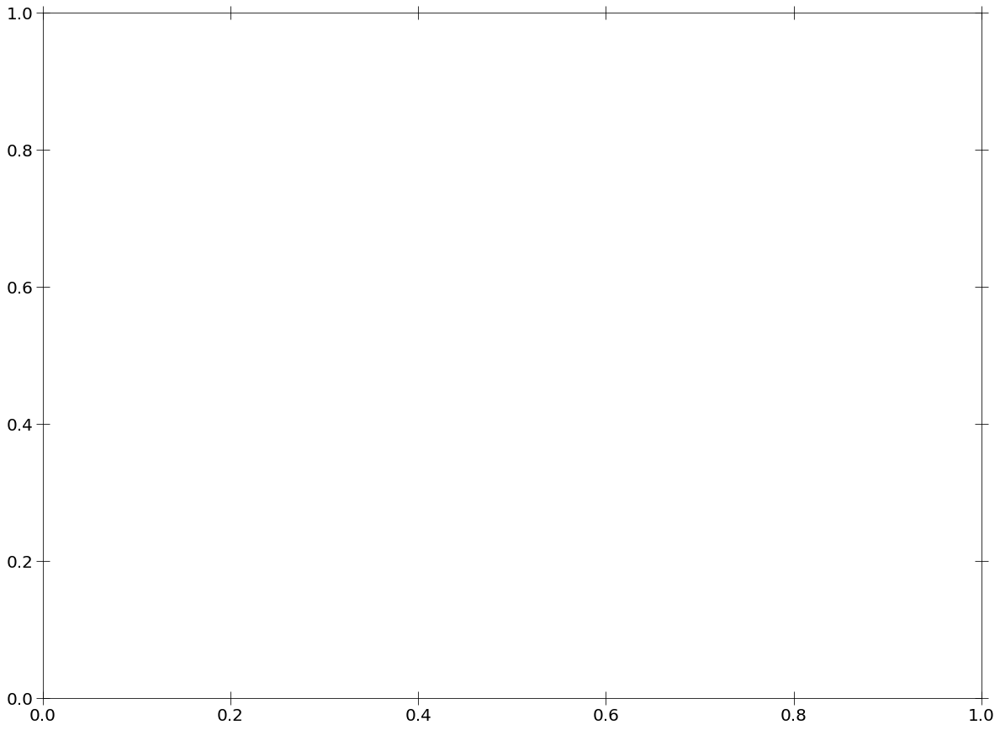

In [115]:
plt.scatter(netcounts_int_acis, colors_int_acis,
            s=(np.array(pn_fit_stats_table_pl)[:, 1].astype(float) -
               np.array(pn_fit_stats_table_pl_g2)[:, 1].astype(float) + 10))
plt.xscale('log')
plt.ylim(0, 5)

In [189]:
print(len(candidate_srcs_pn))
print(len(candidate_srcs_mos))
print(len(candidate_srcs_acis))
print(len(interested_srcs_alldet[0]))
print(len(interested_srcs_alldet[1]))
print(len(interested_srcs_alldet[2]))

313
149
473
1455
957
1627


In [90]:
candidadate_srcs_pn_args_good, candidate_srcs_pn_good = get_candidates(
    interested_srcs_alldet[0], pn_fit_stats_table_pl, pn_fit_stats_table_pl_g2,
    pn_model_params_table_pl_g2, goodness=True)
candidadate_srcs_mos_args_good, candidate_srcs_mos_good = get_candidates(
    interested_srcs_alldet[1], mos_fit_stats_table_pl,
    mos_fit_stats_table_pl_g2, mos_model_params_table_pl_g2, goodness=True)
candidadate_srcs_acis_args_good, candidate_srcs_acis_good = get_candidates(
    interested_srcs_alldet[2], acis_fit_stats_table_pl,
    acis_fit_stats_table_pl_g2, acis_model_params_table_pl_g2, goodness=True)

In [91]:
print(len(candidate_srcs_pn_good))
print(len(candidate_srcs_mos_good))
print(len(candidate_srcs_acis_good))

56
42
121


In [86]:
def compare_det_srcs(src_list1, src_list2):
    """Return sources in list1 that are not in list2."""
    extra_srcs = []
    for src in src_list1:
        if src not in src_list2:
            extra_srcs.append(src)
    return extra_srcs

In [88]:
compare_det_srcs(candidate_srcs_acis, candidate_srcs_acis_good)

['2CXOJ174431.9-290508',
 '2CXOJ174535.0-285326',
 '2CXOJ174502.3-285449',
 '2CXOJ174540.1-290055',
 '2CXOJ174554.4-285454']

candidate_srcs_pn = (interested_srcs_alldet[0][np.where(aic_pl_arr[0] < aic_pl_g3_arr[0] - 2)])

candidate_srcs_mos = (interested_srcs_alldet[1][np.where(aic_pl_arr[1] < aic_pl_g3_arr[1] - 2)])

candidate_srcs_acis = (interested_srcs_alldet[2][np.where(aic_pl_arr[2] < aic_pl_g3_arr[2] - 2)])

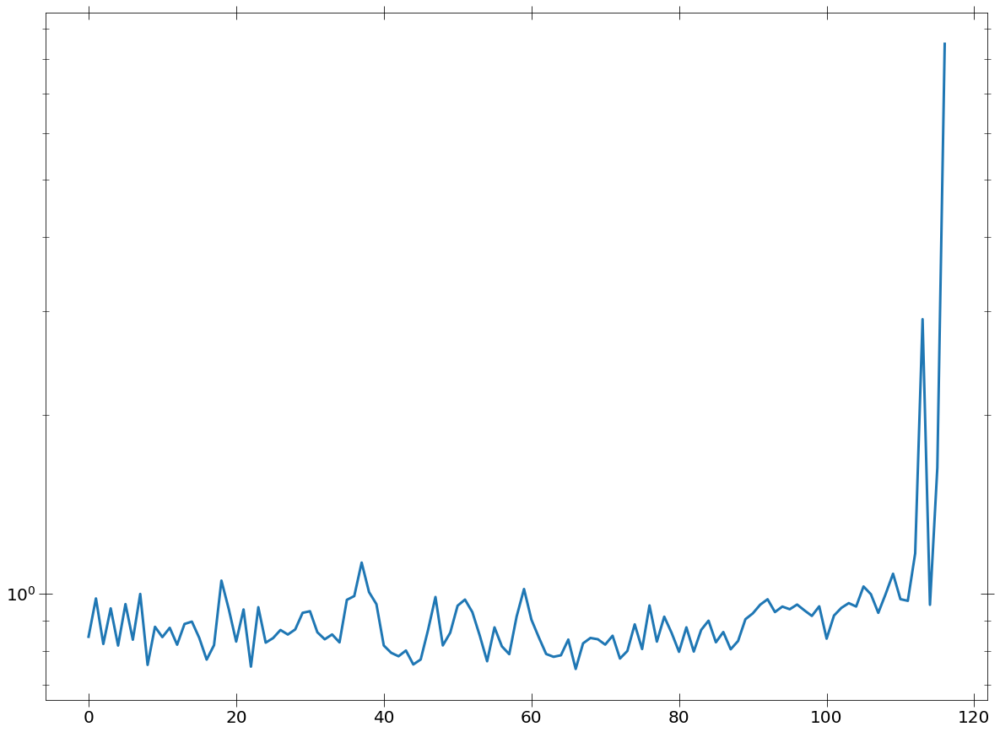

1:62: E225 missing whitespace around operator
2:80: E501 line too long (112 > 79 characters)


In [298]:
plt.plot((np.array(pn_fit_stats_table_pl)[:, 1].astype(float)/
          np.array(pn_fit_stats_table_pl)[:, -1].astype(float))[candia])
plt.yscale('log')

In [297]:
len(np.where(aic_pl_arr[0] < aic_pl_g3_arr[0] - 2)[0])


117

In [271]:
print(len(candidate_srcs_mos))
candidate_srcs_mos

66


array(['202026707015155', '204003401010008', '206556701010016',
       '206556701010040', '206946416010014', '208016803010003',
       '208860207010005', '202026707010160', '206043007010211',
       '206735502010030', '206735502010035', '206735502010047',
       '206735502010048', '206735502010049', '206735502010062',
       '206735502010080', '206735502010100', '206946409010023',
       '206946410010029', '208016804010004', '201129715010017',
       '204003401010007', '208016813010003', '201529201010011',
       '202026707010169', '202026707010179', '202026707010221',
       '202026707010240', '202026707010278', '204105804010009',
       '205049406010006', '206586001010095', '206586001010113',
       '206586001010146', '206735502010018', '206735502010024',
       '205100104010002', '206946401010003', '208860108010001',
       '202026707010062', '202026707010124', '202026707015191',
       '201129707010063', '202026707010170', '202026707010181',
       '207234104010049', '2010326130100

In [302]:
print(len(candidate_srcs_acis))
np.sort(candidate_srcs_acis)

157


array(['2CXOJ174405.3-292031', '2CXOJ174429.4-285531',
       '2CXOJ174431.9-290508', '2CXOJ174433.0-284426',
       '2CXOJ174442.9-292048', '2CXOJ174454.1-285841',
       '2CXOJ174457.4-285020', '2CXOJ174502.3-285449',
       '2CXOJ174503.8-290051', '2CXOJ174505.4-285934',
       '2CXOJ174507.0-290357', '2CXOJ174508.6-285652',
       '2CXOJ174508.6-285939', '2CXOJ174511.8-290032',
       '2CXOJ174512.3-285901', '2CXOJ174512.8-290340',
       '2CXOJ174513.9-285916', '2CXOJ174514.1-285425',
       '2CXOJ174515.0-285914', '2CXOJ174515.1-290016',
       '2CXOJ174515.7-290222', '2CXOJ174516.1-290425',
       '2CXOJ174516.7-290407', '2CXOJ174518.6-290010',
       '2CXOJ174520.2-291044', '2CXOJ174520.3-290634',
       '2CXOJ174520.5-290501', '2CXOJ174521.2-290652',
       '2CXOJ174521.3-285953', '2CXOJ174523.8-290653',
       '2CXOJ174524.3-285705', '2CXOJ174525.2-285404',
       '2CXOJ174526.8-285926', '2CXOJ174526.8-290702',
       '2CXOJ174527.5-290513', '2CXOJ174527.6-290423',
       '2C

In [287]:
def arr_to_str(arr, type='name'):
    string = ''
    for element in arr:
        if type == 'name':
            element = element.split('J')[0] + ' J' + element.split('J')[1]
        string += str(element) + '; '
    return string[:-2]

In [289]:
len(candidate_srcs_pn)

86

In [288]:
arr_to_str(candidate_srcs_pn, type=None)

'201129701010028; 201129707010018; 201129707010031; 203017301010002; 205100104010019; 205547201010008; 206946402010138; 206946404010167; 206946408010129; 206946410010025; 206946410010046; 206946410015051; 206946410015093; 206946416010055; 206946416010103; 206946416010105; 206946416010109; 207641901010010; 207641901010014; 207641917010007; 208016812010006; 208251401010013; 208441011010118; 208441011010128; 208441011010233; 208624701010019; 208860105010003; 208860207010005; 208861209010005; 200305401015015; 201113501010117; 201129704010031; 201129704010056; 204003401010008; 205100104010002; 205110012010036; 206946401010003; 206946404010202; 206946410010178; 206946416010014; 208016803010003; 208441011010009; 208441011010032; 208624701010022; 208860108010001; 208938111010034; 201129707010046; 201129707010057; 204003401010007; 205110012010017; 205110012010028; 205110012010053; 205110012010055; 208016813010003; 201032613010002; 201129721010057; 201129721010133; 206946402010009; 2074363090100

In [65]:
candidate_srcs_pn

array([  54,  252,  347,  372,  550,  564,  845,  931,  978, 1031, 1053,
       1276, 1292, 1341, 1352, 1378, 1425, 1470, 1538, 1659, 1714, 1885,
       1913, 1977, 2319, 2605, 2653, 2703, 2834, 3083, 3087, 3108, 3279,
       3364, 3407, 3613, 3625, 3701, 4076, 4195, 4253, 4277, 4337, 4484,
       4864, 4873, 4908, 4965, 5132, 5233, 5293, 5337, 5349, 5497, 5524,
       5586, 5892, 5917, 6201, 6237, 6267, 6302, 6307, 6456, 6617, 6644,
       6646, 7099, 7114, 7166, 7203, 7442, 7493, 7593, 7775, 8030, 8044,
       8056, 8220, 8308, 8344, 8388, 8406, 8516, 8611, 8712, 8800, 8865,
       9121, 9147, 9203, 9351, 9389, 9504, 9528, 9636, 9821, 9853, 9904,
        353,  388,  438,  454,  493,  605,  655,  661,  723,  795,  863,
        980, 1060, 1212, 1254, 1294, 1345])

313 313
313


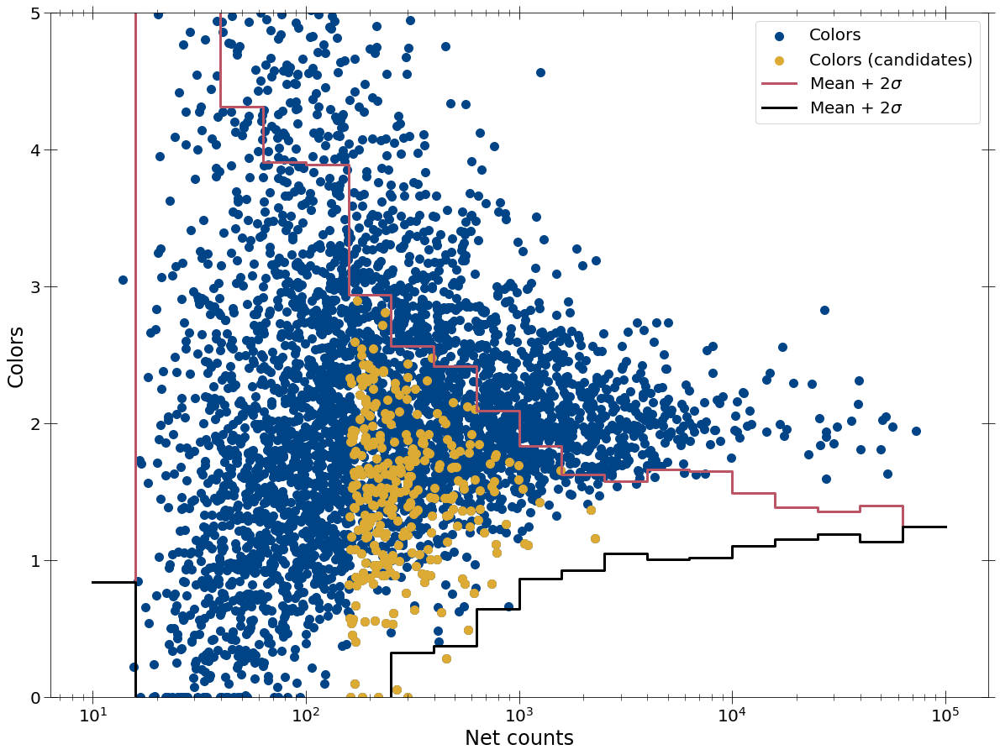

1:80: E501 line too long (86 > 79 characters)
2:22: E128 continuation line under-indented for visual indent
2:80: E501 line too long (83 > 79 characters)


In [185]:
netcounts_cand_pn = mark_interested_srcs(sim_color_dict_arr[0], obs_color_dict_arr[0],
                     spec_summary['src_nums'][0], spec_summary['spec_masks'][1][0],
                     candidate_srcs_pn, 0)[1]

149 149
149


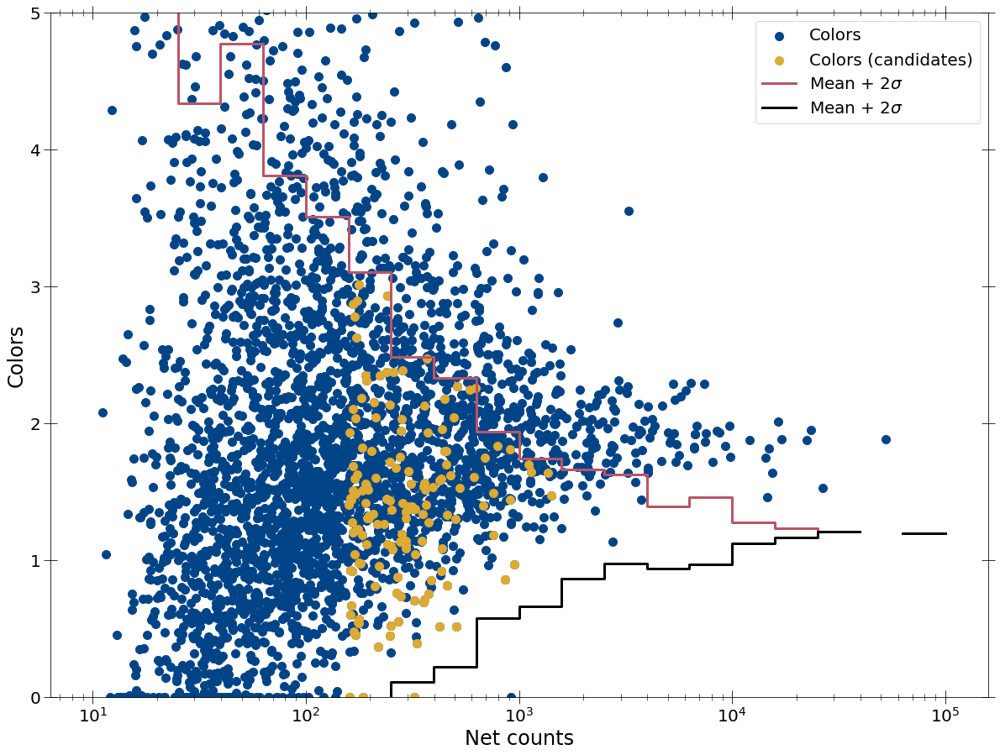

1:80: E501 line too long (87 > 79 characters)
2:22: E128 continuation line under-indented for visual indent
2:80: E501 line too long (83 > 79 characters)


In [186]:
netcounts_cand_mos = mark_interested_srcs(sim_color_dict_arr[1], obs_color_dict_arr[1],
                     spec_summary['src_nums'][0], spec_summary['spec_masks'][1][1],
                     candidate_srcs_mos, 0)[1]

In [60]:
len(candidate_srcs_acis)

149

473 473
473


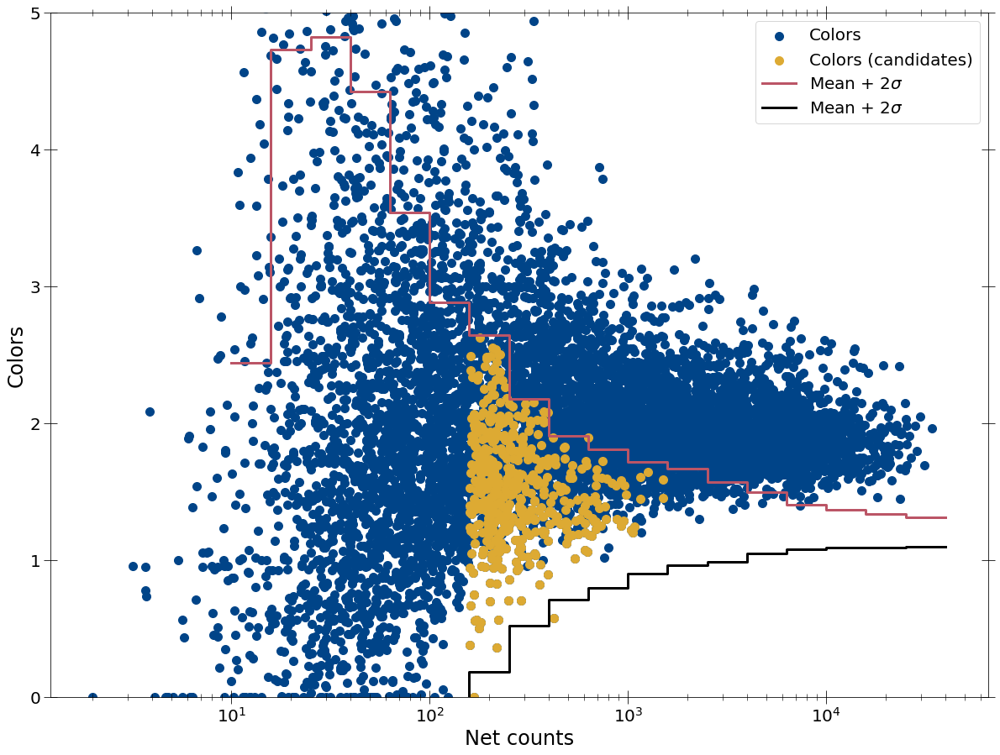

1:80: E501 line too long (88 > 79 characters)
2:22: E128 continuation line under-indented for visual indent
2:80: E501 line too long (83 > 79 characters)


In [187]:
netcounts_cand_acis = mark_interested_srcs(sim_color_dict_arr[2], obs_color_dict_arr[2],
                     spec_summary['src_nums'][1], spec_summary['spec_masks'][1][2],
                     candidate_srcs_acis, 0)[1]

In [196]:
netcounts_int_pn_hist = np.histogram(netcounts_int_pn, bins=sim_color_dict_arr[0]['prop_bins'][0])[0]
netcounts_cand_pn_hist = np.histogram(netcounts_cand_pn, bins=sim_color_dict_arr[0]['prop_bins'][0])[0]
netcounts_int_mos_hist = np.histogram(netcounts_int_mos, bins=sim_color_dict_arr[1]['prop_bins'][0])[0]
netcounts_cand_mos_hist = np.histogram(netcounts_cand_mos, bins=sim_color_dict_arr[1]['prop_bins'][0])[0]
netcounts_int_acis_hist = np.histogram(netcounts_int_acis, bins=sim_color_dict_arr[2]['prop_bins'][0])[0]
netcounts_cand_acis_hist = np.histogram(netcounts_cand_acis, bins=sim_color_dict_arr[2]['prop_bins'][0])[0]

1:80: E501 line too long (101 > 79 characters)
2:80: E501 line too long (103 > 79 characters)
3:80: E501 line too long (103 > 79 characters)
4:80: E501 line too long (105 > 79 characters)
5:80: E501 line too long (105 > 79 characters)


In [205]:
netcounts_cand_acis_hist/netcounts_int_acis_hist

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in true_divide
  """Entry point for launching an IPython kernel.


array([       nan,        nan,        nan,        nan,        nan,
              nan, 0.4519573 , 0.32914573, 0.20472441, 0.14659686,
       0.0661157 , 0.        , 0.        , 0.        , 0.        ,
              nan,        nan,        nan,        nan,        nan])

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in power
  import sys
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in multiply
  import sys
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in power
  del sys.path[0]
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in multiply
  del sys.path[0]
/Users/pavanrh/anaconda3/lib/python3.7/site-pac

Text(0.5, 0, 'Net counts')

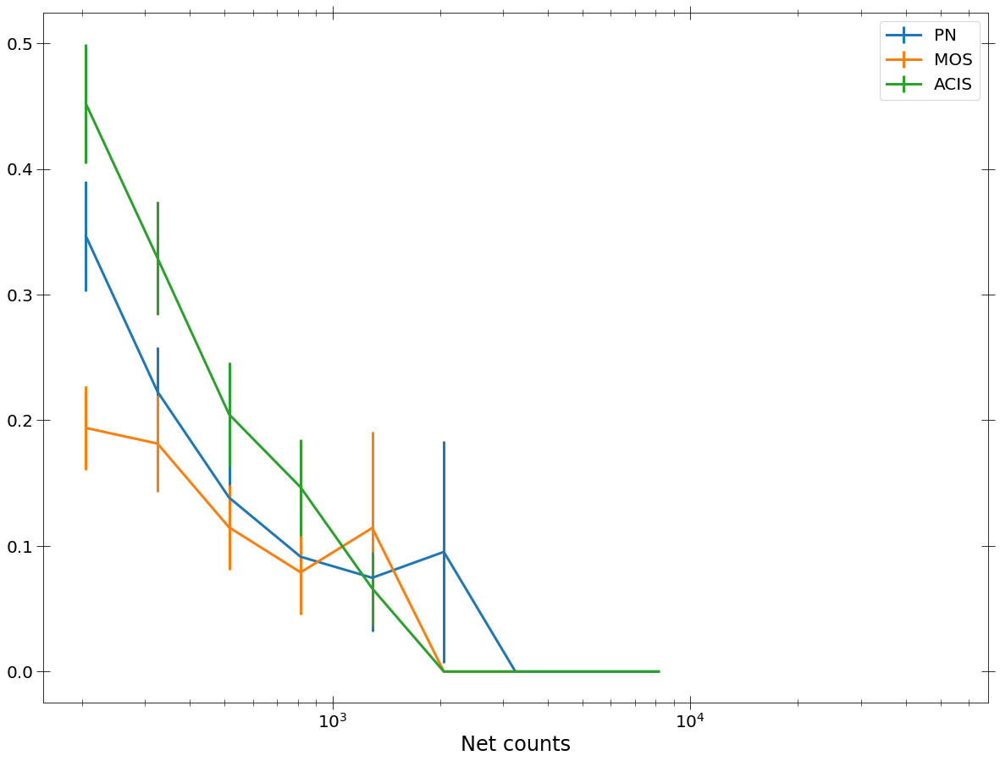

5:18: E251 unexpected spaces around keyword / parameter equals
5:20: E251 unexpected spaces around keyword / parameter equals
9:18: E128 continuation line under-indented for visual indent
11:18: E251 unexpected spaces around keyword / parameter equals
11:20: E251 unexpected spaces around keyword / parameter equals
15:18: E128 continuation line under-indented for visual indent
17:18: E251 unexpected spaces around keyword / parameter equals
17:20: E251 unexpected spaces around keyword / parameter equals


In [197]:
plt.figure()
plt.errorbar(0.5*(sim_color_dict_arr[0]['prop_bins'][0][1:] +
                  sim_color_dict_arr[0]['prop_bins'][0][:-1]),
             netcounts_cand_pn_hist/netcounts_int_pn_hist, label='PN',
             yerr = (((netcounts_cand_pn_hist)**-0.5 +
                      (netcounts_int_pn_hist)**-0.5) *
                     netcounts_cand_pn_hist/netcounts_int_pn_hist))
plt.errorbar(0.5*(sim_color_dict_arr[1]['prop_bins'][0][1:] +
                 sim_color_dict_arr[1]['prop_bins'][0][:-1]),
             netcounts_cand_mos_hist/netcounts_int_mos_hist, label='MOS',
             yerr = (((netcounts_cand_mos_hist)**-0.5 +
                      (netcounts_int_mos_hist)**-0.5) *
                     netcounts_cand_mos_hist/netcounts_int_mos_hist))
plt.errorbar(0.5*(sim_color_dict_arr[2]['prop_bins'][0][1:] +
                 sim_color_dict_arr[2]['prop_bins'][0][:-1]),
             netcounts_cand_acis_hist/netcounts_int_acis_hist, label='ACIS',
             yerr = (((netcounts_cand_acis_hist)**-0.5 +
                      (netcounts_int_acis_hist)**-0.5) *
                     netcounts_cand_acis_hist/netcounts_int_acis_hist))
plt.legend()
plt.xscale('log')
plt.xlabel('Net counts')

(array([[55., 54., 52., 44., 44., 39., 31., 24., 22., 23., 11.,  4.,  4.,
          6.,  1.,  1.,  1.,  0.,  0.,  2.],
        [71., 66., 48., 38., 22., 19., 19., 10.,  9.,  4.,  4.,  0.,  1.,
          1.,  1.,  0.,  0.,  0.,  0.,  0.]]),
 array([2.20188007, 2.28333357, 2.36478708, 2.44624058, 2.52769408,
        2.60914758, 2.69060109, 2.77205459, 2.85350809, 2.9349616 ,
        3.0164151 , 3.0978686 , 3.1793221 , 3.26077561, 3.34222911,
        3.42368261, 3.50513612, 3.58658962, 3.66804312, 3.74949663,
        3.83095013]),
 <a list of 2 BarContainer objects>)

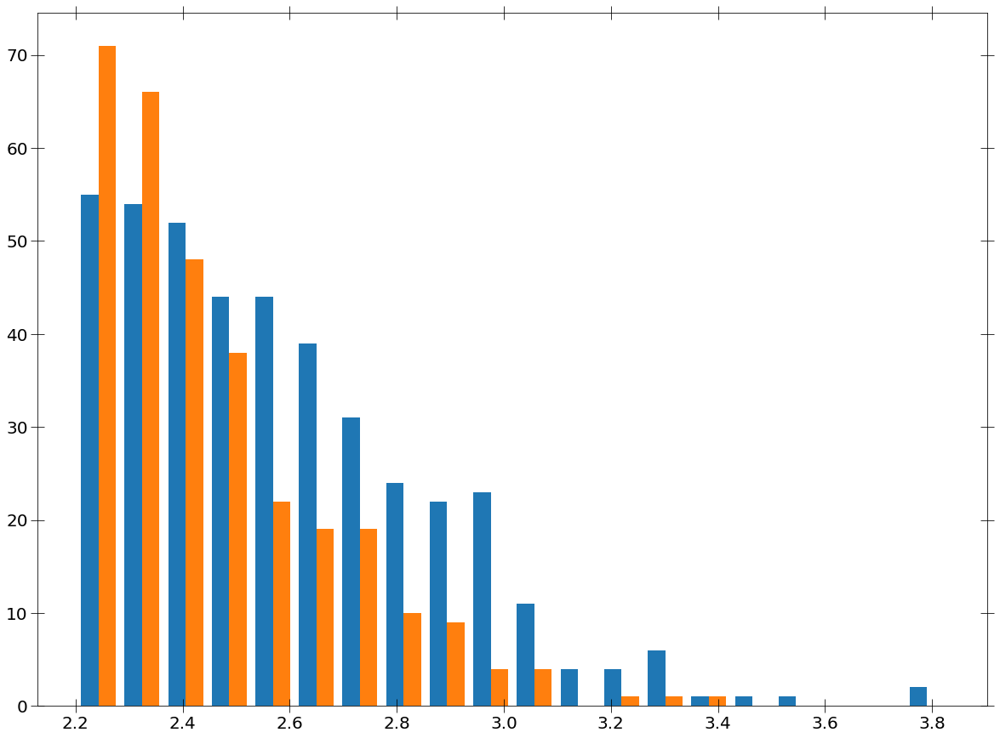

In [198]:
plt.hist([np.log10(net_counts_int_pn), np.log10(netcounts_cand_pn)], bins=20)

(array([[56., 51., 34., 31., 31., 35., 23., 27., 23., 27., 18.,  9.,  4.,
          5.,  3.,  1.,  3.,  2.,  1.,  1.],
        [21., 16., 16.,  4.,  7.,  8.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.,  0.]]),
 array([2.20058388, 2.26786222, 2.33514057, 2.40241892, 2.46969726,
        2.53697561, 2.60425396, 2.6715323 , 2.73881065, 2.80608899,
        2.87336734, 2.94064569, 3.00792403, 3.07520238, 3.14248072,
        3.20975907, 3.27703742, 3.34431576, 3.41159411, 3.47887245,
        3.5461508 ]),
 <a list of 2 BarContainer objects>)

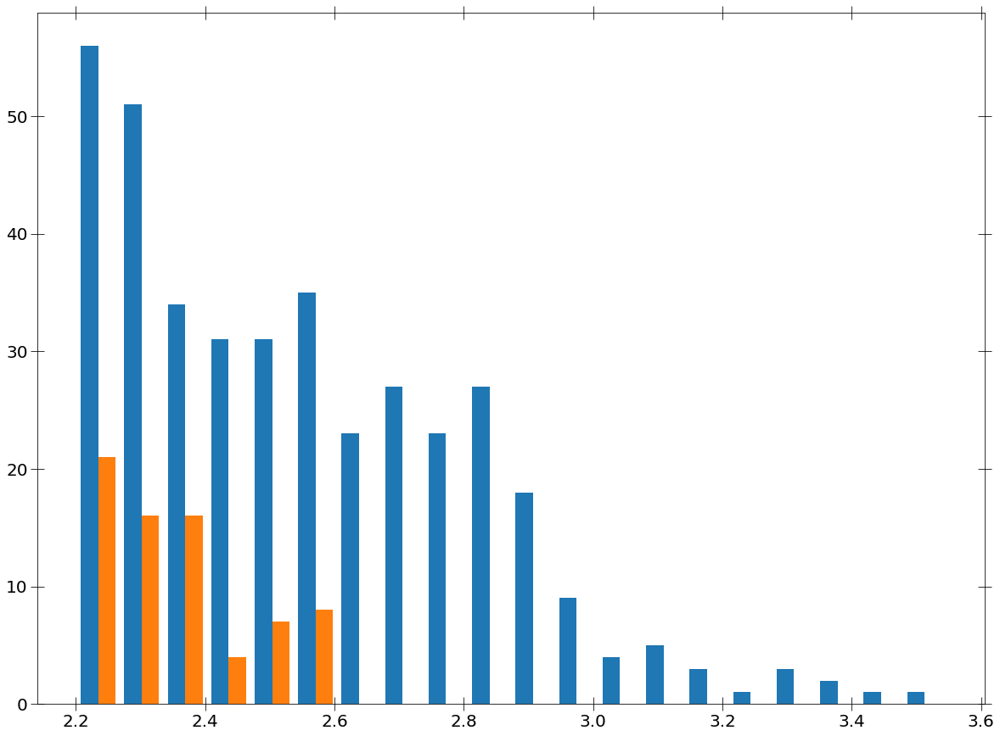

In [90]:
plt.hist([np.log10(netcounts_int_mos), np.log10(netcounts_cand_mos)], bins=20)

(array([[80., 55., 36., 39., 45., 30., 31., 25., 12., 26., 13.,  9.,  8.,
          9.,  8.,  1.,  3.,  2.,  0.,  1.],
        [66., 55., 28.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.,  0.]]),
 array([2.20008953, 2.27960779, 2.35912605, 2.43864431, 2.51816258,
        2.59768084, 2.6771991 , 2.75671737, 2.83623563, 2.91575389,
        2.99527215, 3.07479042, 3.15430868, 3.23382694, 3.31334521,
        3.39286347, 3.47238173, 3.5519    , 3.63141826, 3.71093652,
        3.79045478]),
 <a list of 2 BarContainer objects>)

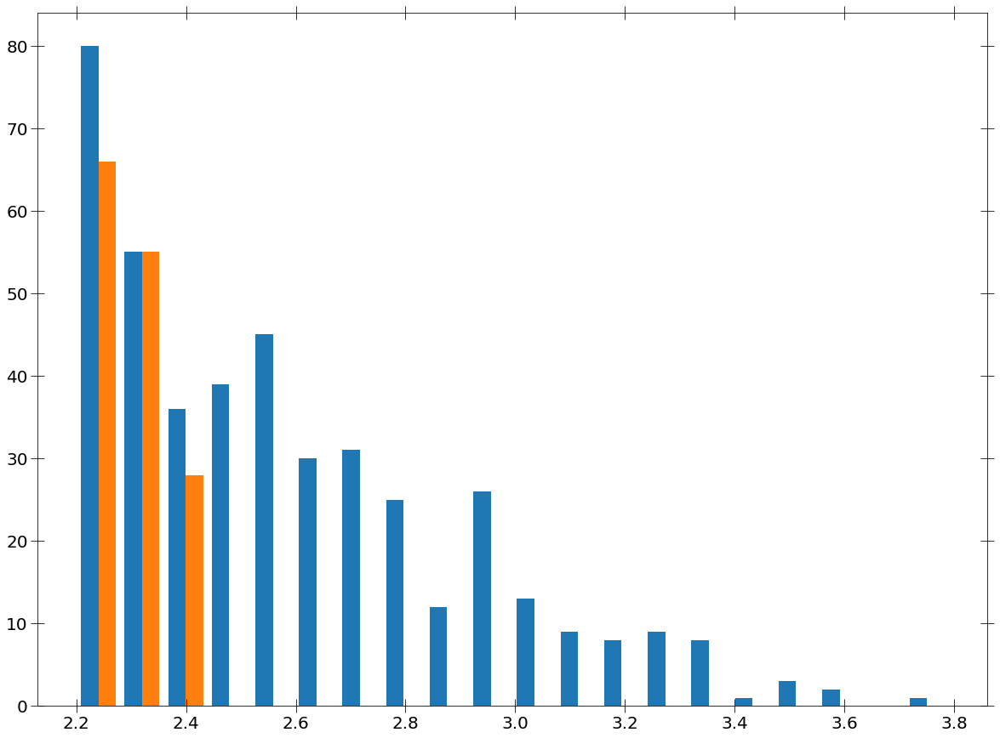

In [91]:
plt.hist([np.log10(netcounts_int_acis), np.log10(netcounts_cand_acis)], bins=20)

(array([  5,   8,  13,  26,  32,  53,  60,  65,  91,  94, 101, 104, 106,
       155, 157, 164, 168, 178, 183, 195, 212, 236, 242, 243, 274, 275,
       278, 279, 280, 281, 282, 283, 288, 322, 344, 356, 366, 367, 387,
       392, 394, 402, 404, 405, 418, 421, 423, 424, 425, 479, 481, 487,
       490, 503, 504, 522, 535, 536, 537, 538, 539, 541, 542, 543, 544,
       545, 548, 550, 551, 557, 568, 586, 604, 628, 630, 632, 635, 636,
       648, 660, 661, 692, 698, 722, 735, 740]),)
['200305401015015' '201032613010002' '201113501010117' '201129701010028'
 '201129702010002' '201129704010031' '201129704010056' '201129705010011'
 '201129707010018' '201129707010031' '201129707010046' '201129707010057'
 '201129707010063' '201129721010057' '201129721010060' '201129721010133'
 '201442201010001' '201529201010060' '202026705010003' '202026707010271'
 '203017301010002' '203032102010002' '204003401010007' '204003401010008'
 '205100104010002' '205100104010019' '205110012010001' '205110012010017'
 '2051

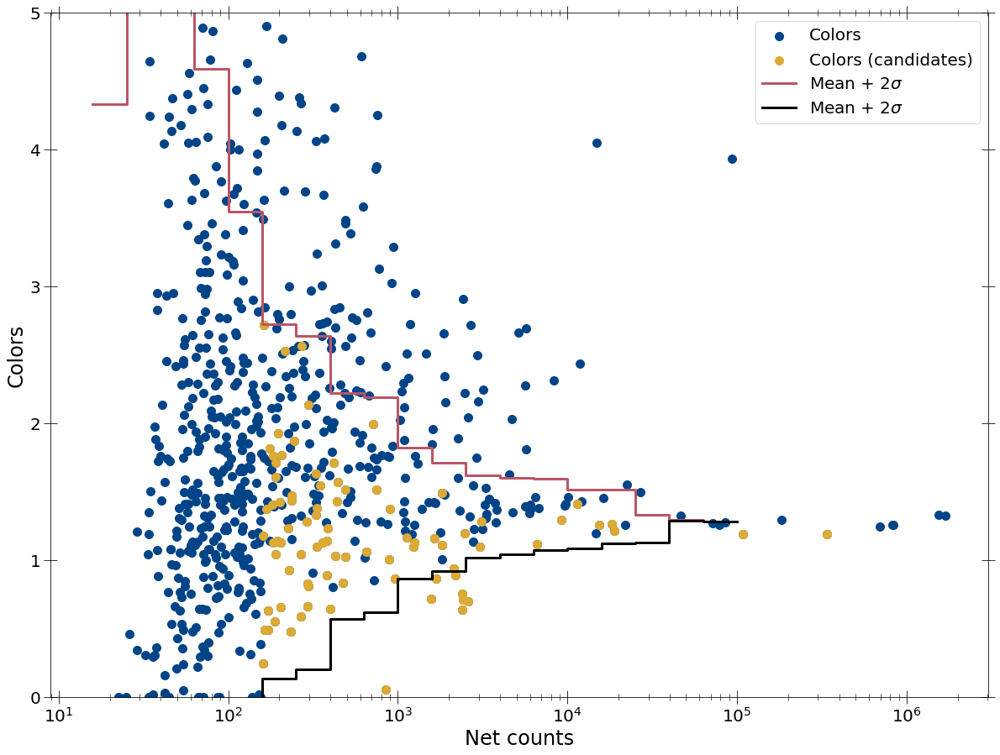

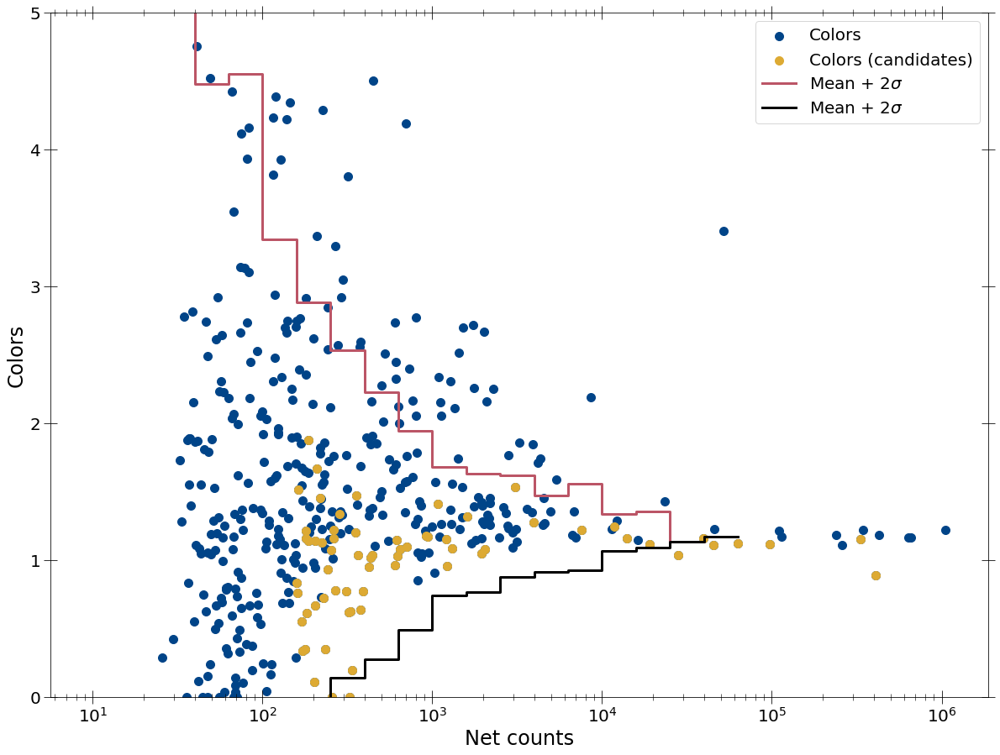

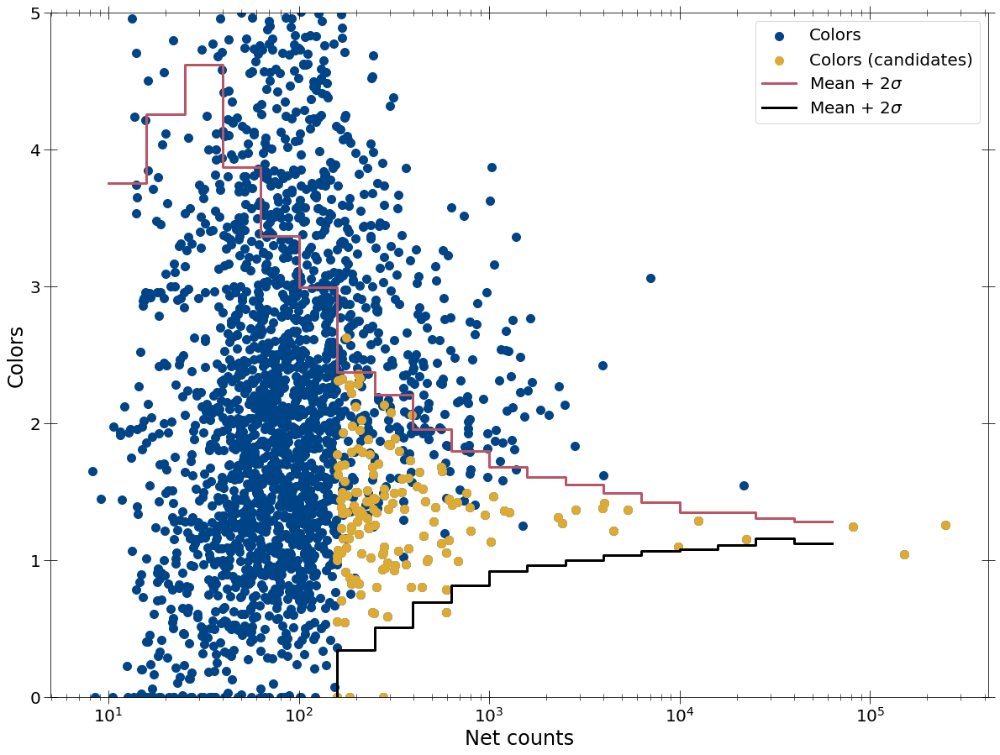

1:80: E501 line too long (82 > 79 characters)
2:80: E501 line too long (83 > 79 characters)
4:80: E501 line too long (82 > 79 characters)
5:80: E501 line too long (83 > 79 characters)
7:80: E501 line too long (82 > 79 characters)
8:80: E501 line too long (83 > 79 characters)


In [276]:
mark_interested_srcs(sim_color_dict_arr_clipped[0], obs_color_dict_arr_clipped[0],
                     spec_summary['src_nums'][0], spec_summary['spec_masks'][1][0],
                     candidate_srcs_pn, 0)
mark_interested_srcs(sim_color_dict_arr_clipped[1], obs_color_dict_arr_clipped[1],
                     spec_summary['src_nums'][0], spec_summary['spec_masks'][1][1],
                     candidate_srcs_mos, 0)
mark_interested_srcs(sim_color_dict_arr_clipped[2], obs_color_dict_arr_clipped[2],
                     spec_summary['src_nums'][1], spec_summary['spec_masks'][1][2],
                     candidate_srcs_acis, 0)

In [169]:
np.where(interested_srcs_alldet[2] == '2CXOJ174534.3-290231')

(array([], dtype=int64),)

In [285]:
print(acis_fit_stats_table_pl[125])
print(acis_fit_stats_table_pl_g[125])
print(acis_fit_stats_table_pl_g2[125])
print()
print(acis_fit_stats_table_pl[208])
print(acis_fit_stats_table_pl_g[208])
print(acis_fit_stats_table_pl_g2[208])
print()
print(acis_fit_stats_table_pl[133])
print(acis_fit_stats_table_pl_g[133])
print(acis_fit_stats_table_pl_g2[133])
print()
print(acis_fit_stats_table_pl[46])
print(acis_fit_stats_table_pl_g[46])
print(acis_fit_stats_table_pl_g2[46])
print()
print(acis_fit_stats_table_pl[88])
print(acis_fit_stats_table_pl_g[88])
print(acis_fit_stats_table_pl_g2[88])
print()
print(acis_fit_stats_table_pl[188])
print(acis_fit_stats_table_pl_g[188])
print(acis_fit_stats_table_pl_g2[188])

['2CXOJ174540.3-290049', 266.01879656001785, -7.589646752720701, 50.0, 299]
['2CXOJ174540.3-290049', 264.6833556689429, -7.805990677928118, 50.0, 297]
['2CXOJ174540.3-290049', 263.92879916841827, -7.8578460350119865, 50.0, 296]

['2CXOJ174536.9-290039', 344.5620739732016, -9.526574126034008, 50.0, 389]
['2CXOJ174536.9-290039', 341.77998992125424, -9.871299609625027, 50.0, 387]
['2CXOJ174536.9-290039', 340.80402348470886, -9.916018231068454, 50.0, 386]

['2CXOJ174535.7-290004', 219.3432290242929, -8.32886982476195, 50.0, 254]
['2CXOJ174535.7-290004', 216.10212421697082, -8.175803506918273, 50.0, 252]
['2CXOJ174535.7-290004', 216.40324068904283, -8.163633107538715, 50.0, 251]

['2CXOJ174543.2-290003', 168.34505326473322, -7.38207827477904, 50.0, 262]
['2CXOJ174543.2-290003', 166.74607251218066, -7.295869408022453, 50.0, 260]
['2CXOJ174543.2-290003', 167.088320724579, -7.364177348527165, 50.0, 259]

['2CXOJ174535.0-285757', 140.70723931932093, -7.684272731913274, 50.0, 193]
['2CXOJ174535.

In [157]:
print(acis_model_params_table_pl_g2[125])
print(acis_model_params_table_pl_g2[208])
print(acis_model_params_table_pl_g2[133])
print(acis_model_params_table_pl_g2[46])
print(acis_model_params_table_pl_g2[88])
print(acis_model_params_table_pl_g2[188])

['2CXOJ174540.3-290049', 14.747172266857492, 2.284559245444103, 0.014014393023623173, 3.157876082859608e-08, 1.936457506907927e-08, 4.298694332175304e-19, 0.0, 8.242343569531286e-08, 0.0, 7.391659902986237e-08, 0.0, 3.2311902308687976e-08]
['2CXOJ174536.9-290039', 32.91698126831548, 2.169538475539656, 0.13824128530453256, 5.4557158152566107e-14, 1.4314730567579634e-07, 7.4035496908206e-08, 0.0, 1.1265319696324751e-07, 0.0, 3.059586290967107e-07, 0.0, 2.3806088884467742e-07]
['2CXOJ174535.7-290004', 25.294693190701558, 1.6423470508550815, 0.040934446317875135, 8.531655806100725e-08, 3.5908650704885276e-08, 1.1327547386683504e-08, 0.0, 1.9846436077281447e-07, 0.0, 1.5934190141787257e-07, 0.0, 1.3669784512889456e-07]
['2CXOJ174543.2-290003', 57.451790453056155, 4.999999999999999, 0.3025621014701397, 6.405396701097331e-22, 1.716821005151346e-19, 1.2932393486615652e-07, 0.0, 1.4473062790960989e-07, 0.0, 2.977575924227808e-07, 0.0, 3.5802429139269943e-07]
['2CXOJ174535.0-285757', 16.72445583

(array([ 200,  692,  806,  990, 1051, 1199, 1665, 1685, 1702]),)
['2CXOJ174534.3-290231' '2CXOJ174546.2-290003' '2CXOJ174538.1-290319'
 '2CXOJ174535.7-290004' '2CXOJ174543.2-290003' '2CXOJ174532.9-290110'
 '2CXOJ174535.0-285757' '2CXOJ174527.8-290210' '2CXOJ174544.1-285940']
[176.43000154  68.51315789 148.93362531 333.82959801 176.07171884
  69.72756558 160.74684514 452.65052956  15.82249253]
[2.8743079         inf 0.88800633 1.79911604 0.7109796  2.33402784
 1.63259623 1.30960658        inf]


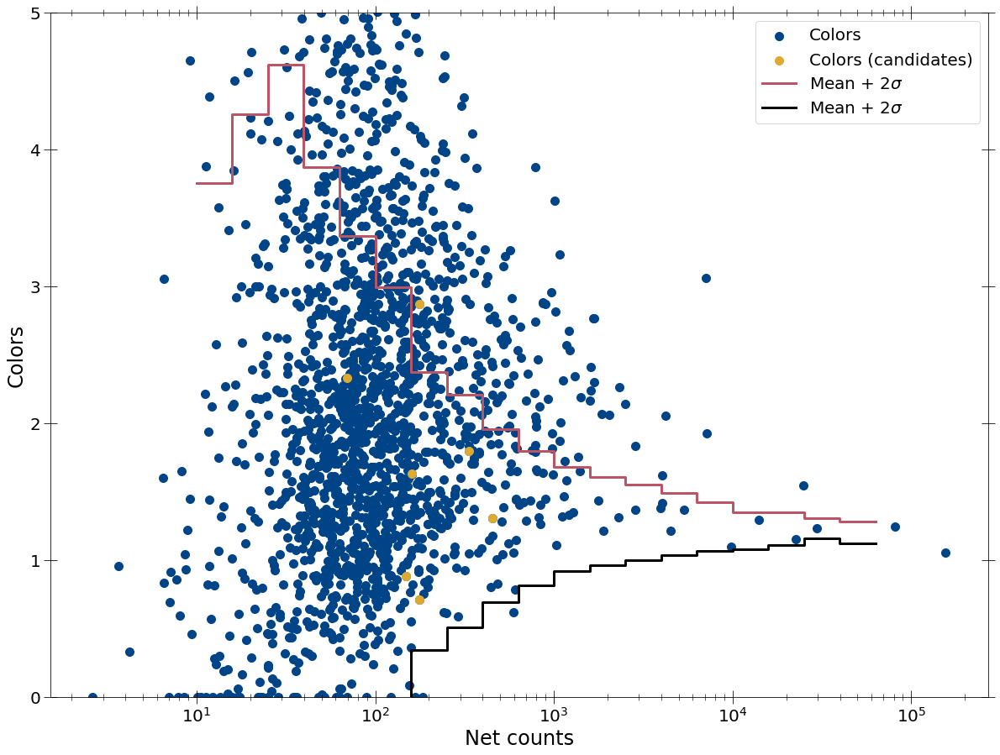

2:80: E501 line too long (83 > 79 characters)


In [168]:
mark_interested_srcs(sim_color_dict_arr[2], obs_color_dict_arr[2],
                     spec_summary['src_nums'][1], spec_summary['spec_masks'][1][2],
                     ['2CXOJ174543.2-290003', '2CXOJ174535.7-290004',
                      '2CXOJ174544.1-285940', '2CXOJ174546.2-290003',
                      '2CXOJ174532.9-290110', '2CXOJ174534.3-290231',
                      '2CXOJ174535.0-285757', '2CXOJ174538.1-290319', '2CXOJ174527.8-290210'], 0)

(array([ 678,  840,  990, 1335]),)
['2CXOJ174540.3-290049' '2CXOJ174536.9-290039' '2CXOJ174535.7-290004'
 '2CXOJ174536.1-285638']
[ 309.98665049 1113.49755019  333.82959801 7063.35067975]
[1.41798004 1.31906731 1.79911604 3.06266218]


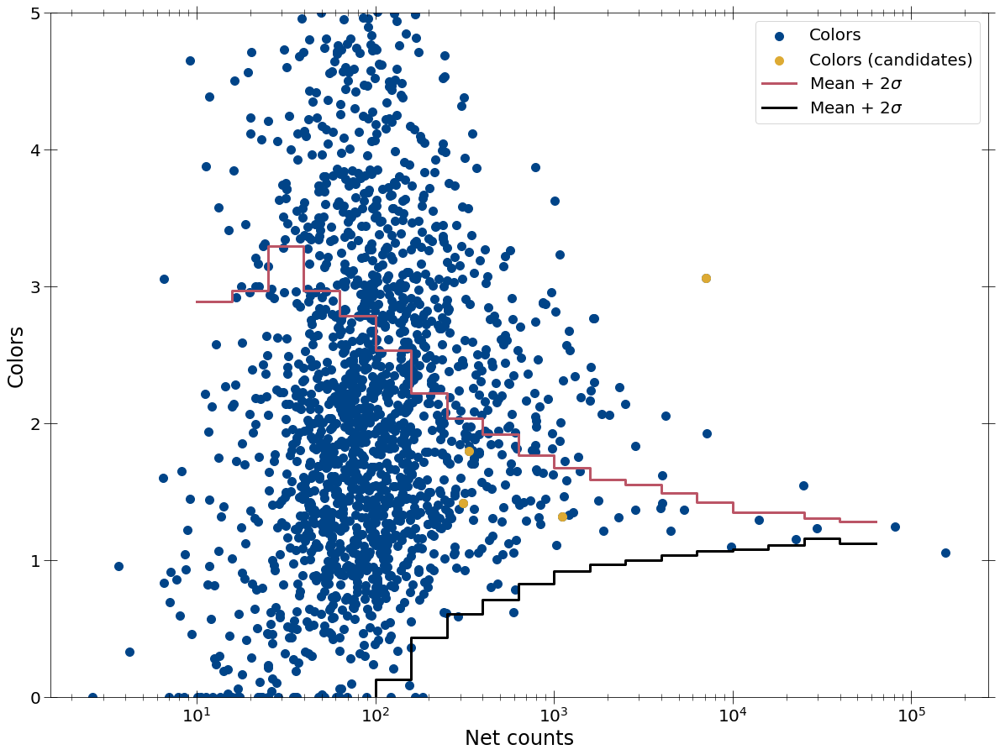

1:80: E501 line too long (82 > 79 characters)
2:80: E501 line too long (83 > 79 characters)


In [167]:
mark_interested_srcs(sim_color_dict_arr_clipped[2], obs_color_dict_arr_clipped[2],
                     spec_summary['src_nums'][1], spec_summary['spec_masks'][1][2],
                     ['2CXOJ174540.3-290049', '2CXOJ174536.9-290039',
                      '2CXOJ174535.7-290004', '2CXOJ174536.1-285638',
                      '2CXOJ174532.7-285616', '2CXOJ174610.5-285550'], 0)

In [289]:
np.savetxt('ACIS_interested_plmodels.txt', acis_model_params_table_pl, fmt='%s')
np.savetxt('ACIS_interested_g2models.txt', acis_model_params_table_pl_g2, fmt='%s')

1:80: E501 line too long (80 > 79 characters)


# Checking for low norm sources

In [277]:
acis_model_g2_arr = np.array(acis_model_params_table_pl_g2)
zero_norms_args = np.where(np.logical_and(np.logical_and(
    np.logical_or(
        acis_model_g2_arr[:, 7].astype(float) == 0,
        acis_model_g2_arr[:, 7].astype(float) >= acis_model_g2_arr[:, 4].astype(float)),
    np.logical_or(
        acis_model_g2_arr[:, 9].astype(float) == 0,
        acis_model_g2_arr[:, 9].astype(float) >= acis_model_g2_arr[:, 5].astype(float))),
    np.logical_or(
        acis_model_g2_arr[:, 11].astype(float) == 0,
        acis_model_g2_arr[:, 11].astype(float) >= acis_model_g2_arr[:, 6].astype(float))))[0]

5:80: E501 line too long (88 > 79 characters)
8:80: E501 line too long (89 > 79 characters)


In [278]:
high_norms_args = np.where(np.logical_or(np.logical_or(
    acis_model_g2_arr[:, 7].astype(float) >= acis_model_g2_arr[:, 4].astype(float),
    acis_model_g2_arr[:, 9].astype(float) >= acis_model_g2_arr[:, 5].astype(float)),
    acis_model_g2_arr[:, 11].astype(float) >= acis_model_g2_arr[:, 6].astype(float)))[0]

2:80: E501 line too long (83 > 79 characters)
3:80: E501 line too long (84 > 79 characters)


In [279]:
len(high_norms_args)

29

In [247]:
zero_norm_args = np.append(zero_norms_args.copy(), high_norms_args)

In [280]:
len(zero_norms_args)

144

In [281]:
np.min((aic_pl_g3_arr[2] - aic_pl_arr[2])[zero_norms_args])

0.8924075464469752

In [258]:
print(acis_fit_stats_table_pl[117])
print(acis_fit_stats_table_pl_g2[117])

['2CXOJ174601.1-285952', 273.95609098450296, -7.238976643444733, 50.0, 270]
['2CXOJ174601.1-285952', 250.28253432384366, -8.420395729866275, 50.0, 267]


In [259]:
print(acis_model_params_table_pl[117])
print(acis_model_params_table_pl_g2[117])

['2CXOJ174601.1-285952', 15.645019663669181, 0.551782037874522, 0.03696465499752591]
['2CXOJ174601.1-285952', 19.737789482731742, 1.5997676215429104, 0.0331508926935257, 1.6215554900609572e-07, 2.6901888734595366e-07, 2.995211254045239e-08, 5.937151313098362e-08, 2.905464964537258e-07, 1.33223904033065e-07, 4.348939115214157e-07, 0.0, 1.7693666605934802e-07]


In [282]:
print(len(np.where(aic_pl_arr[2] < aic_pl_g3_arr[2])[0]))
print(len(np.where(aic_pl_arr[2] < aic_pl_g3_arr[2] - 1.39)[0]))
print(len(np.where(aic_pl_arr[2] < aic_pl_g3_arr[2] - 3.0)[0]))
print(len(np.where(aic_pl_arr[2] < aic_pl_g3_arr[2] - 4.0)[0]))
print(len(np.where(aic_pl_arr[2] < aic_pl_g3_arr[2] - 4.605)[0]))

199
164
132
102
85


In [286]:
print(len(np.where(aic_pl_arr[2][zero_norms_args] < aic_pl_g3_arr[2][zero_norms_args])[0]))
print(len(np.where(aic_pl_arr[2][zero_norms_args] < aic_pl_g3_arr[2][zero_norms_args] - 1.0)[0]))
print(len(np.where(aic_pl_arr[2][zero_norms_args] < aic_pl_g3_arr[2][zero_norms_args] - 3.0)[0]))
print(len(np.where(aic_pl_arr[2][zero_norms_args] < aic_pl_g3_arr[2][zero_norms_args] - 4.0)[0]))
print(len(np.where(aic_pl_arr[2][zero_norms_args] < aic_pl_g3_arr[2][zero_norms_args] - 4.605)[0]))

1:80: E501 line too long (91 > 79 characters)
2:80: E501 line too long (97 > 79 characters)
3:80: E501 line too long (97 > 79 characters)
4:80: E501 line too long (97 > 79 characters)


144
143
127
102
85


In [281]:
zero_norms_args

array([  0,   1,   3,   4,  10,  12,  13,  16,  17,  18,  19,  20,  24,
        27,  31,  32,  33,  34,  37,  38,  39,  43,  45,  46,  47,  48,
        51,  53,  54,  56,  59,  61,  62,  65,  67,  68,  70,  73,  74,
        76,  77,  80,  82,  83,  84,  85,  87,  88,  89,  90,  91,  93,
        94,  95,  97,  99, 100, 103, 104, 106, 107, 109, 115, 119, 121,
       123, 124, 125, 128, 129, 130, 132, 133, 134, 136, 139, 141, 143,
       144, 146, 148, 149, 150, 156, 158, 160, 162, 164, 166, 167, 168,
       171, 173, 175, 177, 178, 180, 181, 182, 183, 184, 185, 188, 189,
       190, 191, 193, 195, 197, 198, 199, 200, 203, 208, 209, 210, 212,
       213, 214, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226,
       227])

In [284]:
acis_model_g2_arr[219]

array(['2CXOJ174535.5-290124', '30.35200191082754', '1.4425701490713667',
       '0.47630799807558655', '1.89602805783651e-08',
       '2.8201094011909062e-24', '7.408528059108422e-24', '0.0',
       '2.3455091875304955e-07', '0.8224962005991274', '0.0',
       '0.8224962005991274', '0.0'], dtype='<U32')

In [282]:
np.where(np.logical_and(aic_pl_arr[2] < aic_pl_g3_arr[2] - 3.0,
                        acis_model_g2_arr[:, 11].astype(float) != 0))[0]

array([  3,   4,  17,  19,  27,  97, 109, 113, 132, 162, 178, 190, 191,
       219, 223, 224, 225, 226, 227])

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in true_divide
  """Entry point for launching an IPython kernel.


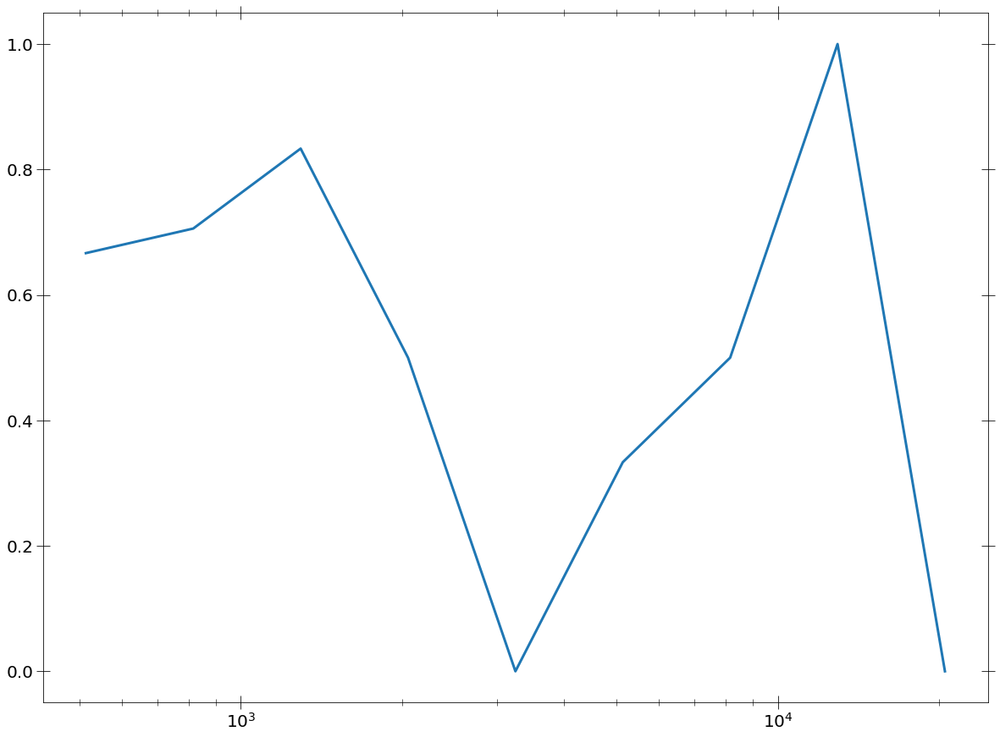

In [451]:
plt.plot(0.5*(bins[1:] + bins[:-1]), candidate_hist/interested_hist)
plt.xscale('log')

In [441]:
len(sim_color_dict_arr[0]['prop_bins'][0])

21

In [452]:
candidate_hist

array([ 0,  0,  0,  0,  0,  0,  0,  0, 12, 12,  5,  1,  0,  1,  1,  3,  0,
        0,  0,  0])

In [453]:
interested_hist

array([ 0,  0,  0,  0,  0,  0,  0,  0, 18, 17,  6,  2,  1,  3,  2,  3,  2,
        0,  0,  0])

In [449]:
bins

array([1.00000000e+01, 1.58489319e+01, 2.51188643e+01, 3.98107171e+01,
       6.30957344e+01, 1.00000000e+02, 1.58489319e+02, 2.51188643e+02,
       3.98107171e+02, 6.30957344e+02, 1.00000000e+03, 1.58489319e+03,
       2.51188643e+03, 3.98107171e+03, 6.30957344e+03, 1.00000000e+04,
       1.58489319e+04, 2.51188643e+04, 3.98107171e+04, 6.30957344e+04,
       1.00000000e+05])

In [454]:
fit_stats_pl_arr = np.array(mos_fit_stats_table_pl)
fit_stats_pl_gauss_arr = np.array(mos_fit_stats_table_pl_g)

aic_pl = fit_stats_pl_arr[:, 1].astype(float) + 6
aic_pl_gauss = fit_stats_pl_gauss_arr[:, 1].astype(float) + 10

candidate_args = interested_args_alldet[1][np.where(aic_pl > aic_pl_gauss)]
candidate_netcounts = spec_summary['counts'][0][1][1][spec_summary['spec_masks'][1][4]][candidate_args]
interested_netcounts = spec_summary['counts'][0][1][1][spec_summary['spec_masks'][1][4]][interested_args_alldet[1]]

candidate_hist, bins = np.histogram(candidate_netcounts, bins=sim_color_dict_arr[1]['prop_bins'][0])
interested_hist, bins = np.histogram(interested_netcounts, bins=sim_color_dict_arr[1]['prop_bins'][0])

IndexError: index 38 is out of bounds for axis 0 with size 38

8:80: E501 line too long (103 > 79 characters)
9:80: E501 line too long (115 > 79 characters)
11:80: E501 line too long (100 > 79 characters)


In [455]:
len(fit_stats_pl_arr)

57

In [456]:
len(mos_fit_stats_table_pl)

57

In [459]:
np.sort(interested_srcs_alldet[0])

array(['201113501010010', '201113501010035', '201113501010066',
       '201113501010154', '201113501010169', '201113503010004',
       '201129701010011', '201129701010015', '201129701010027',
       '201129701010041', '201129702010002', '201129704010011',
       '201129704010019', '201129704010027', '201129705010011',
       '201129705010015', '201129705010038', '201129705010067',
       '201129705010076', '201129705010079', '201129705015062',
       '201129706010014', '201129707010012', '201129707010063',
       '201129707010079', '201129709010024', '201129715010041',
       '201129719010010', '201129721010003', '201129721010009',
       '201129721010014', '201129721010022', '201129721010034',
       '201129721010035', '201129721010044', '201129721010057',
       '201129721010060', '201129721010063', '201129721010070',
       '201129721010078', '201129721010126', '201129721010133',
       '201129721015131', '202026705010034', '202026705010109',
       '202026708010021', '2030321020100

In [460]:
np.sort(interested_srcs_alldet[1])

array(['200305402010002', '201113501010010', '201113501010069',
       '201113501010114', '201113503010004', '201129701010035',
       '201129702010002', '201129704010048', '201129705010011',
       '201129705010014', '201129705010024', '201129705010067',
       '201129705010079', '201129705010095', '201129705015062',
       '201129706010014', '201129707010063', '201129708010036',
       '201129719010010', '201129721010003', '201129721010005',
       '201129721010014', '201129721010022', '201129721010034',
       '201129721010045', '201129721010053', '201129721010057',
       '201129721010060', '201129721010075', '201129721010138',
       '202026705010053', '204105804015018', '206556701010012',
       '206556701010019', '206946404010008', '207641904010001',
       '208016803010001', '208251401010006'], dtype=object)

In [69]:
def get_candidate_src_nums_det2(obs_src_nums, obs_det_mask, sim_color_dict,
                               obs_color_dict, min_counts):
    """Get src nums of quiescent sources for given detector"""
    obs_netcounts = obs_color_dict['prop_list'][0]
    netcount_bins = sim_color_dict['prop_bins'][0]
    obs_colors = obs_color_dict['colors']
    color_median = sim_color_dict['color_stat'][0][0]
    color_std = sim_color_dict['color_stat'][2][0]
    interested_args = []
    interested_srcs = []
    for i, lower_bin in enumerate(netcount_bins):
        if lower_bin < min_counts:
            continue
        if i == len(netcount_bins) - 1:
            upper_bin = np.max(obs_netcounts) + 10
            median_color = color_median[-1]
            std_color = color_std[-1]
        else:
            upper_bin = netcount_bins[i+1]
            median_color = color_median[i]
            std_color = color_std[i]
        if np.isnan(median_color) or np.isnan(std_color):
                    int_args = np.where(np.logical_and(
                        obs_netcounts >= lower_bin,
                        obs_netcounts < upper_bin))
        else:
        
            int_args = np.where(np.logical_and(
                np.logical_and(obs_netcounts >= lower_bin,
                               obs_netcounts < upper_bin),
                obs_colors < median_color + 2*std_color))[0]
        '''
        int_args = np.where(np.logical_and(
                np.logical_and(obs_netcounts >= lower_bin,
                               obs_netcounts < upper_bin),
                obs_colors < median_color + 2*std_color))[0]
        '''
        print(obs_netcounts[int_args])
        interested_args.append(int_args)
        interested_srcs.append(obs_src_nums[obs_det_mask][int_args])
    return interested_args, interested_srcs


def get_candidate_src_nums_alldet2(spec_summary, sim_color_dict_arr,
                                  obs_color_dict_arr, min_count_arr=None):
    """Get source nums for all detectors."""
    interested_args_alldet = []
    interested_sources_alldet = []
    if min_count_arr is None:
        min_count_arr = [700, 700, 250]
    for i, obs_color_dict in enumerate(obs_color_dict_arr):
        if i > 0:
            interested_args, interested_srcs = get_candidate_src_nums_det2(
                spec_summary['src_nums'][i-1], spec_summary['spec_masks'][1][i],
                sim_color_dict_arr[i], obs_color_dict, min_count_arr[i])
        else:
            interested_args, interested_srcs = get_candidate_src_nums_det2(
            spec_summary['src_nums'][i], spec_summary['spec_masks'][1][i],
            sim_color_dict_arr[i], obs_color_dict, min_count_arr[i])
        interested_args_alldet.append(interested_args)
        interested_sources_alldet.append(interested_srcs)
    return interested_args_alldet, interested_sources_alldet


2:32: E128 continuation line under-indented for visual indent
23:21: E117 over-indented
27:1: W293 blank line contains whitespace
45:35: E128 continuation line under-indented for visual indent
54:80: E501 line too long (80 > 79 characters)
58:13: E122 continuation line missing indentation or outdented
59:13: E122 continuation line missing indentation or outdented


In [70]:
test_args, test_srcs = get_candidate_src_nums_alldet2(spec_summary, sim_color_dict_arr, obs_color_dict_arr,
                                                      min_count_arr=[380, 380, 220])

[569.59489915 404.91355624 452.26180445 465.79990524 576.32276827
 493.39928098 487.52737681 463.48454887 513.71340716 539.95700063
 612.30372428 609.93432573 398.9688382  574.42562696 508.04667046
 592.28189506 435.03011623 522.26141993]
[652.69197128 823.33408827 792.69706455 674.18975953 876.79367389
 679.04689138 739.16724045 845.56868658 723.70611642 845.86782834
 764.06300906 648.50489117 711.53733848 864.90478044 817.363117
 923.15858478 648.64365916 797.95791783]
[1536.6024365  1114.66782348 1422.7130562  1291.96679205 1584.24987616
 1222.55308145]
[1989.78879578 2448.29069852]
[3333.91840967]
[5906.66947885 4300.15059039 5076.11064059]
[8272.89976422 7040.72877535]
[10372.3500844  14301.84303534 13285.45941   ]
[23304.51640767 18219.60240603]
[]
[]
[]
[ 736611.79761745  418037.54709113 2024254.48411136]
[608.05064636 440.51106749 493.03633815 438.03845112 598.07676261
 443.31577824 586.65762292 507.54544255 433.71040735 542.88105163
 402.12852783]
[743.55291637 648.44849731 71

1:80: E501 line too long (107 > 79 characters)


In [44]:
test_srcs

[[array(['201113501010066', '201113501010154', '201129701010015',
         '201129704010011', '201129704010019', '201129704010027',
         '201129707010012', '201129707010063', '201129709010024',
         '201129715010041', '201129721010070', '201129721010126',
         '204003401010007', '204105804010005', '206556701010012',
         '208016803010001', '208016813010003', '208251401010006'],
        dtype=object),
  array(['201113501010169', '201129701010011', '201129701010027',
         '201129701010041', '201129704010048', '201129705010015',
         '201129705010038', '201129705010067', '201129705015062',
         '201129721010022', '201129721010035', '201129721010057',
         '201129721010133', '202026705010109', '202026708010021',
         '205547504010092', '206946402010009', '207641904010001'],
        dtype=object),
  array(['201113501010035', '201129707010079', '201129721010063',
         '201129721010078', '201129721015131', '202026705010034'],
        dtype=object),
  ar

In [93]:
def combine_spec_analysis(int_srcs_list, source_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    spec_list = []
    for source_num in int_srcs_list:
        if telescope == 'XMM':
            spec_pnfile = glob2.glob('./Galactic_highNH_combinedXMM/' +
                                     str(source_num) + '_PN_combined_src_grp1*')
            spec_mosfile = glob2.glob('./Galactic_highNH_combinedXMM/' +
                                      str(source_num) + '_MOS_combined_src_grp1*')
            if len(spec_pnfile) > 0:
                spec_pn = xspec.Spectrum(spec_pnfile[0])
                spec_pn.ignore('0.0-2.0, 10.0-**')
                spec_pn.notice('2.0-10.0')
                spec_list.append(spec_pn)
                print(spec_pn.rate[0]*spec_pn.exposure)
            if len(spec_mosfile) > 0:
                spec_mos = xspec.Spectrum(spec_mosfile[0])
                spec_mos.ignore('0.0-2.0, 10.0-**')
                spec_pn.notice('2.0-10.0')
                spec_list.append(spec_mos)
                print(spec_mos.rate[0]*spec_mos.exposure)
        elif telescope == 'Chandra':
            os.chdir(src_folder + '/' + source_num)
            spec_file = str(source_num) + '_combined_src_grp1.pi'
            spec = xspec.Spectrum(spec_file)
            spec.ignore('0.0-2.0, 10.0-**')
            spec.notice('2.0-10.0')
            os.chdir(curr_dir)
        else:
            print('Telescope not recognized.')
    
    model = xspec.Model('tbabs*pegpwrlw')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 5, 5]
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.perform()
    xspec.Fit.error('2.706 2')
    xspec.Fit.perform()
    #goodness = xspec.Fit.goodness(1000)
    goodness = 50.0
    
    xspec.Plot.device = '/xw'
    xspec.Plot.xAxis = 'keV'
    xspec.Plot.yLog = True
    xspec.Plot.setRebin(2, 1000, -1)
    xspec.Plot()
    print('Model params: '
          'NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0])
    print('Fit stats : ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    if telescope == 'Chandra':
        os.chdir(curr_dir)
    return ([int_srcs_list, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [int_srcs_list, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0]])

10:80: E501 line too long (80 > 79 characters)
12:80: E501 line too long (82 > 79 characters)
34:1: W293 blank line contains whitespace
44:5: E265 block comment should start with '# '
46:1: W293 blank line contains whitespace
61:80: E501 line too long (83 > 79 characters)


In [95]:
combine_spec_analysis(test_srcs[0][1])

654.4603630490105
824.1378576545412
716.8100536050601
795.4471140394922
220.3010253394772
673.1919534877306
806.0406733582817
877.330611434544
949.5044931691929
681.247948793877
162.2880763393362
736.751589007554
349.2025802477865
841.2293566233209
680.7494567901176
725.3070590144457
844.6655306385417
845.6103149179244
2153.566380181197
764.2810261818187
642.8417595934877
1078.7955794357108
711.3929357221539
864.5409737688612
113.31528293446061
815.8800274223036
923.4042521844088
74.37753238277094
649.1042695369483
797.4801613279265
586.9997543090454
Model params: NH =  13.231711938962313  Gamma:  0.9200176939172249  norm:  0.1632279364041732
Fit stats :  32184.51283053665 -6.530554835870103 50.0 29932




([array(['201113501010169', '201129701010011', '201129701010027',
         '201129701010041', '201129704010048', '201129705010015',
         '201129705010038', '201129705010067', '201129705015062',
         '201129721010022', '201129721010035', '201129721010057',
         '201129721010133', '202026705010109', '202026708010021',
         '205547504010092', '206946402010009', '207641904010001'],
        dtype=object),
  32184.51283053665,
  -6.530554835870103,
  50.0,
  29932],
 [array(['201113501010169', '201129701010011', '201129701010027',
         '201129701010041', '201129704010048', '201129705010015',
         '201129705010038', '201129705010067', '201129705015062',
         '201129721010022', '201129721010035', '201129721010057',
         '201129721010133', '202026705010109', '202026708010021',
         '205547504010092', '206946402010009', '207641904010001'],
        dtype=object),
  13.231711938962313,
  0.9200176939172249,
  0.1632279364041732])

In [88]:
spec_summary['counts'][0][0][1][spec_summary['spec_masks'][1][0]][test_args[0][0]]

array([569.59489915, 404.91355624, 452.26180445, 465.79990524,
       576.32276827, 493.39928098, 487.52737681, 463.48454887,
       513.71340716, 539.95700063, 612.30372428, 609.93432573,
       398.9688382 , 574.42562696, 508.04667046, 592.28189506,
       435.03011623, 522.26141993])

In [80]:
spec_summary['counts'][0][1][1][spec_summary['spec_masks'][1][0]][test_args[0][0]]

array([  77.06422098,  169.29402981,   80.75597502,  287.22584027,
        117.51882974,  131.66078883,   62.82256871,  493.03633815,
        226.05028649,  204.3105431 ,  115.47278273, -167.7485317 ,
        311.87986676, 1110.11849309,  443.31577824,  507.54544255,
        262.10215037,  433.71040735])

In [99]:
len(interested_srcs_alldet[2])

140

In [28]:
def fit_src_pl_gauss2(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder + 'ip_' +
                                 str(source_num) + '_PN.fak')
        spec_mosfile = glob2.glob(src_folder + 'ip_' +
                                  str(source_num) + '_MOS.fak')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        #os.chdir(src_folder + '/' + source_num)
        spec_file = 'ip_' + str(source_num) + '.fak'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')
    
    model = xspec.Model('tbabs*(pegpwrlw+gauss+gauss+gauss)')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 5, 5]
    model.pegpwrlw.eMin.values = '2.0'
    model.pegpwrlw.eMax.values = '10.0'
    model.gaussian.LineE.values = '6.4 0'
    model.gaussian.Sigma.values = '0.0 0'
    model.gaussian.norm.values = '1.0E-5, 0.001,,,,'
    model.gaussian_4.LineE.values = '6.7 0'
    model.gaussian_4.Sigma.values = '0.0 0'
    model.gaussian_4.norm.values = '1.0E-5, 0.001,,,,'
    model.gaussian_5.LineE.values = '7.0 0'
    model.gaussian_5.Sigma.values = '0.0 0'
    model.gaussian_5.norm.values = '1.0E-5, 0.001,,,,'
    
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.query = 'yes'
    xspec.Fit.perform()
    xspec.Fit.error('2.706 8')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 11')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 14')
    # xspec.Fit.error('2.706 8')
    #goodness = xspec.Fit.goodness(1000)
    goodness = 50.0
    line_norm1_low = xspec.AllModels(1).gaussian.norm.error[0]
    line_norm1_high = xspec.AllModels(1).gaussian.norm.error[1]
    line_norm2_low = xspec.AllModels(1).gaussian_4.norm.error[0]
    line_norm2_high = xspec.AllModels(1).gaussian_4.norm.error[1]
    line_norm3_low = xspec.AllModels(1).gaussian_5.norm.error[0]
    line_norm3_high = xspec.AllModels(1).gaussian_5.norm.error[1]
    print('Model params for ' + str(source_num) +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0],
          ' Fe_norms:', xspec.AllModels(1).gaussian.norm.values[0],
          line_norm1_low, line_norm1_high,
          xspec.AllModels(1).gaussian_4.norm.values[0], line_norm2_low,
          line_norm2_high, xspec.AllModels(1).gaussian_5.norm.values[0],
          line_norm3_low, line_norm3_high)
    print('Fit stats for ' + str(source_num) + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0],
             xspec.AllModels(1).gaussian.norm.values[0],
             xspec.AllModels(1).gaussian_4.norm.values[0],
             xspec.AllModels(1).gaussian_5.norm.values[0], line_norm1_low,
             line_norm1_high, line_norm2_low, line_norm2_high, line_norm3_low,
             line_norm3_high])


20:9: E265 block comment should start with '# '
27:1: W293 blank line contains whitespace
42:1: W293 blank line contains whitespace
54:5: E265 block comment should start with '# '
75:80: E501 line too long (80 > 79 characters)


In [54]:
fit_src_pl_gauss2(int_srcs_subset[0][1])

Model params for 3446: NH =  14.552690406202526  Gamma:  1.359677734406688  norm:  0.8182075702942402  Fe_norms: 2.6671550128134205e-06 1.85426727639056e-06 3.5597159419789584e-06 1.5427283063555282e-06 7.83183450059744e-07 2.3829809558196902e-06 1.075637448949084e-06 3.605618192188106e-07 1.8770986178356812e-06
Fit stats for 3446:  486.03013649431136 -9.657559448190877 50.0 412




([3446, 486.03013649431136, -9.657559448190877, 50.0, 412],
 [3446,
  14.552690406202526,
  1.359677734406688,
  0.8182075702942402,
  2.6671550128134205e-06,
  1.5427283063555282e-06,
  1.075637448949084e-06,
  1.85426727639056e-06,
  3.5597159419789584e-06,
  7.83183450059744e-07,
  2.3829809558196902e-06,
  3.605618192188106e-07,
  1.8770986178356812e-06])

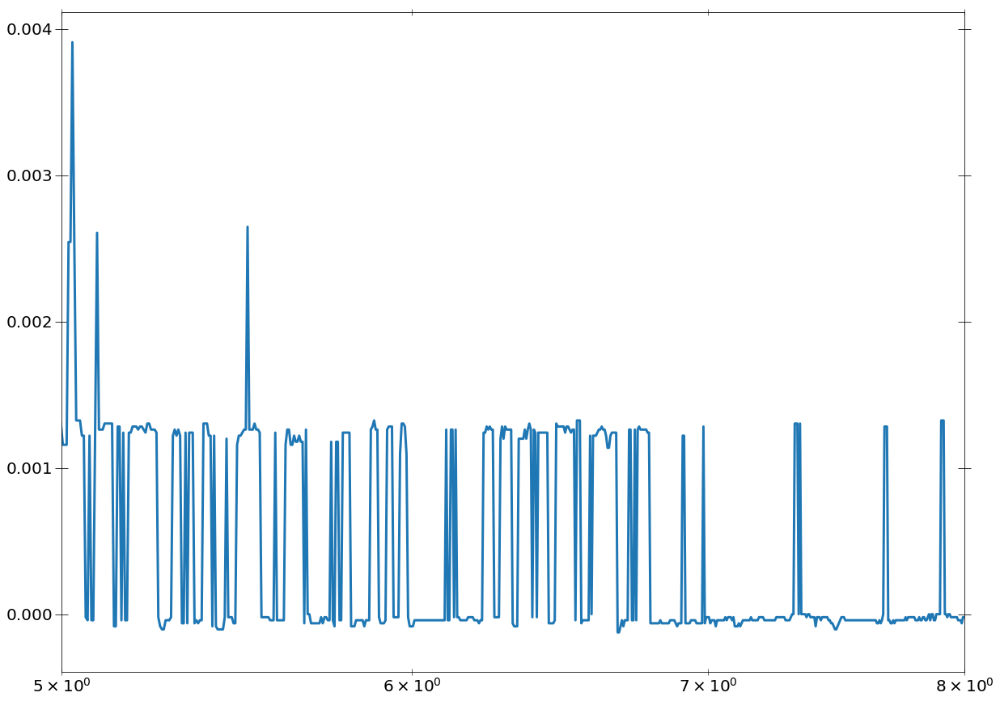

2:80: E501 line too long (130 > 79 characters)


In [62]:
plt.plot(spec_summary['ebins'][1][1][400:2000],
         median_filter(spec_summary['norm_specs'][1][1][spec_summary['spec_masks'][1][1]][interested_args_alldet[1][11]], size=5))
plt.xlim(5.0, 8.0)
plt.xscale('log')

In [67]:
spec_summary['src_nums'][0][spec_summary['spec_masks'][1][1]][interested_args_alldet[1][11]]

'200305402010002'

In [82]:
from astropy.table import Table
from astropy.table.pprint import conf
conf.max_lines = -1
conf.max_width = -1

In [83]:
Table(np.column_stack([np.array(pn_fit_stats_table_pl)[:, 0],
                       np.array(pn_fit_stats_table_pl_g2)[:, 4],
                       np.array(pn_fit_stats_table_pl)[:, 1],
                       np.array(pn_fit_stats_table_pl_g)[:, 1],
                       np.array(pn_fit_stats_table_pl_g2)[:, 1],
                       np.array(pn_model_params_table_pl_g)[:, 4],
                       np.array(pn_model_params_table_pl_g)[:, 7],
                       np.array(pn_model_params_table_pl_g2)[:, 4],
                       np.array(pn_model_params_table_pl_g2)[:, 5],
                       np.array(pn_model_params_table_pl_g2)[:, 6]]))

col0,col1,col2,col3,col4,col5,col6,col7,col8,col9
str32,str32,str32,str32,str32,str32,str32,str32,str32,str32
201113501010066,1097,888.3133866673959,881.7070650294453,881.1913228858143,6.495842098254313,5.728099295853509e-07,4.331544399555877e-07,1.9773822826801004e-07,1.5584199303060894e-07
201113501010154,1149,903.3608054015875,898.9897342154572,894.8121029186211,6.416690600469637,3.657184129034429e-07,3.5010040157522126e-07,4.580896096106657e-20,3.0838833914018393e-07
201129701010015,880,729.9447013450703,726.1680242153152,728.208293235638,6.878504435779244,2.8030459351071563e-07,6.557294646155204e-09,3.952180009005394e-08,1.84901608991034e-07
201129704010011,1194,1012.6079029890961,1002.1164436811466,1000.9736609156014,6.376259261068899,1.038662399360663e-06,7.930982457150612e-07,1.384644000570789e-07,4.940973238026691e-07
201129704010019,1215,1029.8154873905944,1025.8642811120633,1025.0969960585987,6.445404018100875,4.927351161304949e-07,3.2552759609400053e-07,1.0890863712728476e-07,3.7679459927014663e-07
201129704010027,1010,785.9195607248512,779.6130717470733,772.8673731092612,6.914603394912961,9.147377125465467e-07,7.142996249303996e-07,2.7521655807736366e-07,8.885324041183697e-07
201129707010012,682,567.787069467711,553.9318661357931,560.4612703153173,6.280521164961761,1.108564397466515e-06,6.793189563458339e-07,2.4888436958518062e-11,7.328702613575944e-08
201129707010063,2029,1603.580620175288,1603.4019947460515,1603.5633270184708,6.818844746386391,1.7222155963966992e-07,1.3274084432954834e-13,4.1359511318018613e-08,2.1443448180484209e-13
201129709010024,900,811.3262222227015,794.8089768017549,781.4206009405018,6.5481877496665355,9.642184610454263e-07,6.496074113129098e-07,6.07007290264001e-07,4.4822010250036727e-07


In [75]:
np.array(pn_fit_stats_table_pl)

array([['201113501010066', '888.3133866673959', '-8.204968056946765',
        '50.0', '1100'],
       ['201113501010154', '903.3608054015875', '-7.9889327474572935',
        '50.0', '1152'],
       ['201129701010015', '729.9447013450703', '-6.853237332107479',
        '50.0', '883'],
       ['201129704010011', '1012.6079029890961', '-4.516491937423837',
        '50.0', '1197'],
       ['201129704010019', '1029.8154873905944', '-8.696263026204749',
        '50.0', '1218'],
       ['201129704010027', '785.9195607248512', '-7.299622810407817',
        '50.0', '1013'],
       ['201129707010012', '567.787069467711', '-7.714088239148532',
        '50.0', '685'],
       ['201129707010063', '1603.580620175288', '-5.885724150152902',
        '50.0', '2032'],
       ['201129709010024', '811.3262222227015', '-6.198280503456527',
        '50.0', '903'],
       ['201129715010041', '874.5940461384438', '-8.348768445708139',
        '50.0', '1037'],
       ['201129721010070', '1368.7909668927011', '-